# tSNE vs. UMAP: Global Structure Preservation

#### Nikolay Oskolkov, SciLifeLab, NBIS Long Term Support, [nikolay.oskolkov@scilifelab.se](nikolay.oskolkov@scilifelab.se)

<h3><center>Abstract</center></h3>
In this notebook, we will discuss the importance of global structure preservation by the tSNE and UMAP neighbor graph algorithms. we will check to what extent both algorithms can preserve global structure of syntetic and real-world scRNAseq data, as well as discuss where this originates mathematically from.

### Table of Contents:
* [Global Structure Preservation: Why It Is Important](#Global-Structure-Preservation:-Why-It-Is-Important)
* [What Exactly We Mean By Global Structure Preservation](#What-Exactly-We-Mean-By-Global-Structure-Preservation)
* [Making SciKitLearn tSNE Agree with My Implementation of tSNE](#Making-SciKitLearn-tSNE-Agree-with-My-Implementation-of-tSNE)
* [Checking that Sigma from Leland's Implementation of UMAP Agrees with Mine](#Checking-that-Sigma-from-Leland-Implementation-of-UMAP-Agrees-with-Mine)
* [Quantify How Well Dimension Reduction Algorithms Preserve Global Structure](#Quantify-How-Well-Dimension-Reduction-Algorithms-Preserve-Global-Structure)
* [tSNE Degrades to PCA at Large Perplexity](#tSNE-Degrades-to-PCA-at-Large-Perplexity)

### Global Structure Preservation: Why It Is Important  <a class="anchor" id="Global-Structure-Preservation:-Why-It-Is-Important"></a>

If you use tSNE and UMAP only for visulaization of high-dimensional data, you probably have never thought about how much of global structure they can preserve. Indeed, both tSNE and UMAP were designed to predominanlty preserve **local structure** that is to group neigboring data points together which provides very informative visualization.

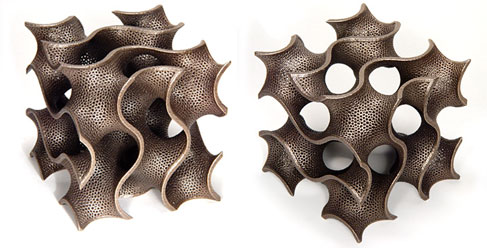

In [177]:
from IPython.display import Image
Image('/home/nikolay/Documents/Medium/tSNE_vs_UMAP/GyroidSculpture.jpg', width=1000)

However, if you want to make a next step beyond visualization and run **clustering** you will have difficulty doing it on the original data due to the **Curse of Dimensionality** and the choice of a proper distance metric, instead clustering on tSNE or UMAP reduced dimensions can be more promising. Below, I use scRNAseq data from [Björklund et al.](https://www.ncbi.nlm.nih.gov/pubmed/26878113) Innate Limphoid Cells (ILC) and compare K-means clustering on 1) raw expression data, 2) significant 30 Principal Components (PCs), 3) tSNE 2D representation, and 4) 30 UMAP components. As we can see, due to the Curse of Dimensionality and non-linearity of the scRNAseq data, K-means clustering failed on the raw expression data and the 30 PCs were apparently also too high-dimensional space for K-means to succeed. In contrast, non-linear dimension reduction down to 2 for tSNE and 30 for UMAP resulted in almost perfect agreement between clustering and tSNE dimension reduction.

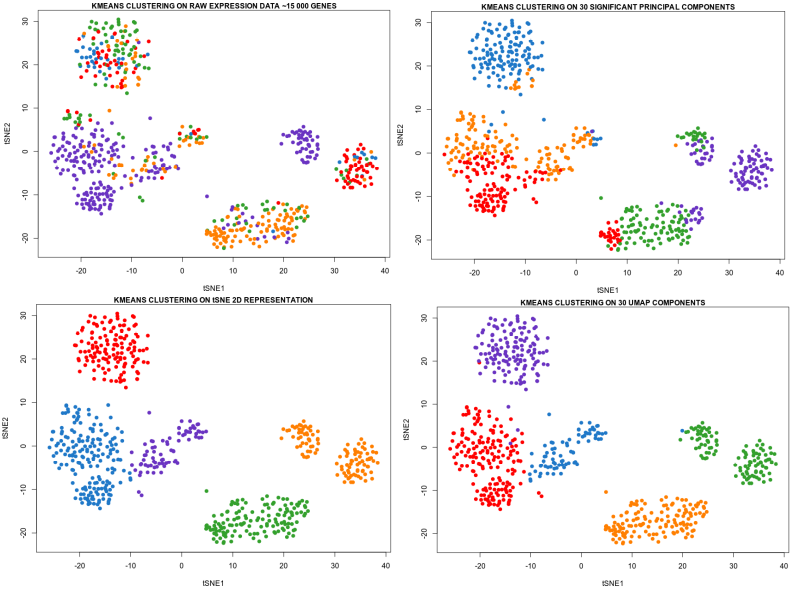

In [3]:
from IPython.display import Image
Image('/home/nikolay/Documents/Medium/tSNE_vs_UMAP/Kmeans_tSNE_SignPCs_RawExpr_UMAPComp.png', width=2000)

However, this is where you really want to make sure that the **tSNE and UMAP components capture enough of global structure in the original data**, that is preserve distance between clusters of data points, in order to obtain a **correct hierarchy** between the data points or clusters of data points that were distant in high dimensions. Although not perfectly correct, in layman's terms one can say that:

* **Local structure preservation is important for visualization**
* **Global structure preservation is important for clustering**

It is widely acknowledged that clustering on 2D tSNE representation is not a good idea because the distances between clusters (global structure) are not guaranteed to be preserved, therefore proximity of two clusters on a tSNE plot does not imply a biological similarity between the two cell populations. Clustering on a 2D UMAP representation may be better idea since UMAP preserves more of a global structure, however this is still to be proven. What we definitely see from the plot above is that clustering on a number of UMAP components outperformes clustering on a number of PCs since **30 UMAP components retain more variation in the data than 30 PCs**. In contrast, **tSNE can not deliver more than 3 components** due to technical limitations, so clustering on a number of tSNE components is basically impossible. So clustering - this is where you start seeing the difference between tSNE and UMAP.

### What Exactly We Mean By Global Structure Preservation  <a class="anchor" id="What-Exactly-We-Mean-By-Global-Structure-Preservation"></a>


Remember that the goal of dimension reduction is to transform the data from high- to low-dimensional space, i.e. represent the cells / samples in low-dimensional space without loosing too much information, i.e. **preserving distances between both close and distant samples / cells**. What exactly do we mean when we say that a dimension reduction algorithm is capable of preserving global structure? Both tSNE and UMAP define the probability to observe points at a certain distance to belong to the following exponential family:

$$p_{ij}\approx \displaystyle e^{\displaystyle -\frac{(x_i-x_j)^2}{2\sigma_i^2}}$$

Here $\sigma_i$ is a parameter responsible for how much cells / samples can "feel" each other. Since $\sigma_i$ is a finite value, i.e. does not go yo infinity, every data point can "feel" the presence only its closest neighbors and not the distant points, therefore both tSNE and UMAP are **neighbor graph** algorithms and hence preserve **local structure** of the data. However, in the limit $\sigma_i \rightarrow \infty$ there is a chance that every point "remembers" every other point, so in this limit **in theory both tSNE and UMAP can preserve global structure**. However, it is not the $\sigma_i$ that the hyperparameter of tSNE and UMAP but the **perplexity** and **number of nearest neigbors n_neigbors**, respectively. Let us check what perplexity and n_neighbors values lead to the limit $\sigma_i \rightarrow \infty$. For this purpose we will take one syntetic and one real-world scRNAseq data sets and compute how mean $\sigma$ depend on the perplexity and n_neighbors.

To check how much PCA / MDS, tSNE and UMAP are capable of preserving global structure, let us contruct a syntetic data set representing the world map with 5 continents: Eurasia, Africa, North America, South America and Australia. We sample a few thousand points from the areas of the continents and will use them for testing the dimension reduction techniques.

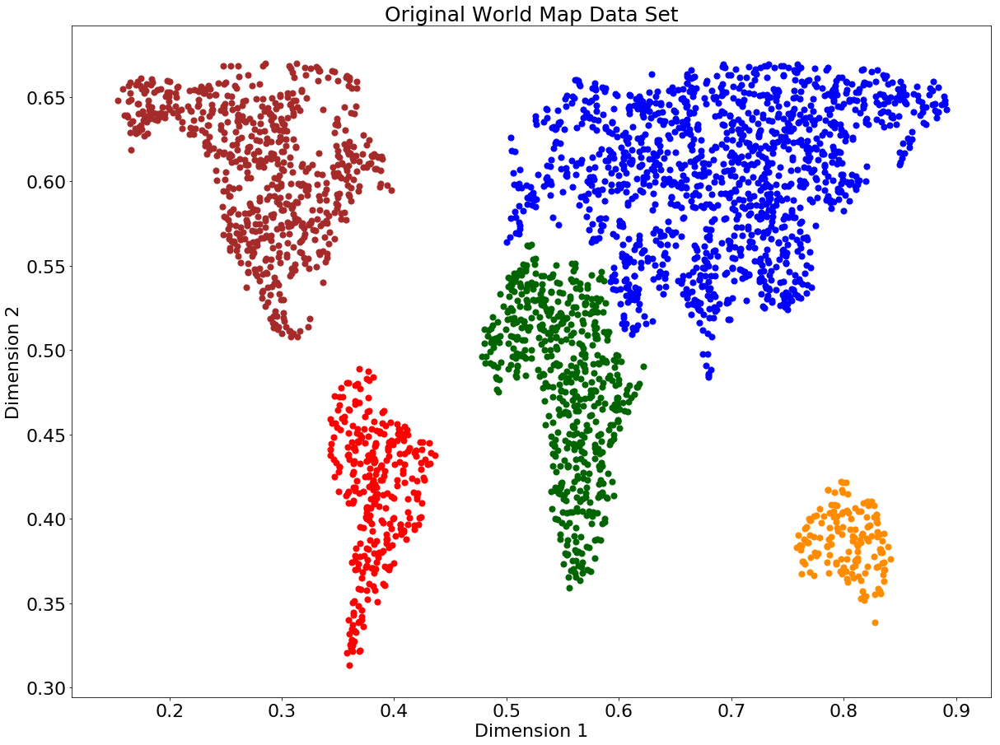

In [3]:
import cartopy
import matplotlib
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from skimage.io import imread
import cartopy.io.shapereader as shpreader

shapename = 'admin_0_countries'
countries_shp = shpreader.natural_earth(resolution='110m',
                                        category='cultural', name=shapename)

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    #print(country.attributes['NAME_LONG'])
    if country.attributes['NAME_LONG'] in ['United States','Canada', 'Mexico']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('NorthAmerica.png')
plt.close()
        
plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Brazil','Argentina', 'Peru', 'Uruguay', 'Venezuela', 
                                           'Columbia', 'Bolivia', 'Colombia', 'Ecuador', 'Paraguay']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('SouthAmerica.png')
plt.close()

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Australia']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Australia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Russian Federation', 'China', 'India', 'Kazakhstan', 'Mongolia', 
                                          'France', 'Germany', 'Spain', 'Ukraine', 'Turkey', 'Sweden', 
                                           'Finland', 'Denmark', 'Greece', 'Poland', 'Belarus', 'Norway', 
                                           'Italy', 'Iran', 'Pakistan', 'Afganistan', 'Iraq', 'Bulgaria', 
                                           'Romania', 'Turkmenistan', 'Uzbekistan' 'Austria', 'Ireland', 
                                           'United Kingdom', 'Saudi Arabia', 'Hungary']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Eurasia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Libya', 'Algeria', 'Niger', 'Marocco', 'Egypt', 'Sudan', 'Chad',
                                           'Democratic Republic of the Congo', 'Somalia', 'Kenya', 'Ethiopia', 
                                           'The Gambia', 'Nigeria', 'Cameroon', 'Ghana', 'Guinea', 'Guinea-Bissau',
                                           'Liberia', 'Sierra Leone', 'Burkina Faso', 'Central African Republic', 
                                           'Republic of the Congo', 'Gabon', 'Equatorial Guinea', 'Zambia', 
                                           'Malawi', 'Mozambique', 'Angola', 'Burundi', 'South Africa', 
                                           'South Sudan', 'Somaliland', 'Uganda', 'Rwanda', 'Zimbabwe', 'Tanzania',
                                           'Botswana', 'Namibia', 'Senegal', 'Mali', 'Mauritania', 'Benin', 
                                           'Nigeria', 'Cameroon']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Africa.png')
plt.close()


rng = np.random.RandomState(123)
plt.figure(figsize = (20, 15))
matplotlib.rcParams.update({'font.size': 22})


N_NorthAmerica = 10000
data_NorthAmerica = imread('NorthAmerica.png')[::-1, :, 0].T
X_NorthAmerica = rng.rand(4 * N_NorthAmerica, 2)
i, j = (X_NorthAmerica * data_NorthAmerica.shape).astype(int).T
X_NorthAmerica = X_NorthAmerica[data_NorthAmerica[i, j] < 1]
X_NorthAmerica = X_NorthAmerica[X_NorthAmerica[:, 1]<0.67]
y_NorthAmerica = np.array(['brown']*X_NorthAmerica.shape[0])
plt.scatter(X_NorthAmerica[:, 0], X_NorthAmerica[:, 1], c = 'brown', s = 50)

N_SouthAmerica = 10000
data_SouthAmerica = imread('SouthAmerica.png')[::-1, :, 0].T
X_SouthAmerica = rng.rand(4 * N_SouthAmerica, 2)
i, j = (X_SouthAmerica * data_SouthAmerica.shape).astype(int).T
X_SouthAmerica = X_SouthAmerica[data_SouthAmerica[i, j] < 1]
y_SouthAmerica = np.array(['red']*X_SouthAmerica.shape[0])
plt.scatter(X_SouthAmerica[:, 0], X_SouthAmerica[:, 1], c = 'red', s = 50)

N_Australia = 10000
data_Australia = imread('Australia.png')[::-1, :, 0].T
X_Australia = rng.rand(4 * N_Australia, 2)
i, j = (X_Australia * data_Australia.shape).astype(int).T
X_Australia = X_Australia[data_Australia[i, j] < 1]
y_Australia = np.array(['darkorange']*X_Australia.shape[0])
plt.scatter(X_Australia[:, 0], X_Australia[:, 1], c = 'darkorange', s = 50)

N_Eurasia = 10000
data_Eurasia = imread('Eurasia.png')[::-1, :, 0].T
X_Eurasia = rng.rand(4 * N_Eurasia, 2)
i, j = (X_Eurasia * data_Eurasia.shape).astype(int).T
X_Eurasia = X_Eurasia[data_Eurasia[i, j] < 1]
X_Eurasia = X_Eurasia[X_Eurasia[:, 0]>0.5]
X_Eurasia = X_Eurasia[X_Eurasia[:, 1]<0.67]
y_Eurasia = np.array(['blue']*X_Eurasia.shape[0])
plt.scatter(X_Eurasia[:, 0], X_Eurasia[:, 1], c = 'blue', s = 50)

N_Africa = 10000
data_Africa = imread('Africa.png')[::-1, :, 0].T
X_Africa = rng.rand(4 * N_Africa, 2)
i, j = (X_Africa * data_Africa.shape).astype(int).T
X_Africa = X_Africa[data_Africa[i, j] < 1]
y_Africa = np.array(['darkgreen']*X_Africa.shape[0])
plt.scatter(X_Africa[:, 0], X_Africa[:, 1], c = 'darkgreen', s = 50)

plt.title('Original World Map Data Set', fontsize = 25)
plt.xlabel('Dimension 1', fontsize = 22); plt.ylabel('Dimension 2', fontsize = 22)

plt.show()

As a result we have a collection of 2D data points belonging to 5 clusters / continents. So far this is planar linear geometry, therefore linear dimensionality reduction techniques should be able to reconstruct the original data.

In [4]:
X = np.vstack((X_NorthAmerica, X_SouthAmerica, X_Australia, X_Eurasia, X_Africa))
y = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa))
print(X.shape)
print(y.shape)

(3023, 2)
(3023,)


We will start with linear dimensiona reduction techniques: PCA and MDS that can perfectly preserve global distances.

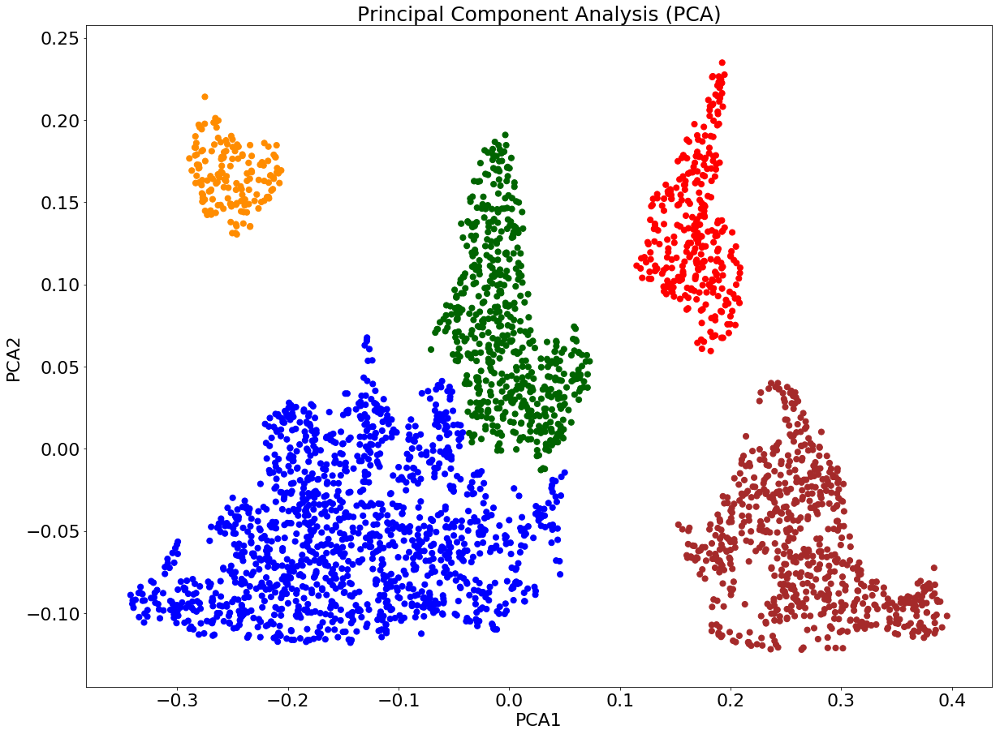

In [5]:
from sklearn.decomposition import PCA
X_reduced = PCA(n_components = 2).fit_transform(X)
plt.figure(figsize=(20,15))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c = y, s = 50)
plt.title('Principal Component Analysis (PCA)', fontsize = 25)
plt.xlabel("PCA1", fontsize = 22)
plt.ylabel("PCA2", fontsize = 22)
plt.show()

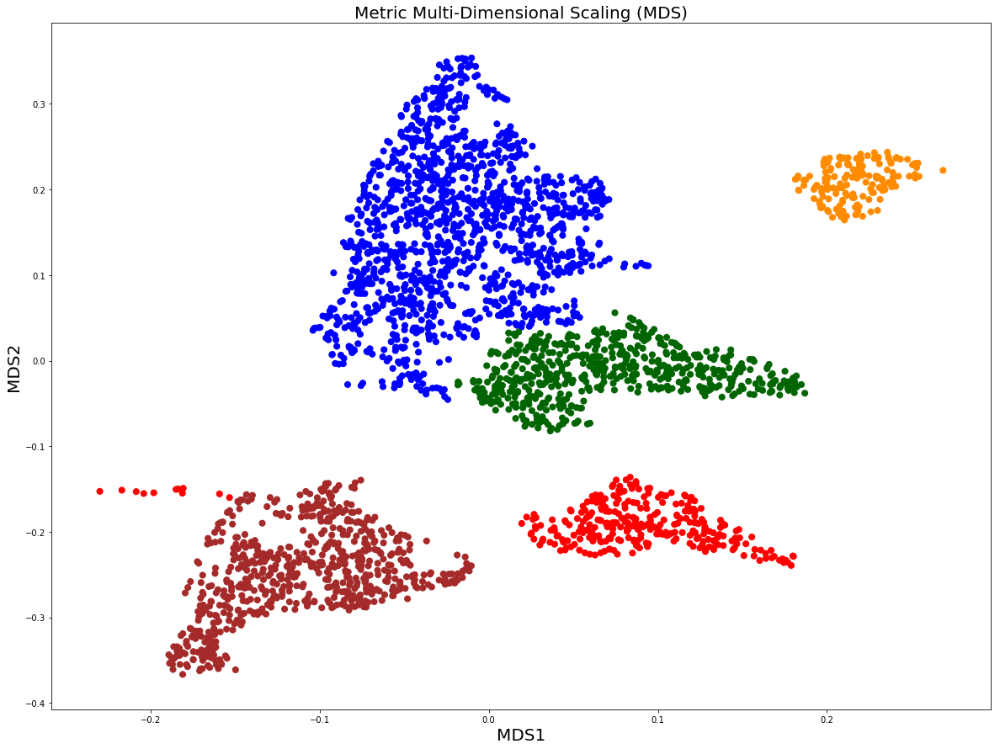

In [127]:
from sklearn.manifold import MDS
model_mds = MDS(n_components = 2, random_state = 123, metric = True)
mmds = model_mds.fit_transform(X)
plt.figure(figsize=(20,15))
plt.scatter(mmds[:, 0], mmds[:, 1], c = y, s = 50)
plt.title('Metric Multi-Dimensional Scaling (MDS)', fontsize = 20)
plt.xlabel("MDS1", fontsize = 20); plt.ylabel("MDS2", fontsize = 20)
plt.show()

We confirm that up to linear transformations such as flip, shift and rotation, the original data set is very well reconstructed by the PCA and MDS linear dimension reduction techniques. Let us now check how non-linear dimensiona reduction techniques such as tSNE and UMAP perform on the 2D linear data. We deliberately select large perplexity and n_neighbors hyperparameters that should result in $\sigma_i \rightarrow \infty$ and therefore better preservation of the global structure.

[t-SNE] Computing 1501 nearest neighbors...
[t-SNE] Indexed 3023 samples in 0.001s...
[t-SNE] Computed neighbors for 3023 samples in 0.674s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3023
[t-SNE] Computed conditional probabilities for sample 2000 / 3023
[t-SNE] Computed conditional probabilities for sample 3000 / 3023
[t-SNE] Computed conditional probabilities for sample 3023 / 3023
[t-SNE] Mean sigma: 0.060978
[t-SNE] Computed conditional probabilities in 2.641s
[t-SNE] Iteration 50: error = 43.8401680, gradient norm = 0.0025554 (50 iterations in 2.953s)
[t-SNE] Iteration 100: error = 43.6828728, gradient norm = 0.0001747 (50 iterations in 2.801s)
[t-SNE] Iteration 150: error = 43.6869354, gradient norm = 0.0002149 (50 iterations in 2.696s)
[t-SNE] Iteration 200: error = 43.6884346, gradient norm = 0.0004383 (50 iterations in 2.573s)
[t-SNE] Iteration 250: error = 43.6885376, gradient norm = 0.0001415 (50 iterations in 2.606s)
[t-SNE] KL divergence after 250 itera

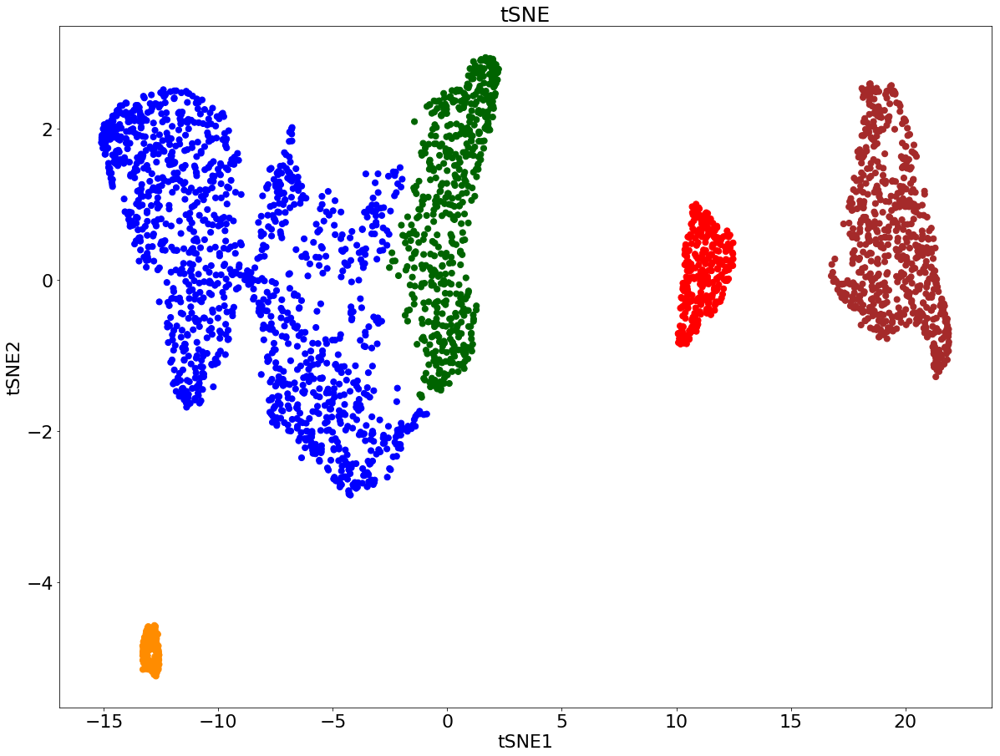

In [6]:
from sklearn.manifold import TSNE
X_reduced = PCA(n_components = 2).fit_transform(X)
model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = 500, 
             init = X_reduced, n_iter = 1000, verbose = 2)
tsne = model.fit_transform(X)
plt.figure(figsize = (20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE', fontsize = 25); plt.xlabel("tSNE1", fontsize = 22); plt.ylabel("tSNE2", fontsize = 22)
plt.show()

UMAP(a=None, angular_rp_forest=False, b=None,
     init=array([[ 0.25580736, -0.08346226],
       [ 0.21164187, -0.0044089 ],
       [ 0.25814581,  0.02748583],
       ...,
       [-0.04541859,  0.06084731],
       [ 0.03837112,  0.01024752],
       [-0.01219052,  0.02886706]]),
     learning_rate=1, local_connectivity=1.0, metric='euclidean',
     metric_kwds=None, min_dist=1, n_components=2, n_epochs=1000,
     n_neighbors=500, negative_sample_rate=5, random_state=None,
     repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
     target_metric='categorical', target_metric_kwds=None,
     target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
     transform_seed=42, verbose=2)
Construct fuzzy simplicial set
Tue Mar  3 17:49:18 2020 Finding Nearest Neighbors
Tue Mar  3 17:49:18 2020 Finished Nearest Neighbor Search
Tue Mar  3 17:49:21 2020 Construct embedding
	completed  0  /  1000 epochs
	completed  100  /  1000 epochs
	completed  200  /  1000 epochs
	completed  30

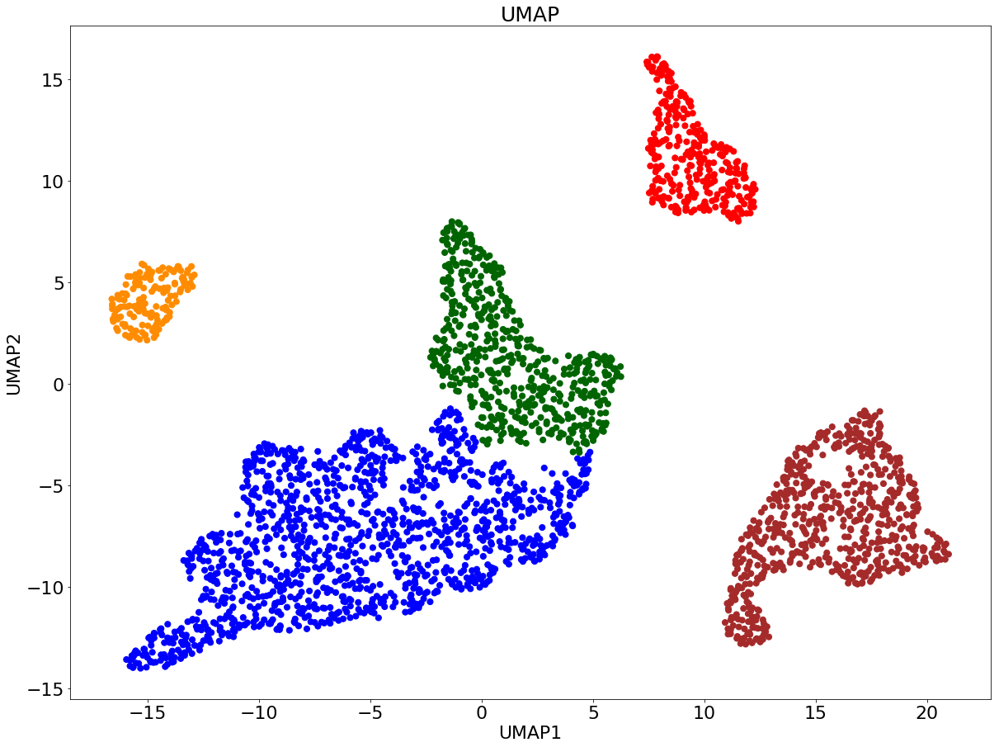

In [7]:
import warnings
warnings.filterwarnings("ignore")

from umap import UMAP
X_reduced = PCA(n_components = 2).fit_transform(X)
model = UMAP(learning_rate = 1, n_components = 2, min_dist = 1, n_neighbors = 500, 
             init = X_reduced, n_epochs = 1000, verbose = 2)
umap = model.fit_transform(X)
plt.figure(figsize=(20,15))
plt.scatter(umap[:, 0], umap[:, 1], c = y, s = 50)
plt.title('UMAP', fontsize = 25); plt.xlabel("UMAP1", fontsize = 22); plt.ylabel("UMAP2", fontsize = 22)
plt.show()

The quality of visualizations are comparable between tSNE and UMAP in a sense that all the 5 clusters / continents are well distinguishable. However, we can see that the original shapes of the continents are a bit better preserved by UMAP. In addition the South America seems to be placed between Africa and North America by tSNE while it is correctly placed on the same longitude as North America by UMAP.

Previously, it was a 2D data point collection on the linear planar surface. Let us now embedd the 2D data points into the 3D non-linear manifold such as **swiss roll**. Swill roll represents a kind of Archimedean spiral in a 3D space.

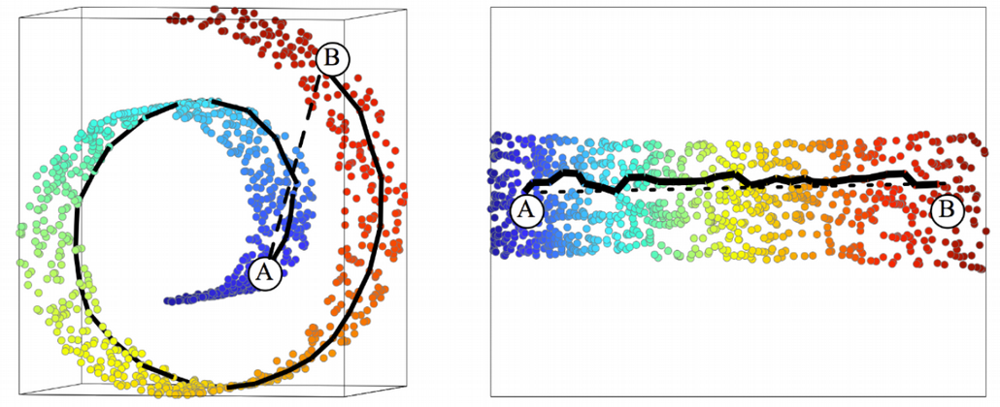

In [70]:
from IPython.display import Image
Image('/home/nikolay/Documents/Medium/tSNE_vs_UMAP/SwissRoll.png', width=2000)

When we project our 2D world map onto 3D non-linear manifold, the intrinsic dimensionality of the data is still two even though they points are embedded into 3D space. Therefore linear dimension reduction techniques usually fail reconstructing data on a non-linear manifold as they try to preserve distances between all pairs of points including the ones that are not neighboring on a manifold. Let's project the world map onto the swiss roll. 

In [9]:
z_3d = X[:, 1]
x_3d = X[:, 0] * np.cos(X[:, 0]*10)
y_3d = X[:, 0] * np.sin(X[:, 0]*10)

X_swiss_roll = np.array([x_3d, y_3d, z_3d]).T
X_swiss_roll.shape

(3023, 3)

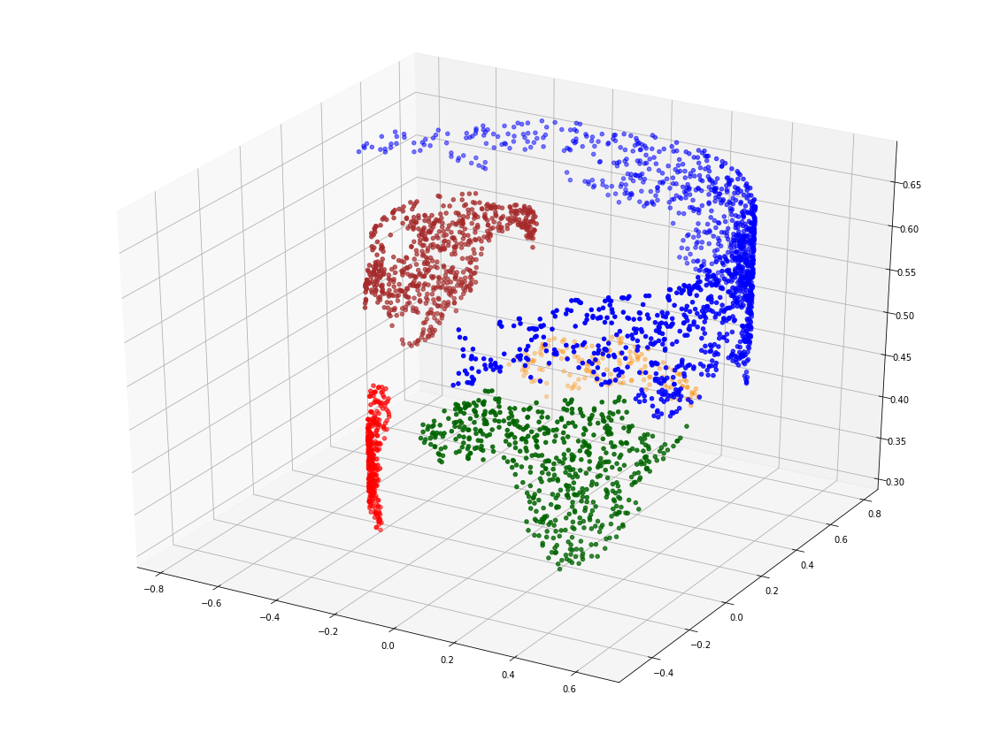

In [53]:
from mpl_toolkits import mplot3d
plt.figure(figsize=(20,15))
ax = plt.axes(projection = '3d')
ax.scatter3D(X_swiss_roll[:, 0], X_swiss_roll[:, 1], X_swiss_roll[:, 2], c = y)
plt.show()

First we will check how linear dimension reduction such as PCA and MDS perform on the swiss roll.

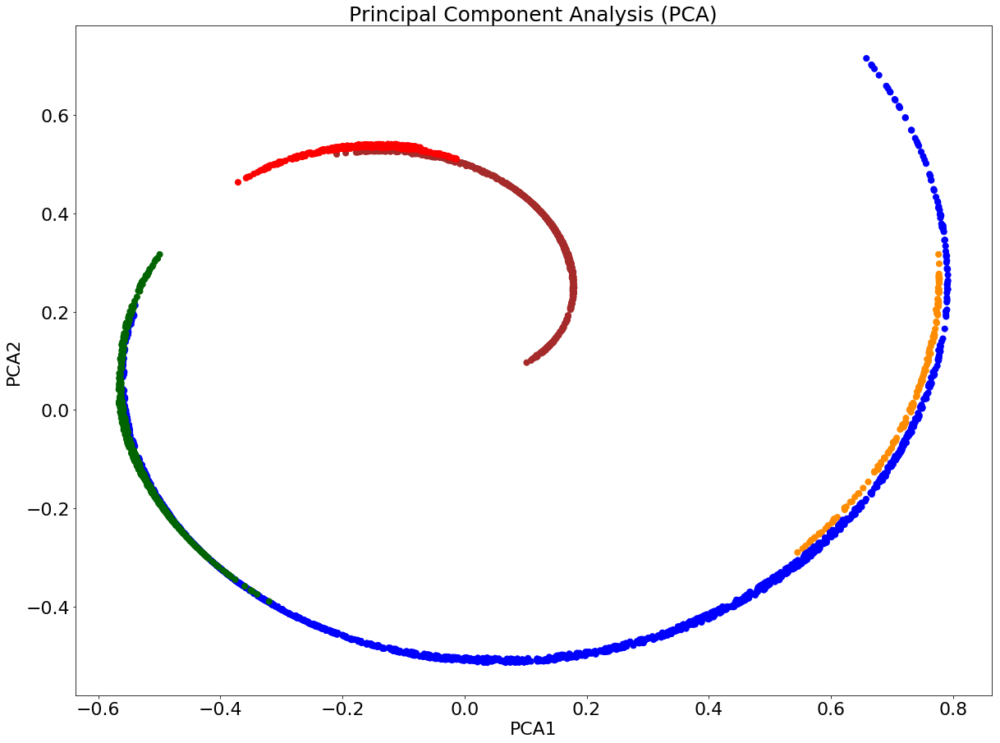

In [10]:
from sklearn.decomposition import PCA
X_swiss_roll_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
plt.figure(figsize=(20,15))
plt.scatter(X_swiss_roll_reduced[:, 0], X_swiss_roll_reduced[:, 1], c = y, s = 50)
plt.title('Principal Component Analysis (PCA)', fontsize = 25)
plt.xlabel("PCA1", fontsize = 22); plt.ylabel("PCA2", fontsize = 22)
plt.show()

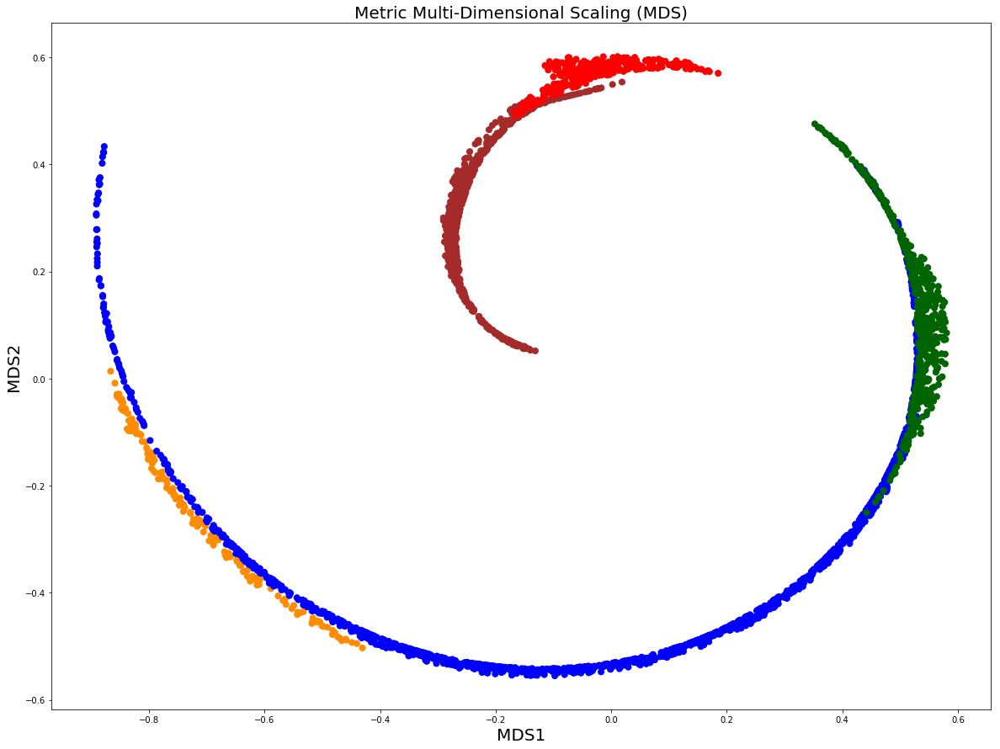

In [69]:
from sklearn.manifold import MDS
model_mds = MDS(n_components = 2, random_state = 123, metric = True)
mds = model_mds.fit_transform(X_swiss_roll)
plt.figure(figsize=(20,15))
plt.scatter(mds[:, 0], mds[:, 1], c = y, s = 50)
plt.title('Metric Multi-Dimensional Scaling (MDS)', fontsize = 20)
plt.xlabel("MDS1", fontsize = 20); plt.ylabel("MDS2", fontsize = 20)
plt.show()

As expected both PCA nd MDS fail reconstructing the original data since they try to preserve global distances while for swiss roll it is more important to preserve local neighborhood. Let us now see whether tSNE and UMAP can do it better. Note that **for both tSNE and UMAP we start with PCA as initialization** for the gradient descent algorithm.

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 3023 samples in 0.003s...
[t-SNE] Computed neighbors for 3023 samples in 0.140s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3023
[t-SNE] Computed conditional probabilities for sample 2000 / 3023
[t-SNE] Computed conditional probabilities for sample 3000 / 3023
[t-SNE] Computed conditional probabilities for sample 3023 / 3023
[t-SNE] Mean sigma: 0.033405
[t-SNE] Computed conditional probabilities in 0.297s
[t-SNE] Iteration 50: error = 56.7442093, gradient norm = 0.0189936 (50 iterations in 0.606s)
[t-SNE] Iteration 100: error = 54.1754074, gradient norm = 0.0130908 (50 iterations in 0.621s)
[t-SNE] Iteration 150: error = 53.1689682, gradient norm = 0.0095972 (50 iterations in 0.603s)
[t-SNE] Iteration 200: error = 52.6251984, gradient norm = 0.0104257 (50 iterations in 0.585s)
[t-SNE] Iteration 250: error = 52.2827072, gradient norm = 0.0080654 (50 iterations in 0.583s)
[t-SNE] KL divergence after 250 iterat

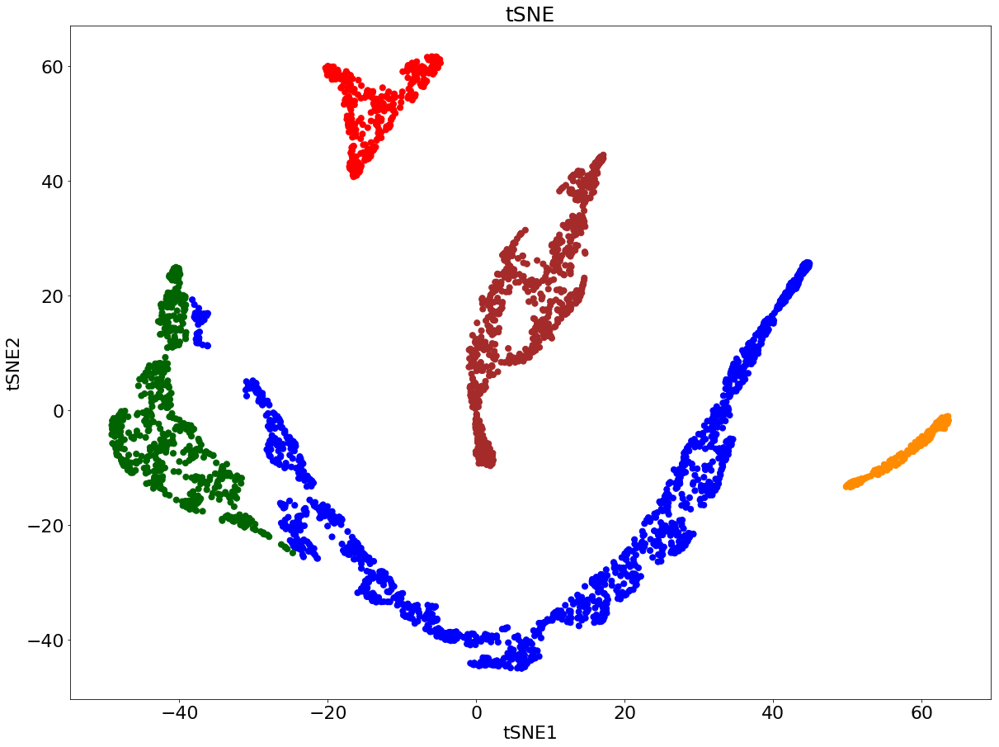

In [11]:
from sklearn.manifold import TSNE
X_swiss_roll_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = 50, 
             init = X_swiss_roll_reduced, n_iter = 1000, verbose = 2)
tsne = model.fit_transform(X_swiss_roll)
plt.figure(figsize=(20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE', fontsize = 25); plt.xlabel("tSNE1", fontsize = 22); plt.ylabel("tSNE2", fontsize = 22)
plt.show()

UMAP(a=None, angular_rp_forest=False, b=None,
     init=array([[ 0.12535979,  0.40356518],
       [ 0.00599581,  0.49934623],
       [ 0.12201155,  0.40671414],
       ...,
       [-0.43454162, -0.28447539],
       [-0.55506668,  0.15485573],
       [-0.53099092, -0.11675039]]),
     learning_rate=1, local_connectivity=1.0, metric='euclidean',
     metric_kwds=None, min_dist=1, n_components=2, n_epochs=1000,
     n_neighbors=50, negative_sample_rate=5, random_state=None,
     repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
     target_metric='categorical', target_metric_kwds=None,
     target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
     transform_seed=42, verbose=2)
Construct fuzzy simplicial set
Tue Mar  3 22:15:22 2020 Finding Nearest Neighbors
Tue Mar  3 22:15:23 2020 Finished Nearest Neighbor Search
Tue Mar  3 22:15:23 2020 Construct embedding
	completed  0  /  1000 epochs
	completed  100  /  1000 epochs
	completed  200  /  1000 epochs
	completed  300

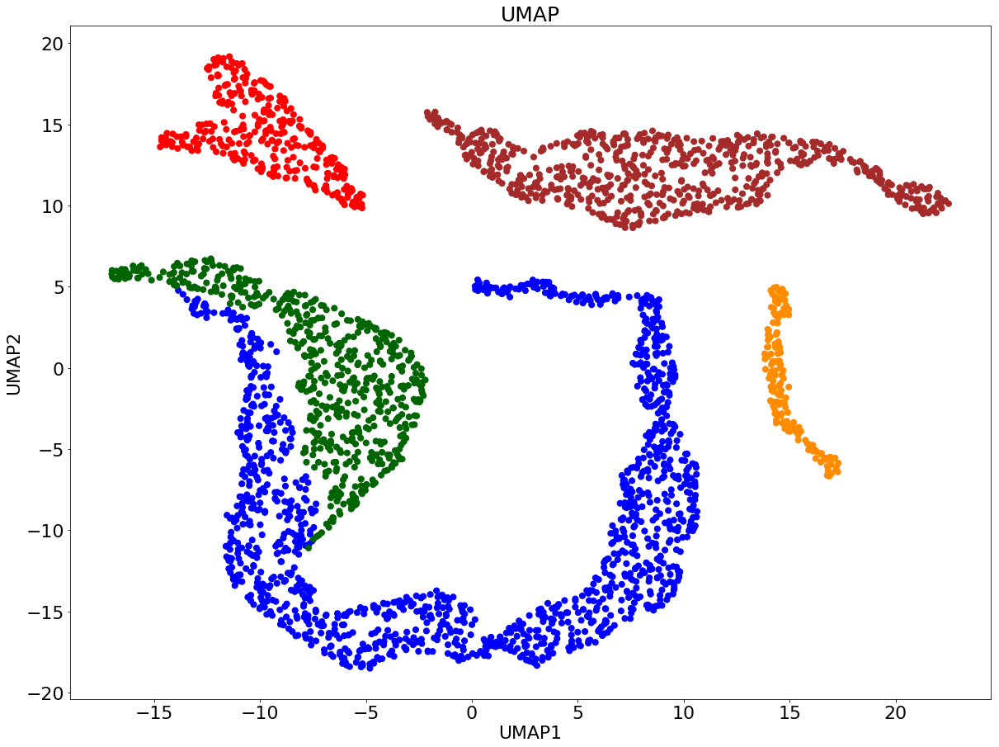

In [12]:
import warnings
warnings.filterwarnings("ignore")

from umap import UMAP
X_swiss_roll_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
model = UMAP(learning_rate = 1, n_components = 2, min_dist = 1, n_neighbors = 50, 
             init = X_swiss_roll_reduced, n_epochs = 1000, verbose = 2)
umap = model.fit_transform(X_swiss_roll)
plt.figure(figsize=(20,15))
plt.scatter(umap[:, 0], umap[:, 1], c = y, s = 50)
plt.title('UMAP', fontsize = 25); plt.xlabel("UMAP1", fontsize = 22); plt.ylabel("UMAP2", fontsize = 22)
plt.show()

A very obvious bug of tSNE that we immediately see is that if one follows the line from South America towards Africa, one passes **Eurasia that was placed by tSNE for some reason between South America and Africa**. In contrast, **UMAP correctly places Africa between South America and Eurasia**.

Obviously, both tSNE and UMAP reconstructed the the original world map better than the PCA and MDS. This is because linear methods such as **PCA and MDS get full affinity matrix as input and try to preserve distances between all pairs of points** while non-linear neigbor graph methods such as **tSNE / UMAP and Locally Linear Embedding (LLE) get sparse affinity matrix (KNN-graph) as input and preserve only distances between nearest neighbors**.

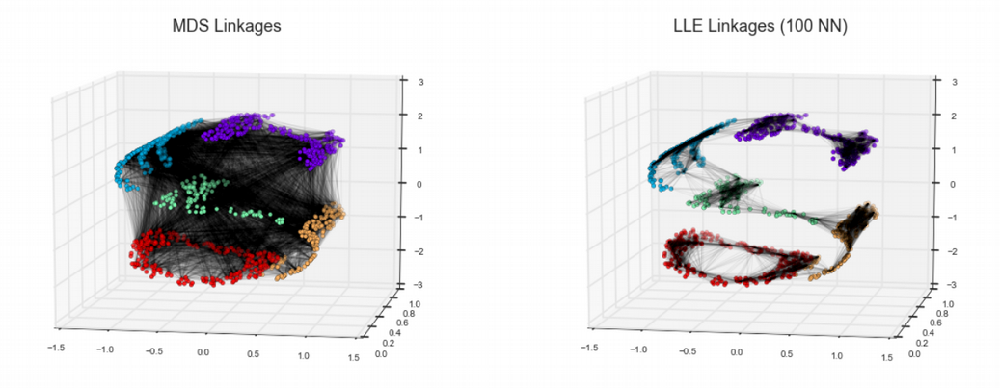

In [87]:
from IPython.display import Image
Image('/home/nikolay/Documents/Medium/tSNE_vs_UMAP/MDS_vs_LLE.png', width=2000)

The quality of both tSNE and UMAP visualizations are comparable, although we used quite different hyperparameters to reach this similarity in the outcome. We used **large learning rate 200 (default 200) and quite a low perplexity 50 (default 30) for tSNE**, while we used **small learning rate 1 (default 1) and large number of nearest neighbors n_neighbor = 500 (default 15) for UMAP**. These are very important hyperparameters as they determine contributions from initialization and cost function to the final embeddings. From [coding tSNE and UMAP from scratch](https://towardsdatascience.com/how-to-program-umap-from-scratch-e6eff67f55fe) it becomes clear that there are two major contributions to the global structure preservation when we run the gradient descent algorithm updating embeddings according to

$$y_i = y_i -\mu \frac{\partial \rm{Cost}}{\partial y_i}$$

We see that the final embedding will depend on:

* **initialization (we start wtih random, PCA or Laplacian Eigenmaps coordinates)** 
* **internal algorithmic peculiarities that boil down to the cost function, that is Kullback-Leibler (KL) divergence for tSNE and Cross-Entropy (CE) for UMAP**

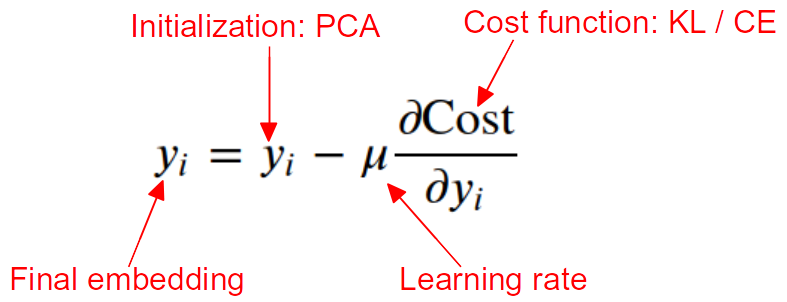

In [71]:
from IPython.display import Image
Image('/home/nikolay/Documents/Medium/tSNE_vs_UMAP/GradDesc.png', width=2000)

We are going to compare the two algorithms for their global structure preservation on the world map syntetic data set. People with biological background tend to ignore this approach and prefer to immediately jump to the real-world noisy biological data. However, these simple data sets allow to learn something fundamental about the algorithms, so here we will use more of the good old physics approach.

When we were running PCA / MDS and tSNE / UMAP on 2D linear and 3D non-linear data, we came to opposite conclusions: 

* **PCA / MDS perfectly reconstructed the 2D linear data set while performance of tSNE / UMAP was tolarable but worse than PCA /MDS**
* **PCA / MDS totally failed reconstructing 3D non-linear data while performance of tSNE / UMAP was much better**

Running tSNE and UMAP we started with PCA as an initialization. Therefore any difference in the final output can be only explained by the term with the cost function $\displaystyle \mu \frac{\partial \rm{Cost}}{\partial y_i}$. Let us compute how this term behaves for the world map syntetic data set. For this purpose we need to understand the dependence between perplexity and $\sigma$ parameter in the denominator of the power of the exponential probability to observe points at a certain distance

$$p_{ij}\approx \displaystyle e^{\displaystyle -\frac{(x_i-x_j)^2}{2\sigma_i^2}}$$

Here we are going to compute the function $\sigma(Perplexity)$ for the world map syntetic data set.

                1110020A21Rik  1110046J04Rik  1190002F15Rik  1500015A07Rik
SS2_15_0048_A3            0.0            0.0            0.0            0.0
SS2_15_0048_A6            0.0            0.0            0.0            0.0
SS2_15_0048_A5            0.0            0.0            0.0            0.0
SS2_15_0048_A4            0.0            0.0            0.0            0.0

This data set contains 716 samples

Dimensions of the  data set: 
(716, 557) (716,)


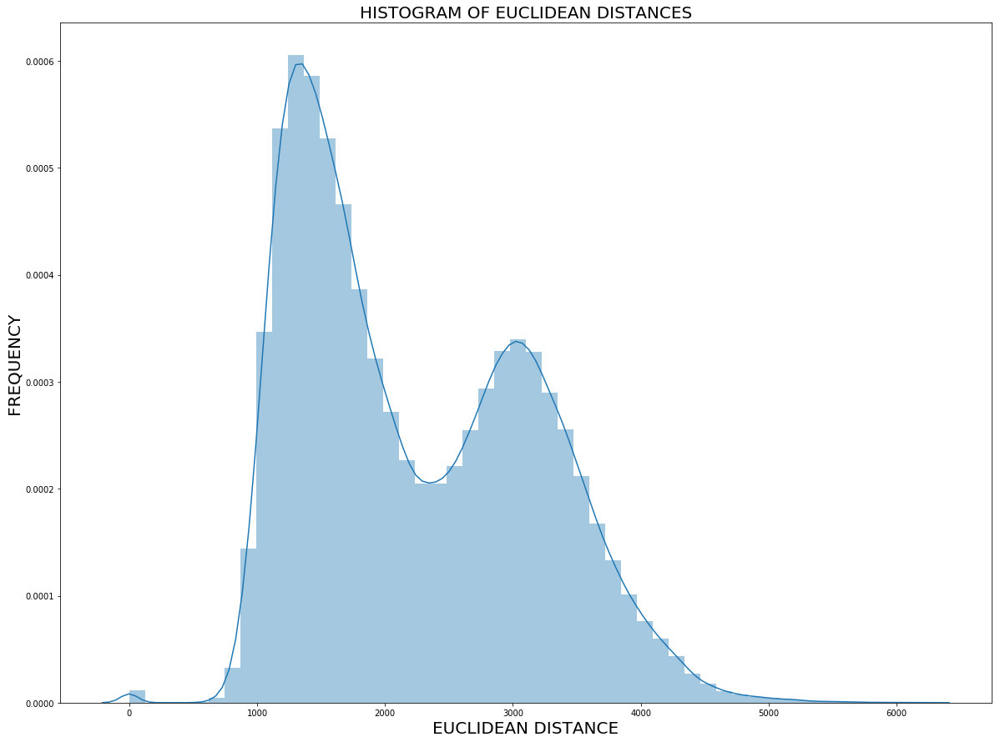

Perplexity = 3, Mean Sigma = 3.92004231500892
Perplexity = 13, Mean Sigma = 5.520980451360095
Perplexity = 23, Mean Sigma = 6.091983624676752
Perplexity = 33, Mean Sigma = 6.481132027823166
Perplexity = 43, Mean Sigma = 6.794533916025855
Perplexity = 53, Mean Sigma = 7.0666387760439395
Perplexity = 63, Mean Sigma = 7.312361754518648
Perplexity = 73, Mean Sigma = 7.539448125402354
Perplexity = 83, Mean Sigma = 7.751667299750131
Perplexity = 93, Mean Sigma = 7.95146206903724
Perplexity = 103, Mean Sigma = 8.140649209475384
Perplexity = 113, Mean Sigma = 8.320984227697277
Perplexity = 123, Mean Sigma = 8.493982879809161
Perplexity = 133, Mean Sigma = 8.661166249706758
Perplexity = 143, Mean Sigma = 8.823815670759318
Perplexity = 153, Mean Sigma = 8.982999364757005
Perplexity = 163, Mean Sigma = 9.139716292226781
Perplexity = 173, Mean Sigma = 9.29464441437961
Perplexity = 183, Mean Sigma = 9.448621526110772
Perplexity = 193, Mean Sigma = 9.602192393894303
Perplexity = 203, Mean Sigma = 9.

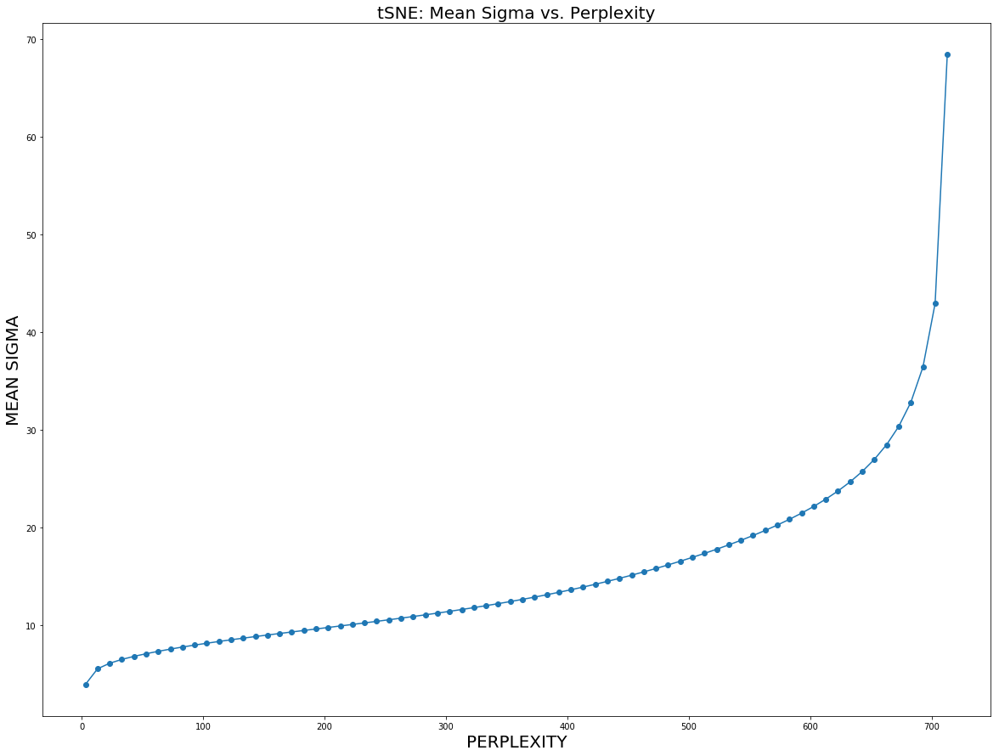

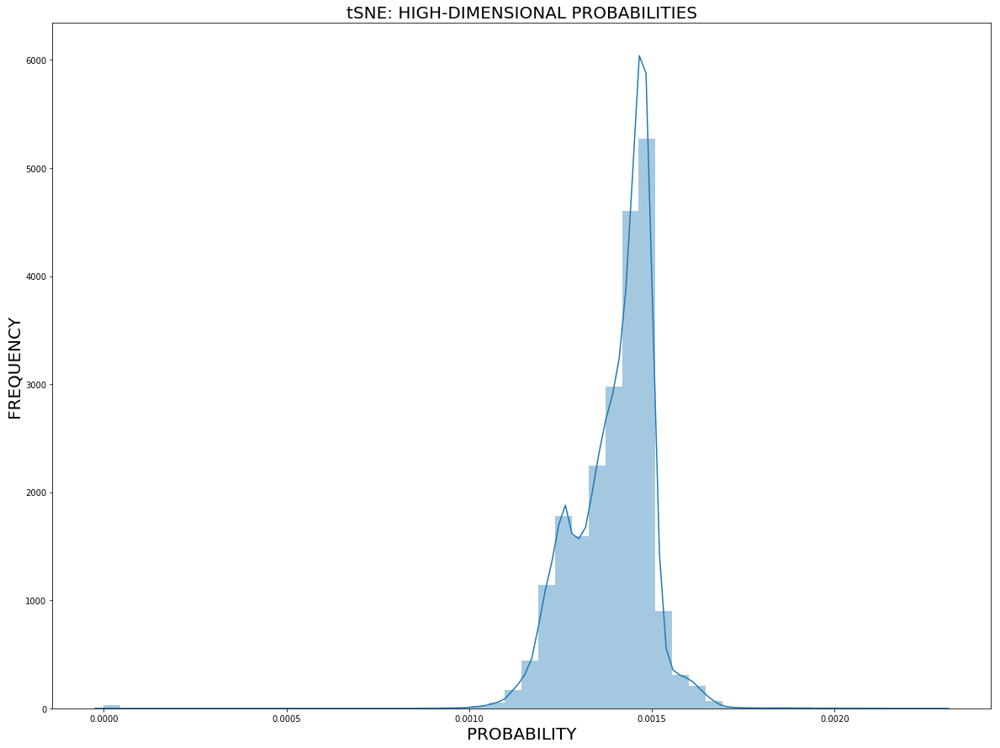

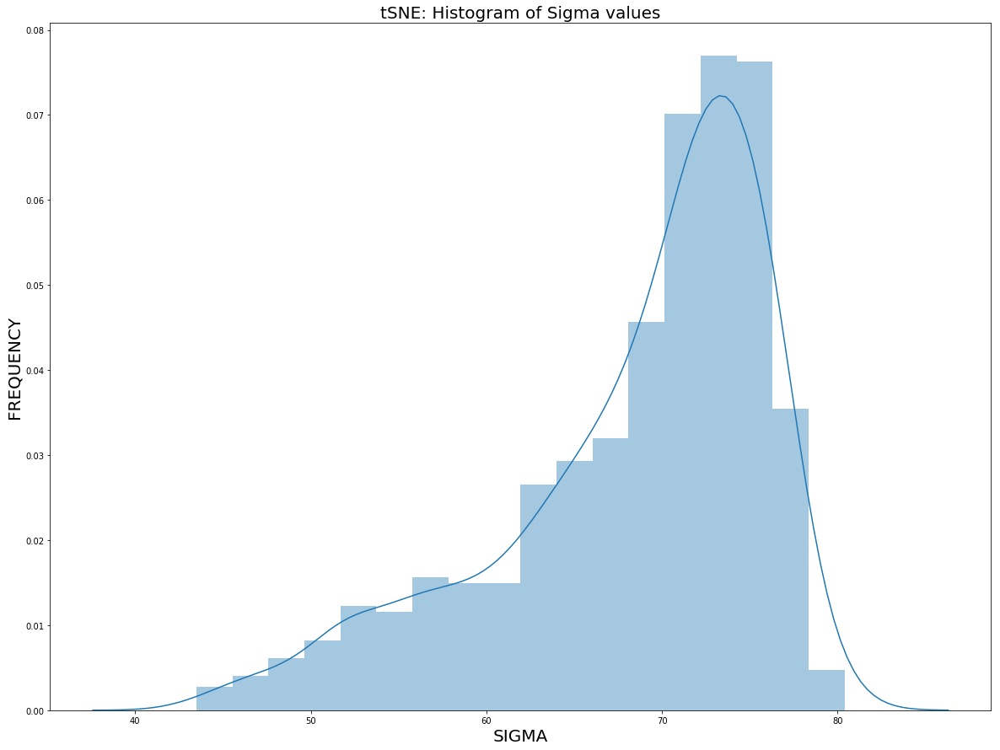

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances

import warnings
warnings.filterwarnings("ignore")

#X_train = X;
path = '/home/nikolay/WABI/K_Pietras/Manifold_Learning/'
expr = pd.read_csv(path + 'bartoschek_filtered_expr_rpkm.txt', sep='\t')
print(expr.iloc[0:4,0:4])
X_train = expr.values[:,0:(expr.shape[1]-1)]
X_train = np.log(X_train + 1)
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = expr.values[:,expr.shape[1]-1]
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)

dist = np.square(euclidean_distances(X_train, X_train))

plt.figure(figsize=(20,15))
sns.distplot(dist.reshape(-1,1))
plt.title("HISTOGRAM OF EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

def prob_high_dim(sigma, dist_row):
        exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
        exp_distance[dist_row] = 0
        prob_not_symmetr = exp_distance / np.sum(exp_distance)
        return prob_not_symmetr

def perplexity(prob):
    return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))

def sigma_binary_search(perp_of_sigma, fixed_perplexity):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if perp_of_sigma(approx_sigma) < fixed_perplexity:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

my_perp = []; my_sigma_tSNE = []
for PERPLEXITY in range(3, X_train.shape[0], 10):
    
    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, PERPLEXITY)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        
    print("Perplexity = {0}, Mean Sigma = {1}".format(PERPLEXITY, np.mean(sigma_array)))
    
    my_perp.append(PERPLEXITY)
    my_sigma_tSNE.append(np.mean(sigma_array))
    
plt.figure(figsize=(20,15))
plt.plot(my_perp, my_sigma_tSNE, '-o')
plt.title("tSNE: Mean Sigma vs. Perplexity", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

plt.figure(figsize=(20,15))
sns.distplot(prob.reshape(-1,1))
plt.title("tSNE: HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

plt.figure(figsize=(20,15))
sns.distplot(sigma_array)
plt.title("tSNE: Histogram of Sigma values", fontsize = 20)
plt.xlabel("SIGMA", fontsize = 20)
plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

Please note that the probability distribution of distances between data points in high dimensions corresponding to large perplexity equal to 713 is centered around a very small values 0.0013, implying that despite the perplexity is large, the high-dimensional probability still does not approach one, and not even close to one.

We can immediately see that at small perplexity the "memory" parameter $\sigma_i$ grows approximetely linearly with perplexity. However, when perplexity approaches the sample size N, the "memory" parameter $\sigma_i$ hyperbolically goes to infinity. We can approximate the behavior of $\sigma_i$ as a function of perplexity with the following simple assymptotic:

$$\sigma (\rm{Perp}) \approx \frac{\rm{Perp} / N}{1 - \rm{Perp} / N}$$

Let us check how well this assymptotic describes the obtained function $\sigma (\rm{Perp})$:

[  0.87962035 111.68423252  26.71340589]


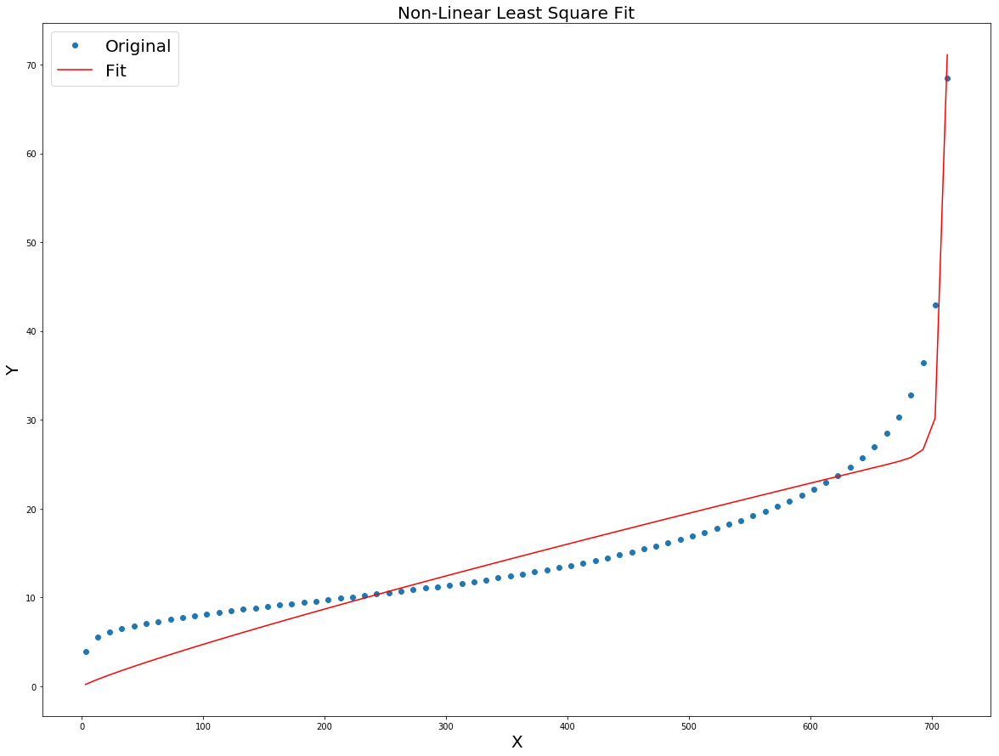

In [3]:
from scipy import optimize
import matplotlib.pyplot as plt
import numpy as np

N = X_train.shape[0]

perp = np.array(my_perp)
sigma_exact = np.array(my_sigma_tSNE)

sigma = lambda perp, a, b, c: (c*(perp / N)**a) / (1 - (perp / N)**b)
    
p , _ = optimize.curve_fit(sigma, perp, sigma_exact)
print(p)

plt.figure(figsize=(20,15))
plt.plot(perp, sigma_exact, "o")
plt.plot(perp, sigma(perp, p[0], p[1], p[2]), c = "red")
plt.title("Non-Linear Least Square Fit", fontsize = 20)
plt.gca().legend(('Original', 'Fit'), fontsize = 20)
plt.xlabel("X", fontsize = 20); plt.ylabel("Y", fontsize = 20)
plt.show()

The fact the parameter $\sigma$ can in principal go to infinity at large perplexity means in practice that the contribution to the gradient descent from the cost function disappears and tSNE becomes heavily dominated by its initialization at large perplexities. Let us prove it from the functional form of the tSNE gradient of the cost function.

Both tSNE and UMAP start with an initialization (random, PCA or Laplacian Eigenmaps) and update the coordinates via the gradient descent algorithm. Here I will ignore normalization constants in the equations of probabilities:

$$y_i = y_i -\mu \frac{\partial KL}{\partial y_i}; 
\quad \frac{\partial KL}{\partial y_i} = 4\sum_j{(p_{ij}-q_{ij})(y_i-y_j)\frac{1}{1+(y_i-y_j)^2}};
\quad q_{ij}\approx \frac{1}{1+(y_i-y_j)^2}; \quad p_{ij}\approx \displaystyle e^{\displaystyle -\frac{(x_i-x_j)^2}{2\sigma_i^2}}$$

In the limit $\sigma_i \rightarrow \infty$ the probability to observe points at a distance in high-dimensional space becomes $p_{ij} \rightarrow 1$. Therefore:

$$\frac{\partial KL}{\partial y_i} \approx 4\sum_j{\left(1-\frac{1}{1+(y_i-y_j)^2}\right)(y_i-y_j)\frac{1}{1+(y_i-y_j)^2}} = 4\sum_j{\frac{(y_i-y_j)^3}{(1+(y_i-y_j)^2)^2}}$$

In the limit of close embedding points: 
$$y_i-y_j \rightarrow 0: \quad \frac{\partial KL}{\partial y_i} \approx 4\sum_i{(y_i-y_j)^3} \rightarrow 0$$
In the limit of distant embedding points:
$$y_i-y_j \rightarrow \infty: \quad \frac{\partial KL}{\partial y_i} \approx 4\sum_i{\frac{1}{y_i-y_j}} \rightarrow 0$$

We conclude that the contribution to the gradient descent updating rule from the cost function, $\displaystyle\mu\frac{\partial KL}{\partial y_i}$, disappears and therefore if one starts with PCA as an initialization step one ends up with the PCA at the end as initial positions of the points are not getting updated by the gradient descent. 

Let us now compute the $\sigma(\rm{n\_neighbor})$ dependence for UMAP and compare it to tSNE:

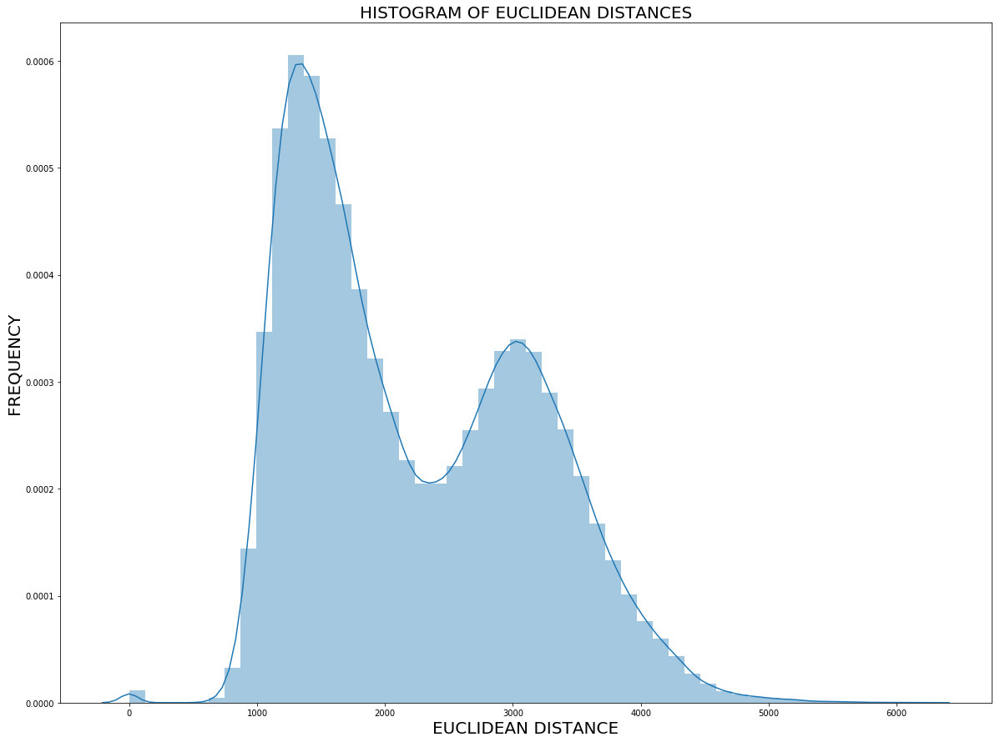

N_neighbor = 3, Mean Sigma = 0.00095367431640625
N_neighbor = 13, Mean Sigma = 60.18894211540009
N_neighbor = 23, Mean Sigma = 72.26585143105278
N_neighbor = 33, Mean Sigma = 78.65388300165783
N_neighbor = 43, Mean Sigma = 82.91104119583215
N_neighbor = 53, Mean Sigma = 86.05896161255224
N_neighbor = 63, Mean Sigma = 88.53755450115524
N_neighbor = 73, Mean Sigma = 90.57147942441802
N_neighbor = 83, Mean Sigma = 92.28989531873991
N_neighbor = 93, Mean Sigma = 93.77371931875219
N_neighbor = 103, Mean Sigma = 95.07648372117367
N_neighbor = 113, Mean Sigma = 96.23584667397611
N_neighbor = 123, Mean Sigma = 97.27877611554534
N_neighbor = 133, Mean Sigma = 98.22561088221033
N_neighbor = 143, Mean Sigma = 99.0917163188231
N_neighbor = 153, Mean Sigma = 99.88931437444421
N_neighbor = 163, Mean Sigma = 100.62791781718505
N_neighbor = 173, Mean Sigma = 101.3152372903664
N_neighbor = 183, Mean Sigma = 101.95771009562402
N_neighbor = 193, Mean Sigma = 102.56053349159284
N_neighbor = 203, Mean Sigm

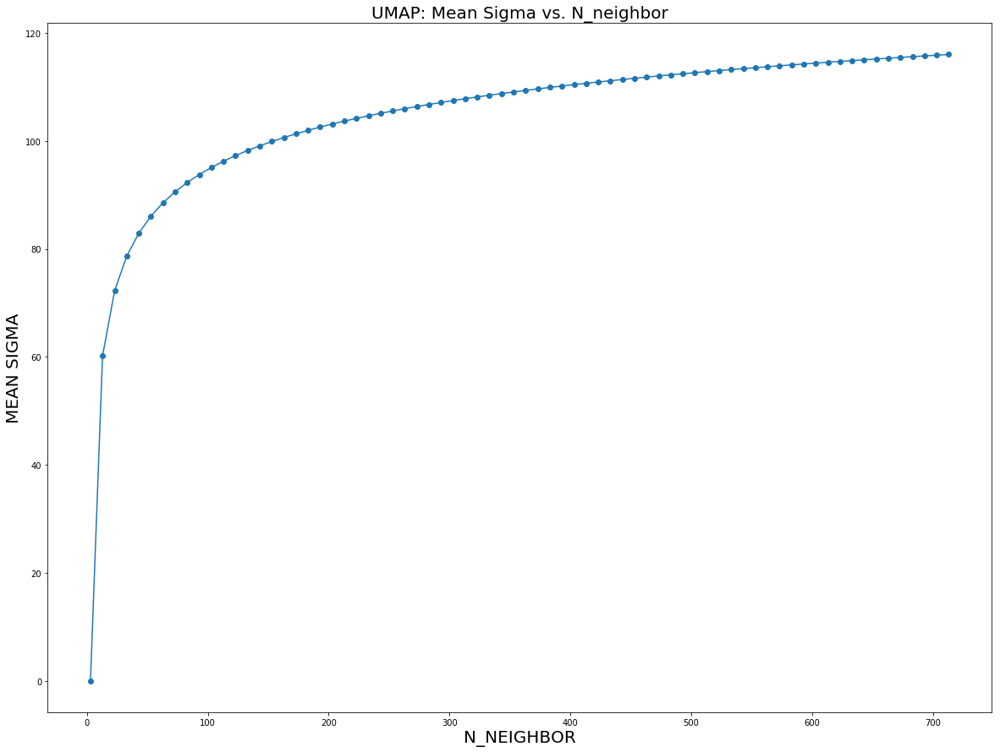

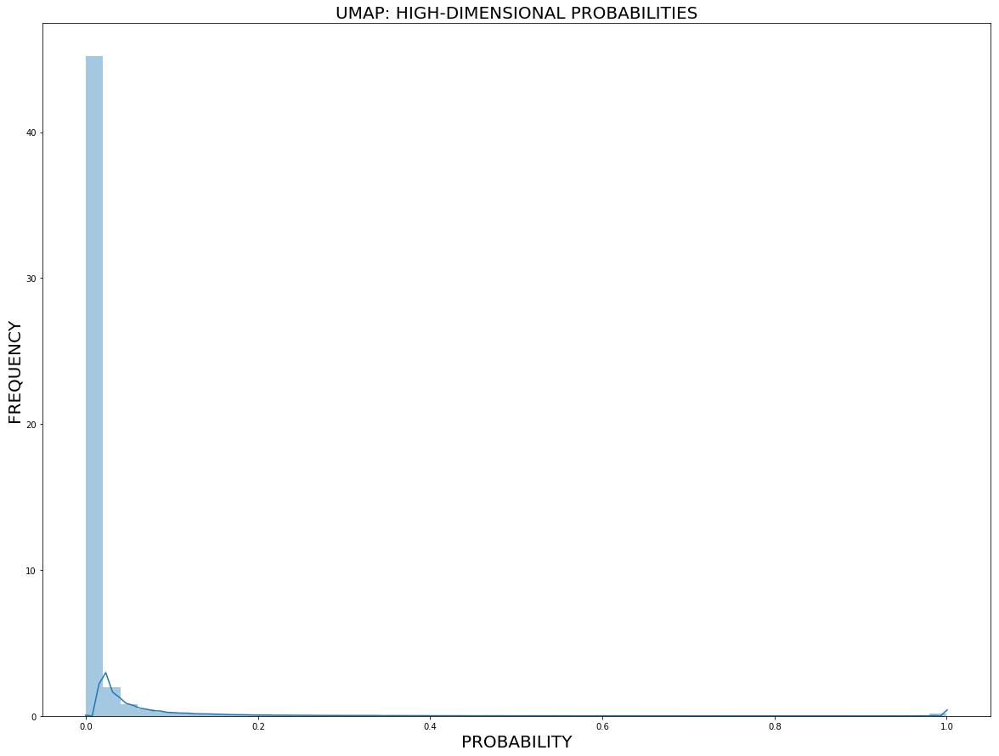

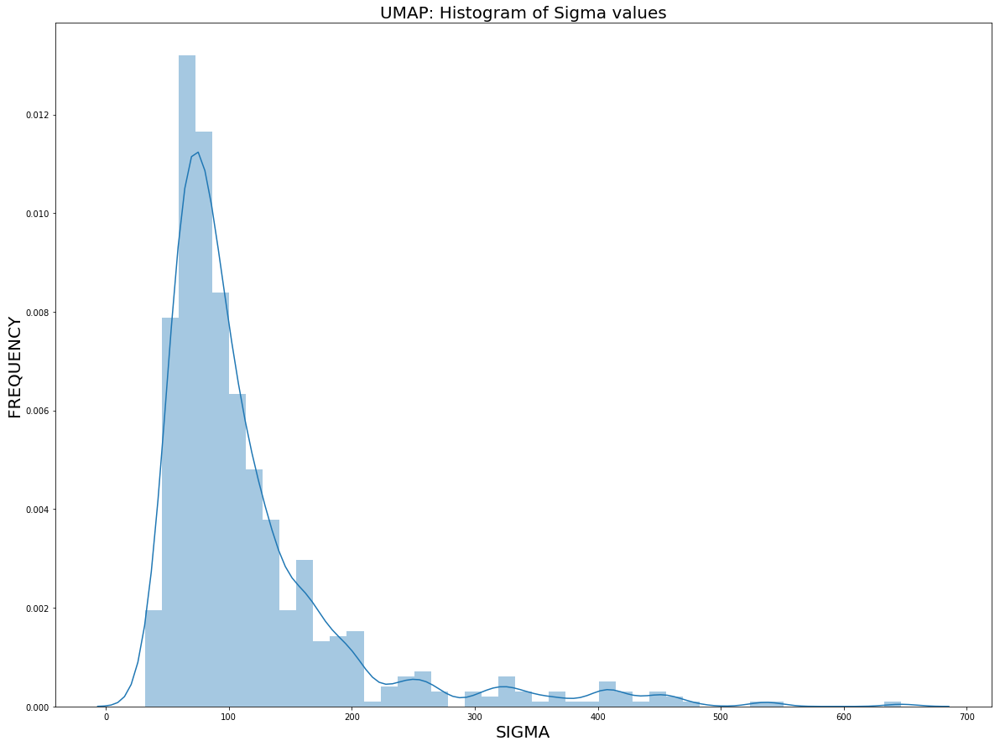

In [4]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances


dist = np.square(euclidean_distances(X_train, X_train))
rho = [sorted(dist[i])[1] for i in range(dist.shape[0])]

plt.figure(figsize=(20,15))
sns.distplot(dist.reshape(-1,1))
plt.title("HISTOGRAM OF EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

def prob_high_dim(sigma, dist_row):
    d = dist[dist_row] - rho[dist_row]
    d[d < 0] = 0
    return np.exp(- d / sigma)

def k(prob):
    return np.power(2, np.sum(prob))

def sigma_binary_search(k_of_sigma, fixed_k):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if k_of_sigma(approx_sigma) < fixed_k:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_k - k_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

my_n_neighbor = []; my_sigma_umap = []
for N_NEIGHBOR in range(3, X_train.shape[0], 10):

    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: k(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, N_NEIGHBOR)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        
    print("N_neighbor = {0}, Mean Sigma = {1}".format(N_NEIGHBOR, np.mean(sigma_array)))
    
    my_n_neighbor.append(N_NEIGHBOR)
    my_sigma_umap.append(np.mean(sigma_array))

plt.figure(figsize=(20,15))
plt.plot(my_n_neighbor, my_sigma_umap, '-o')
plt.title("UMAP: Mean Sigma vs. N_neighbor", fontsize = 20)
plt.xlabel("N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

plt.figure(figsize=(20,15))
sns.distplot(prob.reshape(-1,1))
plt.title("UMAP: HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

plt.figure(figsize=(20,15))
sns.distplot(sigma_array)
plt.title("UMAP: Histogram of Sigma values", fontsize = 20)
plt.xlabel("SIGMA", fontsize = 20)
plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

Please note that the high-dimensional probability values became much larger for UMAP and some small peak around 1 is quite visible.

We can see that $\sigma$ depends on n_neighbors in a very different way for UMAP compared to tSNE. It does not go to infinity that fast compared to tSNE. This implies that **as Perplexity / N_neighbors approaches the sample size N, for UMAP $\sigma$ remains finite while for tSNE $\sigma$ goes to infinity**. We can approximate $\sigma(\rm{n\_neighbor})$ dependence with the following simple expression:

$$\sigma(\rm{n\_neighbor})\approx -\frac{1}{\displaystyle\ln\left(\frac{\log_2(\rm{n\_neighbor})}{N}\right)}$$

[136.0680298   24.09538417]


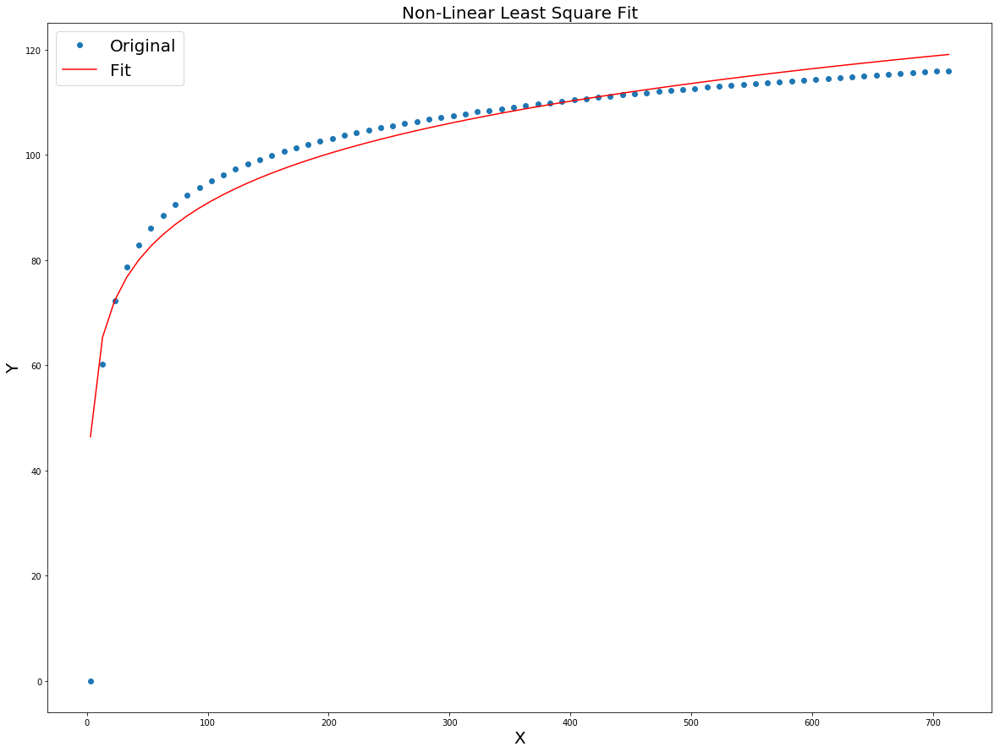

In [5]:
from scipy import optimize
import matplotlib.pyplot as plt
import numpy as np

N = X_train.shape[0]

n_neighbor = np.array(my_n_neighbor)
sigma_exact = np.array(my_sigma_umap)

sigma = lambda n_neighbor, a, b: - a / np.log(b * np.log2(n_neighbor) / N)
    
p , _ = optimize.curve_fit(sigma, n_neighbor, sigma_exact)
print(p)

plt.figure(figsize=(20,15))
plt.plot(n_neighbor, sigma_exact, "o")
plt.plot(n_neighbor, sigma(n_neighbor, p[0], p[1]), c = "red")
plt.title("Non-Linear Least Square Fit", fontsize = 20)
plt.gca().legend(('Original', 'Fit'), fontsize = 20)
plt.xlabel("X", fontsize = 20); plt.ylabel("Y", fontsize = 20)
plt.show()

Let us compare how Perplexity and N_neighbors hyperparameters behave for tSNE and UMAP, respectively, for the same data set where the Euclidean distances are fixed. For this purpose we need to realize that the computed sigma for UMAP is not directly comparable with the computed sigma for tSNE since we have $2\sigma^2$ in the denominator of the power of the exponent in the equation for high-dimensional probabilities, while it is just $\sigma$ in the corresponding denominator for UMAP. Therefore, we need to square all the obtained tSNE sigmas and multiply them by two.

In [6]:
my_sigma_tSNE_mod = [2*(i**2) for i in my_sigma_tSNE]

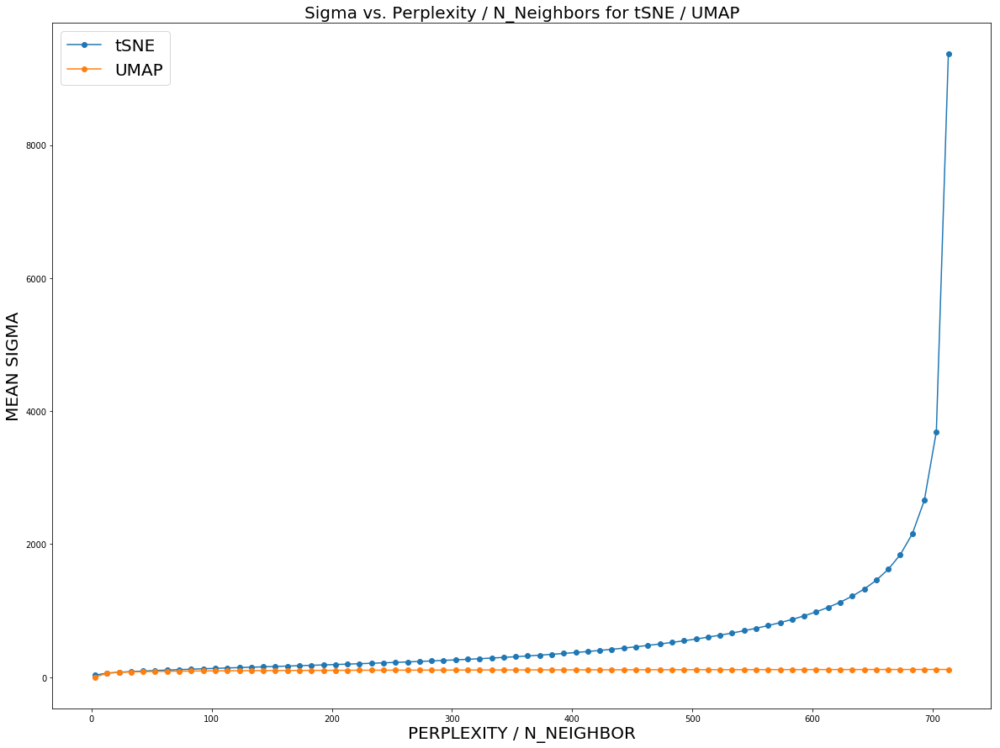

In [7]:
plt.figure(figsize=(20, 15))

plt.plot(my_perp, my_sigma_tSNE_mod, '-o')
plt.plot(my_n_neighbor, my_sigma_umap, '-o')

plt.gca().legend(('tSNE','UMAP'), fontsize = 20)
plt.title("Sigma vs. Perplexity / N_Neighbors for tSNE / UMAP", fontsize = 20)
plt.xlabel("PERPLEXITY / N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

UMAP's mean sigma does not change much with n_neighbor and reaches much smaller values than tSNE's mean sigma, so really hard to compare them as they are not on the same sacel, log-transform did not improve the view, let us restrict the x-axis in order to enlarge and resolve the behavior of UMAP's mean sigma.

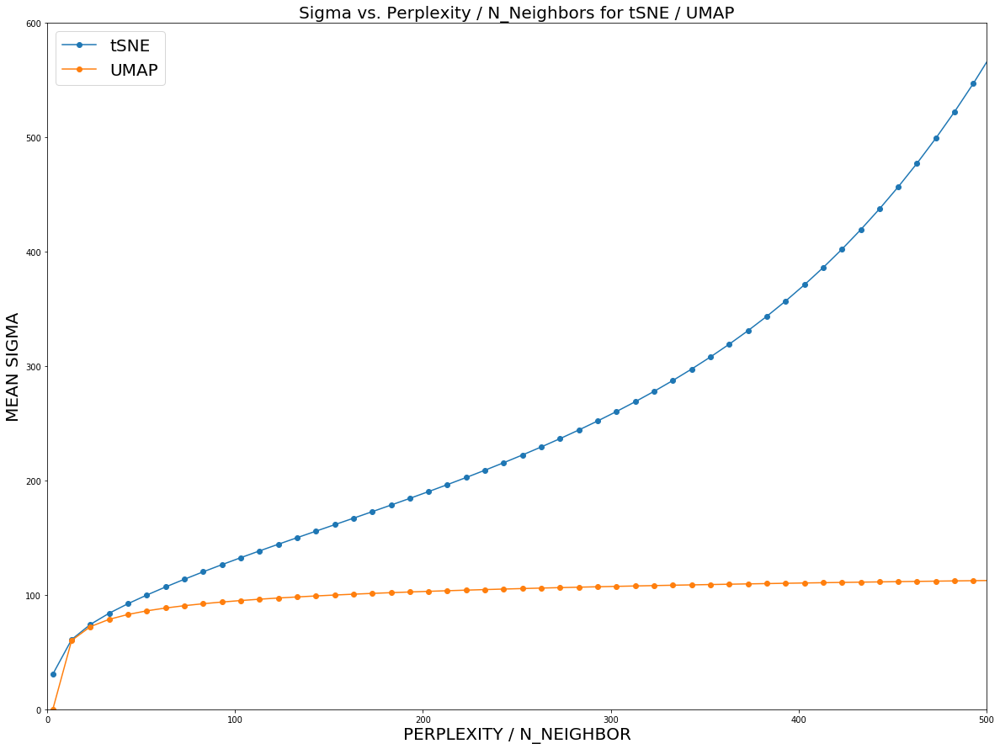

In [11]:
plt.figure(figsize=(20, 15))

plt.plot(my_perp, my_sigma_tSNE_mod, '-o')
plt.plot(my_n_neighbor, my_sigma_umap, '-o')

plt.gca().legend(('tSNE','UMAP'), fontsize = 20)
plt.title("Sigma vs. Perplexity / N_Neighbors for tSNE / UMAP", fontsize = 20)
plt.xlabel("PERPLEXITY / N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.ylim(0,600); plt.xlim(0,500)
plt.show()

Again we can see that for UMAP the dependence $\sigma(\rm{n\_neighbor})$ is logarithmic and therefore very slow while for tSNE $\sigma(\rm{Perplexity})$ very quickly goes to infinity when Perplexity approaches the sample size N. Therefore **tSNE is much more sensitive to the Perplexity hyperparameter than UMAP towards N_neighbors hyperparameter**.

### Computing Mean Sigma vs. Perplexity and N_neighbors for World Map Data Set

In order to be on a safe side with our conclusion that mean sigma vs. n_neighbors goes to infinity much slower for UMAP than mean sigma vs. perplexity for tSNE, which was done for Cancer Associated Fibroblasts (CAFs) data set, we will recompute these curves for the synthetic World Map data set. We will do it first for the 2D (linear manifold) data set and then repeat it for the 3D Swiss Roll embedded data set (non-linear manifold).

(3023, 2)
(3023,)


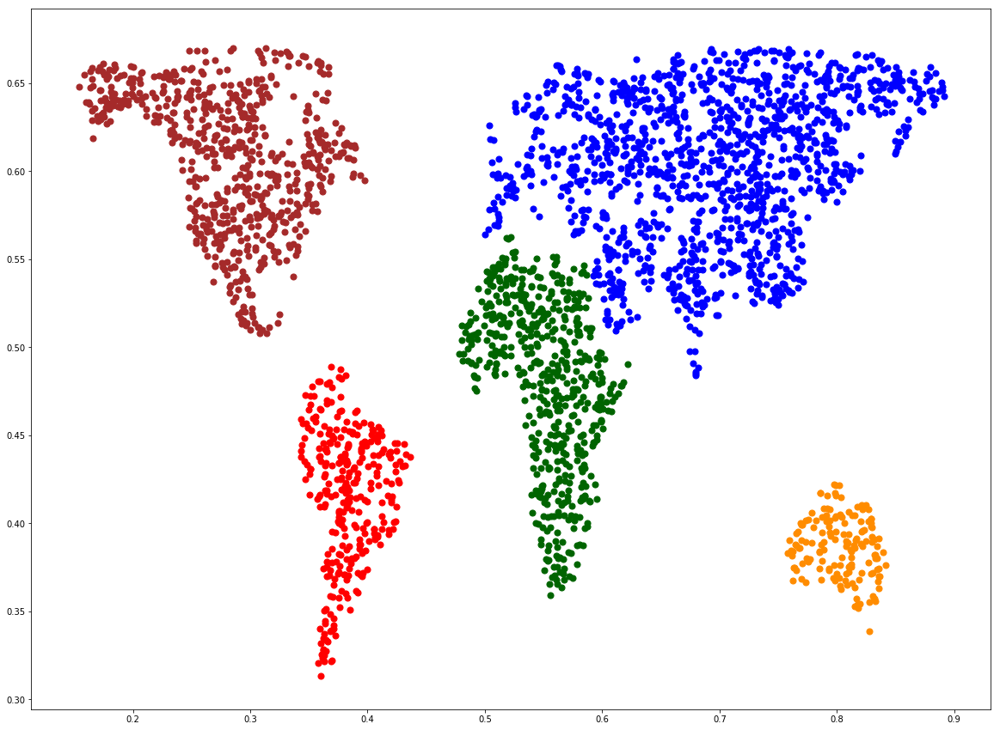

In [2]:
import cartopy
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from skimage.io import imread
import cartopy.io.shapereader as shpreader

shapename = 'admin_0_countries'
countries_shp = shpreader.natural_earth(resolution='110m',
                                        category='cultural', name=shapename)

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    #print(country.attributes['NAME_LONG'])
    if country.attributes['NAME_LONG'] in ['United States','Canada', 'Mexico']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('NorthAmerica.png')
plt.close()
        
plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Brazil','Argentina', 'Peru', 'Uruguay', 'Venezuela', 
                                           'Columbia', 'Bolivia', 'Colombia', 'Ecuador', 'Paraguay']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('SouthAmerica.png')
plt.close()

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Australia']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Australia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Russian Federation', 'China', 'India', 'Kazakhstan', 'Mongolia', 
                                          'France', 'Germany', 'Spain', 'Ukraine', 'Turkey', 'Sweden', 
                                           'Finland', 'Denmark', 'Greece', 'Poland', 'Belarus', 'Norway', 
                                           'Italy', 'Iran', 'Pakistan', 'Afganistan', 'Iraq', 'Bulgaria', 
                                           'Romania', 'Turkmenistan', 'Uzbekistan' 'Austria', 'Ireland', 
                                           'United Kingdom', 'Saudi Arabia', 'Hungary']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Eurasia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Libya', 'Algeria', 'Niger', 'Marocco', 'Egypt', 'Sudan', 'Chad',
                                           'Democratic Republic of the Congo', 'Somalia', 'Kenya', 'Ethiopia', 
                                           'The Gambia', 'Nigeria', 'Cameroon', 'Ghana', 'Guinea', 'Guinea-Bissau',
                                           'Liberia', 'Sierra Leone', 'Burkina Faso', 'Central African Republic', 
                                           'Republic of the Congo', 'Gabon', 'Equatorial Guinea', 'Zambia', 
                                           'Malawi', 'Mozambique', 'Angola', 'Burundi', 'South Africa', 
                                           'South Sudan', 'Somaliland', 'Uganda', 'Rwanda', 'Zimbabwe', 'Tanzania',
                                           'Botswana', 'Namibia', 'Senegal', 'Mali', 'Mauritania', 'Benin', 
                                           'Nigeria', 'Cameroon']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Africa.png')
plt.close()


rng = np.random.RandomState(123)
plt.figure(figsize = (20,15))

N_NorthAmerica = 10000
data_NorthAmerica = imread('NorthAmerica.png')[::-1, :, 0].T
X_NorthAmerica = rng.rand(4 * N_NorthAmerica, 2)
i, j = (X_NorthAmerica * data_NorthAmerica.shape).astype(int).T
X_NorthAmerica = X_NorthAmerica[data_NorthAmerica[i, j] < 1]
X_NorthAmerica = X_NorthAmerica[X_NorthAmerica[:, 1]<0.67]
y_NorthAmerica = np.array(['brown']*X_NorthAmerica.shape[0])
plt.scatter(X_NorthAmerica[:, 0], X_NorthAmerica[:, 1], c = 'brown', s = 50)

N_SouthAmerica = 10000
data_SouthAmerica = imread('SouthAmerica.png')[::-1, :, 0].T
X_SouthAmerica = rng.rand(4 * N_SouthAmerica, 2)
i, j = (X_SouthAmerica * data_SouthAmerica.shape).astype(int).T
X_SouthAmerica = X_SouthAmerica[data_SouthAmerica[i, j] < 1]
y_SouthAmerica = np.array(['red']*X_SouthAmerica.shape[0])
plt.scatter(X_SouthAmerica[:, 0], X_SouthAmerica[:, 1], c = 'red', s = 50)

N_Australia = 10000
data_Australia = imread('Australia.png')[::-1, :, 0].T
X_Australia = rng.rand(4 * N_Australia, 2)
i, j = (X_Australia * data_Australia.shape).astype(int).T
X_Australia = X_Australia[data_Australia[i, j] < 1]
y_Australia = np.array(['darkorange']*X_Australia.shape[0])
plt.scatter(X_Australia[:, 0], X_Australia[:, 1], c = 'darkorange', s = 50)

N_Eurasia = 10000
data_Eurasia = imread('Eurasia.png')[::-1, :, 0].T
X_Eurasia = rng.rand(4 * N_Eurasia, 2)
i, j = (X_Eurasia * data_Eurasia.shape).astype(int).T
X_Eurasia = X_Eurasia[data_Eurasia[i, j] < 1]
X_Eurasia = X_Eurasia[X_Eurasia[:, 0]>0.5]
X_Eurasia = X_Eurasia[X_Eurasia[:, 1]<0.67]
y_Eurasia = np.array(['blue']*X_Eurasia.shape[0])
plt.scatter(X_Eurasia[:, 0], X_Eurasia[:, 1], c = 'blue', s = 50)

N_Africa = 10000
data_Africa = imread('Africa.png')[::-1, :, 0].T
X_Africa = rng.rand(4 * N_Africa, 2)
i, j = (X_Africa * data_Africa.shape).astype(int).T
X_Africa = X_Africa[data_Africa[i, j] < 1]
y_Africa = np.array(['darkgreen']*X_Africa.shape[0])
plt.scatter(X_Africa[:, 0], X_Africa[:, 1], c = 'darkgreen', s = 50)

X = np.vstack((X_NorthAmerica, X_SouthAmerica, X_Australia, X_Eurasia, X_Africa))
y = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa))
print(X.shape)
print(y.shape)

plt.show()


This data set contains 3023 samples

Dimensions of the  data set: 
(3023, 2) (3023,)


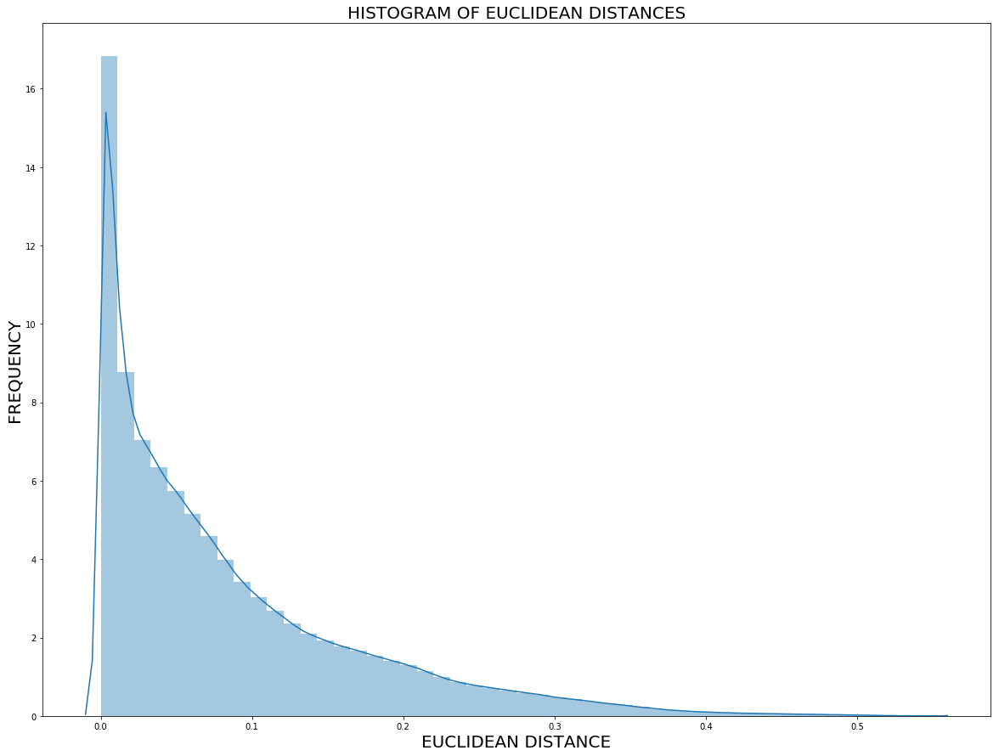

Perplexity = 3, Mean Sigma = 0.0020824360445245308
Perplexity = 203, Mean Sigma = 0.026983336190928145
Perplexity = 403, Mean Sigma = 0.04243961123492676
Perplexity = 603, Mean Sigma = 0.05657405518870302
Perplexity = 803, Mean Sigma = 0.07055265557241487
Perplexity = 1003, Mean Sigma = 0.08290341623642568
Perplexity = 1203, Mean Sigma = 0.09496204907476921
Perplexity = 1403, Mean Sigma = 0.1074566653419164
Perplexity = 1603, Mean Sigma = 0.12099297284054669
Perplexity = 1803, Mean Sigma = 0.13608960887670438
Perplexity = 2003, Mean Sigma = 0.1530494273517292
Perplexity = 2203, Mean Sigma = 0.17244280311314428
Perplexity = 2403, Mean Sigma = 0.19591208763008988
Perplexity = 2603, Mean Sigma = 0.22778556790921295
Perplexity = 2803, Mean Sigma = 0.28223238991381827
Perplexity = 3003, Mean Sigma = 0.5550955527277526


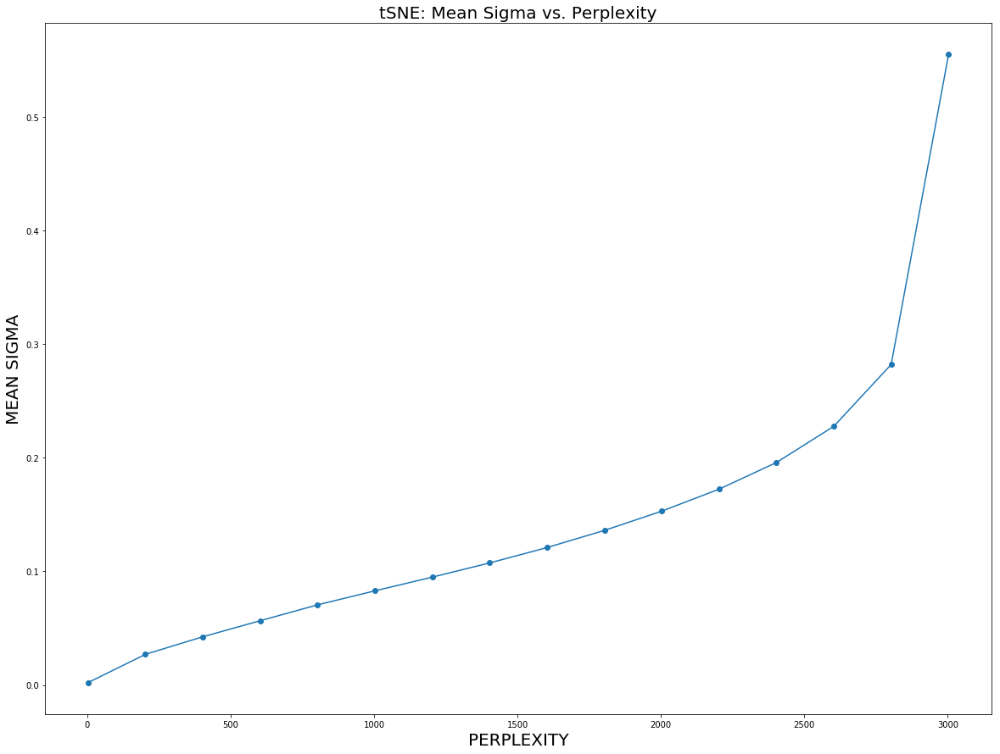

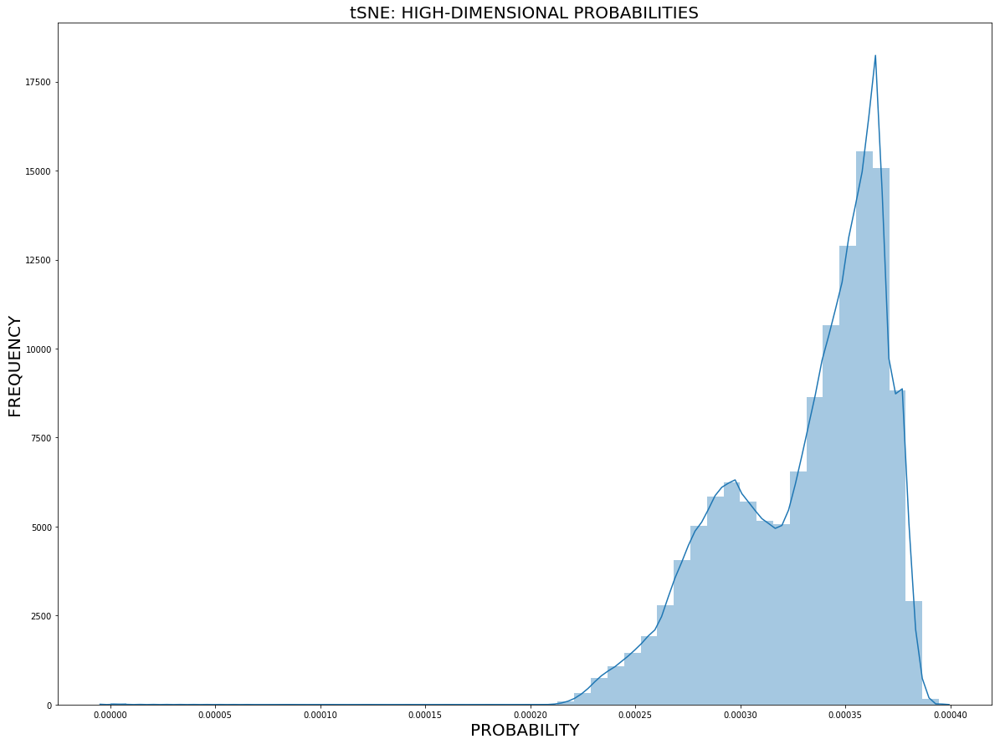

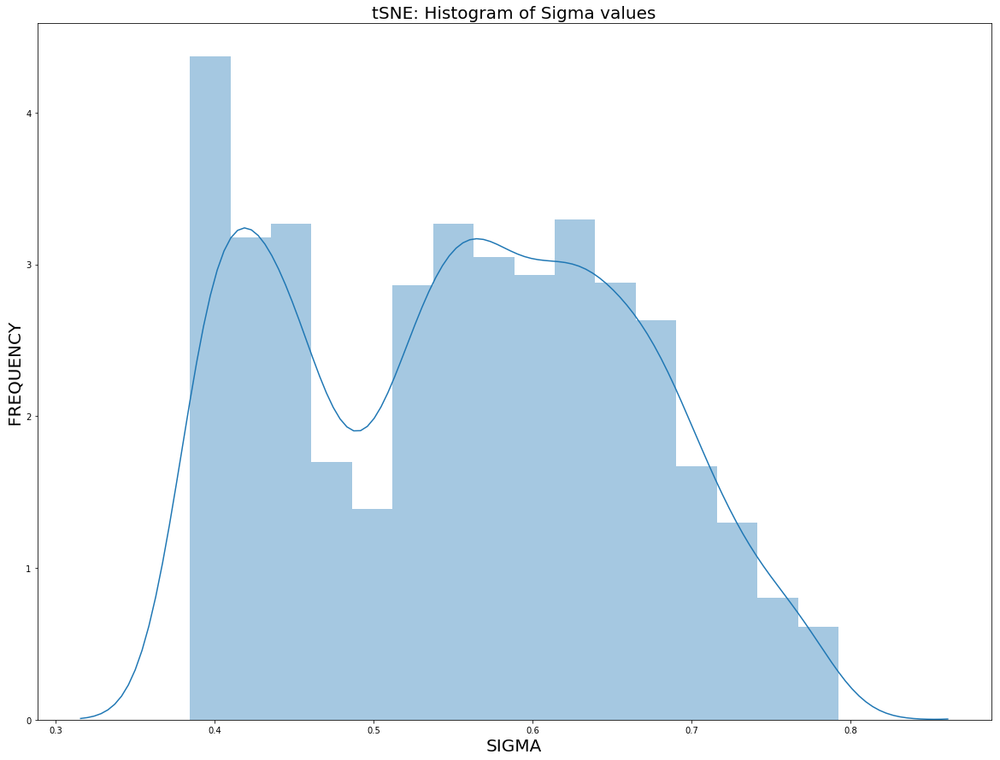

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances

import warnings
warnings.filterwarnings("ignore")

X_train = X
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = y
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)

dist = np.square(euclidean_distances(X_train, X_train))

plt.figure(figsize = (20,15))
sns.distplot(dist.reshape(-1,1))
plt.title("HISTOGRAM OF EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

def prob_high_dim(sigma, dist_row):
    exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
    exp_distance[dist_row] = 0
    prob_not_symmetr = exp_distance / np.sum(exp_distance)
    return prob_not_symmetr

def perplexity(prob):
    return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))

def sigma_binary_search(perp_of_sigma, fixed_perplexity):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if perp_of_sigma(approx_sigma) < fixed_perplexity:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

my_perp = []; my_sigma_tSNE = []
for PERPLEXITY in range(3, X_train.shape[0], 200):
    
    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, PERPLEXITY)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        
    print("Perplexity = {0}, Mean Sigma = {1}".format(PERPLEXITY, np.mean(sigma_array)))
    
    my_perp.append(PERPLEXITY)
    my_sigma_tSNE.append(np.mean(sigma_array))
    
plt.figure(figsize = (20,15))
plt.plot(my_perp, my_sigma_tSNE, '-o')
plt.title("tSNE: Mean Sigma vs. Perplexity", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
sns.distplot(prob.reshape(-1,1))
plt.title("tSNE: HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
sns.distplot(sigma_array)
plt.title("tSNE: Histogram of Sigma values", fontsize = 20)
plt.xlabel("SIGMA", fontsize = 20)
plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

We can see that the Mean sigma vs. perplexity dependence for the World Map synthetic data set is qualitatively very similar to the one for the CAFs scRNAseq data set despite the sample size is three times larger now. We notice again that the high-dimensional probabilities are not close to one again despite we reach the large perplexity values close to the sample size of the data set.

Now let us check how UMAP's mean sigma vs. n_neighbors behaves for the synthetic World Map data set. Here I discovered that at default UMAP's hyperparameters local_connectivity = 1 and bandwidth = 1, the mean sigma is almost constant and has a very low values in the order of magnitude ~$10^{-5}$. Thus in order to compare it with tSNE's mean sigma vs. perplexity I had to increase bandwidth hyperparameter from default 1 to 200. 


This data set contains 3023 samples

Dimensions of the  data set: 
(3023, 2) (3023,)


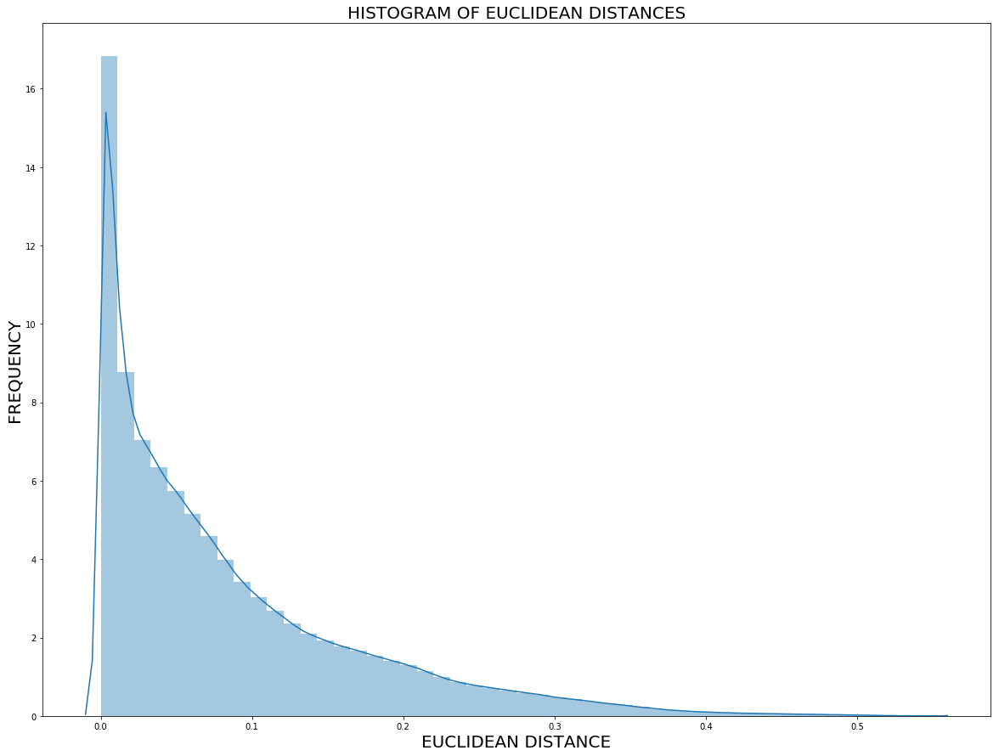

N_neighbor = 3, Mean Sigma = 0.00778965472070894
N_neighbor = 203, Mean Sigma = 0.08925199114325975
N_neighbor = 403, Mean Sigma = 0.11678645834006342
N_neighbor = 603, Mean Sigma = 0.13711868119563167
N_neighbor = 803, Mean Sigma = 0.15409679709386243
N_neighbor = 1003, Mean Sigma = 0.16911141019840725
N_neighbor = 1203, Mean Sigma = 0.1827940970826851
N_neighbor = 1403, Mean Sigma = 0.19555181767662116
N_neighbor = 1603, Mean Sigma = 0.2076098195693369
N_neighbor = 1803, Mean Sigma = 0.21915612455791406
N_neighbor = 2003, Mean Sigma = 0.23023931545569257
N_neighbor = 2203, Mean Sigma = 0.2409641292368857
N_neighbor = 2403, Mean Sigma = 0.25143277909319567
N_neighbor = 2603, Mean Sigma = 0.26164589597025023
N_neighbor = 2803, Mean Sigma = 0.27171326440728505
N_neighbor = 3003, Mean Sigma = 0.28158125402593787


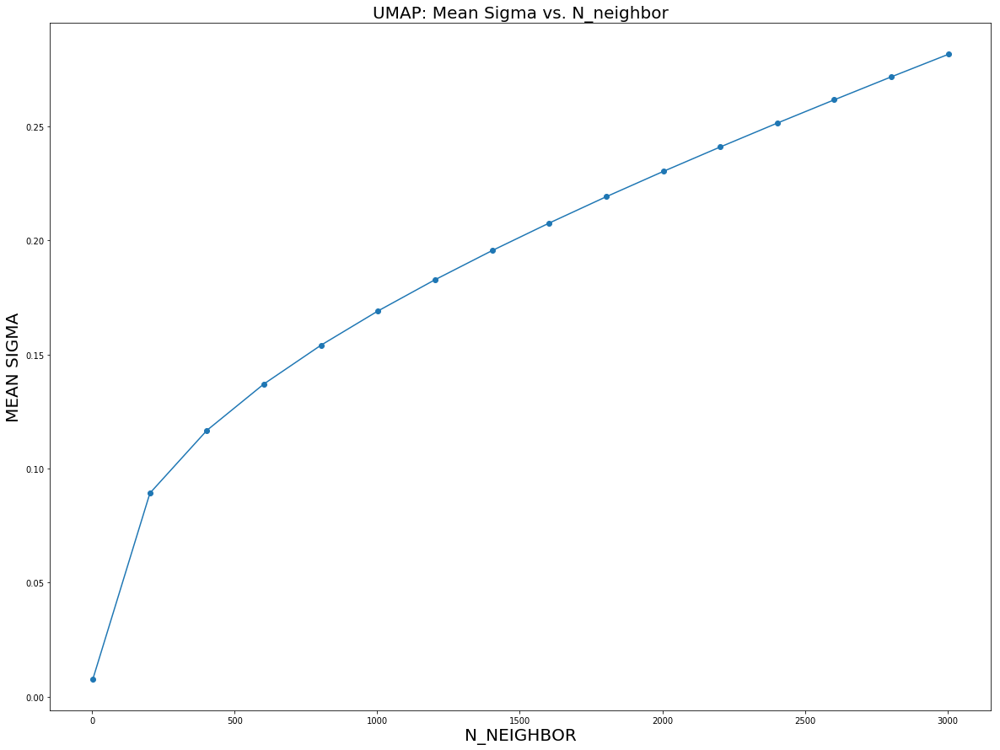

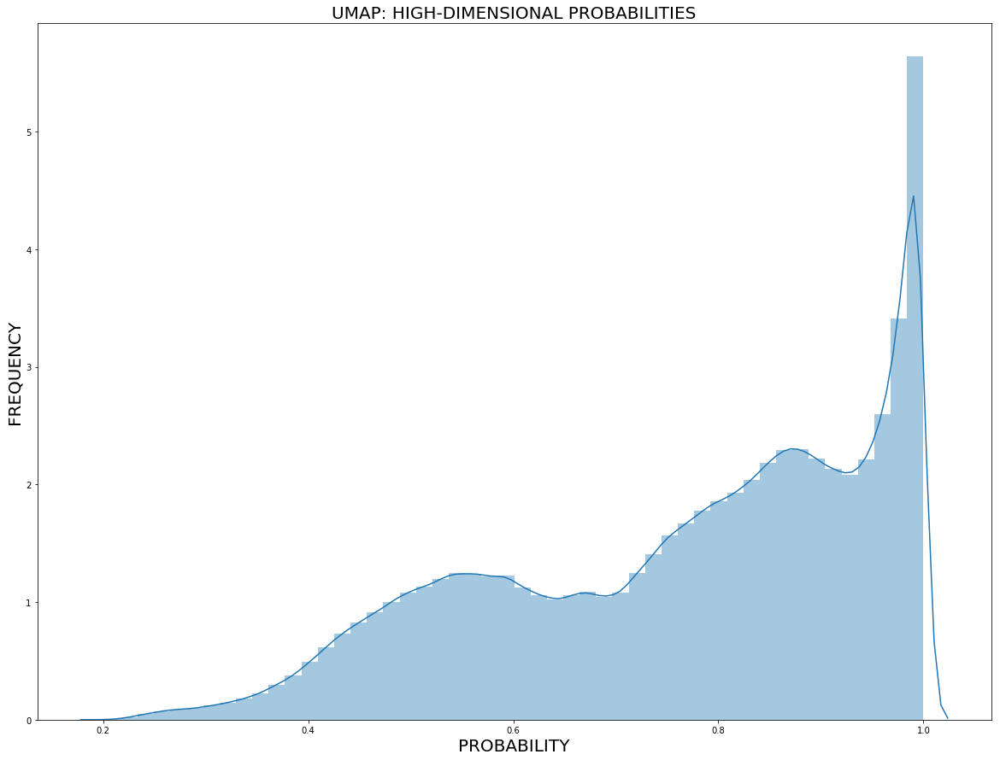

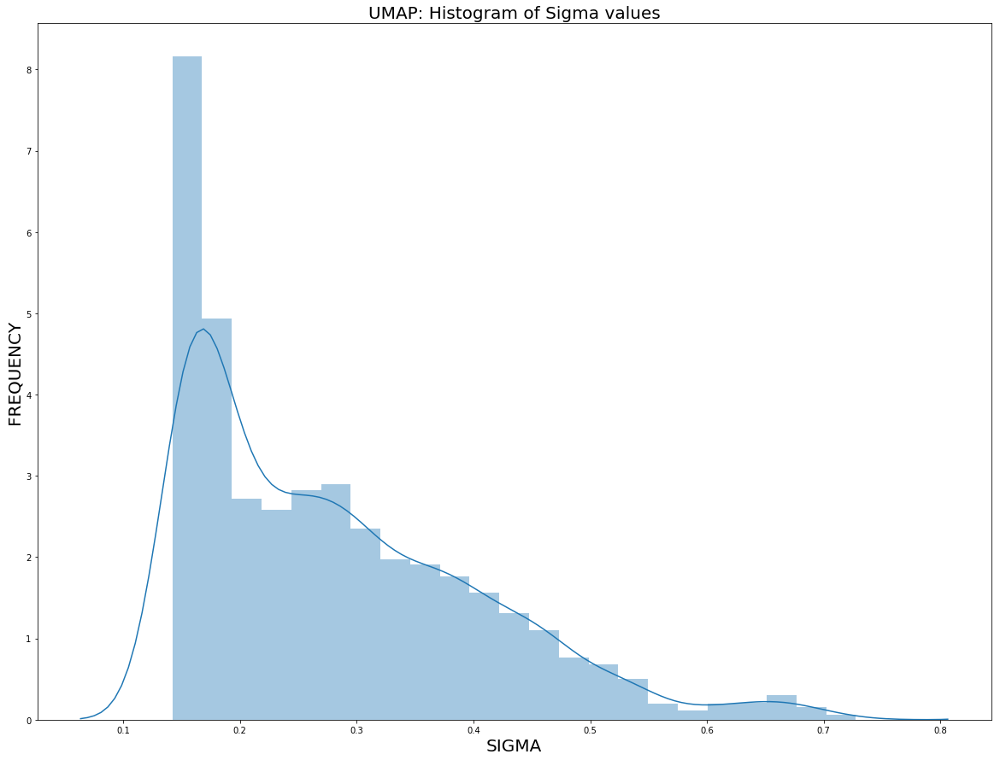

In [31]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances

import warnings
warnings.filterwarnings("ignore")

X_train = X
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = y
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)

BANDWIDTH = 200

dist = np.square(euclidean_distances(X_train, X_train))
rho = [sorted(dist[i])[1] for i in range(dist.shape[0])]

plt.figure(figsize = (20,15))
sns.distplot(dist.reshape(-1,1))
plt.title("HISTOGRAM OF EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

def prob_high_dim(sigma, dist_row):
    d = dist[dist_row] - rho[dist_row]
    d[d < 0] = 0
    return np.exp(- d / sigma)

def k(prob):
    return np.power(2, np.sum(prob) / BANDWIDTH)

def sigma_binary_search(k_of_sigma, fixed_k):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if k_of_sigma(approx_sigma) < fixed_k:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_k - k_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

my_n_neighbor = []; my_sigma_umap = []
for N_NEIGHBOR in range(3, X_train.shape[0], 200):

    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: k(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, N_NEIGHBOR)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        
    print("N_neighbor = {0}, Mean Sigma = {1}".format(N_NEIGHBOR, np.mean(sigma_array)))
    
    my_n_neighbor.append(N_NEIGHBOR)
    my_sigma_umap.append(np.mean(sigma_array))
        
plt.figure(figsize = (20,15))
plt.plot(my_n_neighbor, my_sigma_umap, '-o')
plt.title("UMAP: Mean Sigma vs. N_neighbor", fontsize = 20)
plt.xlabel("N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
sns.distplot(prob.reshape(-1,1))
plt.title("UMAP: HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
sns.distplot(sigma_array)
plt.title("UMAP: Histogram of Sigma values", fontsize = 20)
plt.xlabel("SIGMA", fontsize = 20)
plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

Note that the high-dimensional probabilities have the mode around 1, therefore there is a dramatic difference compared to tSNE where the high-dimensional probabilities are never close to 1. This is probably not only the effect of large n_neighbor hyperparameter but also the bandwidth which multiplies the log2(n_neighbor) and thus effectively increases the n_neighbor hyperparameter. In a sense, bandwidth has something to do with the empirical **early exxageration** hyperparameter of tSNE because increasing the n_neighbor value it effectively increases the high-dimensional probability values by some factor, the same way as the early exxageration increases the high-dimensional probabilities for tSNE.

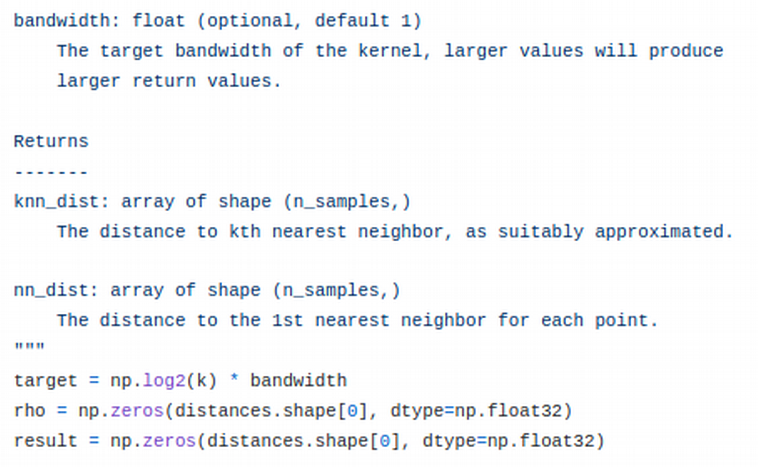

In [12]:
from IPython.display import Image
Image('/home/nikolay/Documents/Medium/tSNE_vs_UMAP/bandwidth.png', width=2000)

N_neighbor = 3, Mean Sigma = 0.0005434110795103611
N_neighbor = 203, Mean Sigma = 0.029689674540503756
N_neighbor = 403, Mean Sigma = 0.03986285083839624
N_neighbor = 603, Mean Sigma = 0.047277319079436254
N_neighbor = 803, Mean Sigma = 0.053450711169523116
N_neighbor = 1003, Mean Sigma = 0.05890858200760852
N_neighbor = 1203, Mean Sigma = 0.06389338874205458
N_neighbor = 1403, Mean Sigma = 0.06854460156423178
N_neighbor = 1603, Mean Sigma = 0.0729488659037416
N_neighbor = 1803, Mean Sigma = 0.07716326602196168
N_neighbor = 2003, Mean Sigma = 0.08122730945554014
N_neighbor = 2203, Mean Sigma = 0.08517411317425996
N_neighbor = 2403, Mean Sigma = 0.08902563587936704
N_neighbor = 2603, Mean Sigma = 0.09279683077752168
N_neighbor = 2803, Mean Sigma = 0.09650180422602403
N_neighbor = 3003, Mean Sigma = 0.10015113465151432


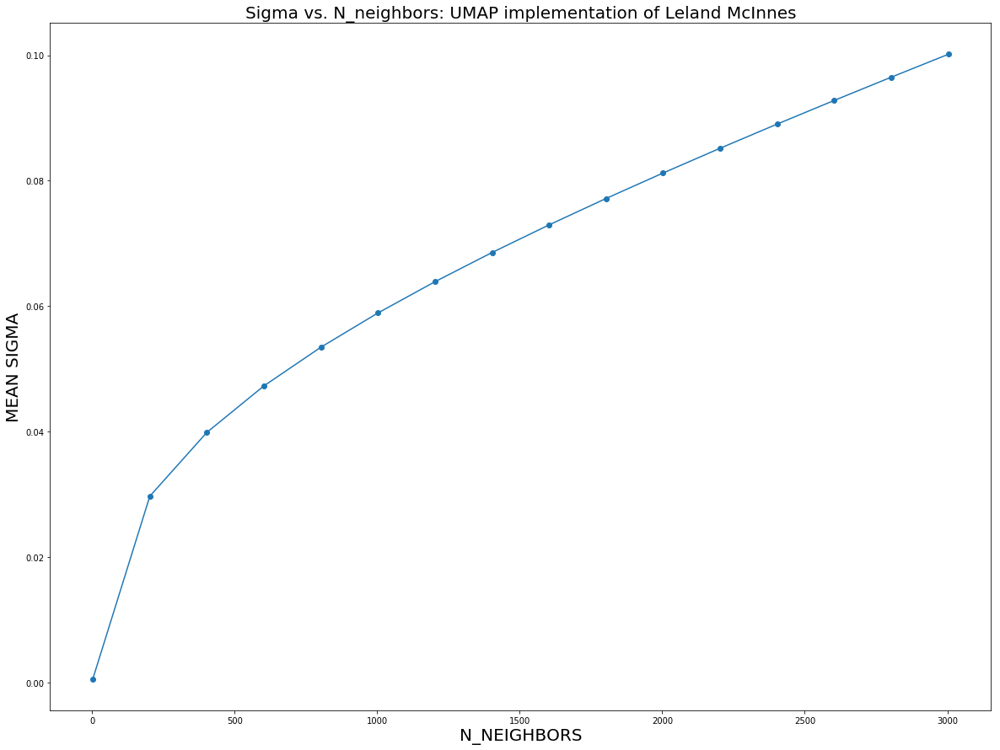

In [30]:
from umap import umap_
plt.figure(figsize = (20, 15))

my_n_neighbors = []; my_sigma_umap = []
for n_neighbors in range(3, X_train.shape[0], 200):
    sigmas_umap, rhos_umap = umap_.smooth_knn_dist(dist, k = n_neighbors, 
                                                   local_connectivity = 1, bandwidth = 200)
    my_sigma_umap.append(np.mean(sigmas_umap))
    my_n_neighbors.append(n_neighbors)
    print("N_neighbor = {0}, Mean Sigma = {1}".format(n_neighbors, np.mean(sigmas_umap)))

plt.plot(my_n_neighbors, my_sigma_umap, '-o')
plt.title("Sigma vs. N_neighbors: UMAP implementation of Leland McInnes", fontsize = 20)
plt.xlabel("N_NEIGHBORS", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

Now we can plot mean sigma vs. perplexity (tSNE) and n_neighbors (UMAP) against each other. Here we need to take into account the catch that we have first power of sigma in the equation for high-dimensional probability for UMAP and second power of sigma, i.e. $2\sigma^2$, in the denomenator of the power of the exponent in the equation for high-dimensional probability for tSNE. Since the goal of this analysis is to compara how much denomenator of the power of the exponent is affected by increasing the number of nearest neighbors in the neighborhood graph (tSNE, UMAP), we need to compare $2\sigma^2$, which is tSNE denomenator of the power in the exponent, again $\sigma$ for UMAP.

In [33]:
my_sigma_tSNE_mod = [2*(i**2) for i in my_sigma_tSNE]

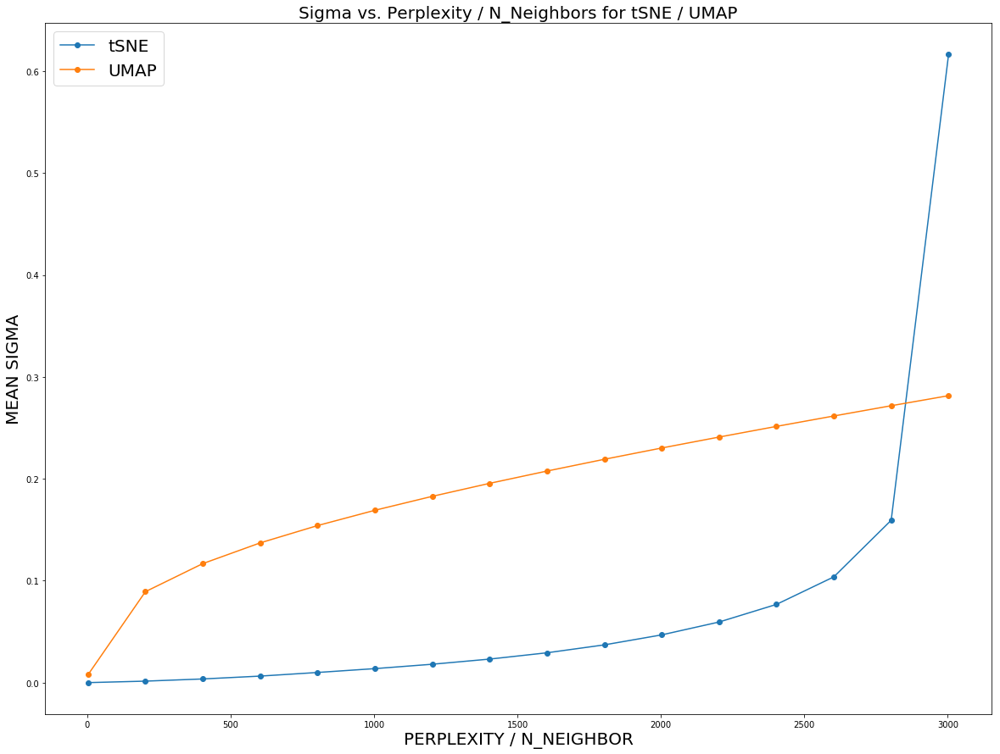

In [36]:
plt.figure(figsize=(20, 15))

plt.plot(my_perp, my_sigma_tSNE_mod, '-o')
plt.plot(my_n_neighbor, my_sigma_umap, '-o')

plt.gca().legend(('tSNE','UMAP'), fontsize = 20)
plt.title("Sigma vs. Perplexity / N_Neighbors for tSNE / UMAP", fontsize = 20)
plt.xlabel("PERPLEXITY / N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

Increaseing the bandwidth yperparameter helped to put UMAP's and tSNE's mean sigma on the same scale for the World Map data set, however the main conclusion about logarithmic grows of the mean sigma as a function of n_neighbor remains the same. I.e. UMAP's mean sigma is less sensitive towards increasing n_neighbor than tSNE's mean sigma towards perplexity. UMAP's mean sigma does not diverge hyperbolically when n_neighbors approaches the samples sixe of the data set, in contrast to tSNE's mean sigma that jumps to infinity at perplexity equal to the sample size.

Let us now see how the above mean sigma vs. n_neighbor / perplexity dependence looks for the World Map embedded into the Swiss Roll 3D non-linear manifold.

In [5]:
z_3d = X[:, 1]
x_3d = X[:, 0] * np.cos(X[:, 0]*10)
y_3d = X[:, 0] * np.sin(X[:, 0]*10)

X_swiss_roll = np.array([x_3d, y_3d, z_3d]).T
X_swiss_roll.shape

(3023, 3)


This data set contains 3023 samples

Dimensions of the  data set: 
(3023, 3) (3023,)


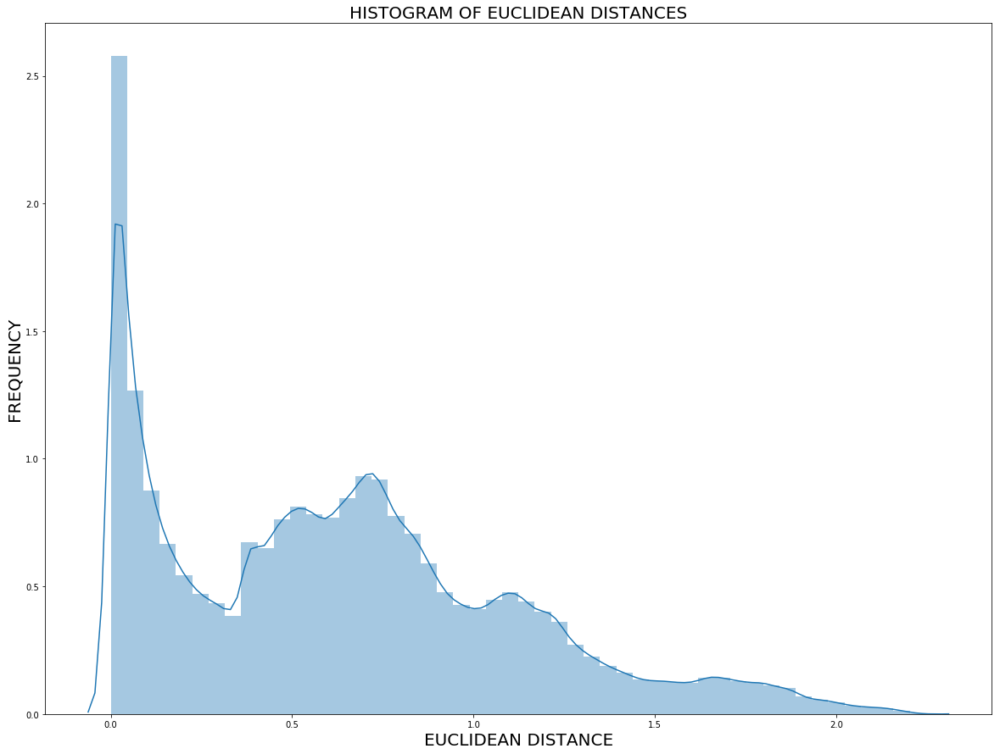

Perplexity = 3, Mean Sigma = 0.005075642102765517
Perplexity = 203, Mean Sigma = 0.07065486876411703
Perplexity = 403, Mean Sigma = 0.11879980583834482
Perplexity = 603, Mean Sigma = 0.16706462258185292
Perplexity = 803, Mean Sigma = 0.21617364457534552
Perplexity = 1003, Mean Sigma = 0.2646946252437368
Perplexity = 1203, Mean Sigma = 0.30373943352833355
Perplexity = 1403, Mean Sigma = 0.3379745432922787
Perplexity = 1603, Mean Sigma = 0.3708556437389842
Perplexity = 1803, Mean Sigma = 0.4045866279463243
Perplexity = 2003, Mean Sigma = 0.44117264111941906
Perplexity = 2203, Mean Sigma = 0.4833387374246984
Perplexity = 2403, Mean Sigma = 0.5356788319781093
Perplexity = 2603, Mean Sigma = 0.6086218250614107
Perplexity = 2803, Mean Sigma = 0.7365359559660118
Perplexity = 3003, Mean Sigma = 1.3994935566015367


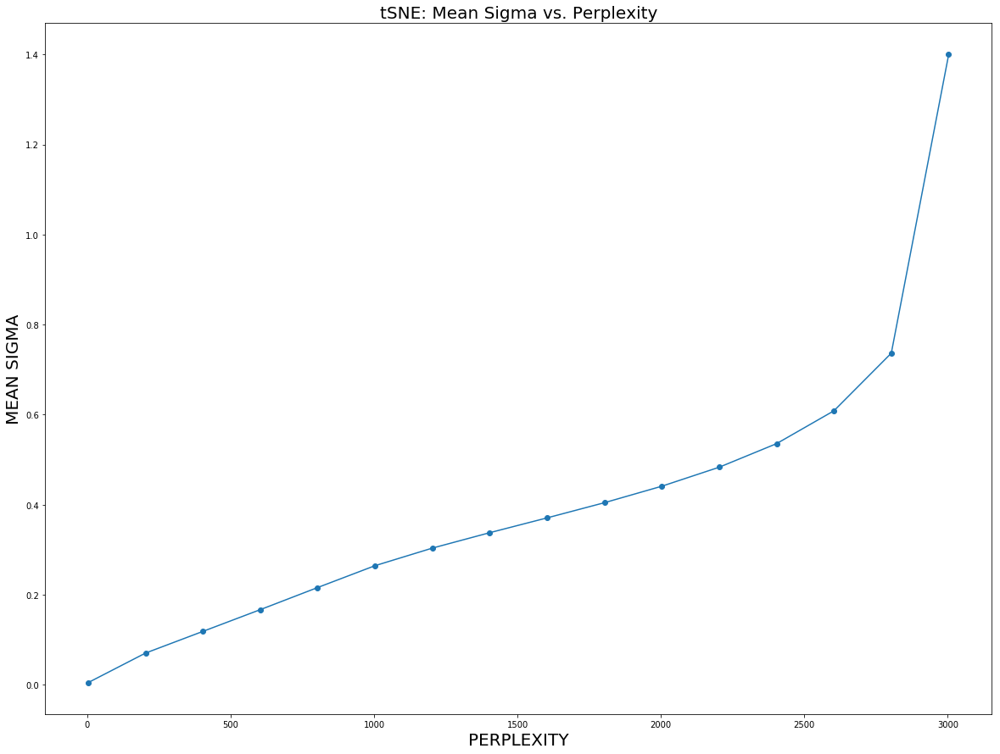

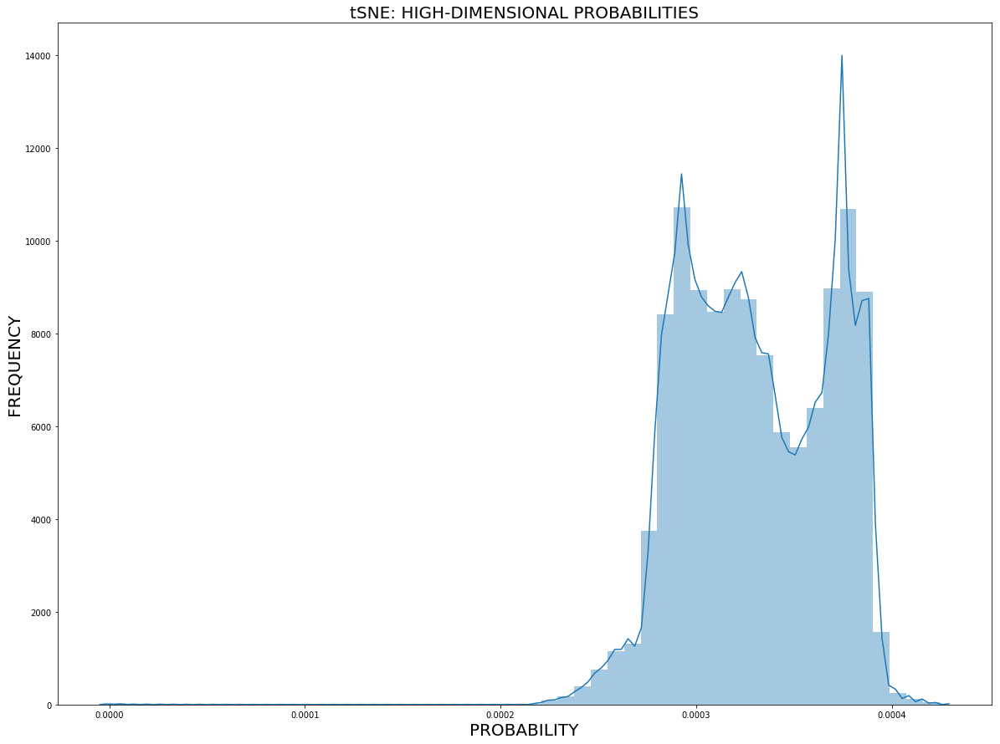

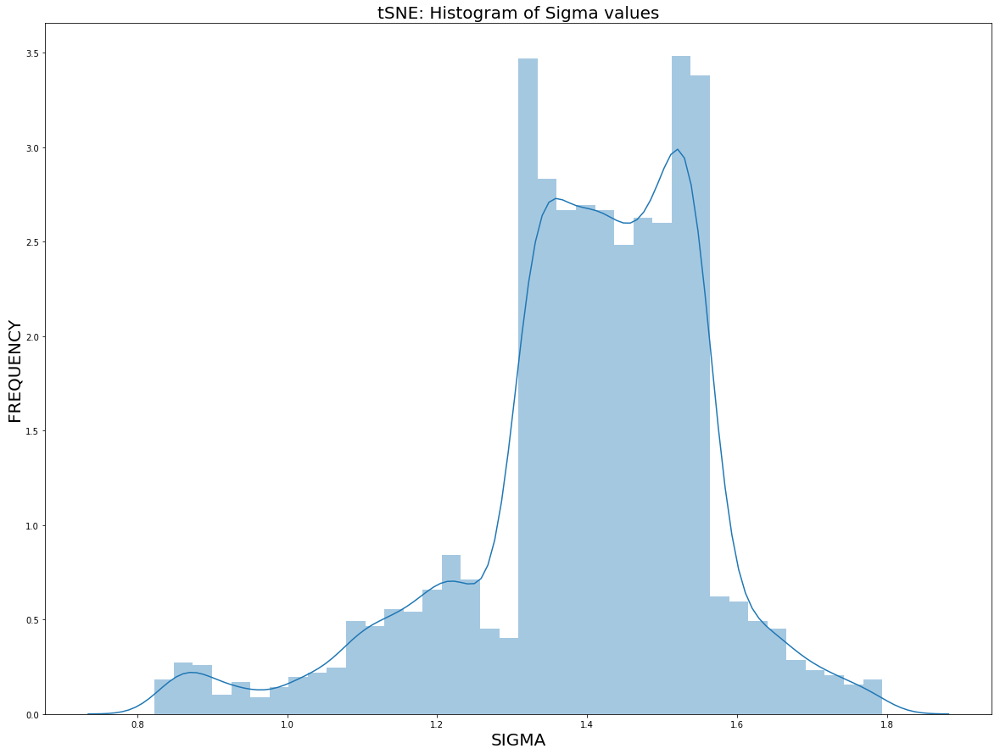

In [7]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances

import warnings
warnings.filterwarnings("ignore")

X_train = X_swiss_roll
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = y
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)

dist = np.square(euclidean_distances(X_train, X_train))

plt.figure(figsize = (20,15))
sns.distplot(dist.reshape(-1,1))
plt.title("HISTOGRAM OF EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

def prob_high_dim(sigma, dist_row):
    exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
    exp_distance[dist_row] = 0
    prob_not_symmetr = exp_distance / np.sum(exp_distance)
    return prob_not_symmetr

def perplexity(prob):
    return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))

def sigma_binary_search(perp_of_sigma, fixed_perplexity):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if perp_of_sigma(approx_sigma) < fixed_perplexity:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

my_perp = []; my_sigma_tSNE = []
for PERPLEXITY in range(3, X_train.shape[0], 200):
    
    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, PERPLEXITY)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        
    print("Perplexity = {0}, Mean Sigma = {1}".format(PERPLEXITY, np.mean(sigma_array)))
    
    my_perp.append(PERPLEXITY)
    my_sigma_tSNE.append(np.mean(sigma_array))
    
plt.figure(figsize = (20,15))
plt.plot(my_perp, my_sigma_tSNE, '-o')
plt.title("tSNE: Mean Sigma vs. Perplexity", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
sns.distplot(prob.reshape(-1,1))
plt.title("tSNE: HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
sns.distplot(sigma_array)
plt.title("tSNE: Histogram of Sigma values", fontsize = 20)
plt.xlabel("SIGMA", fontsize = 20)
plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

Now let us see how mean sigma vs. n_neighbors looks like for UMAP performing on the Swiss Roll embedded 3D data set:


This data set contains 3023 samples

Dimensions of the  data set: 
(3023, 3) (3023,)


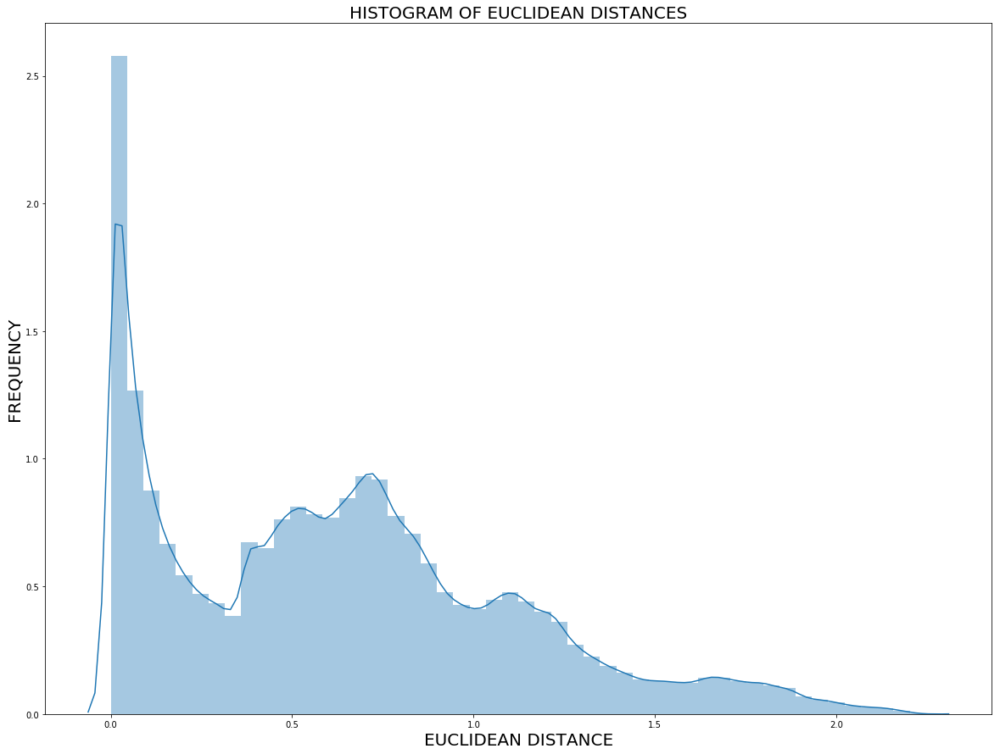

N_neighbor = 3, Mean Sigma = 0.06032534241873501
N_neighbor = 203, Mean Sigma = 0.7439154960286566
N_neighbor = 403, Mean Sigma = 0.9513407640018646
N_neighbor = 603, Mean Sigma = 1.1034586001341602
N_neighbor = 803, Mean Sigma = 1.2302408145825041
N_neighbor = 1003, Mean Sigma = 1.34216930706139
N_neighbor = 1203, Mean Sigma = 1.4442657738224072
N_neighbor = 1403, Mean Sigma = 1.539328458724809
N_neighbor = 1603, Mean Sigma = 1.629156818699056
N_neighbor = 1803, Mean Sigma = 1.7149364005797674
N_neighbor = 2003, Mean Sigma = 1.7975246594751113
N_neighbor = 2203, Mean Sigma = 1.8775184699489784
N_neighbor = 2403, Mean Sigma = 1.9554314217423903
N_neighbor = 2603, Mean Sigma = 2.0316061183312377
N_neighbor = 2803, Mean Sigma = 2.1063788537351336
N_neighbor = 3003, Mean Sigma = 2.179955316228737


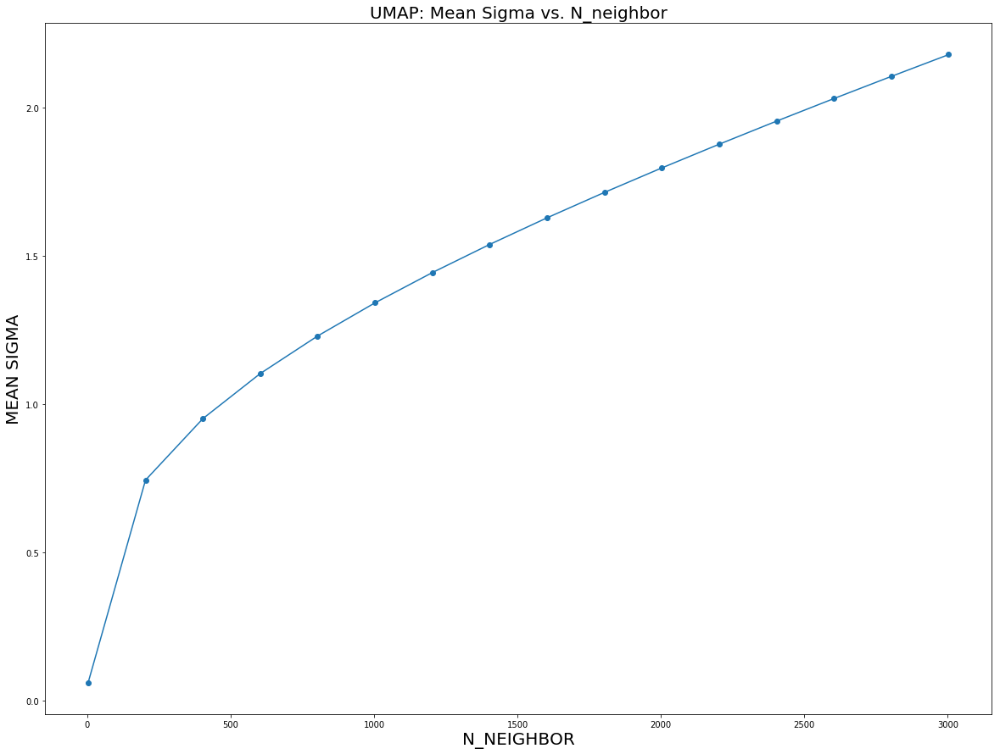

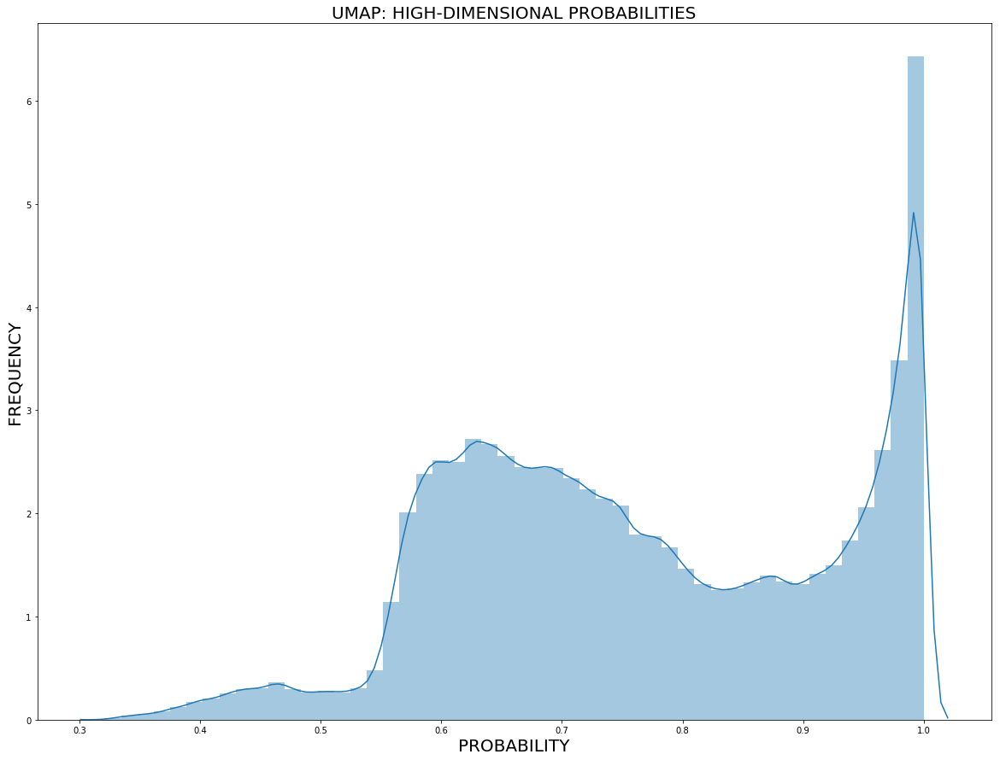

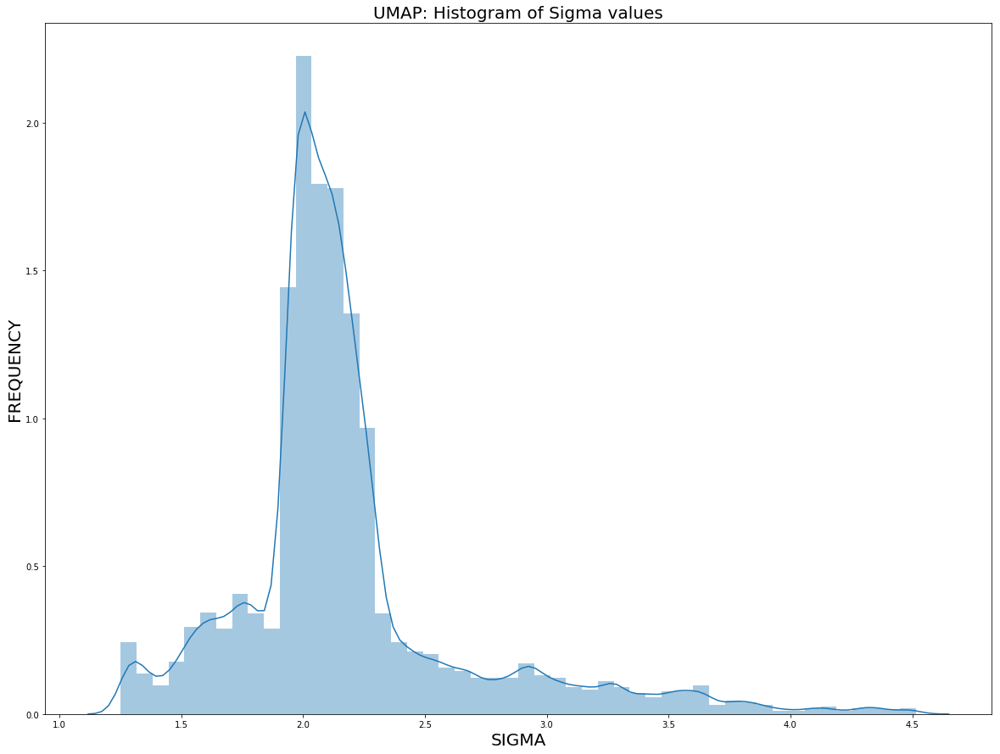

In [9]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances

import warnings
warnings.filterwarnings("ignore")

X_train = X_swiss_roll
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = y
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)

BANDWIDTH = 200

dist = np.square(euclidean_distances(X_train, X_train))
rho = [sorted(dist[i])[1] for i in range(dist.shape[0])]

plt.figure(figsize = (20,15))
sns.distplot(dist.reshape(-1,1))
plt.title("HISTOGRAM OF EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

def prob_high_dim(sigma, dist_row):
    d = dist[dist_row] - rho[dist_row]
    d[d < 0] = 0
    return np.exp(- d / sigma)

def k(prob):
    return np.power(2, np.sum(prob) / BANDWIDTH)

def sigma_binary_search(k_of_sigma, fixed_k):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if k_of_sigma(approx_sigma) < fixed_k:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_k - k_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

my_n_neighbor = []; my_sigma_umap = []
for N_NEIGHBOR in range(3, X_train.shape[0], 200):

    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: k(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, N_NEIGHBOR)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        
    print("N_neighbor = {0}, Mean Sigma = {1}".format(N_NEIGHBOR, np.mean(sigma_array)))
    
    my_n_neighbor.append(N_NEIGHBOR)
    my_sigma_umap.append(np.mean(sigma_array))
        
plt.figure(figsize = (20,15))
plt.plot(my_n_neighbor, my_sigma_umap, '-o')
plt.title("UMAP: Mean Sigma vs. N_neighbor", fontsize = 20)
plt.xlabel("N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
sns.distplot(prob.reshape(-1,1))
plt.title("UMAP: HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
sns.distplot(sigma_array)
plt.title("UMAP: Histogram of Sigma values", fontsize = 20)
plt.xlabel("SIGMA", fontsize = 20)
plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

In [10]:
my_sigma_tSNE_mod = [2*(i**2) for i in my_sigma_tSNE]

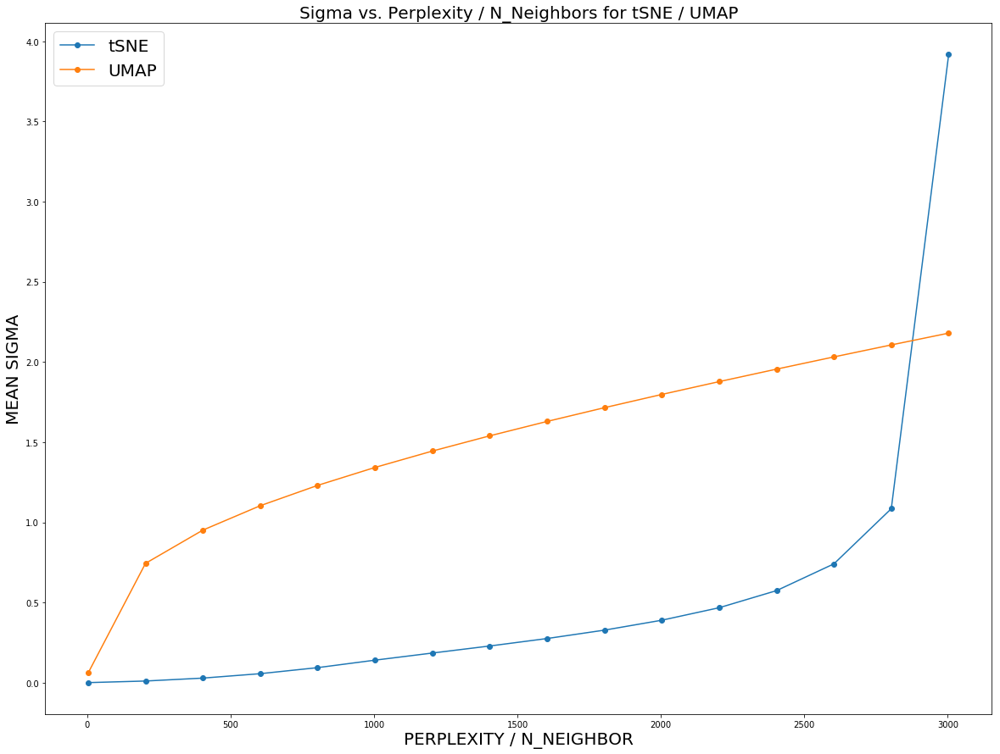

In [11]:
plt.figure(figsize=(20, 15))

plt.plot(my_perp, my_sigma_tSNE_mod, '-o')
plt.plot(my_n_neighbor, my_sigma_umap, '-o')

plt.gca().legend(('tSNE','UMAP'), fontsize = 20)
plt.title("Sigma vs. Perplexity / N_Neighbors for tSNE / UMAP", fontsize = 20)
plt.xlabel("PERPLEXITY / N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

Again we see similar things for 3D data as for the 2D, the non-linear embedding into the Swiss Roll did not seem to change much in sense of mean sigma vs. perplexity / n_neighbor dependence. We had to use the bandwidth = 200 hyperparameter in order to be able to compare mean sigma for tSNE with mean sigma for UMAP on a similar scale.

### Looking at Gradients and Compare them with Initialization

Here we will try to understand the limit of high perplexity for tSNE and n_neighbors for UMAP. More specifically we will invistigate how much gradients in the gradient descent influence the initialization coordinates. For this purpose we again are going to use the syntetic World's Map data set where we know the ground truth, i.e. how far from each other and in which order continents are clocated on the map. We embed the World's Map into 3D non-linear manifold which is the Swiss Roll and compare tSNE vs. UMAP for the quality of the original data reconstruction.

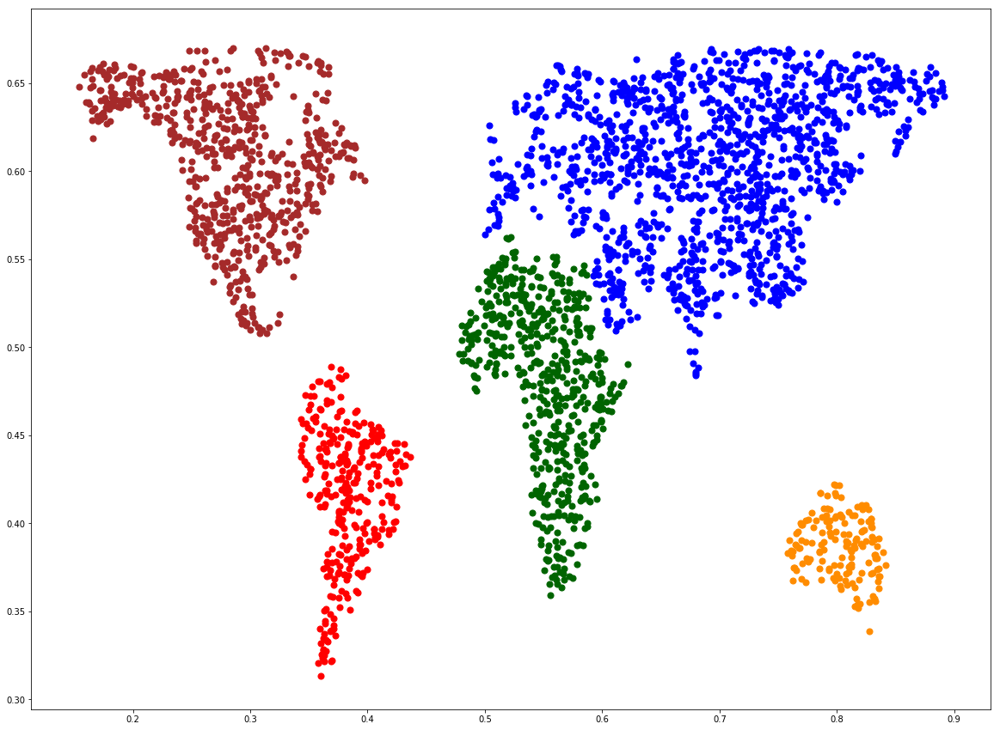

In [2]:
import cartopy
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from skimage.io import imread
import cartopy.io.shapereader as shpreader

shapename = 'admin_0_countries'
countries_shp = shpreader.natural_earth(resolution='110m',
                                        category='cultural', name=shapename)

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    #print(country.attributes['NAME_LONG'])
    if country.attributes['NAME_LONG'] in ['United States','Canada', 'Mexico']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('NorthAmerica.png')
plt.close()
        
plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Brazil','Argentina', 'Peru', 'Uruguay', 'Venezuela', 
                                           'Columbia', 'Bolivia', 'Colombia', 'Ecuador', 'Paraguay']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('SouthAmerica.png')
plt.close()

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Australia']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Australia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Russian Federation', 'China', 'India', 'Kazakhstan', 'Mongolia', 
                                          'France', 'Germany', 'Spain', 'Ukraine', 'Turkey', 'Sweden', 
                                           'Finland', 'Denmark', 'Greece', 'Poland', 'Belarus', 'Norway', 
                                           'Italy', 'Iran', 'Pakistan', 'Afganistan', 'Iraq', 'Bulgaria', 
                                           'Romania', 'Turkmenistan', 'Uzbekistan' 'Austria', 'Ireland', 
                                           'United Kingdom', 'Saudi Arabia', 'Hungary']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Eurasia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Libya', 'Algeria', 'Niger', 'Marocco', 'Egypt', 'Sudan', 'Chad',
                                           'Democratic Republic of the Congo', 'Somalia', 'Kenya', 'Ethiopia', 
                                           'The Gambia', 'Nigeria', 'Cameroon', 'Ghana', 'Guinea', 'Guinea-Bissau',
                                           'Liberia', 'Sierra Leone', 'Burkina Faso', 'Central African Republic', 
                                           'Republic of the Congo', 'Gabon', 'Equatorial Guinea', 'Zambia', 
                                           'Malawi', 'Mozambique', 'Angola', 'Burundi', 'South Africa', 
                                           'South Sudan', 'Somaliland', 'Uganda', 'Rwanda', 'Zimbabwe', 'Tanzania',
                                           'Botswana', 'Namibia', 'Senegal', 'Mali', 'Mauritania', 'Benin', 
                                           'Nigeria', 'Cameroon']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Africa.png')
plt.close()


rng = np.random.RandomState(123)
plt.figure(figsize = (20,15))

N_NorthAmerica = 10000
data_NorthAmerica = imread('NorthAmerica.png')[::-1, :, 0].T
X_NorthAmerica = rng.rand(4 * N_NorthAmerica, 2)
i, j = (X_NorthAmerica * data_NorthAmerica.shape).astype(int).T
X_NorthAmerica = X_NorthAmerica[data_NorthAmerica[i, j] < 1]
X_NorthAmerica = X_NorthAmerica[X_NorthAmerica[:, 1]<0.67]
y_NorthAmerica = np.array(['brown']*X_NorthAmerica.shape[0])
plt.scatter(X_NorthAmerica[:, 0], X_NorthAmerica[:, 1], c = 'brown', s = 50)

N_SouthAmerica = 10000
data_SouthAmerica = imread('SouthAmerica.png')[::-1, :, 0].T
X_SouthAmerica = rng.rand(4 * N_SouthAmerica, 2)
i, j = (X_SouthAmerica * data_SouthAmerica.shape).astype(int).T
X_SouthAmerica = X_SouthAmerica[data_SouthAmerica[i, j] < 1]
y_SouthAmerica = np.array(['red']*X_SouthAmerica.shape[0])
plt.scatter(X_SouthAmerica[:, 0], X_SouthAmerica[:, 1], c = 'red', s = 50)

N_Australia = 10000
data_Australia = imread('Australia.png')[::-1, :, 0].T
X_Australia = rng.rand(4 * N_Australia, 2)
i, j = (X_Australia * data_Australia.shape).astype(int).T
X_Australia = X_Australia[data_Australia[i, j] < 1]
y_Australia = np.array(['darkorange']*X_Australia.shape[0])
plt.scatter(X_Australia[:, 0], X_Australia[:, 1], c = 'darkorange', s = 50)

N_Eurasia = 10000
data_Eurasia = imread('Eurasia.png')[::-1, :, 0].T
X_Eurasia = rng.rand(4 * N_Eurasia, 2)
i, j = (X_Eurasia * data_Eurasia.shape).astype(int).T
X_Eurasia = X_Eurasia[data_Eurasia[i, j] < 1]
X_Eurasia = X_Eurasia[X_Eurasia[:, 0]>0.5]
X_Eurasia = X_Eurasia[X_Eurasia[:, 1]<0.67]
y_Eurasia = np.array(['blue']*X_Eurasia.shape[0])
plt.scatter(X_Eurasia[:, 0], X_Eurasia[:, 1], c = 'blue', s = 50)

N_Africa = 10000
data_Africa = imread('Africa.png')[::-1, :, 0].T
X_Africa = rng.rand(4 * N_Africa, 2)
i, j = (X_Africa * data_Africa.shape).astype(int).T
X_Africa = X_Africa[data_Africa[i, j] < 1]
y_Africa = np.array(['darkgreen']*X_Africa.shape[0])
plt.scatter(X_Africa[:, 0], X_Africa[:, 1], c = 'darkgreen', s = 50)

plt.show()

In [3]:
X = np.vstack((X_NorthAmerica, X_SouthAmerica, X_Australia, X_Eurasia, X_Africa))
y = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa))
print(X.shape)
print(y.shape)

(3023, 2)
(3023,)


Here we create the 3D Swiss Roll embedding of the World's Map data points. The internal dimensionality of the data is still 2D, therefore a good dimension reduction algorithms should be able to reconstruct the original World's Map.

In [4]:
z_3d = X[:, 1]
x_3d = X[:, 0] * np.cos(X[:, 0]*10)
y_3d = X[:, 0] * np.sin(X[:, 0]*10)

X_swiss_roll = np.array([x_3d, y_3d, z_3d]).T
X_swiss_roll.shape

(3023, 3)

Let us test how well tSNE can reconstruct the original 2D World's Map embedded into the 3D Swiss Roll. For this purpose, we will be gradually increasing the Perplexity value in order to **check the hypothesis that tSNE is capable of reconstructing original data at large enough perplexities**.

Performing tSNE for Perplexity = 50
Performing tSNE for Perplexity = 500
Performing tSNE for Perplexity = 1000
Performing tSNE for Perplexity = 2000


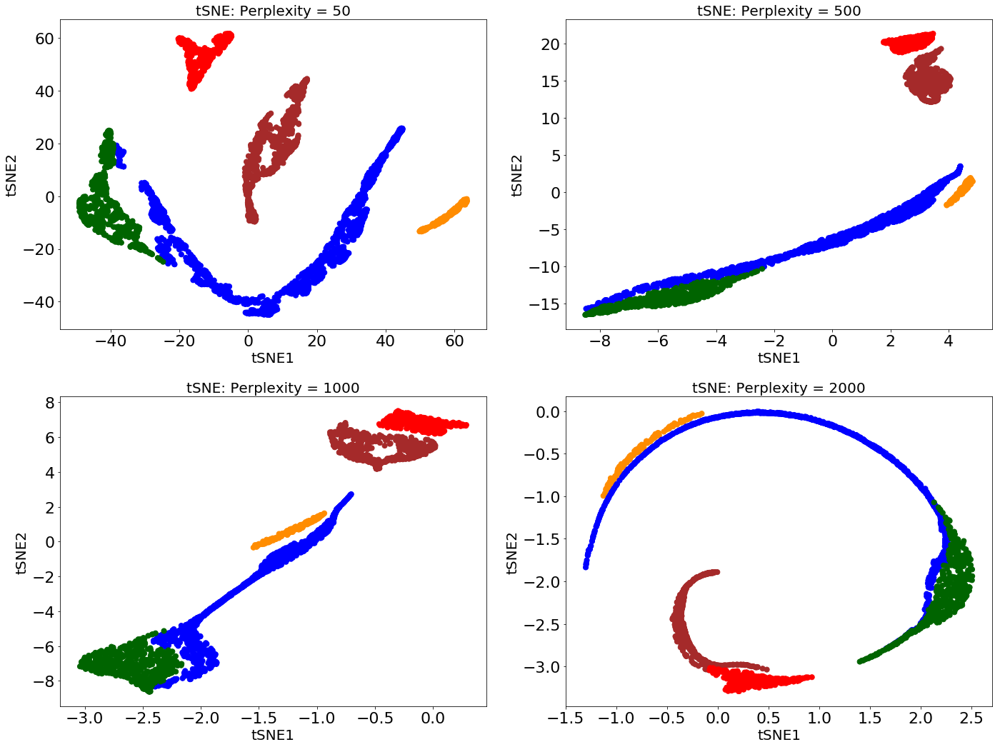

In [16]:
import matplotlib
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings("ignore")

figure = plt.figure(figsize = (20, 15))
matplotlib.rcParams.update({'font.size': 22})

X_swiss_roll_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)

for perplexity_index, perplexity in enumerate([50, 500, 1000, 2000]):
    print('Performing tSNE for Perplexity = {}'.format(perplexity))
    model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = perplexity, 
                 init = X_swiss_roll_reduced, n_iter = 1000, verbose = 0)
    tsne = model.fit_transform(X_swiss_roll)

    plt.subplot(221 + perplexity_index)
    plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
    plt.title('tSNE: Perplexity = {}'.format(perplexity), fontsize = 20) 
    plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)

figure.tight_layout()
plt.show()

Despite the hypothesis, we can see that increasing perplexity values actually decrease the quality of the original data reconstruction. At perplexity = 50, the World's Map looks distorted but fair enough, while at perplexities = 500 and 1000, the World's Map becomes unreasonable elongated and the order of the continents is not preserved any more. **The most astonishing picture we observe at perplexity = 2000, here the World Map look like an archimedian spiral, i.e. very similar to the PCA reconstruction.** The algorithm obviously has problems with convergence, however even increasing learning rate and number of iteration did not help at all, you are welcome to check it. Here we confirm our old suspicion that gradients in the tSNE algorithm become close to zero at large perplexity, so the algorithm does not really improve the original PCA initialization. **So if one runs tSNE with a PCA initialization and increases the perplexity, one ends up with nothing else than PCA**. Let us check if UMAP can do it better at large n_neighbor hyperparameter values.

Performing UMAP for n_neighbours = 50
Performing UMAP for n_neighbours = 500
Performing UMAP for n_neighbours = 1000
Performing UMAP for n_neighbours = 2000


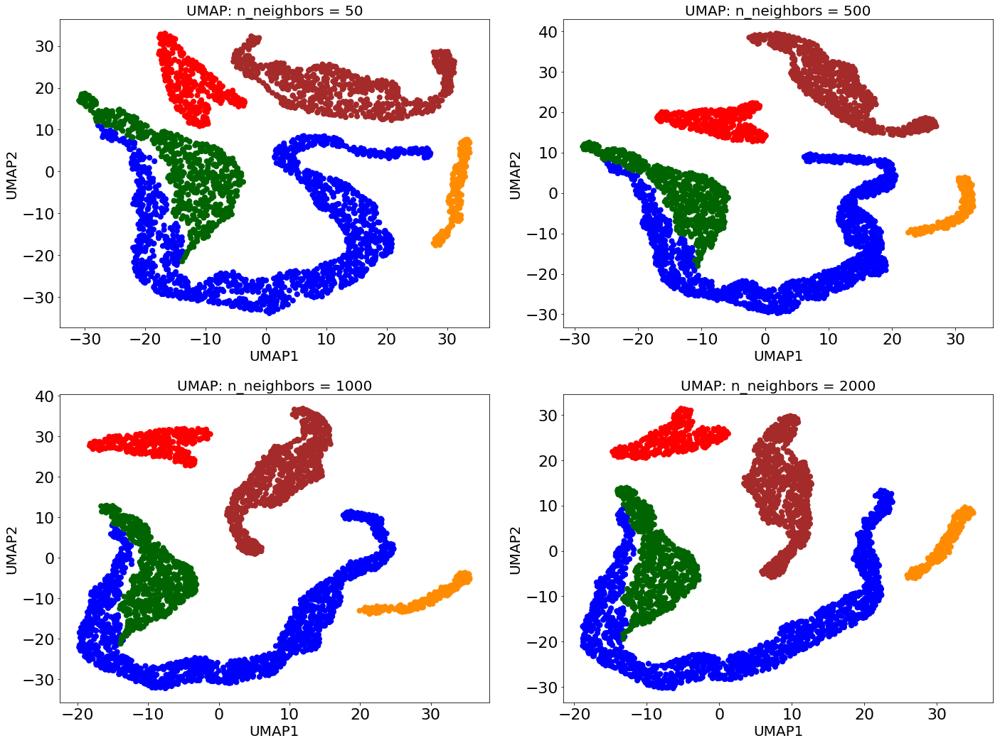

In [12]:
import matplotlib
from umap import UMAP
from sklearn.decomposition import PCA

import warnings
warnings.filterwarnings("ignore")

figure = plt.figure(figsize = (20, 15))
matplotlib.rcParams.update({'font.size': 22})

X_swiss_roll_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)

for n_neighbors_index, n_neighbors in enumerate([50, 500, 1000, 2000]):
    print('Performing UMAP for n_neighbors = {}'.format(n_neighbors))
    model = UMAP(learning_rate = 1, n_components = 2, min_dist = 2, n_neighbors = n_neighbors, 
                 init = X_swiss_roll_reduced, n_epochs = 1000, verbose = 0, spread = 2)
    umap = model.fit_transform(X_swiss_roll)

    plt.subplot(221 + n_neighbors_index)
    plt.scatter(umap[:, 0], umap[:, 1], c = y, s = 50)
    plt.title('UMAP: n_neighbors = {}'.format(n_neighbors), fontsize = 20) 
    plt.xlabel("UMAP1", fontsize = 20); plt.ylabel("UMAP2", fontsize = 20)

figure.tight_layout()
plt.show()

Here we can see that UMAP is not particularly sensitive to the n_neighbor hyperparameter value, the UMAP visulaizations for n_neighbor = 50, 500, 1000 and 2000 are fairly comparable. This again confirms what we have learnt about sigma(n_neighbor) logarithmic dependence for UMAP, i.e. sigma does not reach large values even if one dramatically increases n_neighbor.

Let us plot how gradient of tSNE changes with increasing perplexity and prove that it becomes negligible compared to the initialization contribution into the gradient descent rule. We will use only gradients at the beginning of optimization, as this is where major changes happen, for simplicity we select a gradient after 50 iterations.

[t-SNE] Computing 2251 nearest neighbors...
[t-SNE] Indexed 3023 samples in 0.000s...
[t-SNE] Computed neighbors for 3023 samples in 0.791s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3023
[t-SNE] Computed conditional probabilities for sample 2000 / 3023
[t-SNE] Computed conditional probabilities for sample 3000 / 3023
[t-SNE] Computed conditional probabilities for sample 3023 / 3023
[t-SNE] Mean sigma: 0.272962
[t-SNE] Computed conditional probabilities in 3.360s
[t-SNE] Iteration 50: error = 40.9814262, gradient norm = 0.0040186 (50 iterations in 3.489s)
[t-SNE] Iteration 100: error = 40.9009171, gradient norm = 0.0004998 (50 iterations in 3.425s)
[t-SNE] Iteration 150: error = 40.8984680, gradient norm = 0.0006248 (50 iterations in 4.150s)
[t-SNE] Iteration 200: error = 40.9006653, gradient norm = 0.0006895 (50 iterations in 4.122s)
[t-SNE] Iteration 250: error = 40.8998070, gradient norm = 0.0007380 (50 iterations in 4.244s)
[t-SNE] KL divergence after 250 itera

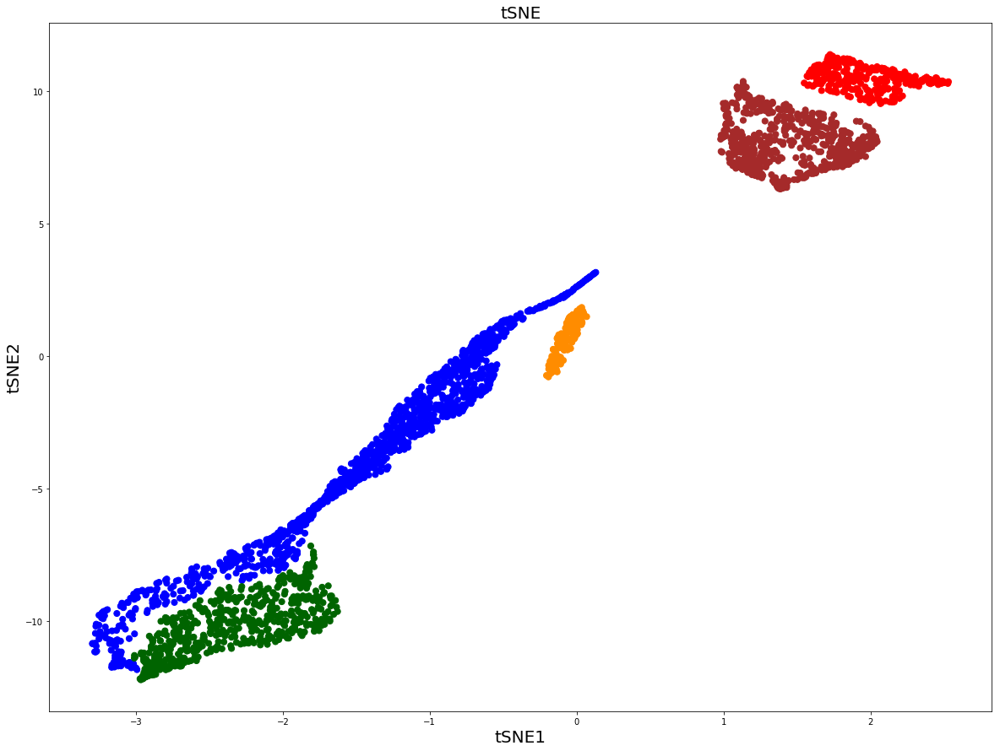

In [42]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
X_swiss_roll_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = 750, 
             init = X_swiss_roll_reduced, n_iter = 1000, verbose = 2)
tsne = model.fit_transform(X_swiss_roll)
plt.figure(figsize = (20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE', fontsize = 20); plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

In [43]:
tsne_perplexity = [3, 10, 20, 30, 50, 80, 100, 200, 500, 750, 1000, 1500, 2000]
tsne_perplexity

[3, 10, 20, 30, 50, 80, 100, 200, 500, 750, 1000, 1500, 2000]

In [44]:
tsne_gradient = [0.0785314, 0.0414363, 0.0267256, 0.0240762, 0.0189936, 0.0184264, 0.0127485, 0.0105595, 
                0.0070886, 0.0040186, 0.0004717, 0.0000006, 0.0000004]
tsne_gradient

[0.0785314,
 0.0414363,
 0.0267256,
 0.0240762,
 0.0189936,
 0.0184264,
 0.0127485,
 0.0105595,
 0.0070886,
 0.0040186,
 0.0004717,
 6e-07,
 4e-07]

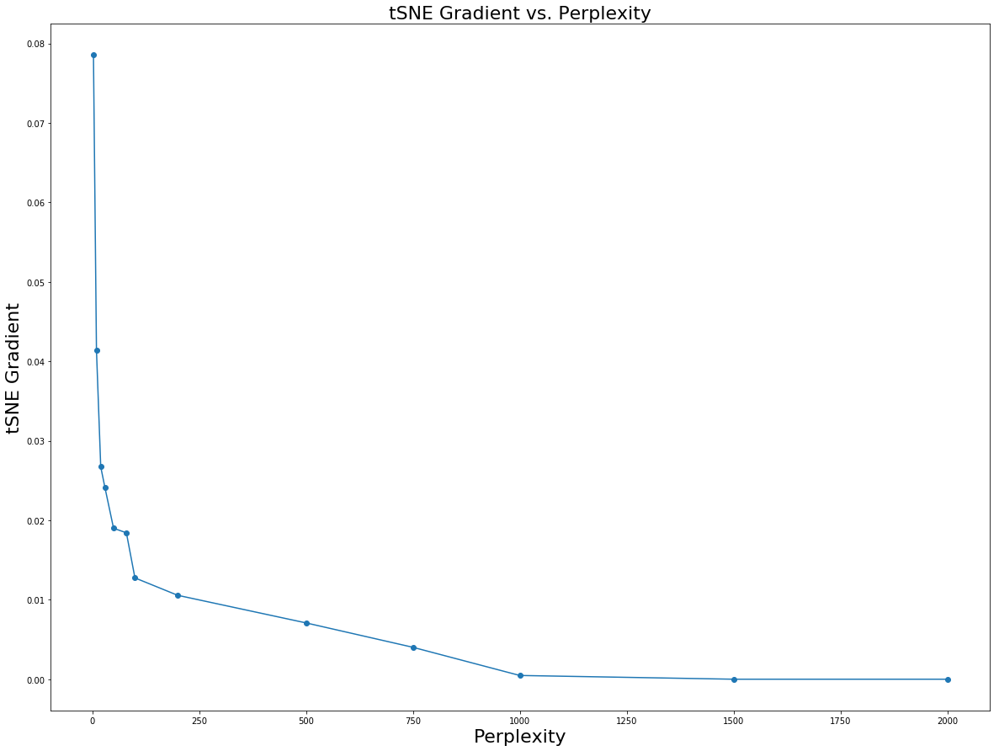

In [45]:
plt.figure(figsize = (20,15))
plt.plot(tsne_perplexity, tsne_gradient, "-o")
plt.title("tSNE Gradient vs. Perplexity", fontsize = 22)
plt.xlabel("Perplexity", fontsize = 22); plt.ylabel("tSNE Gradient", fontsize = 22)
plt.show()

                1110020A21Rik  1110046J04Rik  1190002F15Rik  1500015A07Rik
SS2_15_0048_A3            0.0            0.0            0.0            0.0
SS2_15_0048_A6            0.0            0.0            0.0            0.0
SS2_15_0048_A5            0.0            0.0            0.0            0.0
SS2_15_0048_A4            0.0            0.0            0.0            0.0

This data set contains 716 samples

Dimensions of the  data set: 
(716, 557) (716,)


Sigma binary search finished 100 of 716 cells
Sigma binary search finished 200 of 716 cells
Sigma binary search finished 300 of 716 cells
Sigma binary search finished 400 of 716 cells
Sigma binary search finished 500 of 716 cells
Sigma binary search finished 600 of 716 cells
Sigma binary search finished 700 of 716 cells

Mean sigma = 8.084936514913037
Running Gradient Descent: 

KL divergence = 1228.1195036162594
KL divergence = 1130.2023257098751


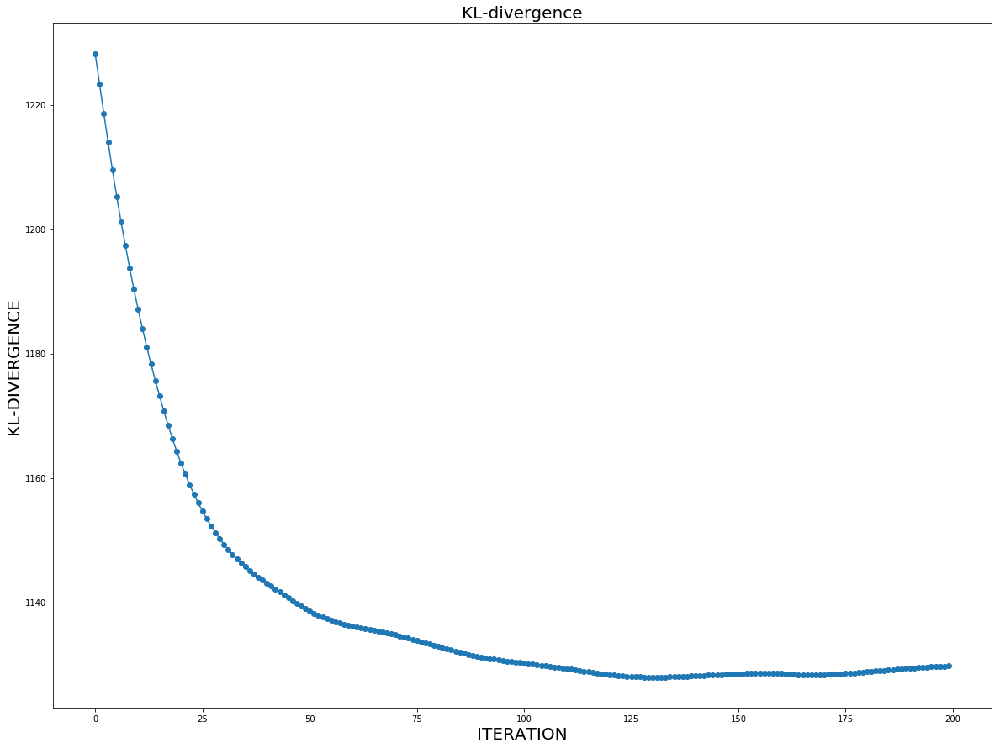

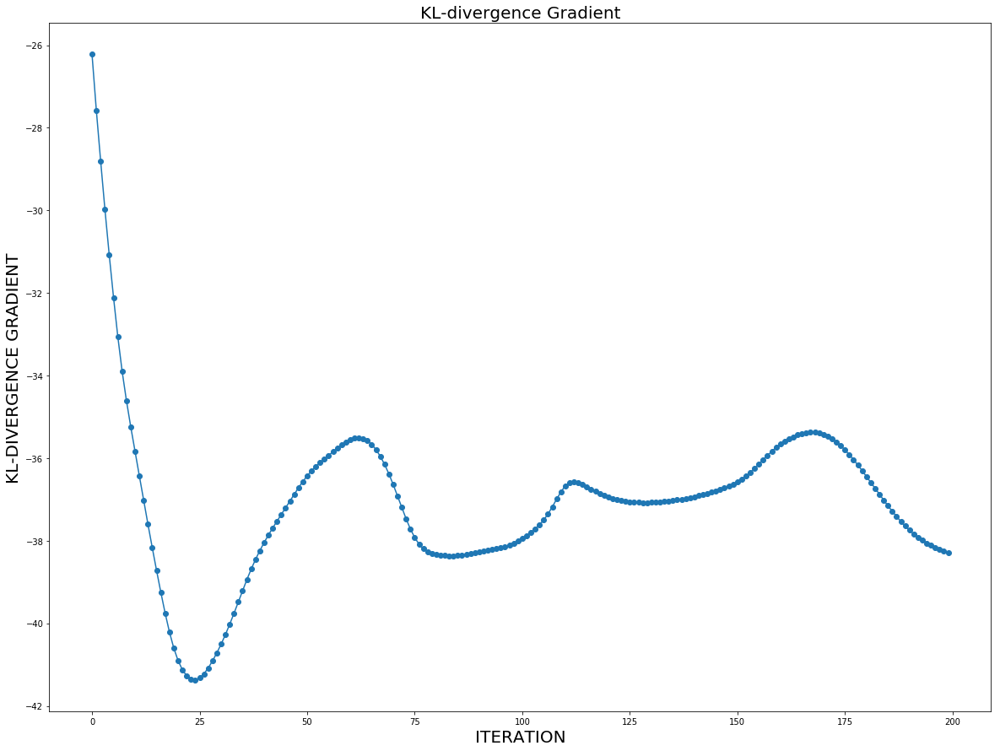

In [9]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances

N_LOW_DIMS = 2
MAX_ITER = 200
PERPLEXITY = 100
LEARNING_RATE = 0.1

path = '/home/nikolay/WABI/K_Pietras/Manifold_Learning/'
expr = pd.read_csv(path + 'bartoschek_filtered_expr_rpkm.txt', sep='\t')
print(expr.iloc[0:4,0:4])
X_train = expr.values[:,0:(expr.shape[1]-1)]; X_train = np.log(X_train + 1); n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = expr.values[:,expr.shape[1]-1]
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)
print('\n')

dist = np.square(euclidean_distances(X_train, X_train))
X_reduced = PCA(n_components = 2).fit_transform(X_train)

def prob_high_dim(sigma, dist_row):
    exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
    exp_distance[dist_row] = 0
    prob_not_symmetr = exp_distance / np.sum(exp_distance)
    return prob_not_symmetr

def perplexity(prob):
    return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))

def sigma_binary_search(perp_of_sigma, fixed_perplexity):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if perp_of_sigma(approx_sigma) < fixed_perplexity:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

prob = np.zeros((n,n)); sigma_array = []
for dist_row in range(n):
    func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
    binary_search_result = sigma_binary_search(func, PERPLEXITY)
    prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
    sigma_array.append(binary_search_result)
    if (dist_row + 1) % 100 == 0:
        print("Sigma binary search finished {0} of {1} cells".format(dist_row + 1, n))
print("\nMean sigma = " + str(np.mean(sigma_array)))

P = prob + np.transpose(prob)

def prob_low_dim(Y):
    inv_distances = np.power(1 + np.square(euclidean_distances(Y, Y)), -1)
    np.fill_diagonal(inv_distances, 0.)
    return inv_distances / np.sum(inv_distances, axis = 1, keepdims = True)

def KL(P, Y):
    Q = prob_low_dim(Y)
    return P * np.log(P + 0.01) - P * np.log(Q + 0.01)

def KL_gradient(P, Y):
    Q = prob_low_dim(Y)
    y_diff = np.expand_dims(Y, 1) - np.expand_dims(Y, 0)
    inv_dist = np.power(1 + np.square(euclidean_distances(Y, Y)), -1)
    return 4*np.sum(np.expand_dims(P - Q, 2) * y_diff * np.expand_dims(inv_dist, 2), axis = 1)

np.random.seed(12345)
#y = np.random.normal(loc = 0, scale = 1, size = (n, N_LOW_DIMS))
y = X_reduced
KL_array = []; KL_gradient_array = []
print("Running Gradient Descent: \n")
for i in range(MAX_ITER):
    y = y - LEARNING_RATE * KL_gradient(P, y)
    KL_array.append(np.sum(KL(P, y)))
    KL_gradient_array.append(np.sum(KL_gradient(P, y)))
    if i % 100 == 0:
        print("KL divergence = " + str(np.sum(KL(P, y))))
        
plt.figure(figsize=(20,15))
plt.plot(KL_array,'-o')
plt.title("KL-divergence", fontsize = 20)
plt.xlabel("ITERATION", fontsize = 20); plt.ylabel("KL-DIVERGENCE", fontsize = 20)
plt.show()

plt.figure(figsize=(20,15))
plt.plot(KL_gradient_array,'-o')
plt.title("KL-divergence Gradient", fontsize = 20)
plt.xlabel("ITERATION", fontsize = 20); plt.ylabel("KL-DIVERGENCE GRADIENT", fontsize = 20)
plt.show()

### Making SciKitLearn tSNE Agree with My Implementation of tSNE <a class="anchor" id="Making-SciKitLearn-tSNE-Agree-with-My-Implementation-of-tSNE"></a>

I am a bit worried that the mean sigma reported by the scikitlearn implementation of tSNE is sligthly higher than the one determined in my implementation. To understand whether I have a bug in my code, I will dig into the scikitlearn and Rtsne codes. First let us run my implementation on [Cancer Associated Fibroblasts (CAFs)](https://www.nature.com/articles/s41467-018-07582-3) scRNAseq data set:

In [2]:
import numpy as np; import pandas as pd; import seaborn as sns
from sklearn.metrics.pairwise import euclidean_distances; import matplotlib.pyplot as plt

path = '/home/nikolay/WABI/K_Pietras/Manifold_Learning/'
expr = pd.read_csv(path + 'bartoschek_filtered_expr_rpkm.txt', sep='\t')
print(expr.iloc[0:4,0:4])
X_train = expr.values[:,0:(expr.shape[1]-1)]; X_train = np.log(X_train + 1); n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = expr.values[:,expr.shape[1]-1]
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)

dist = np.square(euclidean_distances(X_train, X_train))

def prob_high_dim(sigma, dist_row):
        exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
        exp_distance[dist_row] = 0
        prob_not_symmetr = exp_distance / np.sum(exp_distance)
        return prob_not_symmetr

def perplexity(prob):
    return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))

def sigma_binary_search(perp_of_sigma, fixed_perplexity):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if perp_of_sigma(approx_sigma) < fixed_perplexity:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

PERPLEXITY = 30
prob = np.zeros((n,n)); sigma_array = []
for dist_row in range(n):
    func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
    binary_search_result = sigma_binary_search(func, PERPLEXITY)
    prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
    sigma_array.append(binary_search_result)
        
print("Perplexity = {0}, Mean Sigma = {1}".format(PERPLEXITY, np.mean(sigma_array)))

                1110020A21Rik  1110046J04Rik  1190002F15Rik  1500015A07Rik
SS2_15_0048_A3            0.0            0.0            0.0            0.0
SS2_15_0048_A6            0.0            0.0            0.0            0.0
SS2_15_0048_A5            0.0            0.0            0.0            0.0
SS2_15_0048_A4            0.0            0.0            0.0            0.0

This data set contains 716 samples

Dimensions of the  data set: 
(716, 557) (716,)
Perplexity = 30, Mean Sigma = 6.374859943070225


As we can see, the mean sigma parameter is equal to 6.37 for Perplexity = 30. However, when we run the scikitlearn implementation of tSNE we get mean sigma equal to 7.54 for the same preplexity, see below:

In [16]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
X_reduced = PCA(n_components = 2).fit_transform(X_train)
model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = 30, 
             init = X_reduced, n_iter = 1000, method = 'exact', verbose = 2)
tsne = model.fit_transform(X_train)

[t-SNE] Computing pairwise distances...
[t-SNE] Computed conditional probabilities for sample 716 / 716
[t-SNE] Mean sigma: 7.540113
[t-SNE] Iteration 50: error = 79.5732811, gradient norm = 0.3724284 (50 iterations in 0.635s)
[t-SNE] Iteration 100: error = 81.5138310, gradient norm = 0.3666290 (50 iterations in 0.664s)
[t-SNE] Iteration 150: error = 82.5920636, gradient norm = 0.3353633 (50 iterations in 0.685s)
[t-SNE] Iteration 200: error = 81.7540246, gradient norm = 0.3565094 (50 iterations in 0.692s)
[t-SNE] Iteration 250: error = 83.2222226, gradient norm = 0.3301316 (50 iterations in 0.681s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 83.222223
[t-SNE] Iteration 300: error = 1.7064036, gradient norm = 0.0037092 (50 iterations in 0.668s)
[t-SNE] Iteration 350: error = 1.4779231, gradient norm = 0.0017475 (50 iterations in 0.664s)
[t-SNE] Iteration 400: error = 1.3499565, gradient norm = 0.0018632 (50 iterations in 0.666s)
[t-SNE] Iteration 450: error = 1.

This can be for eaxample because I calculate Euclidean distances somehow in a wrong way, let us see how scikitlearn calculates pairwise Euclidean distances:

In [4]:
from sklearn.metrics.pairwise import pairwise_distances
dist_X = pairwise_distances(X_train, metric = 'euclidean', squared = True)
dist_X

array([[   0.        ,  914.95016311, 1477.46836099, ..., 1058.56614432,
        3328.59582444, 1478.18928181],
       [ 914.95016311,    0.        , 1307.39294642, ...,  867.05197552,
        3044.97834743, 1376.96312866],
       [1477.46836099, 1307.39294642,    0.        , ..., 1400.74705041,
        2986.18951734, 1308.08666642],
       ...,
       [1058.56614432,  867.05197552, 1400.74705041, ...,    0.        ,
        2849.67875141, 1253.93197644],
       [3328.59582444, 3044.97834743, 2986.18951734, ..., 2849.67875141,
           0.        , 2748.92021714],
       [1478.18928181, 1376.96312866, 1308.08666642, ..., 1253.93197644,
        2748.92021714,    0.        ]])

And now compare with the pairwise Euclidean distances computed in my code:

In [5]:
dist

array([[   0.        ,  914.95016311, 1477.46836099, ..., 1058.56614432,
        3328.59582444, 1478.18928181],
       [ 914.95016311,    0.        , 1307.39294642, ...,  867.05197552,
        3044.97834743, 1376.96312866],
       [1477.46836099, 1307.39294642,    0.        , ..., 1400.74705041,
        2986.18951734, 1308.08666642],
       ...,
       [1058.56614432,  867.05197552, 1400.74705041, ...,    0.        ,
        2849.67875141, 1253.93197644],
       [3328.59582444, 3044.97834743, 2986.18951734, ..., 2849.67875141,
           0.        , 2748.92021714],
       [1478.18928181, 1376.96312866, 1308.08666642, ..., 1253.93197644,
        2748.92021714,    0.        ]])

The pairwise Euclidean distances look identical. So this is not where the discrepancy comes from. I figured out that scikitlearn calculates mean sigma via a **binary_search_perplexity** function from utils module. We can quickly reproduce the mean sigma equal to 7.54 without running the whole tSNE procedure:

In [6]:
from sklearn.manifold import _utils
conditional_P = _utils._binary_search_perplexity(np.float32(dist_X), desired_perplexity = 30, verbose = 2)

[t-SNE] Computed conditional probabilities for sample 716 / 716
[t-SNE] Mean sigma: 7.540113


I also looked at the codes of the **binary_search_perplexity** function from [here](https://github.com/scikit-learn/scikit-learn/blob/b194674c42d54b26137a456c510c5fdba1ba23e0/sklearn/manifold/_utils.pyx) and also checked the C++ implementation used by the Rtsne wrapper from [here](https://github.com/jkrijthe/Rtsne/blob/master/src/tsne.cpp). There are a few interesting discrepancies from my implementation of computing mean sigma.

First of all, scikitlearn and Rtsne use **beta**-parameter instead of sigma, where $\beta_i = 1 / (2\sigma_i^2)$, therefore $\sigma_i = \sqrt{1/(2\beta_i)}$ and $<\sigma> = \sqrt{1/(2<\beta>)}$, where $<\beta>=(1/N)\sum_i{\beta_i}\equiv (1/N)\beta_{\rm{sum}}$. MAking simple derivation we obtain: $<\sigma> = \sqrt{1/(2<\beta>)}=\sqrt{N/(2\beta_{\rm{sum}})}$. However we see that the coefficient **2** is ignored in the scikitlearn codes below at the very end. Moreover, from the definition of entropy $H=\sum_i{p_{ij}\log_2{p_{ij}}}$, however the base **2** of the logarithm is again ignored in the scikitlearn implementation and math.log, i.e. base 2.71, is used instead. In addition math.log(PERPLEXITY) is used for computing desired entropy, i.e. again base 2.71 instead of 2, while $\rm{Perplexity}=2^{\rm{entropy}}$ by definition. In summary, we obsreve quite a few discrepancies of the scikitlearn implementation from the mathematical formulation of the tSNE from Laurens vad der Maaten and Jeoffrey Hinton's original paper, therefore it looks like my implementation of computing sigma values is actually mathematically closer to the original algorithm than the scikitlearn implementation.

In [19]:
import math
my_perp = []; my_sigma = []
for PERPLEXITY in range(3, X_train.shape[0], 20):
    n_steps = 100; desired_entropy = math.log(PERPLEXITY)
    sqdistances = np.float32(dist_X)
    n_samples = sqdistances.shape[0]; n_neighbors = sqdistances.shape[1]
    PERPLEXITY_TOLERANCE = 1e-5; EPSILON_DBL = 1e-8; NPY_INFINITY = 1000
    P = np.zeros((n_samples, n_neighbors), dtype=np.float64); beta_sum = 0.0

    for i in range(n_samples):
    
        beta_min = -NPY_INFINITY; beta_max = NPY_INFINITY; beta = 1.0
        for l in range(n_steps):
            sum_Pi = 0.0
            for j in range(n_neighbors):
                if j != i or n_neighbors < n_samples:
                    P[i, j] = math.exp(-sqdistances[i, j] * beta)
                    sum_Pi += P[i, j]

            if sum_Pi == 0.0:
                sum_Pi = EPSILON_DBL
            sum_disti_Pi = 0.0

            for j in range(n_neighbors):
                P[i, j] /= sum_Pi
                sum_disti_Pi += sqdistances[i, j] * P[i, j]

            entropy = math.log(sum_Pi) + beta * sum_disti_Pi
            entropy_diff = entropy - desired_entropy

            if math.fabs(entropy_diff) <= PERPLEXITY_TOLERANCE:
                break

            if entropy_diff > 0.0:
                beta_min = beta
                if beta_max == NPY_INFINITY:
                    beta *= 2.0
                else:
                    beta = (beta + beta_max) / 2.0
            else:
                beta_max = beta
                if beta_min == -NPY_INFINITY:
                    beta /= 2.0
                else:
                    beta = (beta + beta_min) / 2.0

        beta_sum += beta

    my_perp.append(PERPLEXITY)
    my_sigma.append(np.mean(math.sqrt(n_samples / beta_sum)))
    print("Perplexity = {0}, Mean sigma: {1}".format(PERPLEXITY, np.mean(math.sqrt(n_samples / beta_sum))))

Perplexity = 3, Mean sigma: 4.651147004547775
Perplexity = 23, Mean sigma: 7.878144228295371
Perplexity = 43, Mean sigma: 8.832406082618935
Perplexity = 63, Mean sigma: 9.511747533639586
Perplexity = 83, Mean sigma: 10.077509424297272
Perplexity = 103, Mean sigma: 10.581021206265143
Perplexity = 123, Mean sigma: 11.04812020089174
Perplexity = 143, Mean sigma: 11.495192488673874
Perplexity = 163, Mean sigma: 11.933238154727839
Perplexity = 183, Mean sigma: 12.37012423974057
Perplexity = 203, Mean sigma: 12.81199926282527
Perplexity = 223, Mean sigma: 13.264106247170202
Perplexity = 243, Mean sigma: 13.731281576559637
Perplexity = 263, Mean sigma: 14.218279146146946
Perplexity = 283, Mean sigma: 14.730006300262993
Perplexity = 303, Mean sigma: 15.271664526985438
Perplexity = 323, Mean sigma: 15.848901101696448
Perplexity = 343, Mean sigma: 16.467749809473982
Perplexity = 363, Mean sigma: 17.13454200609421
Perplexity = 383, Mean sigma: 17.855525318658728
Perplexity = 403, Mean sigma: 18.6

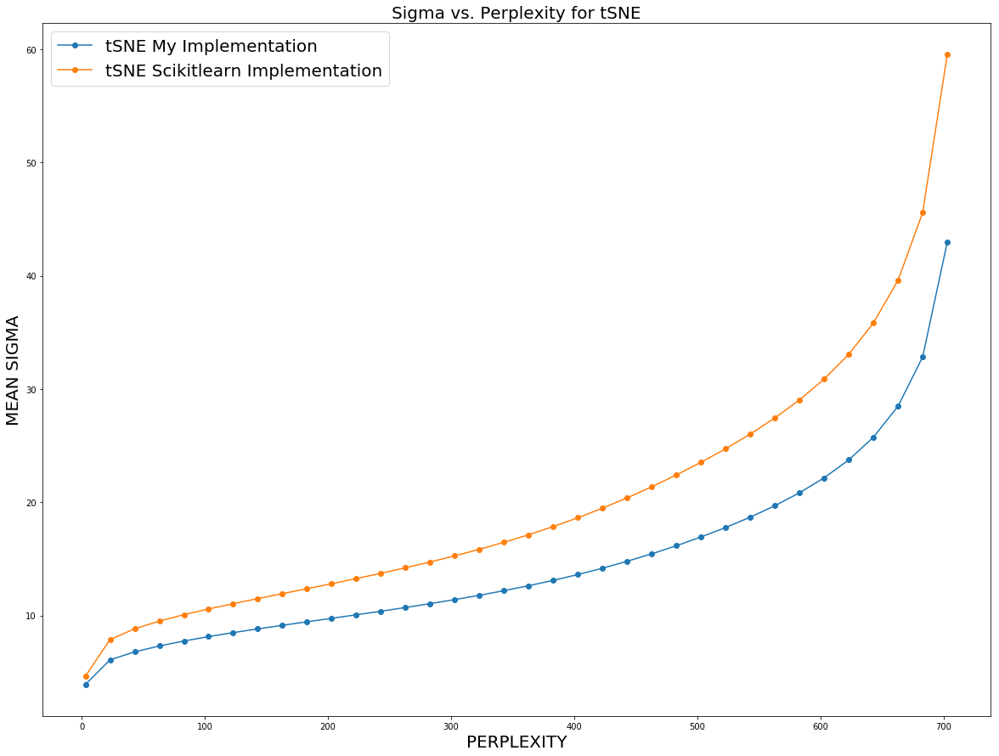

In [23]:
plt.figure(figsize=(20, 15))

plt.plot(my_perp, my_sigma_tSNE, '-o')
plt.plot(my_perp, my_sigma, '-o')

plt.gca().legend(('tSNE My Implementation','tSNE Scikitlearn Implementation'), fontsize = 20)
plt.title("Sigma vs. Perplexity for tSNE", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

Comparing how scikitlearn mean sigma and mean sigma computed in my tSNE implementation vary vs. Perplexity, we conclude that they behave very similarly quantitatively while the absolute values of the scikitlearn implementation are systematically a bit larger than the ones from my implementation of the tSNE algorithm.

### Checking that Sigma from Leland's Implementation of UMAP Agrees with Mine <a class="anchor" id="Checking-that-Sigma-from-Leland-Implementation-of-UMAP-Agrees-with-Mine"></a>

Since mean sigma is not really reported by the original implementation of UMAP from Leland McInnes, I want to dig into UMAP codes and extract mean sigma in order to compare it with the mean sigma from my implementation of UMAP. Looking at the umap_.py script, I found a function **smooth_knn_dist** that seems to perform binary search and return arrays of sigma and rho (local connectivity parameter). The input of the function is the number of nearest neighbors **k = n_neighbor** for each point.

In [56]:
from umap import umap_
sigmas_umap, rhos_umap = umap_.smooth_knn_dist(dist, k = 716, bandwidth = 20)
np.mean(sigmas_umap)

60.742850280143934

Playing with the parameters of the **smooth_knn_dist** function I noticed that the mean sigma returned does not change that much when I vary n_neighbor. However, I discovered another parameter **bandwidth** that seems to have a dramatic effect on the mean sigma. Here I demonstrate that increasing bandwidth, we can in principle make mean sigma go to infinity.

Finished computing mean sigma for bandwidth = 1
Finished computing mean sigma for bandwidth = 5
Finished computing mean sigma for bandwidth = 10
Finished computing mean sigma for bandwidth = 20


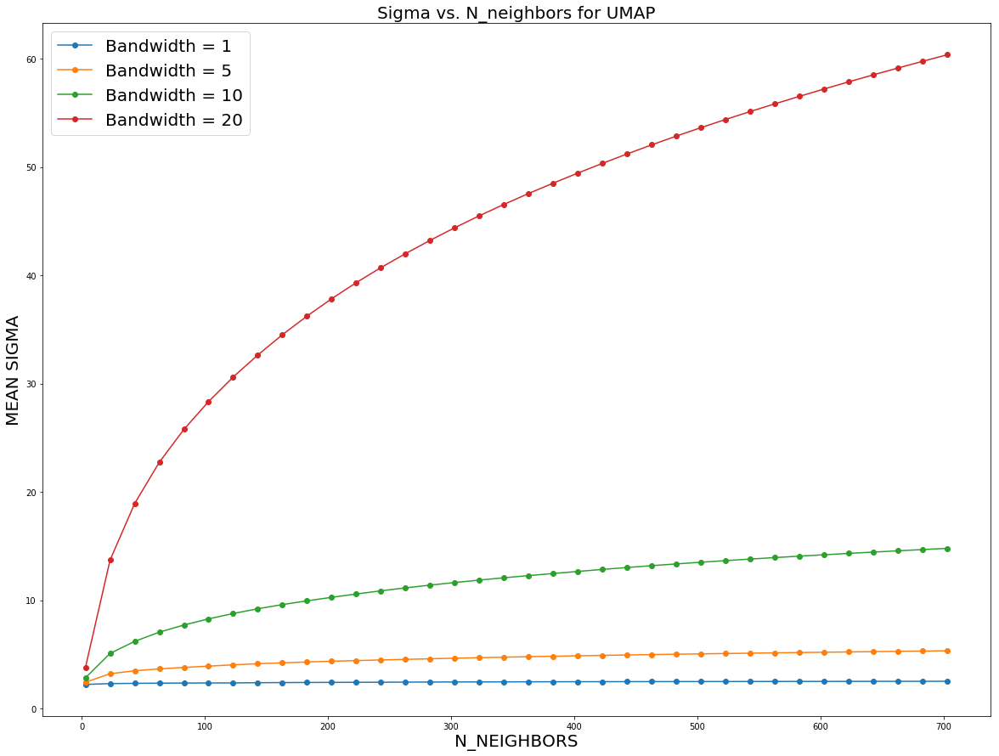

In [75]:
from umap import umap_
plt.figure(figsize=(20, 15))

my_bandwidth_n_neighbors = []
my_bandwidth_sigma_umap = []
for bandwidth in [1, 5, 10, 20]:
    my_n_neighbors = []; my_sigma_umap = []
    for n_neighbors in range(3, X_train.shape[0], 20):
        sigmas_umap, rhos_umap = umap_.smooth_knn_dist(dist, k = n_neighbors, bandwidth = bandwidth)
        my_sigma_umap.append(np.mean(sigmas_umap))
        my_n_neighbors.append(n_neighbors)
        #print("UMAP N_neighbors = {0}, UMAP Mean sigma: {1}".format(n_neighbors, np.mean(sigmas_umap)))
    my_bandwidth_sigma_umap.append(my_sigma_umap)
    my_bandwidth_n_neighbors.append(my_n_neighbors)
    print('Finished computing mean sigma for bandwidth = {}'.format(bandwidth))
    plt.plot(my_n_neighbors, my_sigma_umap, '-o')

plt.gca().legend(['Bandwidth = {}'.format(bandwidth) for bandwidth in [1, 5, 10, 20]], fontsize = 20)
plt.title("Sigma vs. N_neighbors for UMAP", fontsize = 20)
plt.xlabel("N_NEIGHBORS", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

The bandwidth parameter is connected with entropy and n_neighbors as:

$$\rm{n_{neighbors}} = 2^{\displaystyle\rm{entropy \,/\, bandwidth}}$$

Without the bandwidth parameter (or when bandwidth = 1), the perplexity or number of nearest neighbors would be given by:

$$\rm{n_{neighbors}} = 2^{\displaystyle\rm{entropy}} = 2^{\displaystyle\sum_j{p_{ij}}}$$

Therefore, the bandwidth parameter effectively increases the entropy or serves as a factor that multiplies the values of $\log_2{\rm{n_{neighbor}}}$ by bandwidth and hence raises the effective value of n_neighbor (aka perplexity) parameter.

Now, looking more carefully, we can see that the **smooth_knn_dist** function has another very important parameter **local_connectivity** that seems to affect the mean sigma a lot. Let us demonstrate it:

Finished computing mean sigma for local_connectivity = 0
Finished computing mean sigma for local_connectivity = 0.1
Finished computing mean sigma for local_connectivity = 0.5
Finished computing mean sigma for local_connectivity = 1


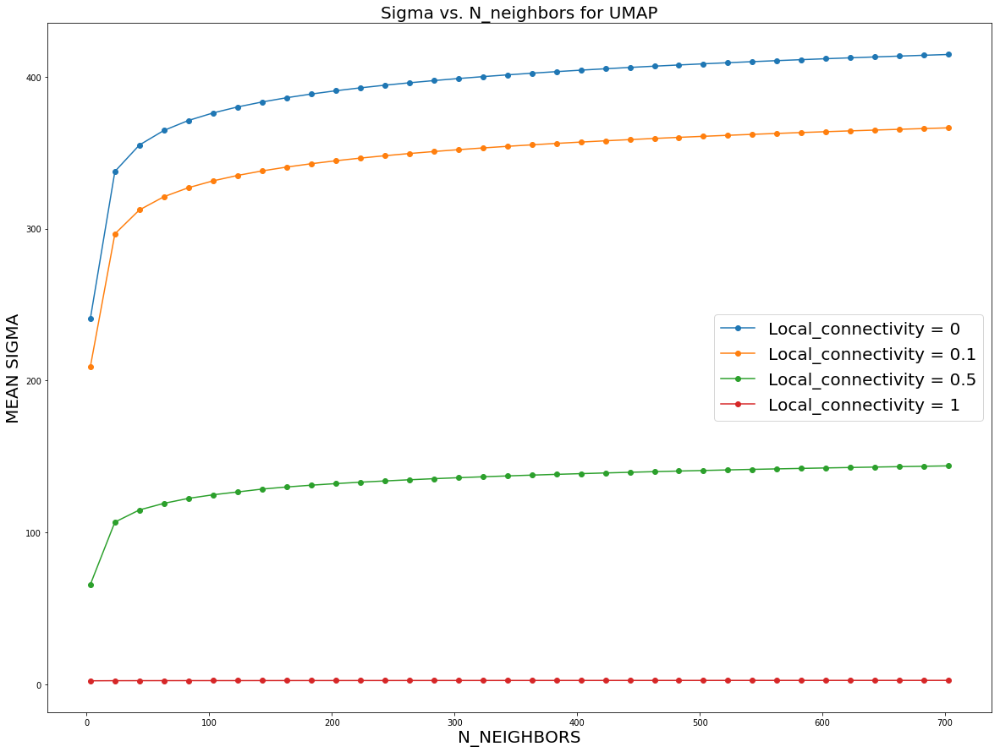

In [106]:
from umap import umap_
plt.figure(figsize=(20, 15))

my_local_connectivity_n_neighbors = []
my_local_connectivity_sigma_umap = []
for local_connectivity in [0, 0.1, 0.5, 1]:
    my_n_neighbors = []; my_sigma_umap = []
    for n_neighbors in range(3, X_train.shape[0], 20):
        sigmas_umap, rhos_umap = umap_.smooth_knn_dist(dist, k = n_neighbors, 
                                                       local_connectivity = local_connectivity)
        my_sigma_umap.append(np.mean(sigmas_umap))
        my_n_neighbors.append(n_neighbors)

    my_local_connectivity_sigma_umap.append(my_sigma_umap)
    my_local_connectivity_n_neighbors.append(my_n_neighbors)
    print('Finished computing mean sigma for local_connectivity = {}'.format(local_connectivity))
    plt.plot(my_n_neighbors, my_sigma_umap, '-o')

plt.gca().legend(['Local_connectivity = {}'.format(local_connectivity) 
                  for local_connectivity in [0, 0.1, 0.5, 1]], fontsize = 20)
plt.title("Sigma vs. N_neighbors for UMAP", fontsize = 20)
plt.xlabel("N_NEIGHBORS", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

It looks like at local_connectivity = 1, indeed, the mean sigma parameter does not change much as n_neighbor increases. However, when local connectivity decreases, mean sigma can jump up to 100 or even 400, it plateaus quite quickly, which agrees with the behavior from my implementation of UMAP.

Now let us understand why at bandwidth = 1 and local_connectivity = 1, that are the default UMAP parameters in Leland McInnes implementation, the mean sigma from Leland's implementation varies very little with n_neighbor, while in my implementation it varies a lot, let us check it:

N_neighbor = 3, Mean Sigma = 0.00095367431640625
N_neighbor = 23, Mean Sigma = 72.26585143105278
N_neighbor = 43, Mean Sigma = 82.91104119583215
N_neighbor = 63, Mean Sigma = 88.53755450115524
N_neighbor = 83, Mean Sigma = 92.28989531873991
N_neighbor = 103, Mean Sigma = 95.07648372117367
N_neighbor = 123, Mean Sigma = 97.27877611554534
N_neighbor = 143, Mean Sigma = 99.0917163188231
N_neighbor = 163, Mean Sigma = 100.62791781718505
N_neighbor = 183, Mean Sigma = 101.95771009562402
N_neighbor = 203, Mean Sigma = 103.12805229059144
N_neighbor = 223, Mean Sigma = 104.17187280495074
N_neighbor = 243, Mean Sigma = 105.11270981261184
N_neighbor = 263, Mean Sigma = 105.96843005558632
N_neighbor = 283, Mean Sigma = 106.75261939704085
N_neighbor = 303, Mean Sigma = 107.47582419624541
N_neighbor = 323, Mean Sigma = 108.14648633562653
N_neighbor = 343, Mean Sigma = 108.77148798724127
N_neighbor = 363, Mean Sigma = 109.35646195651432
N_neighbor = 383, Mean Sigma = 109.90591422139599
N_neighbor = 

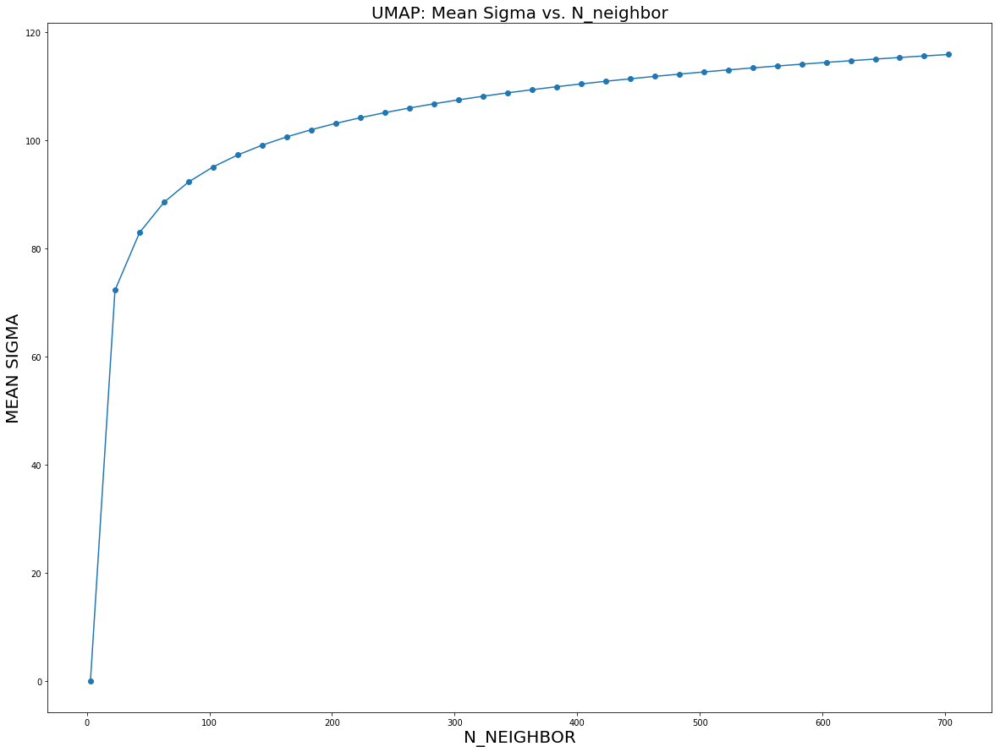

In [171]:
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np; import pandas as pd; import seaborn as sns; import matplotlib.pyplot as plt

dist = np.square(euclidean_distances(X_train, X_train))
rho = [sorted(dist[i])[1] for i in range(dist.shape[0])]

def prob_high_dim(sigma, dist_row):
    d = dist[dist_row] - rho[dist_row]
    d[d < 0] = 0
    return np.exp(- d / sigma)

def k(prob):
    return np.power(2, np.sum(prob))

def sigma_binary_search(k_of_sigma, fixed_k):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if k_of_sigma(approx_sigma) < fixed_k:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_k - k_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

my_n_neighbor = []; my_sigma_umap = []
for N_NEIGHBOR in range(3, X_train.shape[0], 20):

    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: k(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, N_NEIGHBOR)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        
    print("N_neighbor = {0}, Mean Sigma = {1}".format(N_NEIGHBOR, np.mean(sigma_array)))
    
    my_n_neighbor.append(N_NEIGHBOR)
    my_sigma_umap.append(np.mean(sigma_array))

plt.figure(figsize=(20,15))
plt.plot(my_n_neighbor, my_sigma_umap, '-o')
plt.title("UMAP: Mean Sigma vs. N_neighbor", fontsize = 20)
plt.xlabel("N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

One thing that we can see immediately comparing my binary search implementation with Leland's one is that I seem to compute parameter **rho** very differently from the way Leland computes it. Indeed, the distribution of rho values from my implementation is unimodal, while from Leland's implementation it is bimodal, i.e. resembles actually the bimodal shape of the distribution of distances.

In [76]:
dist = np.square(euclidean_distances(X_train, X_train))
rho = [sorted(dist[i])[1] for i in range(dist.shape[0])]

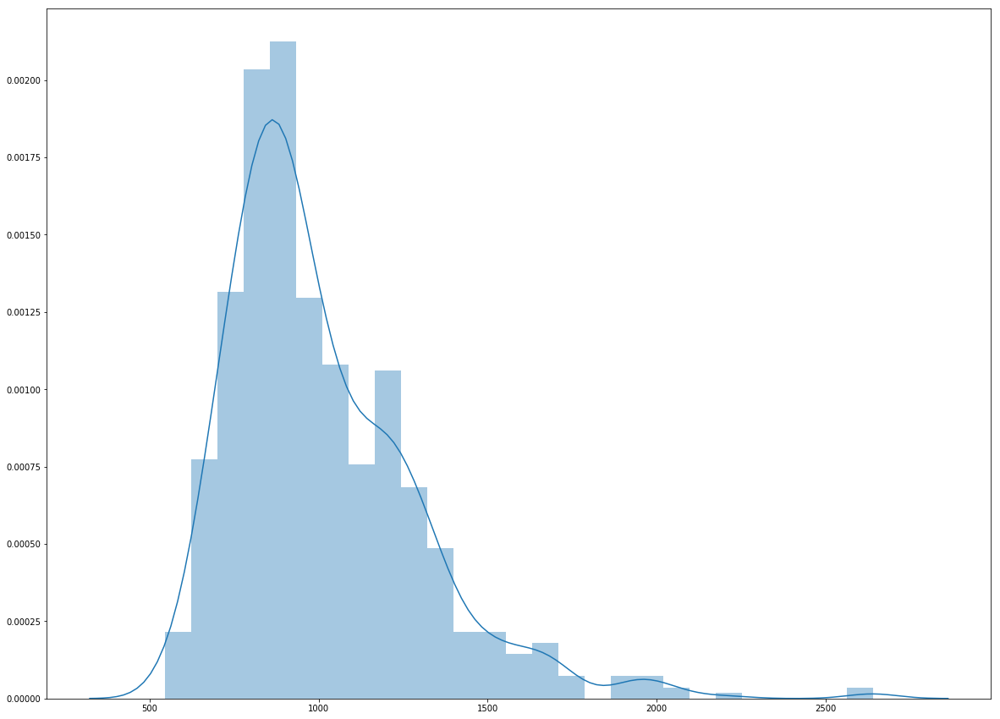

In [79]:
plt.figure(figsize=(20,15))
sns.distplot(rho)
plt.show()

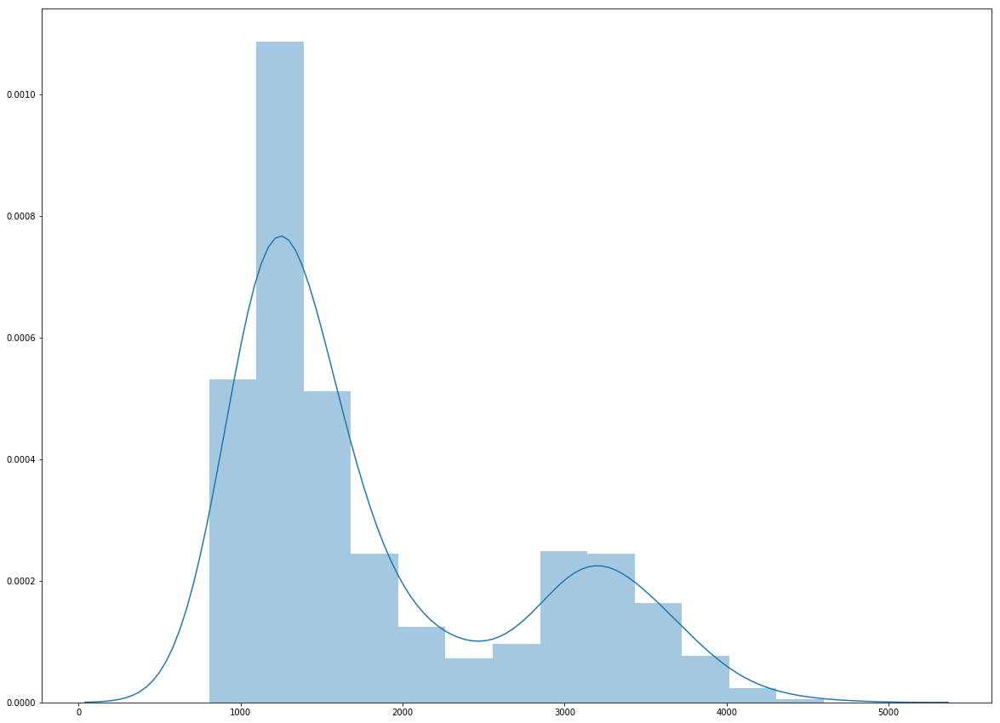

In [108]:
from umap import umap_
sigmas_umap, rhos_umap = umap_.smooth_knn_dist(dist, k = 30, bandwidth = 1, local_connectivity = 1)
plt.figure(figsize=(20,15))
sns.distplot(rhos_umap)
plt.show()

So let us further dig into Leland's codes and understand how he uses the local_connectivity hyperparameter for computing the **rho** values. Looking at the codes [here](https://github.com/lmcinnes/umap/blob/master/umap/umap_.py) we can see that the **local_connectivity** parameter is aka the number of nearest neighbors, i.e. only firt nearest neighbor or first and second nearest neighbors, to subtruct from the rest of the distances for each data point. However, when determining what point is the nearest neighbor for each data point, Leland McInnes **does not order or sort all the points by their distances**, but takes only the first one in the order they appear in the distance matrix. Here is the piece of code from umap_.py that shows no sorting / ordering of the distances, the parameter rho for each data point gets zero's element of distnace matrx, this is because index-1 = 0 (since index = local_connectivity = 1), see below:

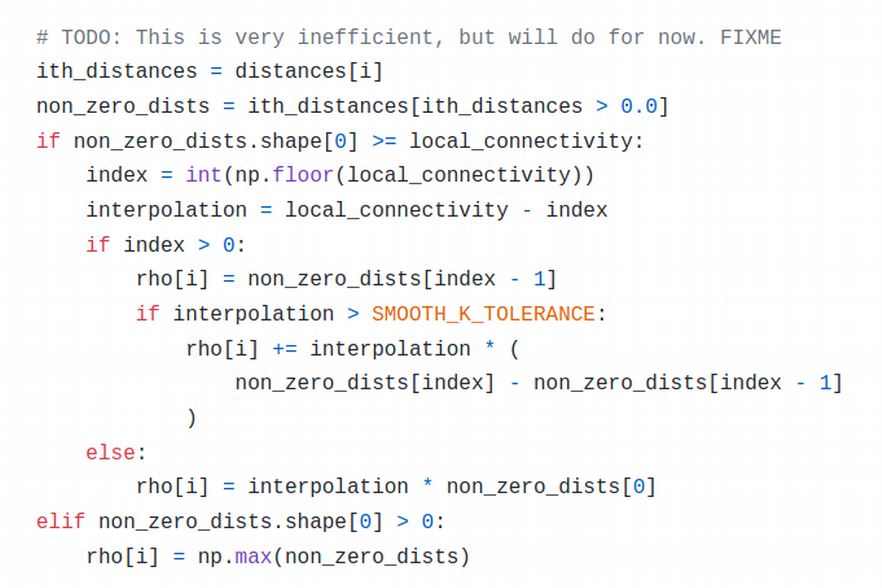

In [174]:
from IPython.display import Image
Image('/home/nikolay/Documents/Medium/tSNE_vs_UMAP/UMAP_no_sorting.png', width=2000)

Therefore, if the distance matrix was not pre-sorted, Leland's procedure seems to be very strange since my understanding from the original UMAP paper was that the parameter rho reflects the distance from each data point to its **first nearest neighbor**. Therefore some sorting must be used to dtermine what is the nearest neighbor for each data point. Let us demonstrate that if I do not sort neighbors in my UMAP implementation, I get identical to Lealnd's distribution of rho values.

In [164]:
rho = [dist[i][dist[i]>0][0] for i in range(dist.shape[0])]

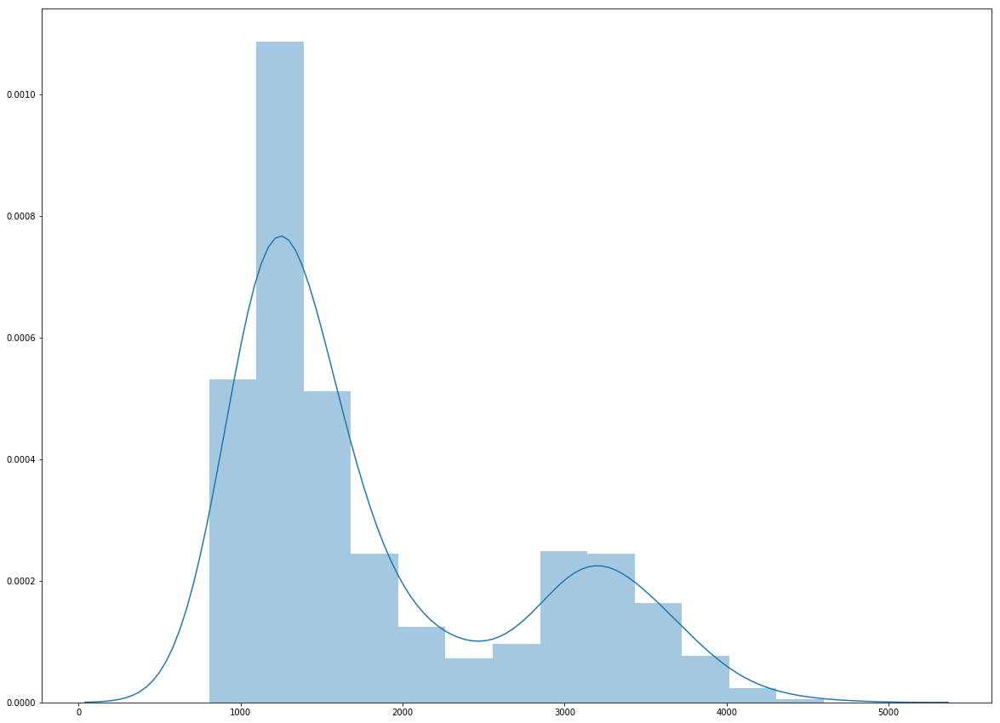

In [165]:
plt.figure(figsize=(20,15))
sns.distplot(rho)
plt.show()

In [166]:
rho = np.zeros(dist.shape[0], dtype=np.float32)   
for i in range(dist.shape[0]):
    ith_distances = dist[i]
    non_zero_dists = ith_distances[ith_distances > 0.0]
    rho[i] = non_zero_dists[0]

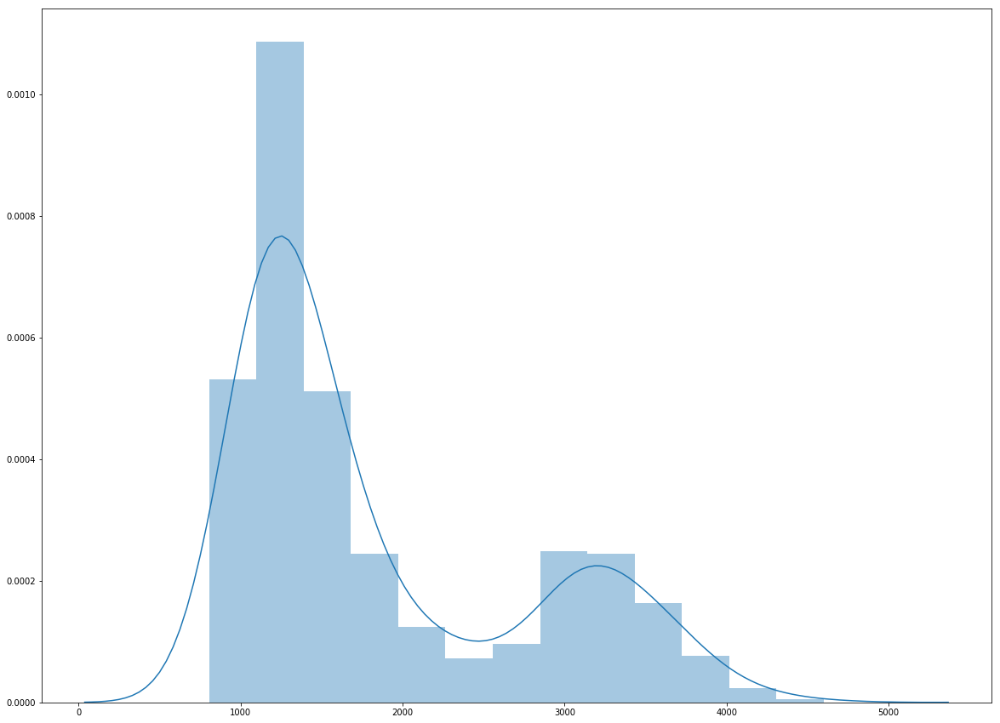

In [167]:
plt.figure(figsize=(20,15))
sns.distplot(rho)
plt.show()

In addition, in the umap_.py codes there is some mysterious multiplication factor **MIN_K_DIST_SCALE = 0.001** that perhaps is supposed to set a minimal value of sigma, which is the **result** variable in the code below, so if the sigma is too low, it is set to be the mean distance multiplied by MIN_K_DIST_SCALE:

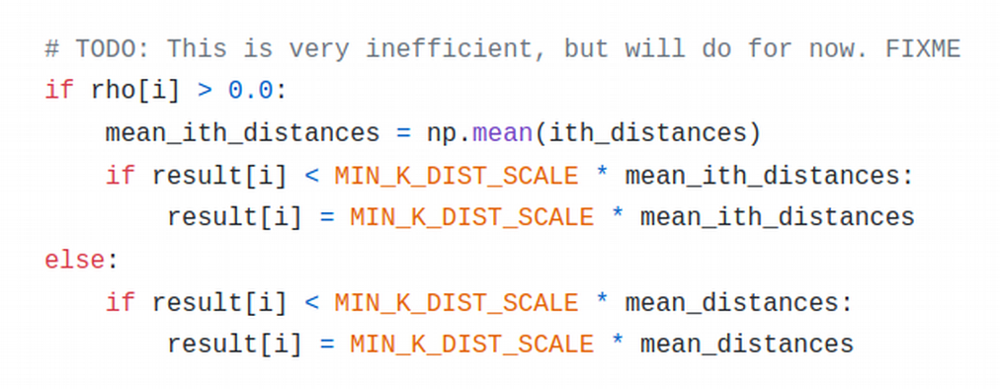

In [176]:
from IPython.display import Image
Image('/home/nikolay/Documents/Medium/tSNE_vs_UMAP/UMAP_multiply_constant.png', width=2000)

Let us omit sorting data points by their proximity to each data point in my UMAP implementation and compute the mean sigma vs. n_nighbor dependence:

N_neighbor = 3, Mean Sigma = 2.2327677554763565
N_neighbor = 23, Mean Sigma = 2.2826117370662926
N_neighbor = 43, Mean Sigma = 2.3063927017386074
N_neighbor = 63, Mean Sigma = 2.319144765852118
N_neighbor = 83, Mean Sigma = 2.331129658330073
N_neighbor = 103, Mean Sigma = 2.340376036967632
N_neighbor = 123, Mean Sigma = 2.3477976477092737
N_neighbor = 143, Mean Sigma = 2.3538739916079403
N_neighbor = 163, Mean Sigma = 2.358959366663861
N_neighbor = 183, Mean Sigma = 2.3633041789824603
N_neighbor = 203, Mean Sigma = 2.3670869095112224
N_neighbor = 223, Mean Sigma = 2.3704247696186442
N_neighbor = 243, Mean Sigma = 2.3734056678310984
N_neighbor = 263, Mean Sigma = 2.3828653029824163
N_neighbor = 283, Mean Sigma = 2.3907309391745777
N_neighbor = 303, Mean Sigma = 2.3972601451788003
N_neighbor = 323, Mean Sigma = 2.4028676436034795
N_neighbor = 343, Mean Sigma = 2.4079103963435826
N_neighbor = 363, Mean Sigma = 2.4125295898202546
N_neighbor = 383, Mean Sigma = 2.4168051408756512
N_neighbor

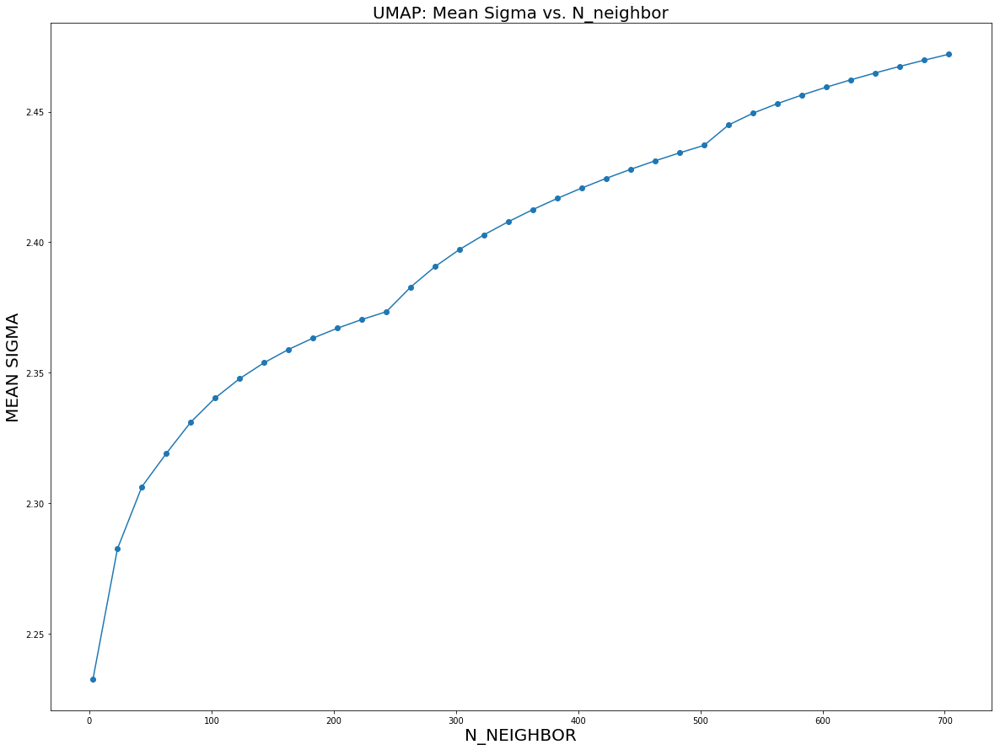

In [177]:
from sklearn.metrics.pairwise import euclidean_distances
import numpy as np; import pandas as pd; import seaborn as sns; import matplotlib.pyplot as plt

dist = np.square(euclidean_distances(X_train, X_train))
mean_distances = np.mean(dist)
#rho = [sorted(dist[i])[1] for i in range(dist.shape[0])]
rho = [dist[i][dist[i]>0][0] for i in range(dist.shape[0])]

def prob_high_dim(sigma, dist_row):
    d = dist[dist_row] - rho[dist_row]
    d[d < 0] = 0
    return np.exp(- d / sigma)

def k(prob):
    return np.power(2, np.sum(prob))

def sigma_binary_search(k_of_sigma, fixed_k):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if k_of_sigma(approx_sigma) < fixed_k:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_k - k_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

my_n_neighbor = []; my_sigma_umap = []
for N_NEIGHBOR in range(3, X_train.shape[0], 20):

    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        mean_ith_distances = np.mean(dist[dist_row])
        func = lambda sigma: k(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, N_NEIGHBOR)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        if binary_search_result < mean_ith_distances * 1e-3:
            binary_search_result = mean_ith_distances * 1e-3
        sigma_array.append(binary_search_result)
        
    print("N_neighbor = {0}, Mean Sigma = {1}".format(N_NEIGHBOR, np.mean(sigma_array)))
    
    my_n_neighbor.append(N_NEIGHBOR)
    my_sigma_umap.append(np.mean(sigma_array))

plt.figure(figsize=(20,15))
plt.plot(my_n_neighbor, my_sigma_umap, '-o')
plt.title("UMAP: Mean Sigma vs. N_neighbor", fontsize = 20)
plt.xlabel("N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

The values of mean sigma that we obtain are very close to the ones from the original UMAP binary search implementation for default local_connectivity = 1 and bandwidth = 1:

N_neighbor = 3, Mean Sigma = 2.2327677554763565
N_neighbor = 23, Mean Sigma = 2.3088340866774497
N_neighbor = 43, Mean Sigma = 2.3326607051921155
N_neighbor = 63, Mean Sigma = 2.3487845567764385
N_neighbor = 83, Mean Sigma = 2.3596527358419936
N_neighbor = 103, Mean Sigma = 2.3676132205225104
N_neighbor = 123, Mean Sigma = 2.3738273836793717
N_neighbor = 143, Mean Sigma = 2.3917966782148463
N_neighbor = 163, Mean Sigma = 2.403656934303359
N_neighbor = 183, Mean Sigma = 2.4131952118707907
N_neighbor = 203, Mean Sigma = 2.4213509067577497
N_neighbor = 223, Mean Sigma = 2.428441810950967
N_neighbor = 243, Mean Sigma = 2.434675580373104
N_neighbor = 263, Mean Sigma = 2.445680416392583
N_neighbor = 283, Mean Sigma = 2.4535954656844385
N_neighbor = 303, Mean Sigma = 2.459808435416457
N_neighbor = 323, Mean Sigma = 2.4652105582123713
N_neighbor = 343, Mean Sigma = 2.4700480205683424
N_neighbor = 363, Mean Sigma = 2.474447240273082
N_neighbor = 383, Mean Sigma = 2.4784889439927484
N_neighbor =

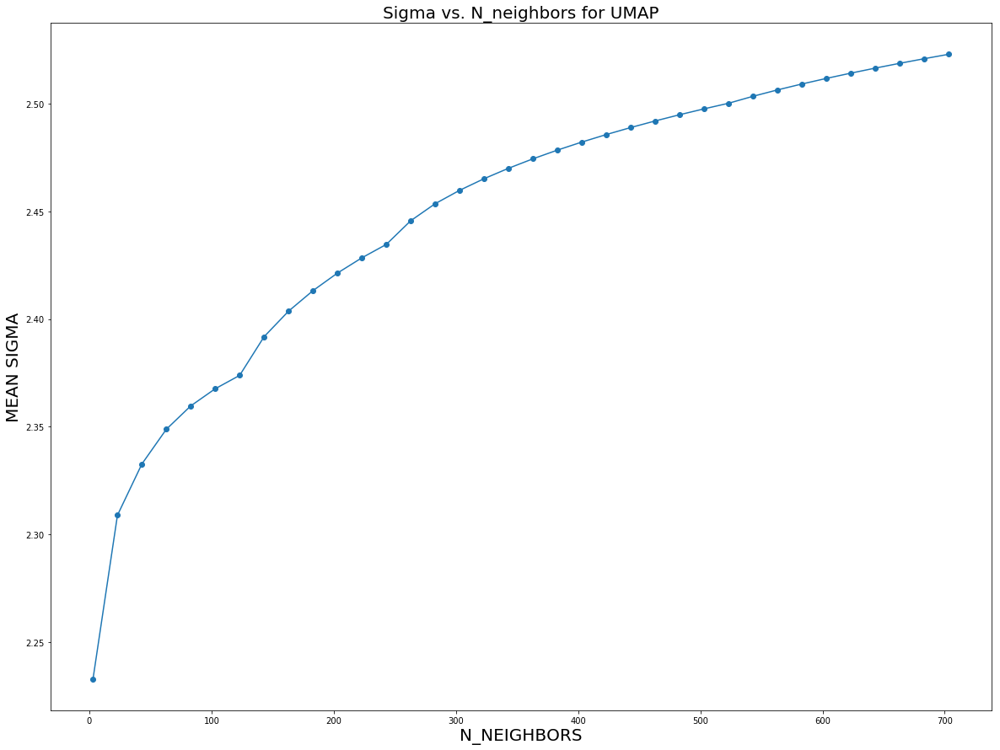

In [178]:
from umap import umap_
plt.figure(figsize=(20, 15))

my_n_neighbors = []; my_sigma_umap = []
for n_neighbors in range(3, X_train.shape[0], 20):
    sigmas_umap, rhos_umap = umap_.smooth_knn_dist(dist, k = n_neighbors)
    my_sigma_umap.append(np.mean(sigmas_umap))
    my_n_neighbors.append(n_neighbors)
    print("N_neighbor = {0}, Mean Sigma = {1}".format(n_neighbors, np.mean(sigmas_umap)))

plt.plot(my_n_neighbors, my_sigma_umap, '-o')
plt.title("Sigma vs. N_neighbors for UMAP", fontsize = 20)
plt.xlabel("N_NEIGHBORS", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

Therefore, we conclude that we managed to reproduce the original Leland McInnes implementation of the binary search for sigma parameter. The two main discrepancies between my and Leland's computations of sigma was the absence of sorting in Leland's code (which is again very-very strange), and presence of some sort of minimal sigma that did not allow very small sigmas (probably because of singularities in that case) and set each sigma close to zero to mean_sigma * 0.001.

In [179]:
from umap import umap_
sigmas_umap, rhos_umap = umap_.smooth_knn_dist(dist, k = 703)
np.mean(sigmas_umap)

2.5229923658587636

### Quantify How Well Dimension Reduction Algorithms Preserve Global Structure <a class="anchor" id="Quantify-How-Well-Dimension-Reduction-Algorithms-Preserve-Global-Structure"></a>

Now let us try to quantify how well such dimension reduction algorithms as PCA / MDS, tSNE and UMAP are capable of preserving global data structure. By global data structure we mean here: 1) the distances between the clustesrs, 2) the correlation between original and transformed centroid coordinates, and 3) the shapes of the clusters. We are going to use the 2D world map syntetic data set, and by shapes of the clusters we mean the sizes of the bounding boxes drawn around of the continetn / cluster.

(3023, 2)
(3023,)


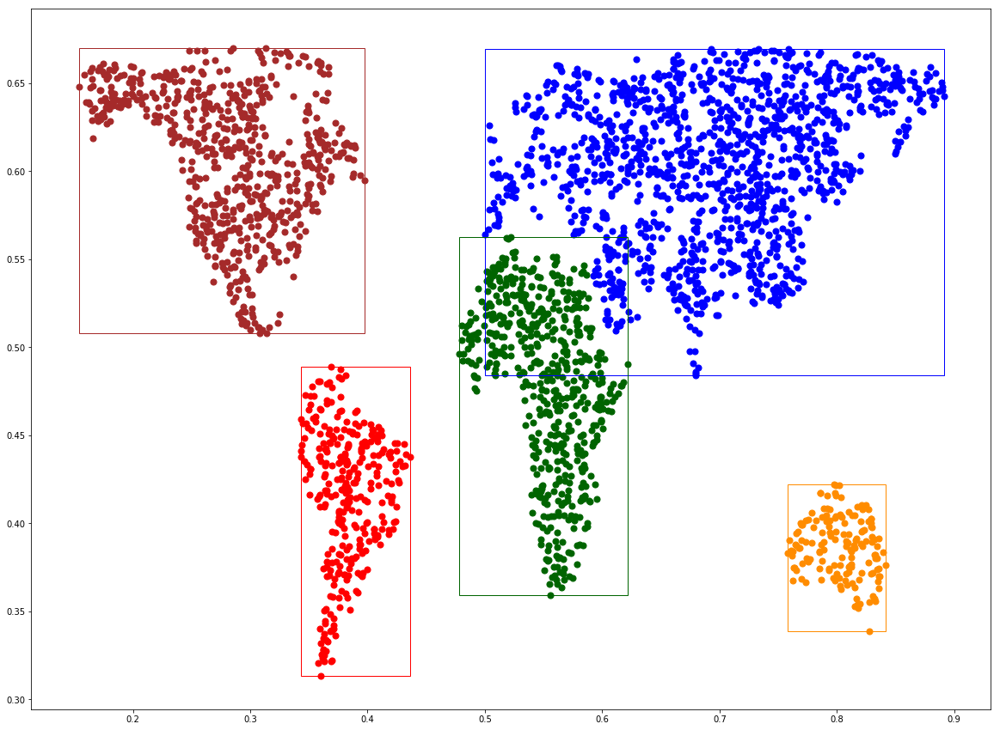

In [2]:
import cartopy
import numpy as np
import cartopy.crs as ccrs
from skimage.io import imread
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from matplotlib import pyplot as plt
import cartopy.io.shapereader as shpreader

import warnings
warnings.filterwarnings("ignore")

shapename = 'admin_0_countries'
countries_shp = shpreader.natural_earth(resolution='110m',
                                        category='cultural', name=shapename)

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    #print(country.attributes['NAME_LONG'])
    if country.attributes['NAME_LONG'] in ['United States','Canada', 'Mexico']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('NorthAmerica.png')
plt.close()
        
plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Brazil','Argentina', 'Peru', 'Uruguay', 'Venezuela', 
                                           'Columbia', 'Bolivia', 'Colombia', 'Ecuador', 'Paraguay']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('SouthAmerica.png')
plt.close()

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Australia']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Australia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Russian Federation', 'China', 'India', 'Kazakhstan', 'Mongolia', 
                                          'France', 'Germany', 'Spain', 'Ukraine', 'Turkey', 'Sweden', 
                                           'Finland', 'Denmark', 'Greece', 'Poland', 'Belarus', 'Norway', 
                                           'Italy', 'Iran', 'Pakistan', 'Afganistan', 'Iraq', 'Bulgaria', 
                                           'Romania', 'Turkmenistan', 'Uzbekistan' 'Austria', 'Ireland', 
                                           'United Kingdom', 'Saudi Arabia', 'Hungary']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Eurasia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Libya', 'Algeria', 'Niger', 'Marocco', 'Egypt', 'Sudan', 'Chad',
                                           'Democratic Republic of the Congo', 'Somalia', 'Kenya', 'Ethiopia', 
                                           'The Gambia', 'Nigeria', 'Cameroon', 'Ghana', 'Guinea', 'Guinea-Bissau',
                                           'Liberia', 'Sierra Leone', 'Burkina Faso', 'Central African Republic', 
                                           'Republic of the Congo', 'Gabon', 'Equatorial Guinea', 'Zambia', 
                                           'Malawi', 'Mozambique', 'Angola', 'Burundi', 'South Africa', 
                                           'South Sudan', 'Somaliland', 'Uganda', 'Rwanda', 'Zimbabwe', 'Tanzania',
                                           'Botswana', 'Namibia', 'Senegal', 'Mali', 'Mauritania', 'Benin', 
                                           'Nigeria', 'Cameroon']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Africa.png')
plt.close()


rng = np.random.RandomState(123)
fig = plt.figure(figsize=(20,15))

N_NorthAmerica = 10000
data_NorthAmerica = imread('NorthAmerica.png')[::-1, :, 0].T
X_NorthAmerica = rng.rand(4 * N_NorthAmerica, 2)
i, j = (X_NorthAmerica * data_NorthAmerica.shape).astype(int).T
X_NorthAmerica = X_NorthAmerica[data_NorthAmerica[i, j] < 1]
X_NorthAmerica = X_NorthAmerica[X_NorthAmerica[:, 1]<0.67]
y_NorthAmerica = np.array(['brown']*X_NorthAmerica.shape[0])
plt.scatter(X_NorthAmerica[:, 0], X_NorthAmerica[:, 1], c = 'brown', s = 50)

N_SouthAmerica = 10000
data_SouthAmerica = imread('SouthAmerica.png')[::-1, :, 0].T
X_SouthAmerica = rng.rand(4 * N_SouthAmerica, 2)
i, j = (X_SouthAmerica * data_SouthAmerica.shape).astype(int).T
X_SouthAmerica = X_SouthAmerica[data_SouthAmerica[i, j] < 1]
y_SouthAmerica = np.array(['red']*X_SouthAmerica.shape[0])
plt.scatter(X_SouthAmerica[:, 0], X_SouthAmerica[:, 1], c = 'red', s = 50)

N_Australia = 10000
data_Australia = imread('Australia.png')[::-1, :, 0].T
X_Australia = rng.rand(4 * N_Australia, 2)
i, j = (X_Australia * data_Australia.shape).astype(int).T
X_Australia = X_Australia[data_Australia[i, j] < 1]
y_Australia = np.array(['darkorange']*X_Australia.shape[0])
plt.scatter(X_Australia[:, 0], X_Australia[:, 1], c = 'darkorange', s = 50)

N_Eurasia = 10000
data_Eurasia = imread('Eurasia.png')[::-1, :, 0].T
X_Eurasia = rng.rand(4 * N_Eurasia, 2)
i, j = (X_Eurasia * data_Eurasia.shape).astype(int).T
X_Eurasia = X_Eurasia[data_Eurasia[i, j] < 1]
X_Eurasia = X_Eurasia[X_Eurasia[:, 0]>0.5]
X_Eurasia = X_Eurasia[X_Eurasia[:, 1]<0.67]
y_Eurasia = np.array(['blue']*X_Eurasia.shape[0])
plt.scatter(X_Eurasia[:, 0], X_Eurasia[:, 1], c = 'blue', s = 50)

N_Africa = 10000
data_Africa = imread('Africa.png')[::-1, :, 0].T
X_Africa = rng.rand(4 * N_Africa, 2)
i, j = (X_Africa * data_Africa.shape).astype(int).T
X_Africa = X_Africa[data_Africa[i, j] < 1]
y_Africa = np.array(['darkgreen']*X_Africa.shape[0])
plt.scatter(X_Africa[:, 0], X_Africa[:, 1], c = 'darkgreen', s = 50)

NorthAmerica_bb_coords = [np.min(X_NorthAmerica[:,0]), np.max(X_NorthAmerica[:,0]), 
                          np.min(X_NorthAmerica[:,1]), np.max(X_NorthAmerica[:,1])]
Eurasia_bb_coords = [np.min(X_Eurasia[:,0]), np.max(X_Eurasia[:,0]), 
                          np.min(X_Eurasia[:,1]), np.max(X_Eurasia[:,1])]
Africa_bb_coords = [np.min(X_Africa[:,0]), np.max(X_Africa[:,0]), 
                          np.min(X_Africa[:,1]), np.max(X_Africa[:,1])]
SouthAmerica_bb_coords = [np.min(X_SouthAmerica[:,0]), np.max(X_SouthAmerica[:,0]), 
                          np.min(X_SouthAmerica[:,1]), np.max(X_SouthAmerica[:,1])]
Australia_bb_coords = [np.min(X_Australia[:,0]), np.max(X_Australia[:,0]), 
                          np.min(X_Australia[:,1]), np.max(X_Australia[:,1])]

ax = fig.add_subplot(1, 1, 1)
rect1 = plt.Rectangle((NorthAmerica_bb_coords[0], NorthAmerica_bb_coords[2]), 
                      NorthAmerica_bb_coords[1] - NorthAmerica_bb_coords[0], 
                      NorthAmerica_bb_coords[3] - NorthAmerica_bb_coords[2], 
                      fill = False, ec = 'brown')
rect2 = plt.Rectangle((Eurasia_bb_coords[0], Eurasia_bb_coords[2]), 
                      Eurasia_bb_coords[1] - Eurasia_bb_coords[0],
                      Eurasia_bb_coords[3] - Eurasia_bb_coords[2], 
                      fill = False, ec = 'blue')
rect3 = plt.Rectangle((Africa_bb_coords[0], Africa_bb_coords[2]), 
                      Africa_bb_coords[1] - Africa_bb_coords[0],
                      Africa_bb_coords[3] - Africa_bb_coords[2], 
                      fill = False, ec = 'darkgreen')
rect4 = plt.Rectangle((SouthAmerica_bb_coords[0], SouthAmerica_bb_coords[2]), 
                      SouthAmerica_bb_coords[1] - SouthAmerica_bb_coords[0], 
                      SouthAmerica_bb_coords[3] - SouthAmerica_bb_coords[2], 
                      fill = False, ec = 'red')
rect5 = plt.Rectangle((Australia_bb_coords[0], Australia_bb_coords[2]), 
                      Australia_bb_coords[1] - Australia_bb_coords[0],
                      Australia_bb_coords[3] - Australia_bb_coords[2], 
                      fill = False, ec = 'darkorange')
ax.add_patch(rect1)
ax.add_patch(rect2)
ax.add_patch(rect3)
ax.add_patch(rect4)
ax.add_patch(rect5)

X = np.vstack((X_NorthAmerica, X_SouthAmerica, X_Australia, X_Eurasia, X_Africa))
y = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa))
print(X.shape)
print(y.shape)

plt.show()

Let us check how correlated pairwise distances between data points are after applying PCA, UMAP and tSNE to the syntetic World's Map data det. For this purpose we will use Spearman correlation between original distances and distances between data points after dimension reduction. We are going to apply bootstrapping, i.e. subsampling with replacement multiple times, for building confidence intervals for a more robust comparision of the dimension reduction algorithms.

In [12]:
import warnings
warnings.filterwarnings("ignore")

import random
from umap import UMAP
from sklearn.manifold import TSNE
from scipy.stats import spearmanr, pearsonr
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances

coef_pca_list = []; coef_tsne_list = []; coef_umap_list = []
for i in range(10):
    print('Working with iteration {}'.format(i + 1))
    X_boot = X[random.sample(range(X.shape[0]), int(round(X.shape[0] * 0.9, 0))), :]
    X_reduced = PCA(n_components = 2).fit_transform(X_boot)
    model_tsne = TSNE(learning_rate = 200, n_components = 2, perplexity = 500, 
                 init = X_reduced, n_iter = 1000, verbose = 0)
    tsne = model_tsne.fit_transform(X_boot)

    model_umap = UMAP(learning_rate = 1, n_components = 2, min_dist = 2, n_neighbors = 500, 
                 init = X_reduced, n_epochs = 1000, verbose = 0, spread = 2)
    umap = model_umap.fit_transform(X_boot)

    dist_orig = np.square(euclidean_distances(X_boot, X_boot)).flatten()
    dist_pca = np.square(euclidean_distances(X_reduced, X_reduced)).flatten()
    dist_tsne = np.square(euclidean_distances(tsne, tsne)).flatten()
    dist_umap = np.square(euclidean_distances(umap, umap)).flatten()

    coef_pca, p_pca = spearmanr(dist_orig, dist_pca)
    coef_tsne, p_tsne = spearmanr(dist_orig, dist_tsne)
    coef_umap, p_umap = spearmanr(dist_orig, dist_umap)
    coef_pca_list.append(coef_pca); coef_tsne_list.append(coef_tsne); coef_umap_list.append(coef_umap)
    print('Spearman correlation coeffcient for PCA dimension reduction = {}'.format(coef_pca))
    print('Spearman correlation coeffcient for tSNE dimension reduction = {}'.format(coef_tsne))
    print('Spearman correlation coeffcient for UMAP dimension reduction = {}'.format(coef_umap))
    print('****************************************************************************')

Working with iteration 1
Spearman correlation coeffcient for PCA dimension reduction = 0.999999999999995
Spearman correlation coeffcient for tSNE dimension reduction = 0.937240521872445
Spearman correlation coeffcient for UMAP dimension reduction = 0.9532903814214244
****************************************************************************
Working with iteration 2
Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999982
Spearman correlation coeffcient for tSNE dimension reduction = 0.9402015577883607
Spearman correlation coeffcient for UMAP dimension reduction = 0.9556804540616886
****************************************************************************
Working with iteration 3
Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999998
Spearman correlation coeffcient for tSNE dimension reduction = 0.9406335316188061
Spearman correlation coeffcient for UMAP dimension reduction = 0.9327735354321872
**************************************

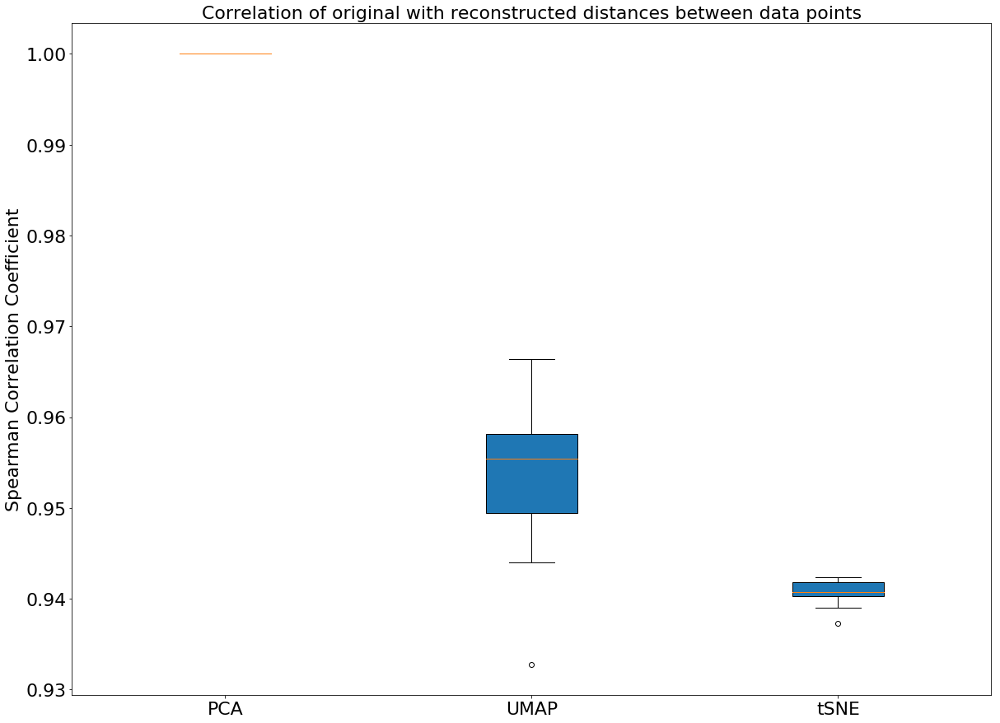

In [42]:
import matplotlib
plt.figure(figsize = (20, 15))
matplotlib.rcParams.update({'font.size': 22})
plt.boxplot([coef_pca_list, coef_umap_list, coef_tsne_list], labels = ['PCA', 'UMAP', 'tSNE'], patch_artist = True)
plt.ylabel('Spearman Correlation Coefficient', fontsize = 22)
plt.title('Correlation of original with reconstructed distances between data points', fontsize = 22)
plt.show()

In [39]:
from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(coef_umap_list, coef_tsne_list)
print('Statistics = %.3f, p = %.3f' % (stat, p))

Statistics = 10.000, p = 0.001


We conclude that PCA perfectly reconstructs the original 2D World's Map data, which is not surprising because the World's Map is so far a linear manifold. So the Spearman correlation coefficient between the original and reconstructed distances is close to one. Both UMAP and tSNE preserve the majority of pairwise distances with the Spearman correlation coefficient > 0.9. However, as we can see from both the boxplot and Mann-Whittney U test, the **Spearman correlation coefficient for UMAP is significantly higher than the one for tSNE**, implying UMAP is superior in global structure preservation on a linear manifold even if one fixes the initialization to be PCA for both UMAP and tSNE removing thus this layer of uncertanty for comparison. Computing correlations betwen all pairs of points **within and between clusters** we can see that **UMAP better preserves both local and global structure**.

Let us now check how the dimension reduction techniques can preserve the distances between centroids of the clusters. This time we are not going to apply bootstrapping but use the whole data set in order to demonstrate an interesting effect about tSNE vs. UMAP which is the absense of stochasticity for tSNE and its presence for UMAP.

In [33]:
import warnings
warnings.filterwarnings("ignore")

import random
from umap import UMAP
from sklearn.manifold import TSNE
from scipy.stats import spearmanr
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances

coef_pca_centroids_list = []; coef_tsne_centroids_list = []; coef_umap_centroids_list = []
for i in range(10):
    print('Working with iteration {}'.format(i + 1))
    #X_boot = X[random.sample(range(X.shape[0]), int(round(X.shape[0] * 0.8, 0))), :]
    X = np.vstack((X_NorthAmerica, X_SouthAmerica, X_Australia, X_Eurasia, X_Africa))
    X_centroids = np.vstack((np.mean(X_NorthAmerica, axis = 0), 
                             np.mean(X_SouthAmerica, axis = 0), 
                             np.mean(X_Australia, axis = 0), 
                             np.mean(X_Eurasia, axis = 0), 
                             np.mean(X_Africa, axis = 0)))
    X_reduced = PCA(n_components = 2).fit_transform(X)
    X_pca_centroids = np.vstack((np.mean(X_reduced[y == 'brown'], axis = 0), 
                                 np.mean(X_reduced[y == 'red'], axis = 0), 
                                 np.mean(X_reduced[y == 'darkorange'], axis = 0), 
                                 np.mean(X_reduced[y == 'blue'], axis = 0), 
                                 np.mean(X_reduced[y == 'darkgreen'], axis = 0)))
    model_tsne = TSNE(learning_rate = 200, n_components = 2, perplexity = 500, 
                      init = X_reduced, n_iter = 1000, verbose = 0)
    tsne = model_tsne.fit_transform(X)
    X_tsne_centroids = np.vstack((np.mean(tsne[y == 'brown'], axis = 0), 
                                  np.mean(tsne[y == 'red'], axis = 0), 
                                  np.mean(tsne[y == 'darkorange'], axis = 0), 
                                  np.mean(tsne[y == 'blue'], axis = 0), 
                                  np.mean(tsne[y == 'darkgreen'], axis = 0)))
    model_umap = UMAP(learning_rate = 1, n_components = 2, min_dist = 2, n_neighbors = 500, 
                      init = X_reduced, n_epochs = 1000, verbose = 0, spread = 2)
    umap = model_umap.fit_transform(X)
    X_umap_centroids = np.vstack((np.mean(umap[y == 'brown'], axis = 0), 
                                  np.mean(umap[y == 'red'], axis = 0), 
                                  np.mean(umap[y == 'darkorange'], axis = 0), 
                                  np.mean(umap[y == 'blue'], axis = 0), 
                                  np.mean(umap[y == 'darkgreen'], axis = 0)))
    
    #from sklearn.metrics.pairwise import pairwise_distances
    #np.square(pairwise_distances(X_centroids, X_centroids, metric = 'mahalanobis'))
    
    dist_centroids_orig = np.square(euclidean_distances(X_centroids, X_centroids)).flatten()
    dist_centroids_pca = np.square(euclidean_distances(X_pca_centroids, X_pca_centroids)).flatten()
    dist_centroids_tsne = np.square(euclidean_distances(X_tsne_centroids, X_tsne_centroids)).flatten()
    dist_centroids_umap = np.square(euclidean_distances(X_umap_centroids, X_umap_centroids)).flatten()
    
    coef_centroids_pca, p_centroids_pca = spearmanr(dist_centroids_orig, dist_centroids_pca)
    coef_centroids_tsne, p_centroids_tsne = spearmanr(dist_centroids_orig, dist_centroids_tsne)
    coef_centroids_umap, p_centroids_umap = spearmanr(dist_centroids_orig, dist_centroids_umap)
    
    coef_pca_centroids_list.append(coef_centroids_pca); coef_tsne_centroids_list.append(coef_centroids_tsne); 
    coef_umap_centroids_list.append(coef_centroids_umap)
    print('Spearman correlation coeffcient for PCA dimension reduction = {}'.format(coef_centroids_pca))
    print('Spearman correlation coeffcient for tSNE dimension reduction = {}'.format(coef_centroids_tsne))
    print('Spearman correlation coeffcient for UMAP dimension reduction = {}'.format(coef_centroids_umap))
    print('****************************************************************************')

Working with iteration 1
Spearman correlation coeffcient for PCA dimension reduction = 0.9996111218985752
Spearman correlation coeffcient for tSNE dimension reduction = 0.9309742979933798
Spearman correlation coeffcient for UMAP dimension reduction = 0.91284046692607
****************************************************************************
Working with iteration 2
Spearman correlation coeffcient for PCA dimension reduction = 0.9996111218985752
Spearman correlation coeffcient for tSNE dimension reduction = 0.9309742979933798
Spearman correlation coeffcient for UMAP dimension reduction = 0.9252918287937743
****************************************************************************
Working with iteration 3
Spearman correlation coeffcient for PCA dimension reduction = 0.9996111218985752
Spearman correlation coeffcient for tSNE dimension reduction = 0.9309742979933798
Spearman correlation coeffcient for UMAP dimension reduction = 0.8754863813229572
**************************************

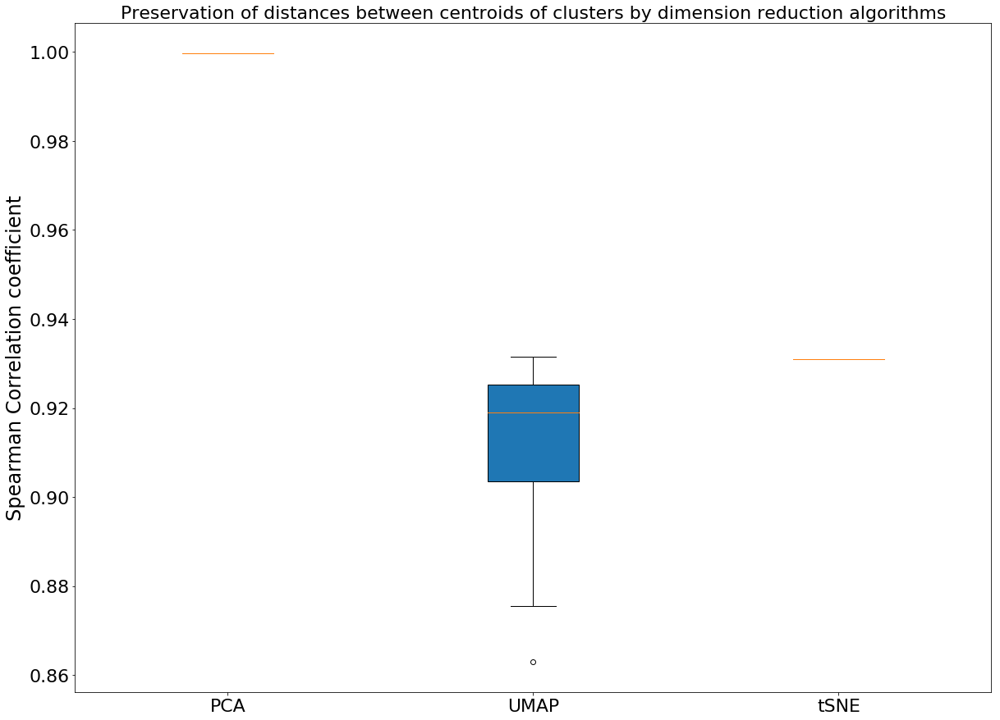

In [34]:
import matplotlib
plt.figure(figsize = (20, 15))
matplotlib.rcParams.update({'font.size': 22})
plt.boxplot([coef_pca_centroids_list, coef_umap_centroids_list, coef_tsne_centroids_list], 
            labels = ['PCA', 'UMAP', 'tSNE'], patch_artist = True)
plt.title('Preservation of distances between centroids of clusters by dimension reduction algorithms', 
          fontsize = 22)
plt.ylabel('Spearman Correlation coefficient', fontsize = 24)
plt.show()

We conclude that we do not observe a significant different in distance preservation between centroids of clusters by UMAP and tSNE, PCA of course perfectly preserved the distances between centroids. Here we observe a very interesting lack of stochasticity for tSNE, i.e. the result becomes deterministic (the same from run to run) when initialization is not random. In contrast, initialization is not the only source of stocasticity for UMAP but it also comes from the stocastic gradient descent. Here we see that for a non-random initialization, the result of UMAP still varies from run to run because of stochastic gradient descent.

Measuring distances between centroids, i.e. ignoring the variation in the data, is perhaps not a very good idea since the clusters are elogated. Therefore a better idea is to compute Mahalanobis distances between all pairs of clusters. [Mahalanobis distance](https://en.wikipedia.org/wiki/Mahalanobis_distance) first calculates distances between each point of one cluster to the centroid of the second cluster and normalizes those distances by the "thickness" of the variation (assuming the clustesr have ellipsoidal symmetry) in the second cluster.

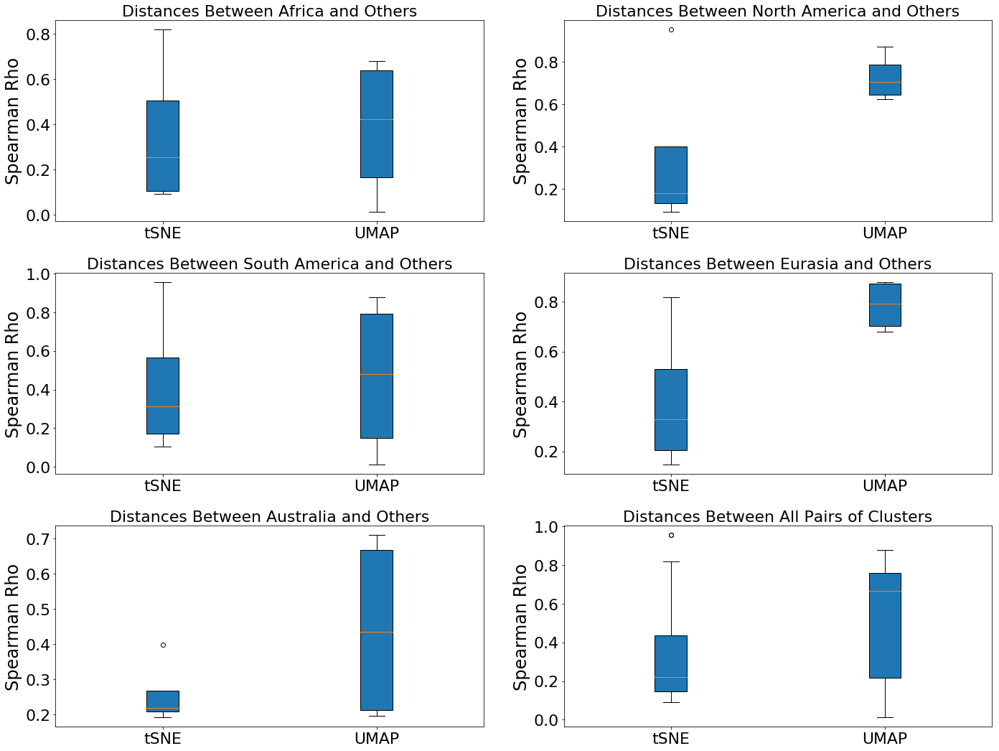

In [184]:
import matplotlib
from scipy.stats import spearmanr
from sklearn.metrics.pairwise import pairwise_distances

figure = plt.figure(figsize = (20, 15))
matplotlib.rcParams.update({'font.size': 22})

clusters = list(set(y))
clust_dict = {'brown': 'North America', 'red': 'South America', 'blue': 'Eurasia', 
              'darkgreen': 'Africa', 'darkorange': 'Australia'}

coef_tsne_all = []; coef_umap_all = []
for clust_index, j in enumerate(clusters):
    coef_tsne = []; coef_umap = []
    for i in clusters:
        if(i!=j):
            orig_dist = np.square(pairwise_distances(X[y == j], X[y == i], metric = 'mahalanobis')).flatten()
            tsne_dist = np.square(pairwise_distances(tsne[y == j], 
                                                     tsne[y == i], metric = 'mahalanobis')).flatten()
            umap_dist = np.square(pairwise_distances(umap[y == j], 
                                                     umap[y == i], metric = 'mahalanobis')).flatten()
            coef_tsne_current, _ = spearmanr(orig_dist, tsne_dist)
            coef_umap_current, _ = spearmanr(orig_dist, umap_dist)
            coef_tsne.append(np.abs(coef_tsne_current))
            coef_umap.append(np.abs(coef_umap_current))
    
    plt.subplot(321 + clust_index)
    plt.boxplot([coef_tsne, coef_umap], labels = ['tSNE', 'UMAP'], patch_artist = True)
    plt.title('Distances Between {} and Others'.format(clust_dict[j]), fontsize = 22)
    plt.ylabel('Spearman Rho', fontsize = 24)
    
    coef_tsne_all.append(coef_tsne)
    coef_umap_all.append(coef_umap)

coef_tsne_all = [y for x in coef_tsne_all for y in x]
coef_umap_all = [y for x in coef_umap_all for y in x]

plt.subplot(326)
plt.boxplot([coef_tsne_all, coef_umap_all], labels = ['tSNE', 'UMAP'], patch_artist = True)
plt.title('Distances Between All Pairs of Clusters', fontsize = 22)
plt.ylabel('Spearman Rho', fontsize = 24)

figure.tight_layout()
plt.show()

In [185]:
from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(coef_tsne_all, coef_umap_all)
print('Statistics = %.3f, p = %.3f' % (stat, p))

Statistics = 132.000, p = 0.034


Here we observe that while being somewhat unclear for South America, Australia and Africa, at least for North America and Eurasia, UMAP preserves the original mahalanobis distance between those clustesr and the other ones much better than tSNE. Averaging across all clusters (the last plot in the figure above) and performing a Mann-Whittney U test, we demonstrate that indeed **UMAP significantly better preserves original Mahalanobis distances between the continets / clusters**.

Let us now estimate how well the shape of the clusters is preserved by the different dimension reduction methods. By shape of the clusters we understand the sizes (heigh and width) of the bounding box wrapped around the clusters. The scale of the bounding boxes is changed a lot during tSNE and UMAP dimension reduction, i.e. it can be stratched or squeezed, however both width and height should change proportionally towards each other (keeping its scaling ratio) and towards the initial dimension of the bounding box. Therefore we are going to use Spearman correlation coefficient between original and reconstructed sizes of the bounding boxes as a criterion of how well the dimension reduction algorithms can preserve the shapes of the clusters.

Working with iteration 1


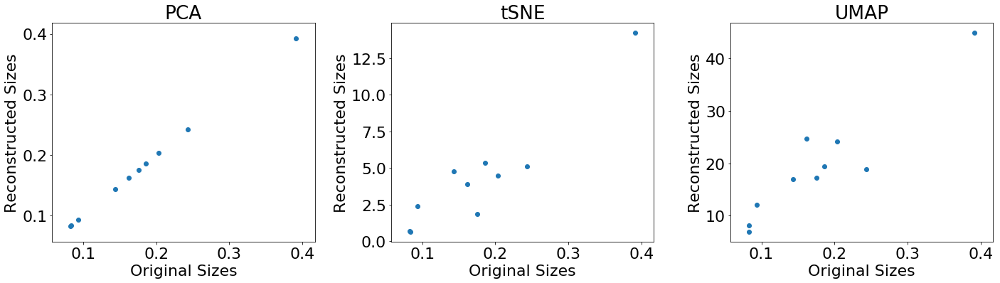

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.8424242424242423
****************************************************************************
Working with iteration 2


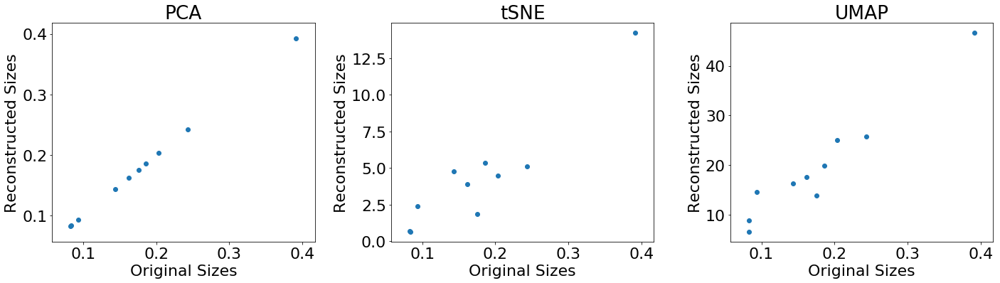

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.9272727272727272
****************************************************************************
Working with iteration 3


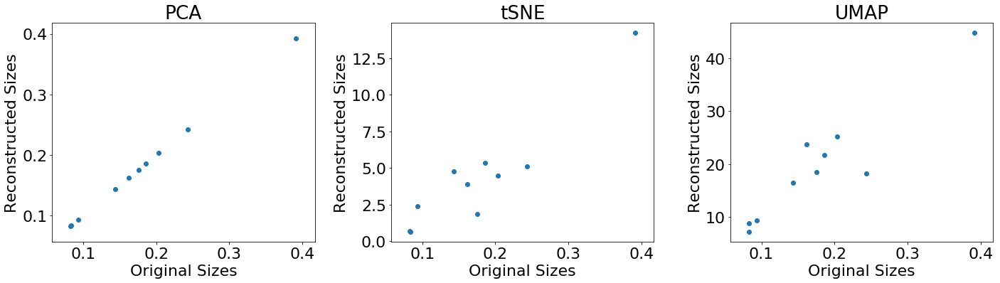

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.8303030303030302
****************************************************************************
Working with iteration 4


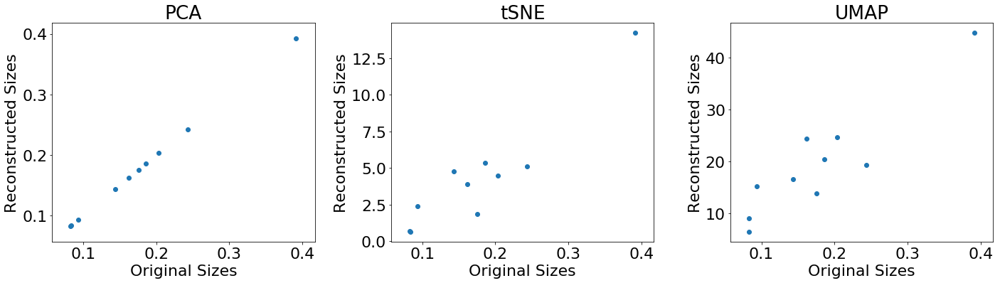

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.8181818181818182
****************************************************************************
Working with iteration 5


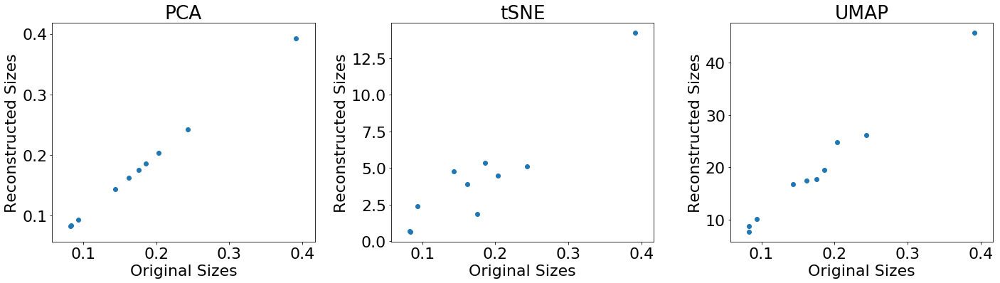

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.9878787878787878
****************************************************************************
Working with iteration 6


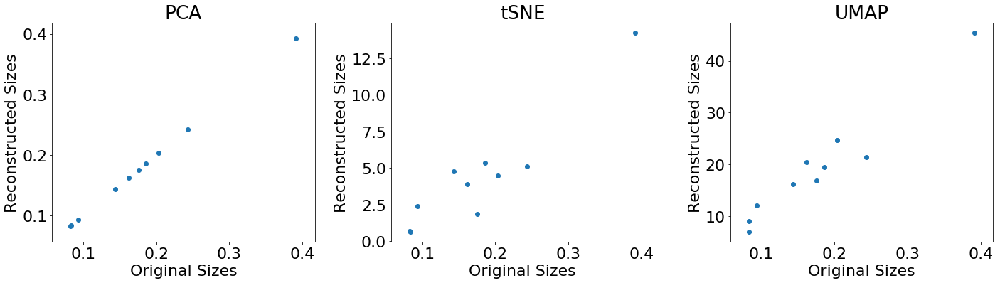

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.9393939393939393
****************************************************************************
Working with iteration 7


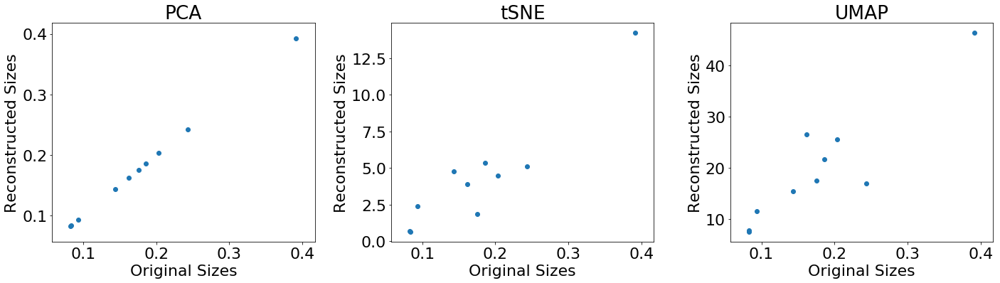

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.7939393939393938
****************************************************************************
Working with iteration 8


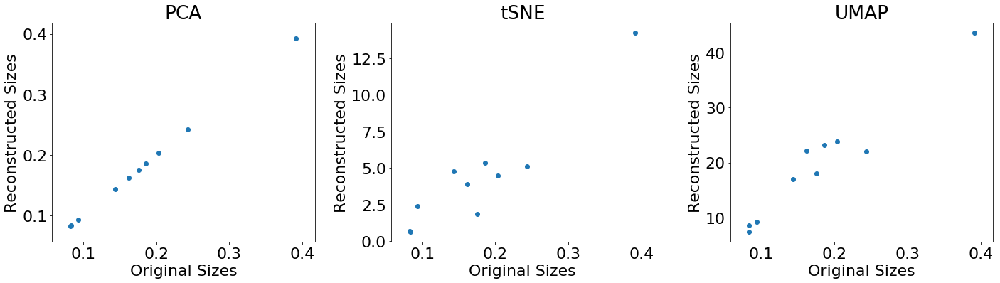

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.8909090909090909
****************************************************************************
Working with iteration 9


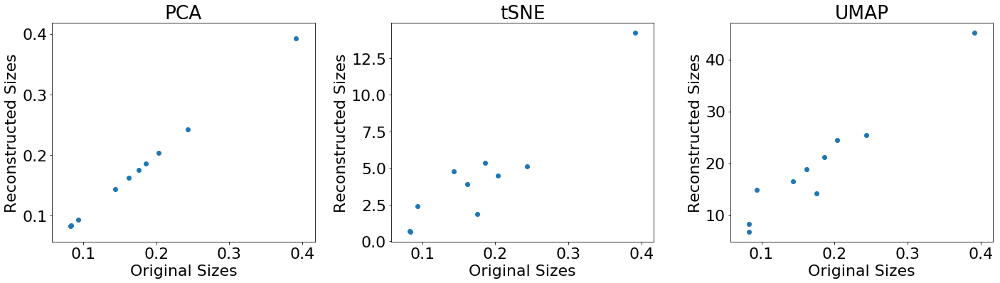

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.9272727272727272
****************************************************************************
Working with iteration 10


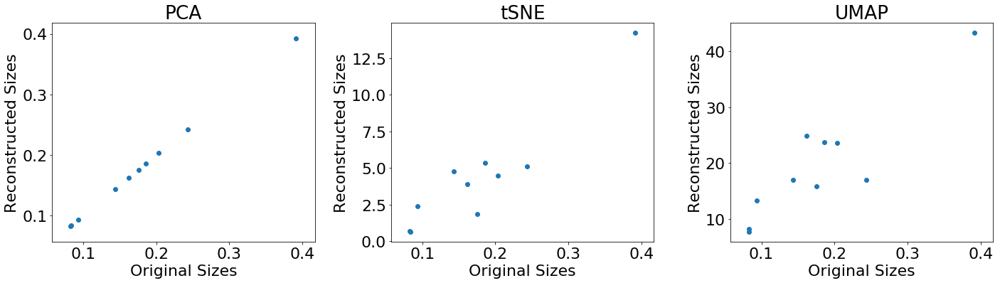

Spearman correlation coeffcient for PCA dimension reduction = 0.9999999999999999
Spearman correlation coeffcient for tSNE dimension reduction = 0.8181818181818182
Spearman correlation coeffcient for UMAP dimension reduction = 0.7454545454545454
****************************************************************************


In [226]:
import warnings
warnings.filterwarnings("ignore")

import random
from umap import UMAP
from sklearn.manifold import TSNE
from scipy.stats import spearmanr
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances

coef_sizes_pca_list = []; coef_sizes_tsne_list = []; coef_sizes_umap_list = []
for i in range(10):
    print('Working with iteration {}'.format(i + 1))
    
    NorthAmerica_bb_coords = [np.min(X_NorthAmerica[:,0]), np.max(X_NorthAmerica[:,0]), 
                              np.min(X_NorthAmerica[:,1]), np.max(X_NorthAmerica[:,1])]
    NorthAmerica_bb_sizes = np.array([NorthAmerica_bb_coords[1] - NorthAmerica_bb_coords[0], 
                                      NorthAmerica_bb_coords[3] - NorthAmerica_bb_coords[2]])
    SouthAmerica_bb_coords = [np.min(X_SouthAmerica[:,0]), np.max(X_SouthAmerica[:,0]), 
                              np.min(X_SouthAmerica[:,1]), np.max(X_SouthAmerica[:,1])]
    SouthAmerica_bb_sizes = np.array([SouthAmerica_bb_coords[1] - SouthAmerica_bb_coords[0], 
                                      SouthAmerica_bb_coords[3] - SouthAmerica_bb_coords[2]])
    Australia_bb_coords = [np.min(X_Australia[:,0]), np.max(X_Australia[:,0]), 
                           np.min(X_Australia[:,1]), np.max(X_Australia[:,1])]
    Australia_bb_sizes = np.array([Australia_bb_coords[1] - Australia_bb_coords[0], 
                                   Australia_bb_coords[3] - Australia_bb_coords[2]])
    Eurasia_bb_coords = [np.min(X_Eurasia[:,0]), np.max(X_Eurasia[:,0]), 
                         np.min(X_Eurasia[:,1]), np.max(X_Eurasia[:,1])]
    Eurasia_bb_sizes = np.array([Eurasia_bb_coords[1] - Eurasia_bb_coords[0], 
                                 Eurasia_bb_coords[3] - Eurasia_bb_coords[2]])
    Africa_bb_coords = [np.min(X_Africa[:,0]), np.max(X_Africa[:,0]), 
                        np.min(X_Africa[:,1]), np.max(X_Africa[:,1])]
    Africa_bb_sizes = np.array([Africa_bb_coords[1] - Africa_bb_coords[0], 
                                Africa_bb_coords[3] - Africa_bb_coords[2]])
    orig_bb_sizes = np.vstack((NorthAmerica_bb_sizes, SouthAmerica_bb_sizes, Australia_bb_sizes, 
                               Eurasia_bb_sizes, Africa_bb_sizes)).flatten()
    
    
    X_reduced = PCA(n_components = 2).fit_transform(X)
    NorthAmerica_pca_bb_coords = [np.min(X_reduced[y == 'brown'][:,0]), np.max(X_reduced[y == 'brown'][:,0]), 
                                  np.min(X_reduced[y == 'brown'][:,1]), np.max(X_reduced[y == 'brown'][:,1])]
    NorthAmerica_pca_bb_sizes = np.array([NorthAmerica_pca_bb_coords[1] - NorthAmerica_pca_bb_coords[0], 
                                          NorthAmerica_pca_bb_coords[3] - NorthAmerica_pca_bb_coords[2]])
    SouthAmerica_pca_bb_coords = [np.min(X_reduced[y == 'red'][:,0]), np.max(X_reduced[y == 'red'][:,0]), 
                                  np.min(X_reduced[y == 'red'][:,1]), np.max(X_reduced[y == 'red'][:,1])]
    SouthAmerica_pca_bb_sizes = np.array([SouthAmerica_pca_bb_coords[1] - SouthAmerica_pca_bb_coords[0], 
                                          SouthAmerica_pca_bb_coords[3] - SouthAmerica_pca_bb_coords[2]])
    Australia_pca_bb_coords = [np.min(X_reduced[y == 'darkorange'][:,0]), 
                               np.max(X_reduced[y == 'darkorange'][:,0]), 
                               np.min(X_reduced[y == 'darkorange'][:,1]), 
                               np.max(X_reduced[y == 'darkorange'][:,1])]
    Australia_pca_bb_sizes = np.array([Australia_pca_bb_coords[1] - Australia_pca_bb_coords[0], 
                                       Australia_pca_bb_coords[3] - Australia_pca_bb_coords[2]])
    Eurasia_pca_bb_coords = [np.min(X_reduced[y == 'blue'][:,0]), np.max(X_reduced[y == 'blue'][:,0]), 
                             np.min(X_reduced[y == 'blue'][:,1]), np.max(X_reduced[y == 'blue'][:,1])]
    Eurasia_pca_bb_sizes = np.array([Eurasia_pca_bb_coords[1] - Eurasia_pca_bb_coords[0], 
                                     Eurasia_pca_bb_coords[3] - Eurasia_pca_bb_coords[2]])
    Africa_pca_bb_coords = [np.min(X_reduced[y == 'darkgreen'][:,0]), np.max(X_reduced[y == 'darkgreen'][:,0]), 
                            np.min(X_reduced[y == 'darkgreen'][:,1]), np.max(X_reduced[y == 'darkgreen'][:,1])]
    Africa_pca_bb_sizes = np.array([Africa_pca_bb_coords[1] - Africa_pca_bb_coords[0], 
                                    Africa_pca_bb_coords[3] - Africa_pca_bb_coords[2]])
    pca_bb_sizes = np.vstack((NorthAmerica_pca_bb_sizes, SouthAmerica_pca_bb_sizes, 
                              Australia_pca_bb_sizes, Eurasia_pca_bb_sizes, Africa_pca_bb_sizes)).flatten()
    
    
    model_tsne = TSNE(learning_rate = 200, n_components = 2, perplexity = 500, 
                      init = X_reduced, n_iter = 1000, verbose = 0)
    tsne = model_tsne.fit_transform(X)
    NorthAmerica_tsne_bb_coords = [np.min(tsne[y == 'brown'][:,0]), np.max(tsne[y == 'brown'][:,0]), 
                                   np.min(tsne[y == 'brown'][:,1]), np.max(tsne[y == 'brown'][:,1])]
    NorthAmerica_tsne_bb_sizes = np.array([NorthAmerica_tsne_bb_coords[1] - NorthAmerica_tsne_bb_coords[0], 
                                           NorthAmerica_tsne_bb_coords[3] - NorthAmerica_tsne_bb_coords[2]])
    SouthAmerica_tsne_bb_coords = [np.min(tsne[y == 'red'][:,0]), np.max(tsne[y == 'red'][:,0]), 
                                   np.min(tsne[y == 'red'][:,1]), np.max(tsne[y == 'red'][:,1])]
    SouthAmerica_tsne_bb_sizes = np.array([SouthAmerica_tsne_bb_coords[1] - SouthAmerica_tsne_bb_coords[0], 
                                           SouthAmerica_tsne_bb_coords[3] - SouthAmerica_tsne_bb_coords[2]])
    Australia_tsne_bb_coords = [np.min(tsne[y == 'darkorange'][:,0]), np.max(tsne[y == 'darkorange'][:,0]), 
                                np.min(tsne[y == 'darkorange'][:,1]), np.max(tsne[y == 'darkorange'][:,1])]
    Australia_tsne_bb_sizes = np.array([Australia_tsne_bb_coords[1] - Australia_tsne_bb_coords[0], 
                                        Australia_tsne_bb_coords[3] - Australia_tsne_bb_coords[2]])
    Eurasia_tsne_bb_coords = [np.min(tsne[y == 'blue'][:,0]), np.max(tsne[y == 'blue'][:,0]), 
                              np.min(tsne[y == 'blue'][:,1]), np.max(tsne[y == 'blue'][:,1])]
    Eurasia_tsne_bb_sizes = np.array([Eurasia_tsne_bb_coords[1] - Eurasia_tsne_bb_coords[0], 
                                      Eurasia_tsne_bb_coords[3] - Eurasia_tsne_bb_coords[2]])
    Africa_tsne_bb_coords = [np.min(tsne[y == 'darkgreen'][:,0]), np.max(tsne[y == 'darkgreen'][:,0]), 
                             np.min(tsne[y == 'darkgreen'][:,1]), np.max(tsne[y == 'darkgreen'][:,1])]
    Africa_tsne_bb_sizes = np.array([Africa_tsne_bb_coords[1] - Africa_tsne_bb_coords[0], 
                                     Africa_tsne_bb_coords[3] - Africa_tsne_bb_coords[2]])
    tsne_bb_sizes = np.vstack((NorthAmerica_tsne_bb_sizes, SouthAmerica_tsne_bb_sizes, 
                               Australia_tsne_bb_sizes, Eurasia_tsne_bb_sizes, Africa_tsne_bb_sizes)).flatten()
    
    
    model_umap = UMAP(learning_rate = 1, n_components = 2, min_dist = 2, n_neighbors = 500, 
                      init = X_reduced, n_epochs = 1000, verbose = 0, spread = 2)
    umap = model_umap.fit_transform(X)
    NorthAmerica_umap_bb_coords = [np.min(umap[y == 'brown'][:,0]), np.max(umap[y == 'brown'][:,0]), 
                                   np.min(umap[y == 'brown'][:,1]), np.max(umap[y == 'brown'][:,1])]
    NorthAmerica_umap_bb_sizes = np.array([NorthAmerica_umap_bb_coords[1] - NorthAmerica_umap_bb_coords[0], 
                                           NorthAmerica_umap_bb_coords[3] - NorthAmerica_umap_bb_coords[2]])
    SouthAmerica_umap_bb_coords = [np.min(umap[y == 'red'][:,0]), np.max(umap[y == 'red'][:,0]), 
                                   np.min(umap[y == 'red'][:,1]), np.max(umap[y == 'red'][:,1])]
    SouthAmerica_umap_bb_sizes = np.array([SouthAmerica_umap_bb_coords[1] - SouthAmerica_umap_bb_coords[0], 
                                           SouthAmerica_umap_bb_coords[3] - SouthAmerica_umap_bb_coords[2]])
    Australia_umap_bb_coords = [np.min(umap[y == 'darkorange'][:,0]), np.max(umap[y == 'darkorange'][:,0]), 
                                np.min(umap[y == 'darkorange'][:,1]), np.max(umap[y == 'darkorange'][:,1])]
    Australia_umap_bb_sizes = np.array([Australia_umap_bb_coords[1] - Australia_umap_bb_coords[0], 
                                        Australia_umap_bb_coords[3] - Australia_umap_bb_coords[2]])
    Eurasia_umap_bb_coords = [np.min(umap[y == 'blue'][:,0]), np.max(umap[y == 'blue'][:,0]), 
                              np.min(umap[y == 'blue'][:,1]), np.max(umap[y == 'blue'][:,1])]
    Eurasia_umap_bb_sizes = np.array([Eurasia_umap_bb_coords[1] - Eurasia_umap_bb_coords[0], 
                                      Eurasia_umap_bb_coords[3] - Eurasia_umap_bb_coords[2]])
    Africa_umap_bb_coords = [np.min(umap[y == 'darkgreen'][:,0]), np.max(umap[y == 'darkgreen'][:,0]), 
                             np.min(umap[y == 'darkgreen'][:,1]), np.max(umap[y == 'darkgreen'][:,1])]
    Africa_umap_bb_sizes = np.array([Africa_umap_bb_coords[1] - Africa_umap_bb_coords[0], 
                                     Africa_umap_bb_coords[3] - Africa_umap_bb_coords[2]])
    umap_bb_sizes = np.vstack((NorthAmerica_umap_bb_sizes, SouthAmerica_umap_bb_sizes, 
                               Australia_umap_bb_sizes, Eurasia_umap_bb_sizes, Africa_umap_bb_sizes)).flatten()
    
    
    coef_sizes_pca, p_sizes_pca = spearmanr(orig_bb_sizes, pca_bb_sizes)
    coef_sizes_tsne, p_sizes_tsne = spearmanr(orig_bb_sizes, tsne_bb_sizes)
    coef_sizes_umap, p_sizes_umap = spearmanr(orig_bb_sizes, umap_bb_sizes)
    
    coef_sizes_pca_list.append(coef_sizes_pca)
    coef_sizes_tsne_list.append(coef_sizes_tsne)
    coef_sizes_umap_list.append(coef_sizes_umap)
    
    figure = plt.figure(figsize = (20, 6))
    plt.subplot(131)
    plt.scatter(orig_bb_sizes, pca_bb_sizes)
    plt.xlabel('Original Sizes'); plt.ylabel('Reconstructed Sizes'); plt.title('PCA')
    plt.subplot(132)
    plt.scatter(orig_bb_sizes, tsne_bb_sizes)
    plt.xlabel('Original Sizes'); plt.ylabel('Reconstructed Sizes'); plt.title('tSNE')
    plt.subplot(133)
    plt.scatter(orig_bb_sizes, umap_bb_sizes)
    plt.xlabel('Original Sizes'); plt.ylabel('Reconstructed Sizes'); plt.title('UMAP')
    figure.tight_layout()
    plt.show()
    
    print('Spearman correlation coeffcient for PCA dimension reduction = {}'.format(coef_sizes_pca))
    print('Spearman correlation coeffcient for tSNE dimension reduction = {}'.format(coef_sizes_tsne))
    print('Spearman correlation coeffcient for UMAP dimension reduction = {}'.format(coef_sizes_umap))
    print('****************************************************************************')

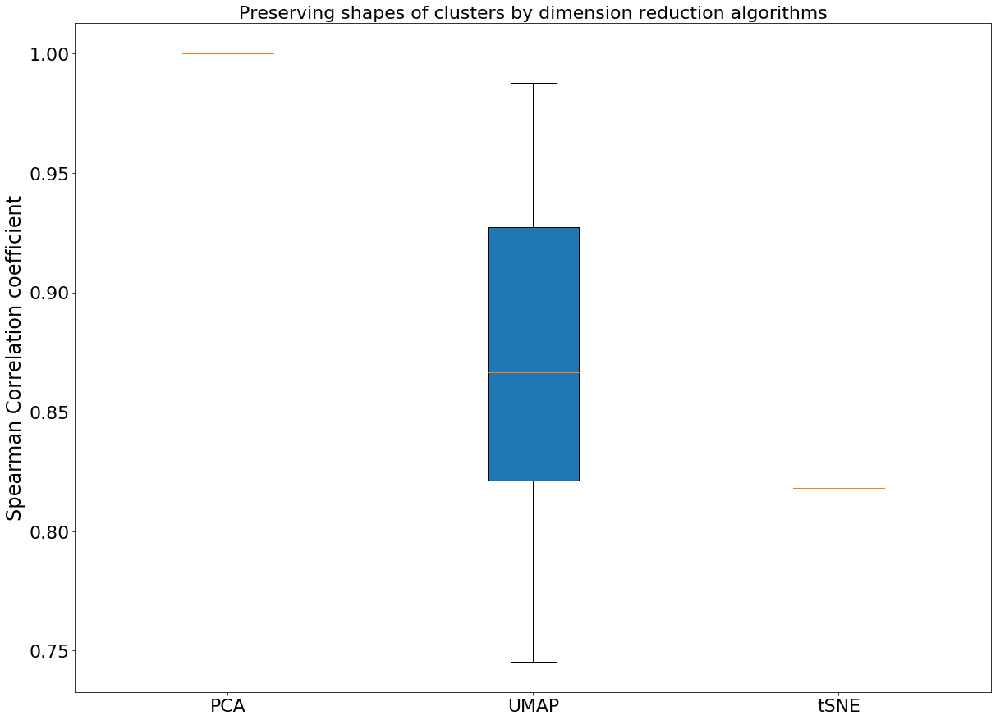

In [227]:
import matplotlib
plt.figure(figsize = (20, 15))
matplotlib.rcParams.update({'font.size': 22})
plt.boxplot([coef_sizes_pca_list, coef_sizes_umap_list, coef_sizes_tsne_list], 
            labels = ['PCA', 'UMAP', 'tSNE'], patch_artist = True)
plt.title('Preserving shapes of clusters by dimension reduction algorithms', fontsize = 22)
plt.ylabel('Spearman Correlation coefficient', fontsize = 24)
plt.show()

In [228]:
from scipy.stats import mannwhitneyu
stat, p = mannwhitneyu(coef_sizes_umap_list, coef_sizes_tsne_list)
print('Statistics = %.3f, p = %.3f' % (stat, p))

Statistics = 25.000, p = 0.021


PCA of course demonstrates a perfect correlation between original and reconstructed sizes of the bounding boxes around the clusters. Regarding tSNE vs. UMAP, despite large variation in the UMAP Spearman correlation coefficient between original and reconstructed cluster sizes, we conclude that **UMAP significantly better preserves the shapes / sizes of the clusters** which is another confirmation of better global structure preservation by UMAP compared to tSNE.

### Linear Manifold Without Noise  <a class="anchor" id="Linear-Manifold-Without-Noise"></a>

First let us construct a sintetic data set. We will use the fantastic [In-Depth Manifold Learning](https://jakevdp.github.io/PythonDataScienceHandbook/05.10-manifold-learning.html) tutorial and start with a word projected to a linear manifold without added noise, later we are going to project the word onto a non-linear manifold such as S-curve or swiss roll.

To construct the sintetic data set we will use the fantastic [In-Depth Manifold Learning](https://jakevdp.github.io/PythonDataScienceHandbook/05.10-manifold-learning.html) tutorial and start with a 2D collection of points.

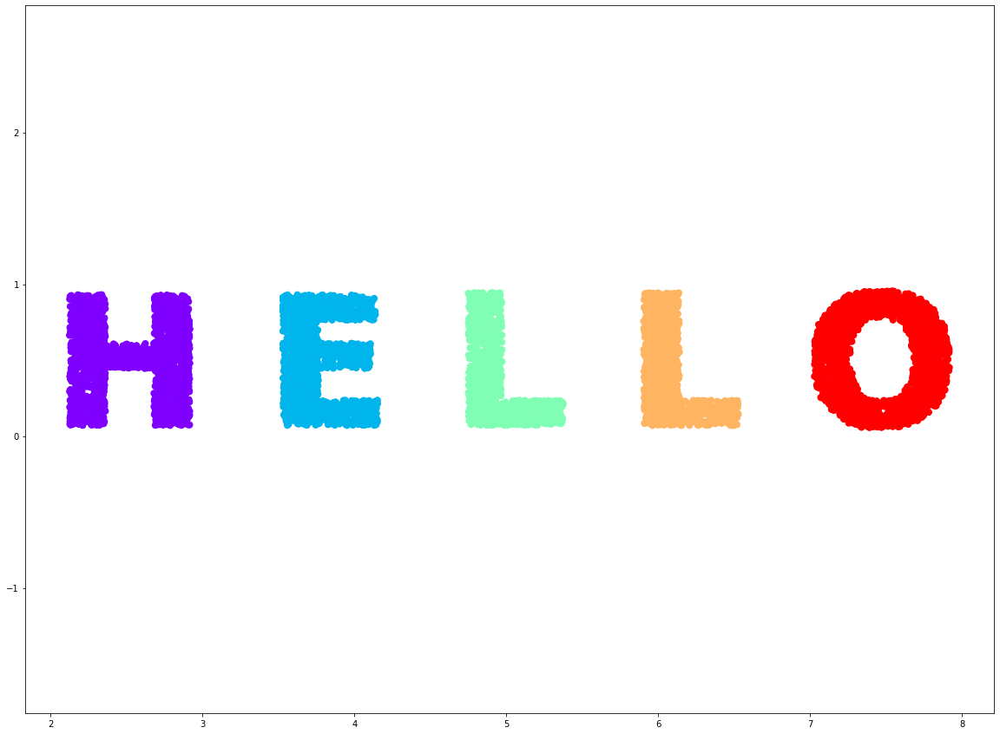

In [155]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.image import imread

N = 10000
fig, ax = plt.subplots(figsize=(10, 1))
fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
ax.axis('off')
ax.text(0.5, 0.4, 'H E L L O', va = 'center', ha = 'center', weight = 'bold', size = 85)
fig.savefig('hello.png')
plt.close(fig)
    
data = imread('hello.png')[::-1, :, 0].T
rng = np.random.RandomState(123)
X = rng.rand(4 * N, 2)
i, j = (X * data.shape).astype(int).T
mask = (data[i, j] < 1)
X = X[mask]
X[:, 0] *= (data.shape[0] / data.shape[1])
X = X[:N]
X = X[np.argsort(X[:, 0])]
plt.figure(figsize=(20,15))
plt.scatter(X[:, 0], X[:, 1], c = X[:, 0], cmap = plt.cm.get_cmap('rainbow', 5), s = 50)
plt.axis('equal');

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

def make_hello(N=1000, rseed=42):
    # Make a plot with "HELLO" text; save as PNG
    fig, ax = plt.subplots(figsize=(4, 1))
    fig.subplots_adjust(left=0, right=1, bottom=0, top=1)
    ax.axis('off')
    ax.text(0.5, 0.4, 'HELLO', va='center', ha='center', weight='bold', size=85)
    fig.savefig('hello.png')
    plt.close(fig)
    
    # Open this PNG and draw random points from it
    from matplotlib.image import imread
    data = imread('hello.png')[::-1, :, 0].T
    rng = np.random.RandomState(rseed)
    X = rng.rand(4 * N, 2)
    i, j = (X * data.shape).astype(int).T
    mask = (data[i, j] < 1)
    X = X[mask]
    X[:, 0] *= (data.shape[0] / data.shape[1])
    X = X[:N]
    return X[np.argsort(X[:, 0])]

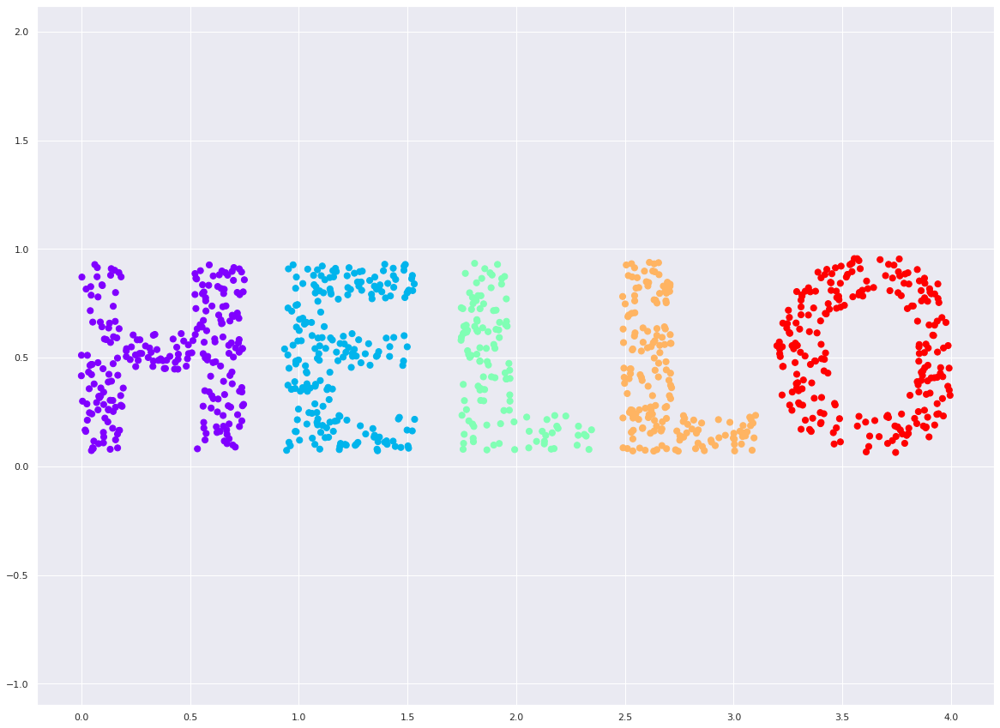

In [2]:
X = make_hello(1000)
plt.figure(figsize=(20,15))
plt.scatter(X[:, 0], X[:, 1], c=X[:, 0], cmap=plt.cm.get_cmap('rainbow', 5), s = 50)
plt.axis('equal');

This is how the synetic data looks like, it is just a 2D numpy array containing 1000 data points.

In [3]:
X

array([[4.65390215e-05, 4.16565828e-01],
       [5.38772018e-04, 5.11129139e-01],
       [2.61356305e-03, 8.70669034e-01],
       ...,
       [3.99099756e+00, 4.51739476e-01],
       [3.99173644e+00, 3.50711815e-01],
       [3.99557045e+00, 3.26639249e-01]])

Now let us perform the linear dimension reduction with the Principal Component Analysis (PCA) and Multi-Dimensional Scaling (MDS) and see whether PCA and MDS will able to reconstruct the initial data set via the linear matrix decomposition.

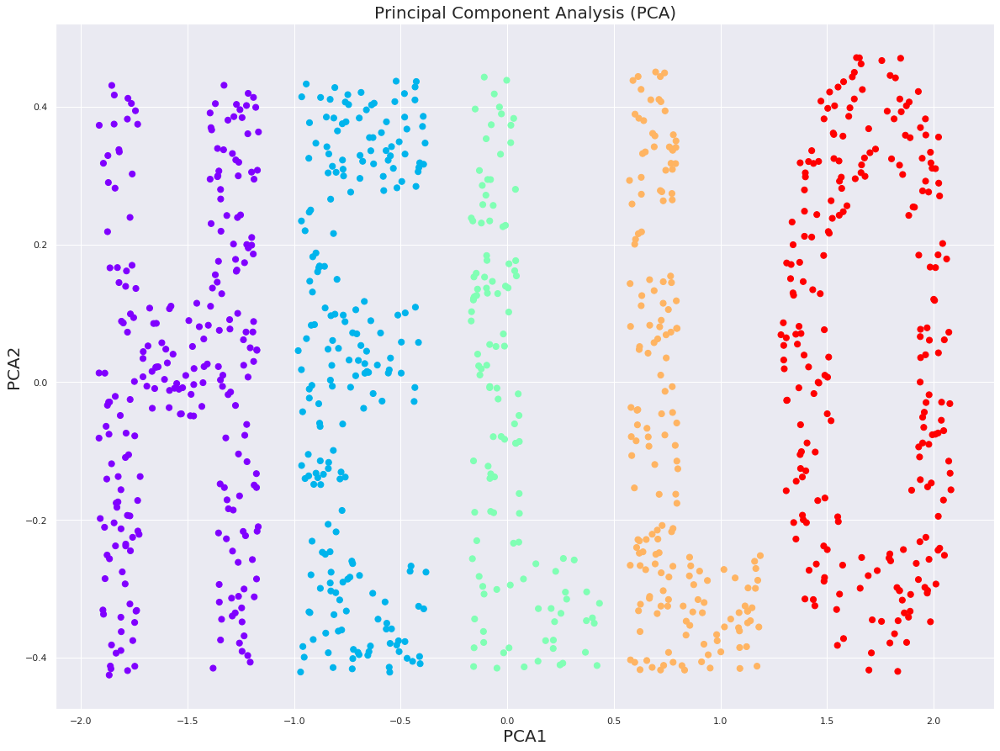

In [4]:
from sklearn.decomposition import PCA
X_reduced = PCA(n_components = 2).fit_transform(X)
plt.figure(figsize=(20,15))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c = X[:, 0], cmap = plt.cm.get_cmap('rainbow', 5), s = 50)
plt.title('Principal Component Analysis (PCA)', fontsize = 20)
plt.xlabel("PCA1", fontsize = 20)
plt.ylabel("PCA2", fontsize = 20)
plt.show()

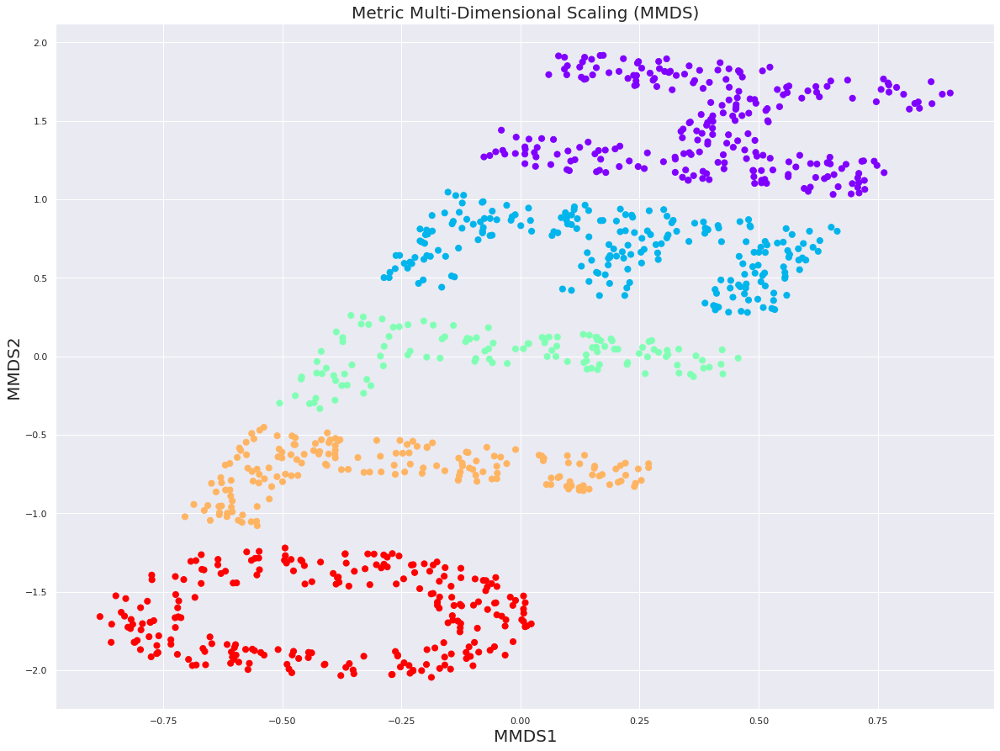

In [5]:
from sklearn.manifold import MDS
model_mds = MDS(n_components = 2, random_state = 123, metric = True)
mmds = model_mds.fit_transform(X)
plt.figure(figsize=(20,15))
plt.scatter(mmds[:, 0], mmds[:, 1], c = X[:, 0], cmap = plt.cm.get_cmap('rainbow', 5), s = 50)
plt.title('Metric Multi-Dimensional Scaling (MMDS)', fontsize = 20)
plt.xlabel("MMDS1", fontsize = 20)
plt.ylabel("MMDS2", fontsize = 20)
plt.show()

We conclude that the PCA and MDS perfectly reconstructed the original data, this is not surprising because it is a 2D data and a linear manifold, i.e. only rotations, scaling and translations. For comparision we will check the Laplacian Eigenmaps dimension reduction plot.

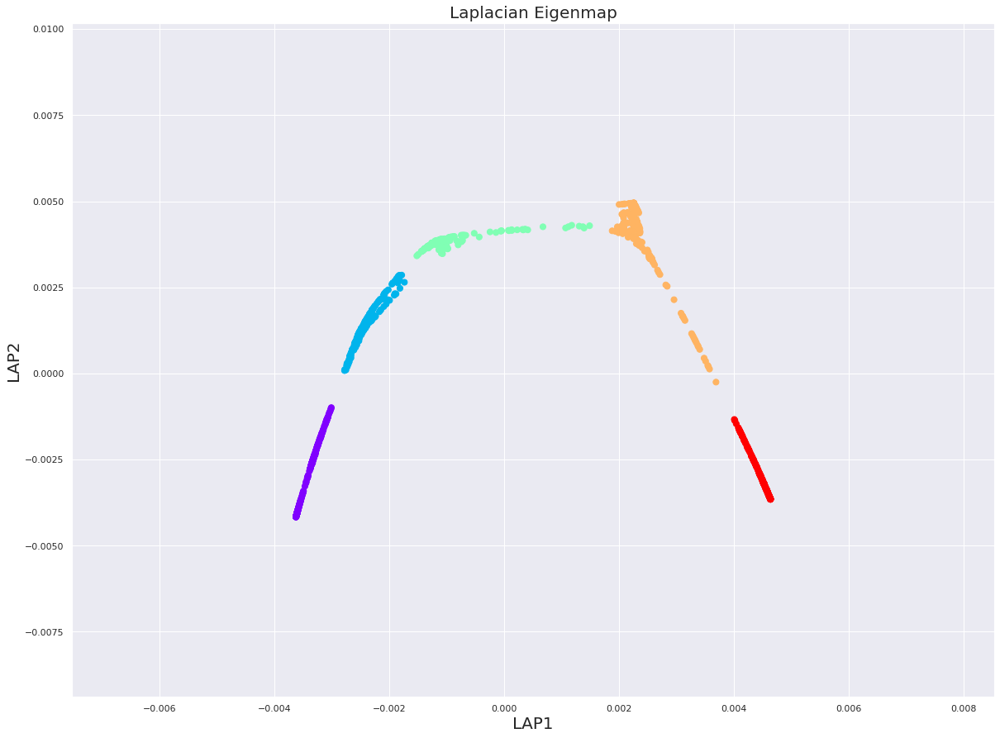

In [6]:
from sklearn.manifold import SpectralEmbedding
model = SpectralEmbedding(n_components = 2)
se = model.fit_transform(X)
plt.figure(figsize=(20,15))
plt.scatter(se[:, 0], se[:, 1], c = X[:, 0], cmap = plt.cm.get_cmap('rainbow', 5), s = 50)
plt.title('Laplacian Eigenmap', fontsize = 20)
plt.xlabel("LAP1", fontsize = 20)
plt.ylabel("LAP2", fontsize = 20)
plt.show()

The Laplacian eigenmaps tend to group points from each cluster / letter together into a single point which explains why Spectral Clustering is such a powerful and popular technique. Since the Laplacian Eigenmaps basically produces very tighthly packed clusters, it is very easy to run any clustering algorithm, even K-means, on the top of the dimensions reduction.

Now it is time to run a non-linear dimension reduction such as tSNE. Here we will use a very large perplexity value, $\sqrt{N} \approx 30$ should be enough for a good balance between local and global structure. We will start with moderate perplexity = 30 and later we will use perplexity = 1000 in order to aim to fully reconstruct the origianl data set.

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.002s...
[t-SNE] Computed neighbors for 1000 samples in 0.012s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 0.102819
[t-SNE] Computed conditional probabilities in 0.055s
[t-SNE] Iteration 50: error = 2.3763542, gradient norm = 0.0218554 (50 iterations in 0.267s)
[t-SNE] Iteration 100: error = 1.8734579, gradient norm = 0.0148718 (50 iterations in 0.208s)
[t-SNE] Iteration 150: error = 1.4898815, gradient norm = 0.0100922 (50 iterations in 0.197s)
[t-SNE] Iteration 200: error = 1.2309555, gradient norm = 0.0071857 (50 iterations in 0.198s)
[t-SNE] Iteration 250: error = 1.0531418, gradient norm = 0.0053980 (50 iterations in 0.175s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 1.053142
[t-SNE] Iteration 300: error = 1.0176998, gradient norm = 0.0050624 (50 iterations in 0.187s)
[t-SNE] Iteration 350: error = 0.9356309, gradient norm = 0.0043211 (50

[t-SNE] Iteration 4250: error = 0.2537715, gradient norm = 0.0001086 (50 iterations in 0.210s)
[t-SNE] Iteration 4300: error = 0.2531673, gradient norm = 0.0001155 (50 iterations in 0.198s)
[t-SNE] Iteration 4350: error = 0.2526192, gradient norm = 0.0001158 (50 iterations in 0.211s)
[t-SNE] Iteration 4400: error = 0.2520021, gradient norm = 0.0001148 (50 iterations in 0.197s)
[t-SNE] Iteration 4450: error = 0.2512997, gradient norm = 0.0001161 (50 iterations in 0.208s)
[t-SNE] Iteration 4500: error = 0.2505736, gradient norm = 0.0001247 (50 iterations in 0.213s)
[t-SNE] Iteration 4550: error = 0.2496718, gradient norm = 0.0001393 (50 iterations in 0.209s)
[t-SNE] Iteration 4600: error = 0.2488306, gradient norm = 0.0001377 (50 iterations in 0.225s)
[t-SNE] Iteration 4650: error = 0.2480509, gradient norm = 0.0001179 (50 iterations in 0.208s)
[t-SNE] Iteration 4700: error = 0.2476044, gradient norm = 0.0001183 (50 iterations in 0.244s)
[t-SNE] Iteration 4750: error = 0.2474410, gradien

[t-SNE] Iteration 8600: error = 0.2252970, gradient norm = 0.0000718 (50 iterations in 0.222s)
[t-SNE] Iteration 8650: error = 0.2251626, gradient norm = 0.0000717 (50 iterations in 0.219s)
[t-SNE] Iteration 8700: error = 0.2250918, gradient norm = 0.0000737 (50 iterations in 0.213s)
[t-SNE] Iteration 8750: error = 0.2250383, gradient norm = 0.0000736 (50 iterations in 0.215s)
[t-SNE] Iteration 8800: error = 0.2249451, gradient norm = 0.0000755 (50 iterations in 0.210s)
[t-SNE] Iteration 8850: error = 0.2248710, gradient norm = 0.0000716 (50 iterations in 0.218s)
[t-SNE] Iteration 8900: error = 0.2247003, gradient norm = 0.0000715 (50 iterations in 0.212s)
[t-SNE] Iteration 8950: error = 0.2246633, gradient norm = 0.0000680 (50 iterations in 0.213s)
[t-SNE] Iteration 9000: error = 0.2245297, gradient norm = 0.0000677 (50 iterations in 0.210s)
[t-SNE] Iteration 9050: error = 0.2243963, gradient norm = 0.0000707 (50 iterations in 0.211s)
[t-SNE] Iteration 9100: error = 0.2243879, gradien

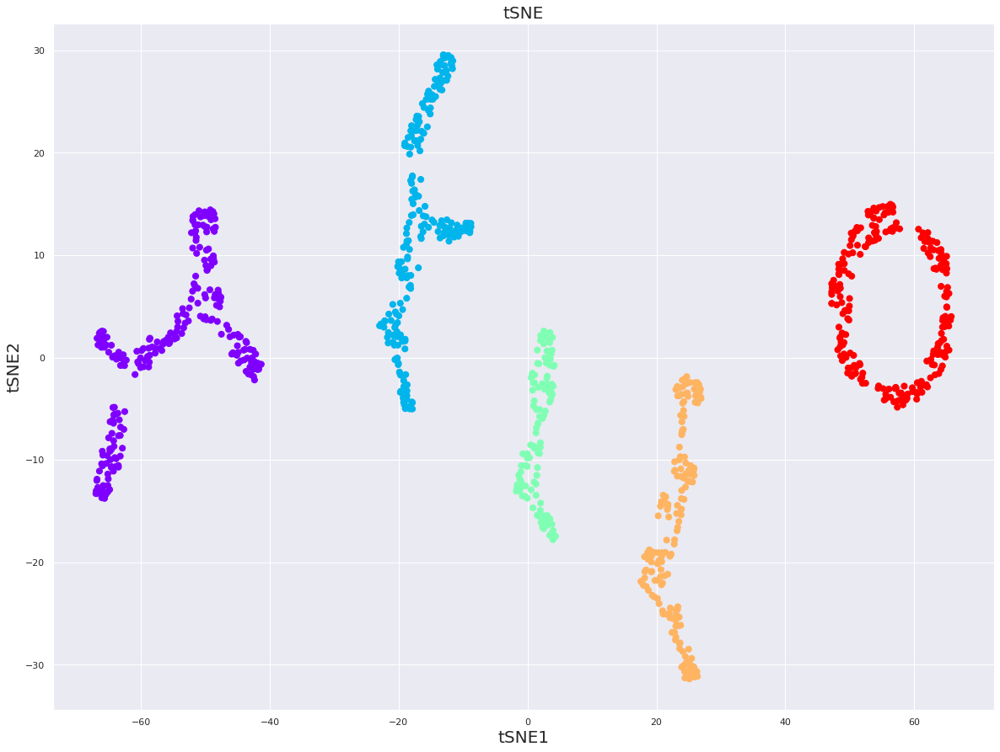

In [108]:
from sklearn.manifold import TSNE
X_reduced = PCA(n_components = 2).fit_transform(X)
model = TSNE(learning_rate = 1, n_components = 2, random_state = 123, perplexity = 30, 
             init = X_reduced, n_iter = 10000, verbose = 2, early_exaggeration = 1)
tsne = model.fit_transform(X)
plt.figure(figsize=(20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = X[:, 0], cmap = plt.cm.get_cmap('rainbow', 5), s = 50)
plt.title('tSNE', fontsize = 20)
plt.xlabel("tSNE1", fontsize = 20)
plt.ylabel("tSNE2", fontsize = 20)
plt.show()

Looks like tSNE almost reconstructed the original data. Let us check how UMAP performs on this data set:

UMAP(a=None, angular_rp_forest=False, b=None,
   init=array([[-1.91504, -0.08113],
       [-1.9149 ,  0.01343],
       ...,
       [ 2.07686, -0.13213],
       [ 2.08079, -0.15619]]),
   learning_rate=1, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=1, n_components=2, n_epochs=10000,
   n_neighbors=998, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=2)
Construct fuzzy simplicial set
Mon Jan 20 20:01:22 2020 Finding Nearest Neighbors
Mon Jan 20 20:01:22 2020 Finished Nearest Neighbor Search
Mon Jan 20 20:01:22 2020 Construct embedding
	completed  0  /  10000 epochs
	completed  1000  /  10000 epochs
	completed  2000  /  10000 epochs
	completed  3000  /  10000 epochs
	completed  4000  /  10000 epochs
	completed  5000  /  10000 epochs
	completed  6000

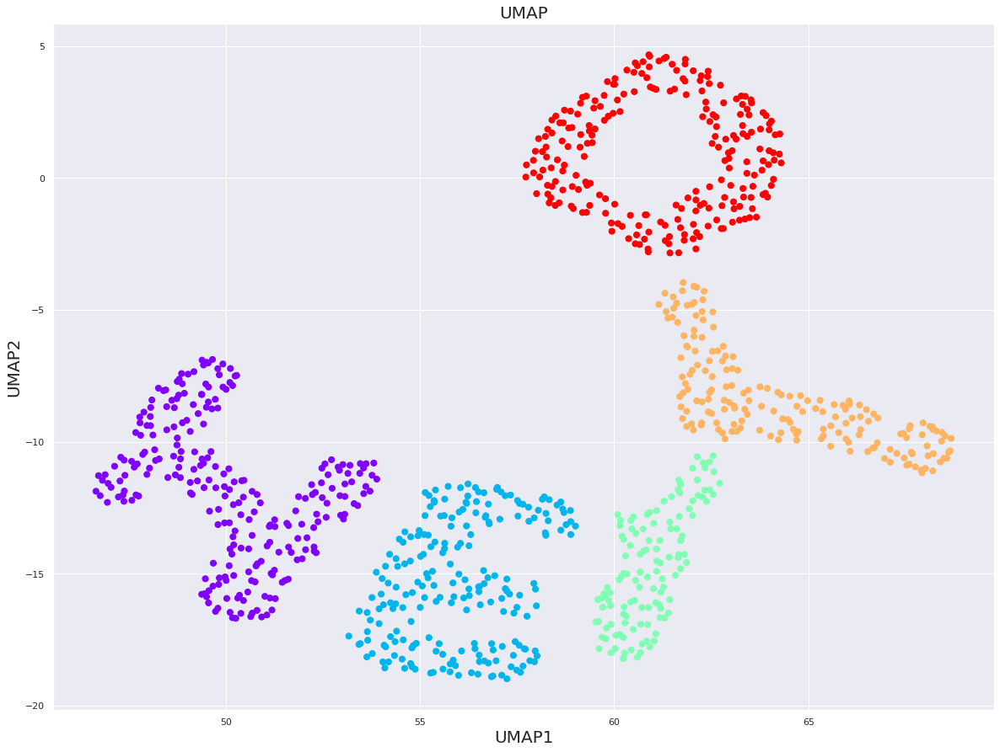

In [117]:
import warnings
warnings.filterwarnings("ignore")

from umap import UMAP
X_reduced = PCA(n_components = 2).fit_transform(X)
model = UMAP(learning_rate = 1, n_components = 2, min_dist = 1, n_neighbors = 998, 
             init = X_reduced, n_epochs = 10000, verbose = 2)
umap = model.fit_transform(X)
plt.figure(figsize=(20,15))
plt.scatter(umap[:, 0], umap[:, 1], c = X[:, 0], cmap = plt.cm.get_cmap('rainbow', 5), s = 50)
plt.title('UMAP', fontsize = 20)
plt.xlabel("UMAP1", fontsize = 20)
plt.ylabel("UMAP2", fontsize = 20)
plt.show()

We conclude that both tSNE and UMAP can reconstruct the original data. To achieve this, tSNE needs a large learning rate and perplexity close to the size of the data set, while UMAP needs a small learning rate, min_dist = 1 and large (almost infinite) n_neighbors.

### Contribution from Cost Function  <a class="anchor" id="Contribution-from-Cost-Function"></a>

Here we will plot derivative of tSNE cost function that is the KL-divergence, and UMAP cost function that is the Cross-Entropy (CE).

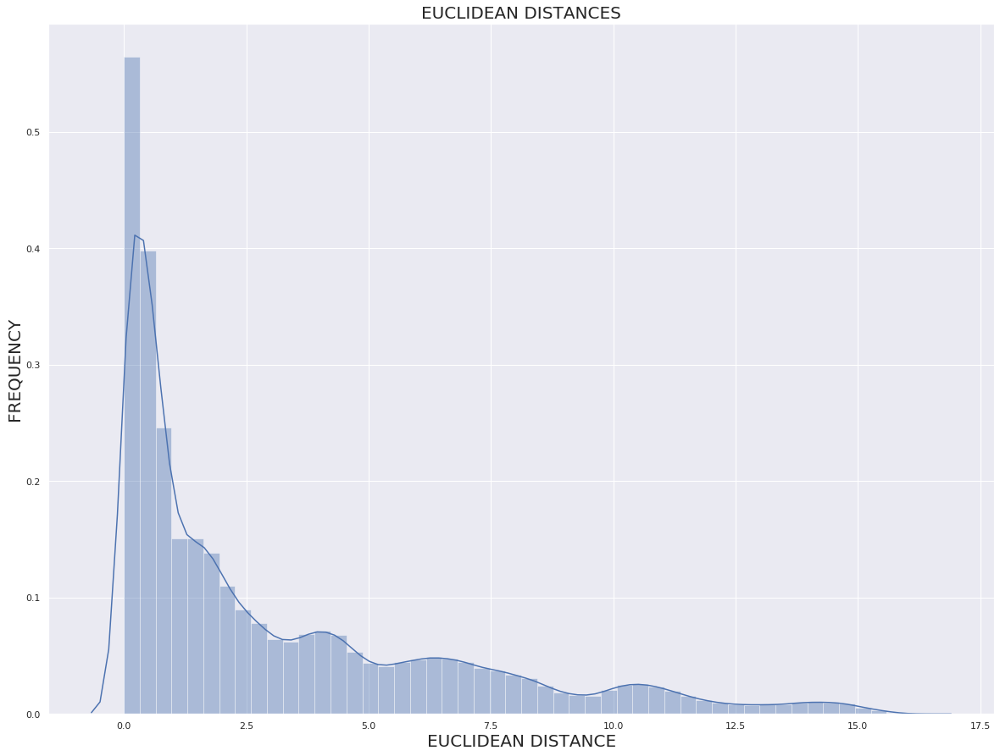

Sigma binary search finished 100 of 1000 cells
Sigma binary search finished 200 of 1000 cells
Sigma binary search finished 300 of 1000 cells
Sigma binary search finished 400 of 1000 cells
Sigma binary search finished 500 of 1000 cells
Sigma binary search finished 600 of 1000 cells
Sigma binary search finished 700 of 1000 cells
Sigma binary search finished 800 of 1000 cells
Sigma binary search finished 900 of 1000 cells
Sigma binary search finished 1000 of 1000 cells

Mean sigma = 0.2828330993652344


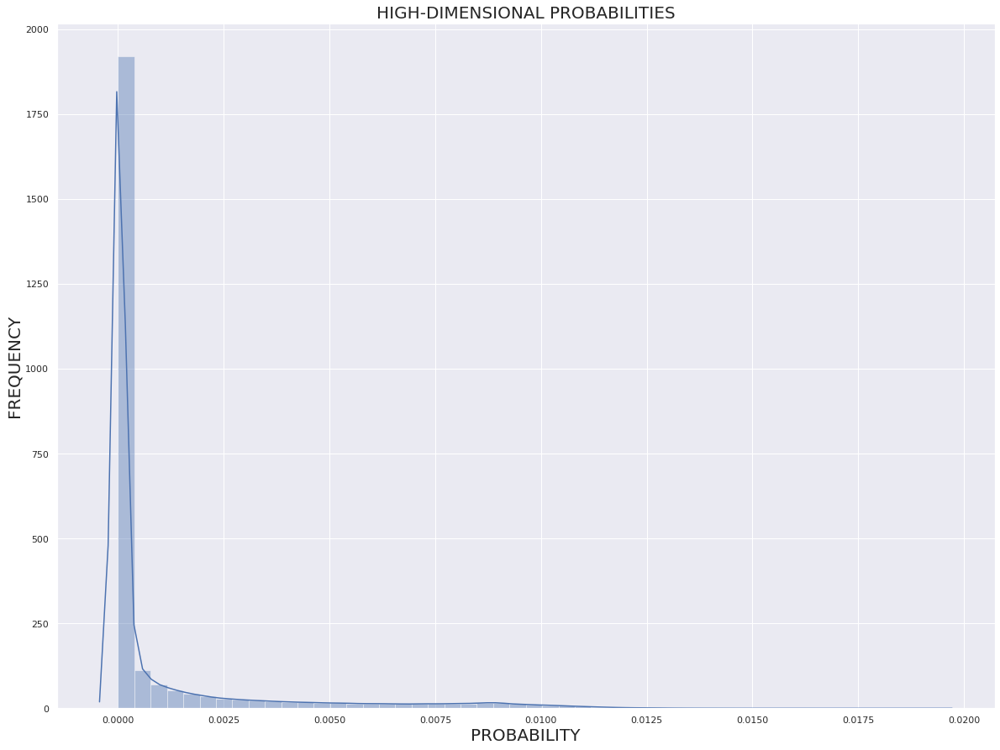

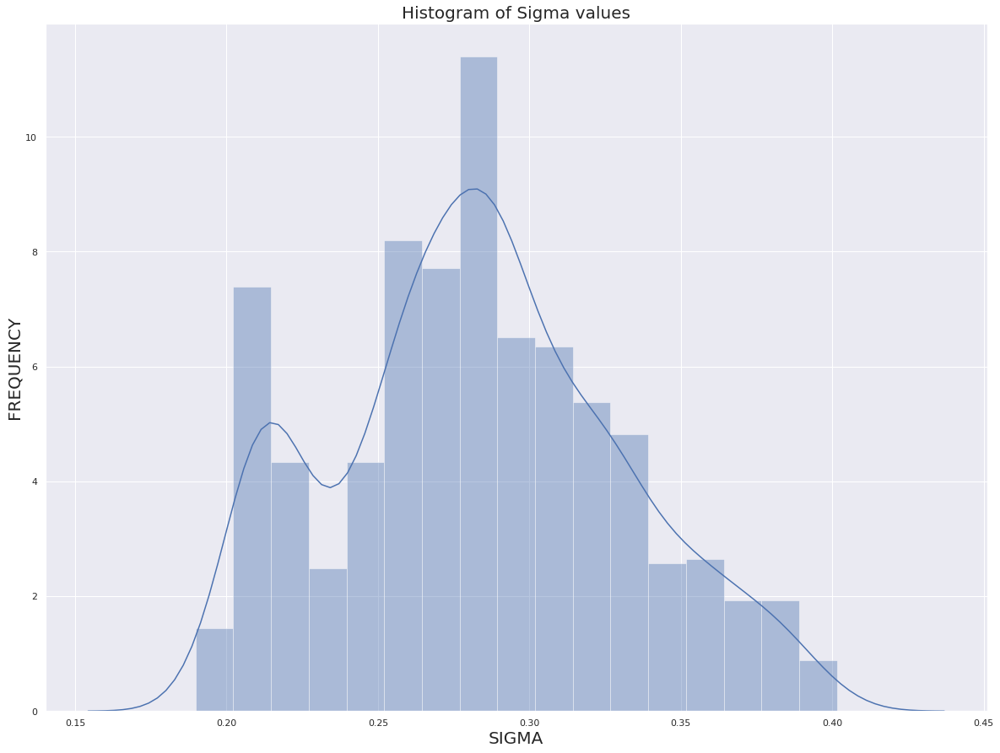

Running Gradient Descent: 

KL divergence = 1114.6888750614978
KL divergence = 928.3283356025705
KL divergence = 924.7441511280074
KL divergence = 924.2842798588231
KL divergence = 924.0131153561099
KL divergence = 924.0128633161303
KL divergence = 924.0077617316904
KL divergence = 924.009719221748
KL divergence = 924.0147028515823
KL divergence = 923.9999497047991


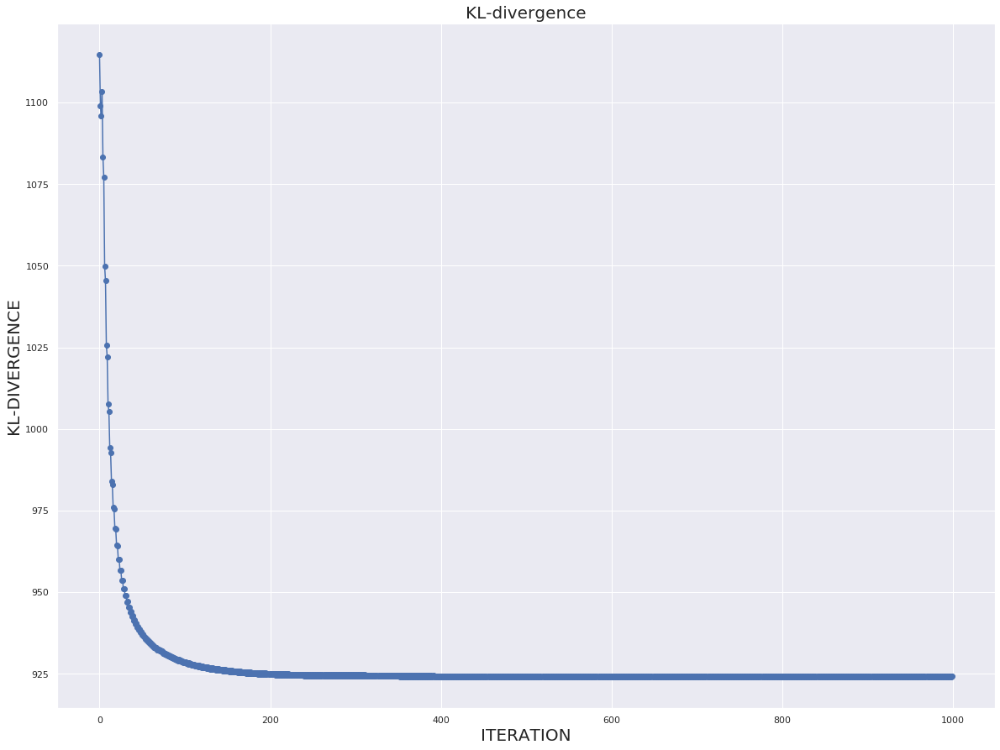

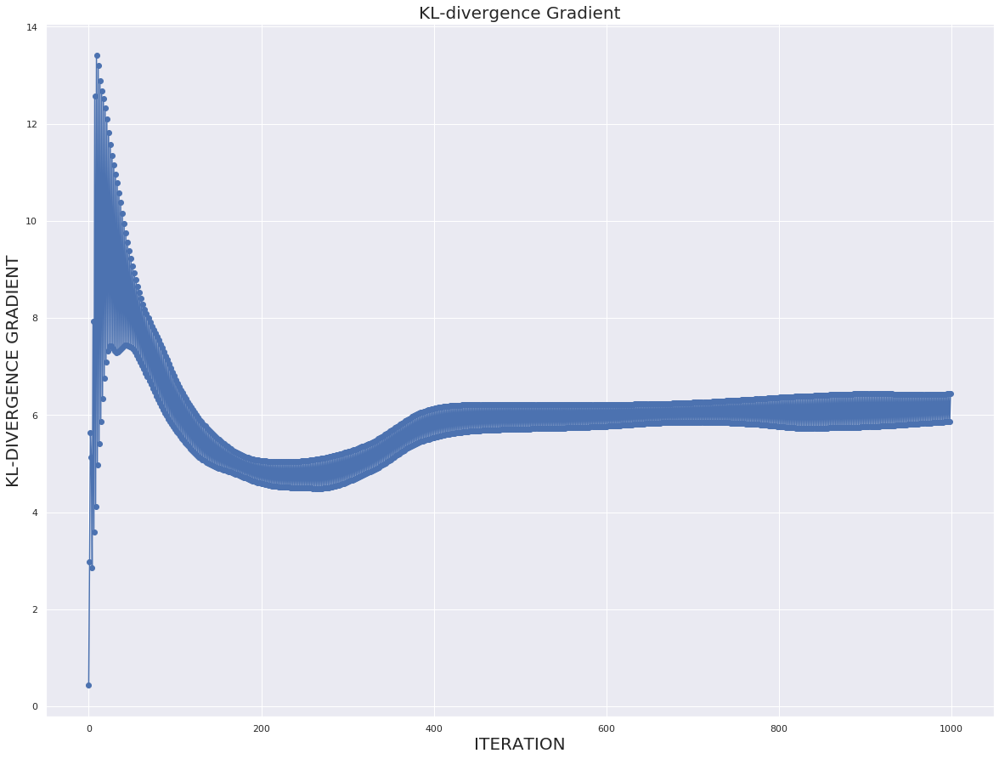

In [127]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances

N_LOW_DIMS = 2
MAX_ITER = 1000
PERPLEXITY = 200
LEARNING_RATE = 0.6


X_train = X; n = X_train.shape[0]
y_train = X[:, 0]
dist = np.square(euclidean_distances(X_train, X_train))

plt.figure(figsize=(20,15))
sns.distplot(dist.reshape(-1,1))
plt.title("EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

def prob_high_dim(sigma, dist_row):
    exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
    exp_distance[dist_row] = 0
    prob_not_symmetr = exp_distance / np.sum(exp_distance)
    return prob_not_symmetr

def perplexity(prob):
    return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))
    #return -np.sum([p*np.log2(p) for p in prob if p!=0])

def sigma_binary_search(perp_of_sigma, fixed_perplexity):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if perp_of_sigma(approx_sigma) < fixed_perplexity:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

prob = np.zeros((n,n)); sigma_array = []
for dist_row in range(n):
    func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
    binary_search_result = sigma_binary_search(func, PERPLEXITY)
    prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
    sigma_array.append(binary_search_result)
    if (dist_row + 1) % 100 == 0:
        print("Sigma binary search finished {0} of {1} cells".format(dist_row + 1, n))
print("\nMean sigma = " + str(np.mean(sigma_array)))

plt.figure(figsize=(20,15))
sns.distplot(prob.reshape(-1,1))
plt.title("HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

plt.figure(figsize=(20,15))
sns.distplot(sigma_array)
plt.title("Histogram of Sigma values", fontsize = 20)
plt.xlabel("SIGMA", fontsize = 20)
plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

P = prob + np.transpose(prob)

def prob_low_dim(Y):
    inv_distances = np.power(1 + np.square(euclidean_distances(Y, Y)), -1)
    np.fill_diagonal(inv_distances, 0.)
    return inv_distances / np.sum(inv_distances, axis = 1, keepdims = True)

def KL(P, Y):
    Q = prob_low_dim(Y)
    return P * np.log(P + 0.01) - P * np.log(Q + 0.01)

def KL_gradient(P, Y):
    Q = prob_low_dim(Y)
    y_diff = np.expand_dims(Y, 1) - np.expand_dims(Y, 0)
    inv_dist = np.power(1 + np.square(euclidean_distances(Y, Y)), -1)
    return 4*np.sum(np.expand_dims(P - Q, 2) * y_diff * np.expand_dims(inv_dist, 2), axis = 1)

np.random.seed(12345)
#y = np.random.normal(loc = 0, scale = 1, size = (n, N_LOW_DIMS))
y = X_reduced
KL_array = []; KL_gradient_array = []
print("Running Gradient Descent: \n")
for i in range(MAX_ITER):
    y = y - LEARNING_RATE * KL_gradient(P, y)
    KL_array.append(np.sum(KL(P, y)))
    KL_gradient_array.append(np.sum(KL_gradient(P, y)))
    if i % 100 == 0:
        print("KL divergence = " + str(np.sum(KL(P, y))))
        
plt.figure(figsize=(20,15))
plt.plot(KL_array,'-o')
plt.title("KL-divergence", fontsize = 20)
plt.xlabel("ITERATION", fontsize = 20); plt.ylabel("KL-DIVERGENCE", fontsize = 20)
plt.show()

plt.figure(figsize=(20,15))
plt.plot(KL_gradient_array,'-o')
plt.title("KL-divergence Gradient", fontsize = 20)
plt.xlabel("ITERATION", fontsize = 20); plt.ylabel("KL-DIVERGENCE GRADIENT", fontsize = 20)
plt.show()

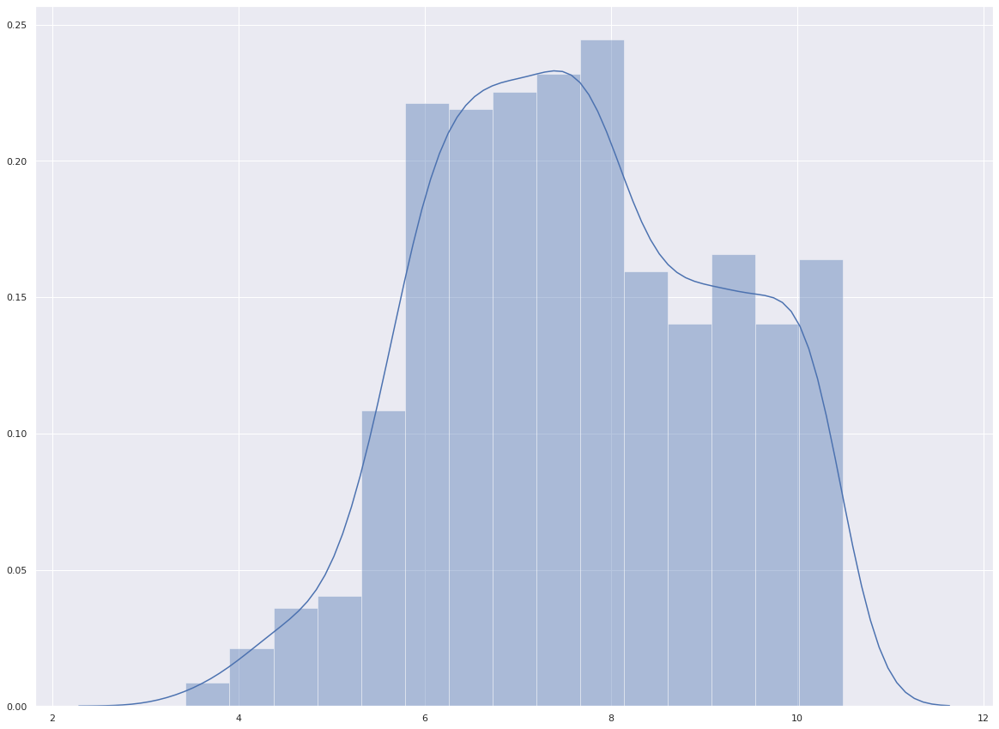

In [158]:
plt.figure(figsize=(20,15))
sns.distplot(-np.sum(prob*np.log2(prob + 0.00001), axis=0))
#sns.distplot(np.power(2, -np.sum(prob*np.log2(prob+0.00001),axis=0)))
plt.show()

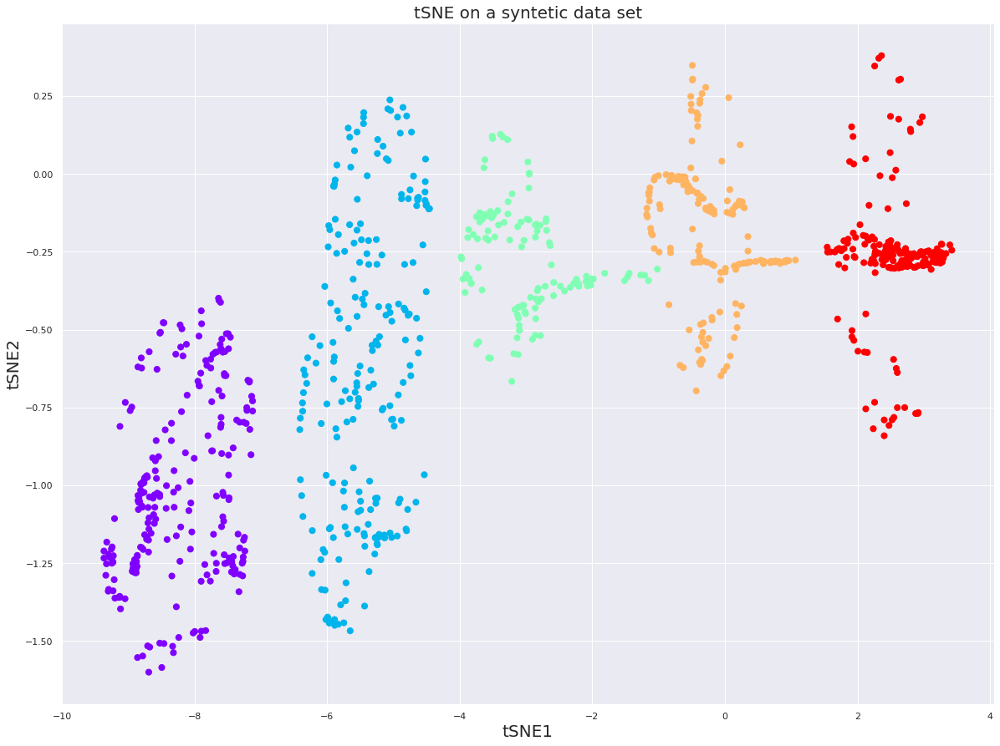

In [112]:
plt.figure(figsize=(20,15))
plt.scatter(y[:,0], y[:,1], c = X[:, 0], cmap = plt.cm.get_cmap('rainbow', 5), s = 50)
plt.title("tSNE on a syntetic data set", fontsize = 20)
plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

Let us figure out how sigma is connected with perplexity for tSNE:

In [1]:
import numpy as np
import pandas as pd
from scipy import optimize
import matplotlib.pyplot as plt
from sklearn.manifold import SpectralEmbedding
from sklearn.metrics.pairwise import euclidean_distances

path = '/home/nikolay/WABI/K_Pietras/Manifold_Learning/'
expr = pd.read_csv(path + 'bartoschek_filtered_expr_rpkm.txt', sep='\t')
print(expr.iloc[0:4,0:4])
X_train = expr.values[:,0:(expr.shape[1]-1)]
X_train = np.log(X_train + 1)
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = expr.values[:,expr.shape[1]-1]
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)

                1110020A21Rik  1110046J04Rik  1190002F15Rik  1500015A07Rik
SS2_15_0048_A3            0.0            0.0            0.0            0.0
SS2_15_0048_A6            0.0            0.0            0.0            0.0
SS2_15_0048_A5            0.0            0.0            0.0            0.0
SS2_15_0048_A4            0.0            0.0            0.0            0.0

This data set contains 716 samples

Dimensions of the  data set: 
(716, 557) (716,)


In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances


my_perp = []; my_sigma_tSNE = []
for PERPLEXITY in range(4,724,10):

    #X_train = X; n = X_train.shape[0]
    #y_train = X[:, 0]
    dist = np.square(euclidean_distances(X_train, X_train))

    def prob_high_dim(sigma, dist_row):
        exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
        exp_distance[dist_row] = 0
        prob_not_symmetr = exp_distance / np.sum(exp_distance)
        return prob_not_symmetr

    def perplexity(prob):
        return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))

    def sigma_binary_search(perp_of_sigma, fixed_perplexity):
        sigma_lower_limit = 0; sigma_upper_limit = 1000
        for i in range(20):
            approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
            if perp_of_sigma(approx_sigma) < fixed_perplexity:
                sigma_lower_limit = approx_sigma
            else:
                sigma_upper_limit = approx_sigma
            if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
                break
        return approx_sigma

    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, PERPLEXITY)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        
    print("Perplexity = {0}, Mean Sigma = {1}".format(PERPLEXITY, np.mean(sigma_array)))
    
    my_perp.append(PERPLEXITY)
    my_sigma_tSNE.append(np.mean(sigma_array))

Perplexity = 4, Mean Sigma = 4.2812251511898785
Perplexity = 14, Mean Sigma = 5.594089710512641
Perplexity = 24, Mean Sigma = 6.1362042773369305
Perplexity = 34, Mean Sigma = 6.5150474036872055
Perplexity = 44, Mean Sigma = 6.823305311149725
Perplexity = 54, Mean Sigma = 7.09219884606047
Perplexity = 64, Mean Sigma = 7.335841322744359
Perplexity = 74, Mean Sigma = 7.5612361204690774
Perplexity = 84, Mean Sigma = 7.772120683552832
Perplexity = 94, Mean Sigma = 7.97082325599713
Perplexity = 104, Mean Sigma = 8.159072705487299
Perplexity = 114, Mean Sigma = 8.33857658855076
Perplexity = 124, Mean Sigma = 8.510987851872791
Perplexity = 134, Mean Sigma = 8.677623791401613
Perplexity = 144, Mean Sigma = 8.839874960190757
Perplexity = 154, Mean Sigma = 8.998764293819832
Perplexity = 164, Mean Sigma = 9.155228151289444
Perplexity = 174, Mean Sigma = 9.310056377389577
Perplexity = 184, Mean Sigma = 9.464010846015462
Perplexity = 194, Mean Sigma = 9.617571058220037
Perplexity = 204, Mean Sigma =

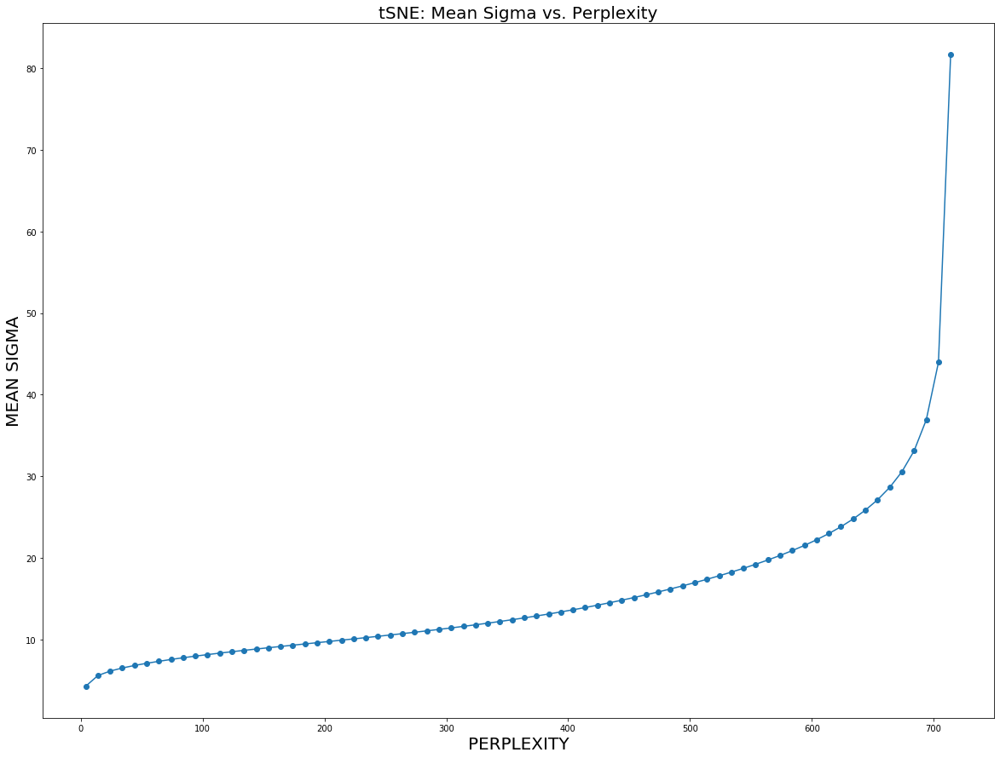

In [3]:
plt.figure(figsize=(20,15))
plt.plot(my_perp, my_sigma_tSNE, '-o')
plt.title("tSNE: Mean Sigma vs. Perplexity", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20)
plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

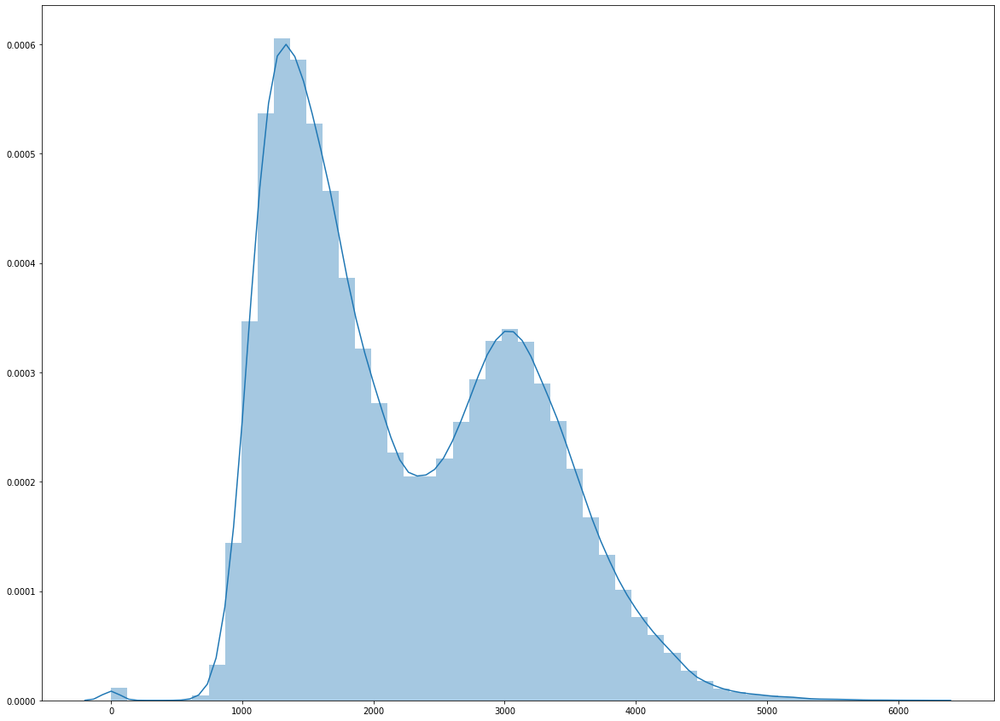

In [4]:
plt.figure(figsize=(20,15))
sns.distplot(dist.reshape(-1,1))
plt.show()

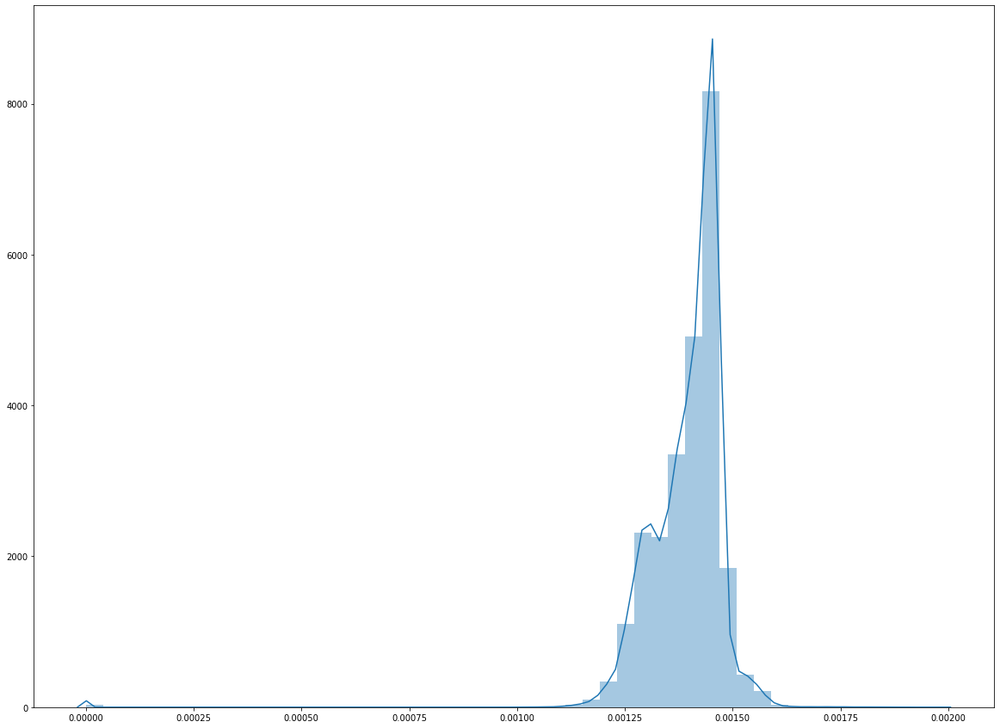

In [5]:
plt.figure(figsize=(20,15))
sns.distplot(prob.reshape(-1,1))
plt.show()

[ 2.22944534 43.71777492  0.75860625]


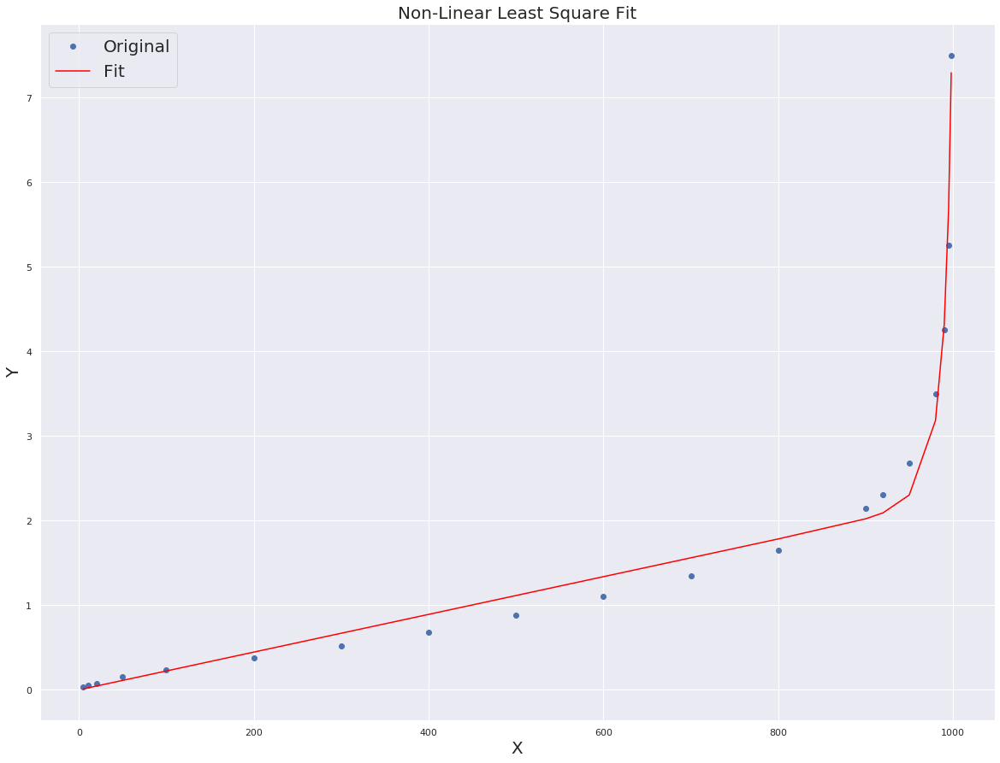

In [171]:
from scipy import optimize
import matplotlib.pyplot as plt
import numpy as np

N = 1000

perp = np.array([5,10,20,50,100,200,300,400,500,600,700,800,900,920,950,980,990,995,998])
sigma_exact = np.array([0.032,0.05,0.078,0.15,0.24,0.38,0.52,0.68,0.88,1.1,1.35,1.65,2.15,
                        2.31,2.68,3.5,4.26,5.26,7.5])

sigma = lambda perp, a, b, c: ((a*perp) / N) / (1 - c*((perp) / N)**b)
    
p , _ = optimize.curve_fit(sigma, perp, sigma_exact)
print(p)

plt.figure(figsize=(20,15))
plt.plot(perp, sigma_exact, "o")
plt.plot(perp, sigma(perp, p[0], p[1], p[2]), c = "red")
plt.title("Non-Linear Least Square Fit", fontsize = 20)
plt.gca().legend(('Original', 'Fit'), fontsize = 20)
plt.xlabel("X", fontsize = 20); plt.ylabel("Y", fontsize = 20)
plt.show()

Let us figure out how sigma is connected with perplexity for UMAP:

In [1]:
import numpy as np
import pandas as pd
from scipy import optimize
import matplotlib.pyplot as plt
from sklearn.manifold import SpectralEmbedding
from sklearn.metrics.pairwise import euclidean_distances

path = '/home/nikolay/WABI/K_Pietras/Manifold_Learning/'
expr = pd.read_csv(path + 'bartoschek_filtered_expr_rpkm.txt', sep='\t')
print(expr.iloc[0:4,0:4])
X_train = expr.values[:,0:(expr.shape[1]-1)]
X_train = np.log(X_train + 1)
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = expr.values[:,expr.shape[1]-1]
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)

                1110020A21Rik  1110046J04Rik  1190002F15Rik  1500015A07Rik
SS2_15_0048_A3            0.0            0.0            0.0            0.0
SS2_15_0048_A6            0.0            0.0            0.0            0.0
SS2_15_0048_A5            0.0            0.0            0.0            0.0
SS2_15_0048_A4            0.0            0.0            0.0            0.0

This data set contains 716 samples

Dimensions of the  data set: 
(716, 557) (716,)


In [14]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics.pairwise import euclidean_distances


my_n_neighbor = []; my_sigma_umap = []
for N_NEIGHBOR in range(4,724,10):

    #X_train = X; n = X_train.shape[0]
    #y_train = X[:, 0]
    dist = np.square(euclidean_distances(X_train, X_train))
    rho = [sorted(dist[i])[1] for i in range(dist.shape[0])]

    def prob_high_dim(sigma, dist_row):
        d = dist[dist_row] - rho[dist_row]
        d[d < 0] = 0
        return np.exp(- d / sigma)

    def k(prob):
        return np.power(2, np.sum(prob))

    def sigma_binary_search(k_of_sigma, fixed_k):
        sigma_lower_limit = 0; sigma_upper_limit = 1000
        for i in range(20):
            approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
            if k_of_sigma(approx_sigma) < fixed_k:
                sigma_lower_limit = approx_sigma
            else:
                sigma_upper_limit = approx_sigma
            if np.abs(fixed_k - k_of_sigma(approx_sigma)) <= 1e-5:
                break
        return approx_sigma

    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: k(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, N_NEIGHBOR)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        
    print("N_neighbor = {0}, Mean Sigma = {1}".format(N_NEIGHBOR, np.mean(sigma_array)))
    
    my_n_neighbor.append(N_NEIGHBOR)
    my_sigma_umap.append(np.mean(sigma_array))

N_neighbor = 4, Mean Sigma = 3.3768448749734037
N_neighbor = 14, Mean Sigma = 61.94113752695435
N_neighbor = 24, Mean Sigma = 73.05938971109231
N_neighbor = 34, Mean Sigma = 79.15058349097907
N_neighbor = 44, Mean Sigma = 83.26585332774583
N_neighbor = 54, Mean Sigma = 86.33223192651845
N_neighbor = 64, Mean Sigma = 88.75830213450853
N_neighbor = 74, Mean Sigma = 90.75585823485305
N_neighbor = 84, Mean Sigma = 92.44780034326308
N_neighbor = 94, Mean Sigma = 93.91138140715701
N_neighbor = 104, Mean Sigma = 95.19835024572617
N_neighbor = 114, Mean Sigma = 96.34498244557301
N_neighbor = 124, Mean Sigma = 97.37747341560917
N_neighbor = 134, Mean Sigma = 98.31563587295277
N_neighbor = 144, Mean Sigma = 99.17439695177131
N_neighbor = 154, Mean Sigma = 99.96572419917783
N_neighbor = 164, Mean Sigma = 100.69880805202037
N_neighbor = 174, Mean Sigma = 101.38142308709342
N_neighbor = 184, Mean Sigma = 102.01968827061147
N_neighbor = 194, Mean Sigma = 102.61881418068316
N_neighbor = 204, Mean Sig

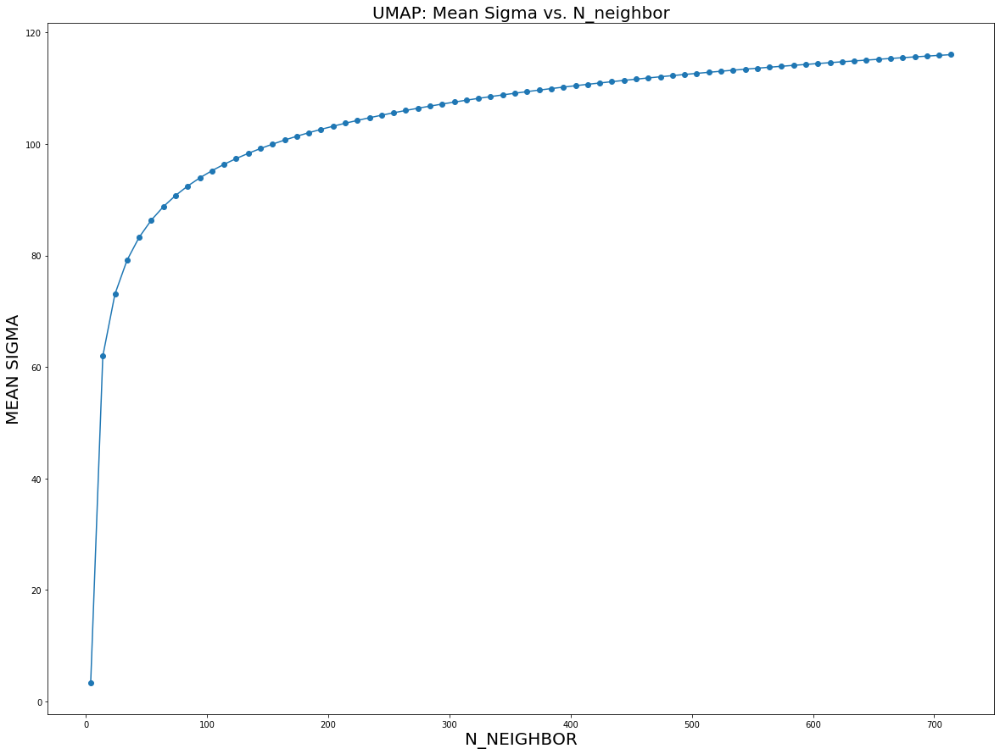

In [7]:
plt.figure(figsize=(20,15))
plt.plot(my_n_neighbor, my_sigma_umap, '-o')
plt.title("UMAP: Mean Sigma vs. N_neighbor", fontsize = 20)
plt.xlabel("N_NEIGHBOR", fontsize = 20)
plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

Let us compare how Perplexity and N_neighbors hyperparameters behave for tSNE and UMAP, respectively, for the same data set where the Euclidean distances are fixed:

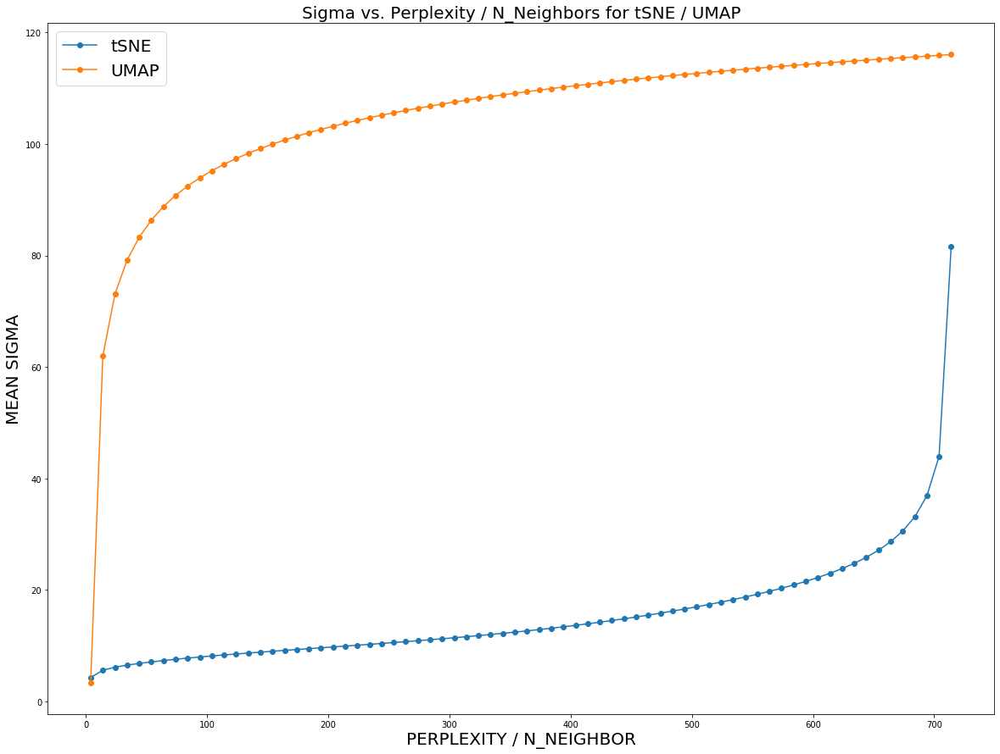

In [8]:
plt.figure(figsize=(20, 15))

plt.plot(my_perp, my_sigma_tSNE, '-o')
plt.plot(my_n_neighbor, my_sigma_umap, '-o')

plt.gca().legend(('tSNE','UMAP'), fontsize = 20)
plt.title("Sigma vs. Perplexity / N_Neighbors for tSNE / UMAP", fontsize = 20)
plt.xlabel("PERPLEXITY / N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.show()

In [21]:
my_sigma_tSNE_mod = [2*(i**2) for i in my_sigma_tSNE]

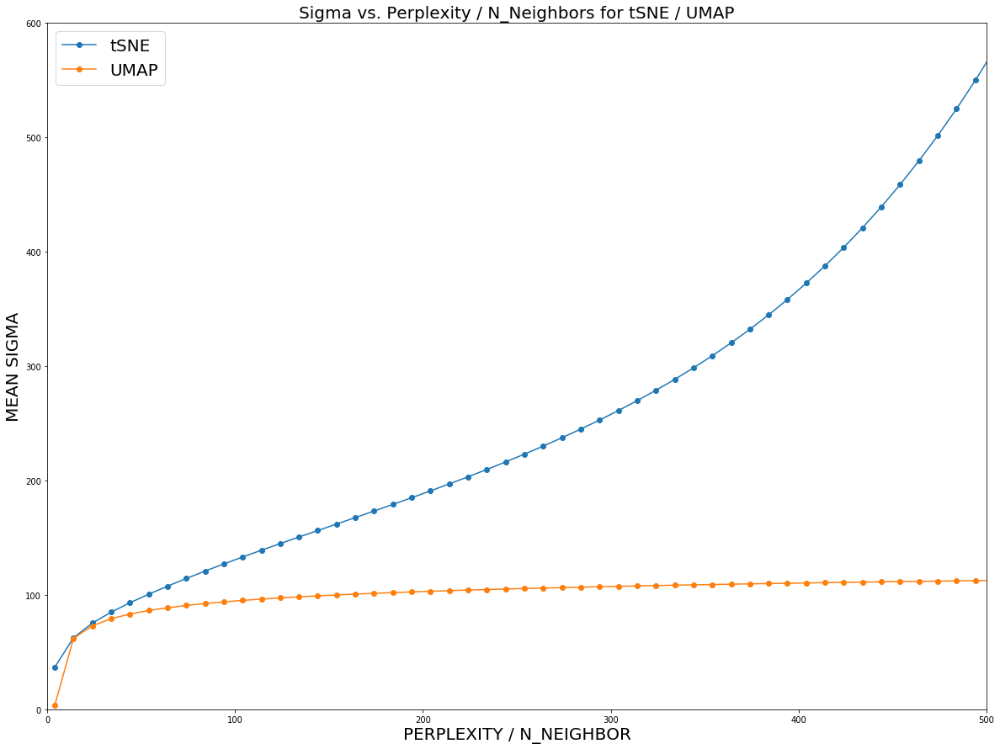

In [25]:
plt.figure(figsize=(20, 15))

plt.plot(my_perp, my_sigma_tSNE_mod, '-o')
plt.plot(my_n_neighbor, my_sigma_umap, '-o')

plt.gca().legend(('tSNE','UMAP'), fontsize = 20)
plt.title("Sigma vs. Perplexity / N_Neighbors for tSNE / UMAP", fontsize = 20)
plt.xlabel("PERPLEXITY / N_NEIGHBOR", fontsize = 20); plt.ylabel("MEAN SIGMA", fontsize = 20)
plt.xlim(0,500); plt.ylim(0,600)
plt.show()

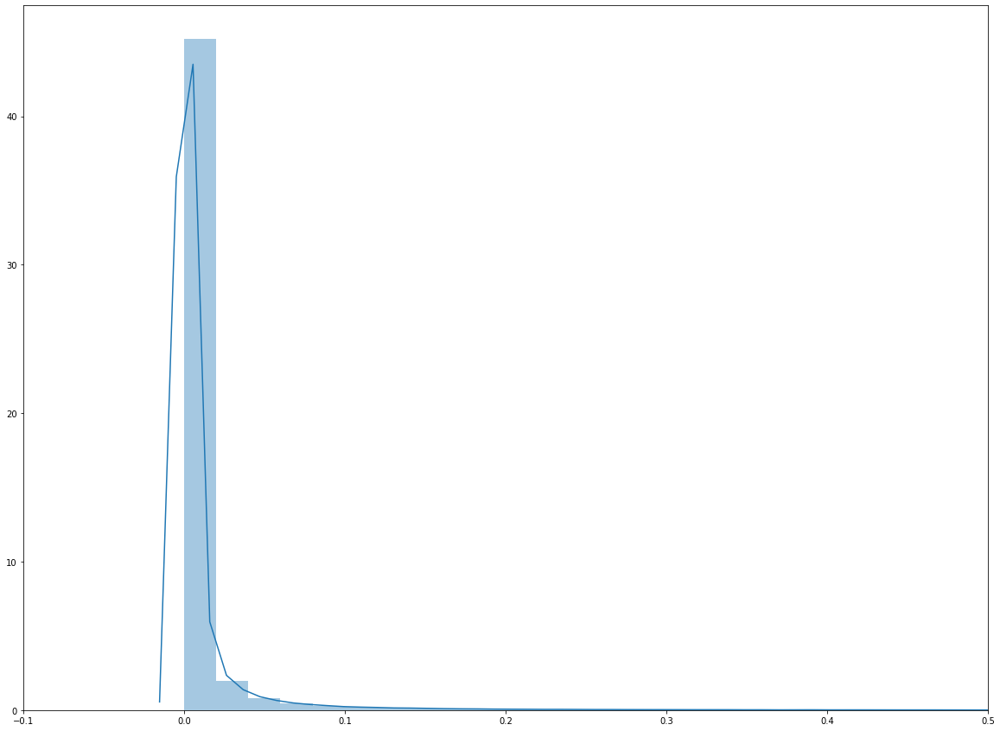

In [31]:
plt.figure(figsize=(20,15))
sns.distplot(prob.reshape(-1,1))
plt.xlim(-0.1,0.5)
plt.show()

### tSNE Degrades to PCA at Large Perplexity <a class="anchor" id="tSNE-Degrades-to-PCA-at-Large-Perplexity"></a>

Here we will try to show for different non-linear manifolds (Swiss Roll, S-shape and Sphere) that tSNE degrades down to PCA (providing that PCA was used for initialization) at large perplexity values. There is a common belief that at large perplexities tSNE recovers the initial data set, i.e. is capable of preserving global structure of the data. We will start with a 2D World Map collection of points and embedd it into 3D non-linear manifold later.

(3023, 2)
(3023,)


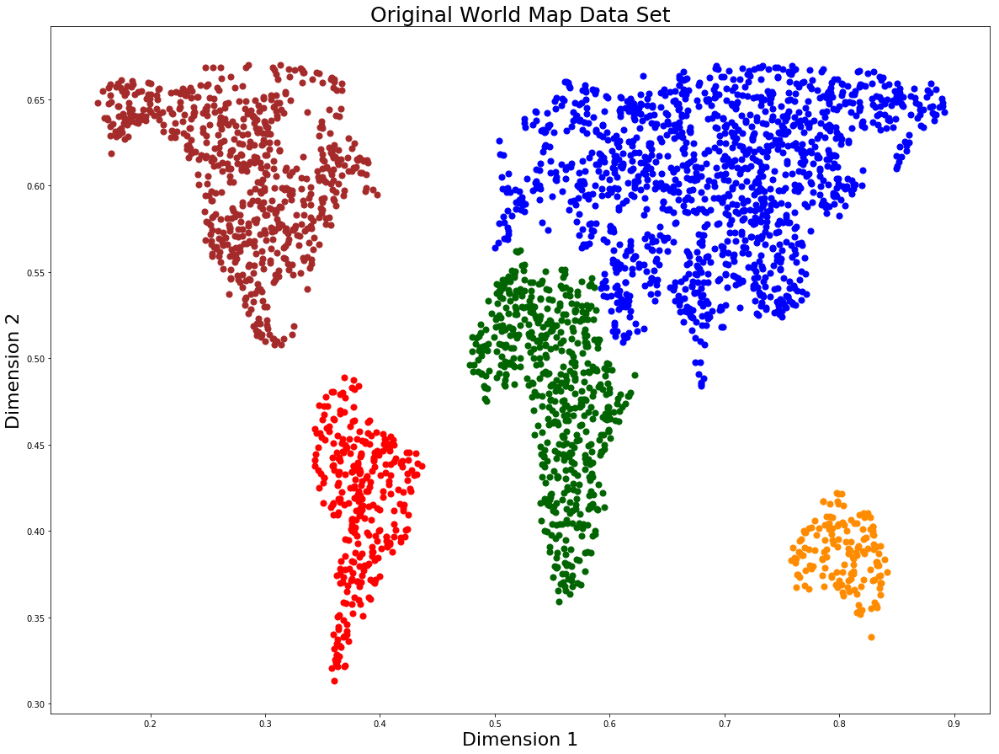

In [2]:
import cartopy
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from skimage.io import imread
import cartopy.io.shapereader as shpreader

shapename = 'admin_0_countries'
countries_shp = shpreader.natural_earth(resolution='110m',
                                        category='cultural', name=shapename)

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    #print(country.attributes['NAME_LONG'])
    if country.attributes['NAME_LONG'] in ['United States','Canada', 'Mexico']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('NorthAmerica.png')
plt.close()
        
plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Brazil','Argentina', 'Peru', 'Uruguay', 'Venezuela', 
                                           'Columbia', 'Bolivia', 'Colombia', 'Ecuador', 'Paraguay']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('SouthAmerica.png')
plt.close()

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Australia']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Australia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Russian Federation', 'China', 'India', 'Kazakhstan', 'Mongolia', 
                                          'France', 'Germany', 'Spain', 'Ukraine', 'Turkey', 'Sweden', 
                                           'Finland', 'Denmark', 'Greece', 'Poland', 'Belarus', 'Norway', 
                                           'Italy', 'Iran', 'Pakistan', 'Afganistan', 'Iraq', 'Bulgaria', 
                                           'Romania', 'Turkmenistan', 'Uzbekistan' 'Austria', 'Ireland', 
                                           'United Kingdom', 'Saudi Arabia', 'Hungary']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Eurasia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Libya', 'Algeria', 'Niger', 'Marocco', 'Egypt', 'Sudan', 'Chad',
                                           'Democratic Republic of the Congo', 'Somalia', 'Kenya', 'Ethiopia', 
                                           'The Gambia', 'Nigeria', 'Cameroon', 'Ghana', 'Guinea', 'Guinea-Bissau',
                                           'Liberia', 'Sierra Leone', 'Burkina Faso', 'Central African Republic', 
                                           'Republic of the Congo', 'Gabon', 'Equatorial Guinea', 'Zambia', 
                                           'Malawi', 'Mozambique', 'Angola', 'Burundi', 'South Africa', 
                                           'South Sudan', 'Somaliland', 'Uganda', 'Rwanda', 'Zimbabwe', 'Tanzania',
                                           'Botswana', 'Namibia', 'Senegal', 'Mali', 'Mauritania', 'Benin', 
                                           'Nigeria', 'Cameroon']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Africa.png')
plt.close()


rng = np.random.RandomState(123)
plt.figure(figsize = (20,15))

N_NorthAmerica = 10000
data_NorthAmerica = imread('NorthAmerica.png')[::-1, :, 0].T
X_NorthAmerica = rng.rand(4 * N_NorthAmerica, 2)
i, j = (X_NorthAmerica * data_NorthAmerica.shape).astype(int).T
X_NorthAmerica = X_NorthAmerica[data_NorthAmerica[i, j] < 1]
X_NorthAmerica = X_NorthAmerica[X_NorthAmerica[:, 1]<0.67]
y_NorthAmerica = np.array(['brown']*X_NorthAmerica.shape[0])
plt.scatter(X_NorthAmerica[:, 0], X_NorthAmerica[:, 1], c = 'brown', s = 50)

N_SouthAmerica = 10000
data_SouthAmerica = imread('SouthAmerica.png')[::-1, :, 0].T
X_SouthAmerica = rng.rand(4 * N_SouthAmerica, 2)
i, j = (X_SouthAmerica * data_SouthAmerica.shape).astype(int).T
X_SouthAmerica = X_SouthAmerica[data_SouthAmerica[i, j] < 1]
y_SouthAmerica = np.array(['red']*X_SouthAmerica.shape[0])
plt.scatter(X_SouthAmerica[:, 0], X_SouthAmerica[:, 1], c = 'red', s = 50)

N_Australia = 10000
data_Australia = imread('Australia.png')[::-1, :, 0].T
X_Australia = rng.rand(4 * N_Australia, 2)
i, j = (X_Australia * data_Australia.shape).astype(int).T
X_Australia = X_Australia[data_Australia[i, j] < 1]
y_Australia = np.array(['darkorange']*X_Australia.shape[0])
plt.scatter(X_Australia[:, 0], X_Australia[:, 1], c = 'darkorange', s = 50)

N_Eurasia = 10000
data_Eurasia = imread('Eurasia.png')[::-1, :, 0].T
X_Eurasia = rng.rand(4 * N_Eurasia, 2)
i, j = (X_Eurasia * data_Eurasia.shape).astype(int).T
X_Eurasia = X_Eurasia[data_Eurasia[i, j] < 1]
X_Eurasia = X_Eurasia[X_Eurasia[:, 0]>0.5]
X_Eurasia = X_Eurasia[X_Eurasia[:, 1]<0.67]
y_Eurasia = np.array(['blue']*X_Eurasia.shape[0])
plt.scatter(X_Eurasia[:, 0], X_Eurasia[:, 1], c = 'blue', s = 50)

N_Africa = 10000
data_Africa = imread('Africa.png')[::-1, :, 0].T
X_Africa = rng.rand(4 * N_Africa, 2)
i, j = (X_Africa * data_Africa.shape).astype(int).T
X_Africa = X_Africa[data_Africa[i, j] < 1]
y_Africa = np.array(['darkgreen']*X_Africa.shape[0])
plt.scatter(X_Africa[:, 0], X_Africa[:, 1], c = 'darkgreen', s = 50)

plt.title('Original World Map Data Set', fontsize = 25)
plt.xlabel('Dimension 1', fontsize = 22); plt.ylabel('Dimension 2', fontsize = 22)

X = np.vstack((X_NorthAmerica, X_SouthAmerica, X_Australia, X_Eurasia, X_Africa))
y = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa))
print(X.shape)
print(y.shape)

plt.show()

Now let us embedd the 2D World Map collection of points into 3D Swiss Roll non-linear manifold:

In [3]:
z_3d = X[:, 1]
x_3d = X[:, 0] * np.cos(X[:, 0]*10)
y_3d = X[:, 0] * np.sin(X[:, 0]*10)

X_swiss_roll = np.array([x_3d, y_3d, z_3d]).T
X_swiss_roll.shape

(3023, 3)

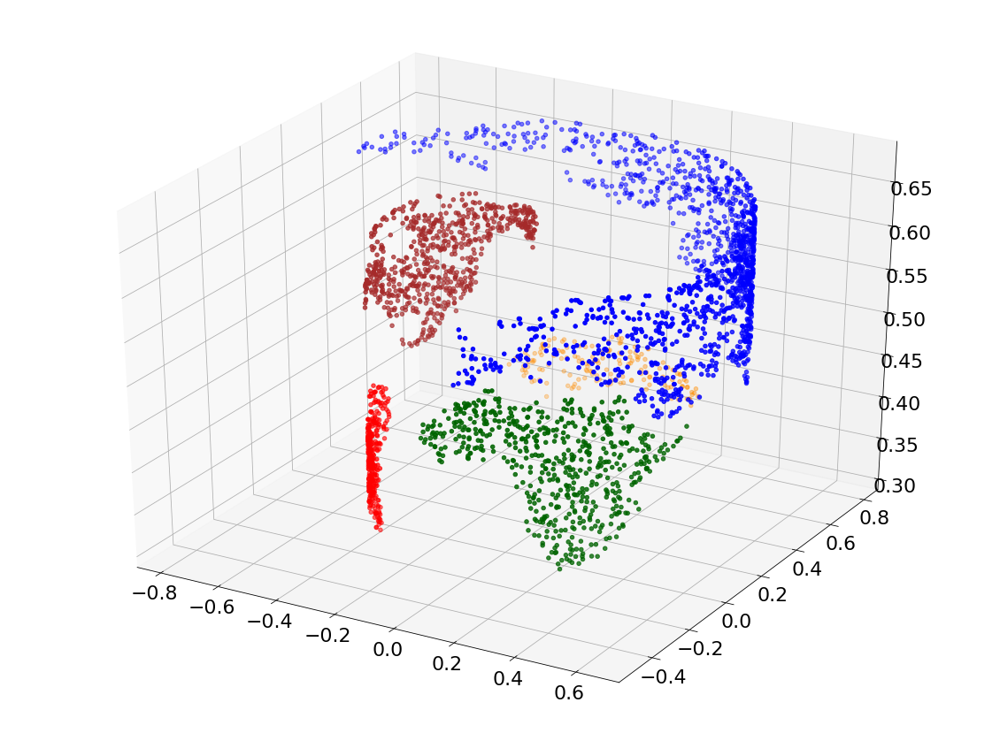

In [16]:
from mpl_toolkits import mplot3d
plt.figure(figsize=(20,15))
ax = plt.axes(projection = '3d')
ax.scatter3D(X_swiss_roll[:, 0], X_swiss_roll[:, 1], X_swiss_roll[:, 2], c = y)
plt.show()

Next we will run PCA on the 3D Swiss Roll with embedded 2D World Map data points and compare the result with tSNE at very large perplexity = 2000, which is of the same order of magnitude as the sample size, i.e. 3023 data points. 

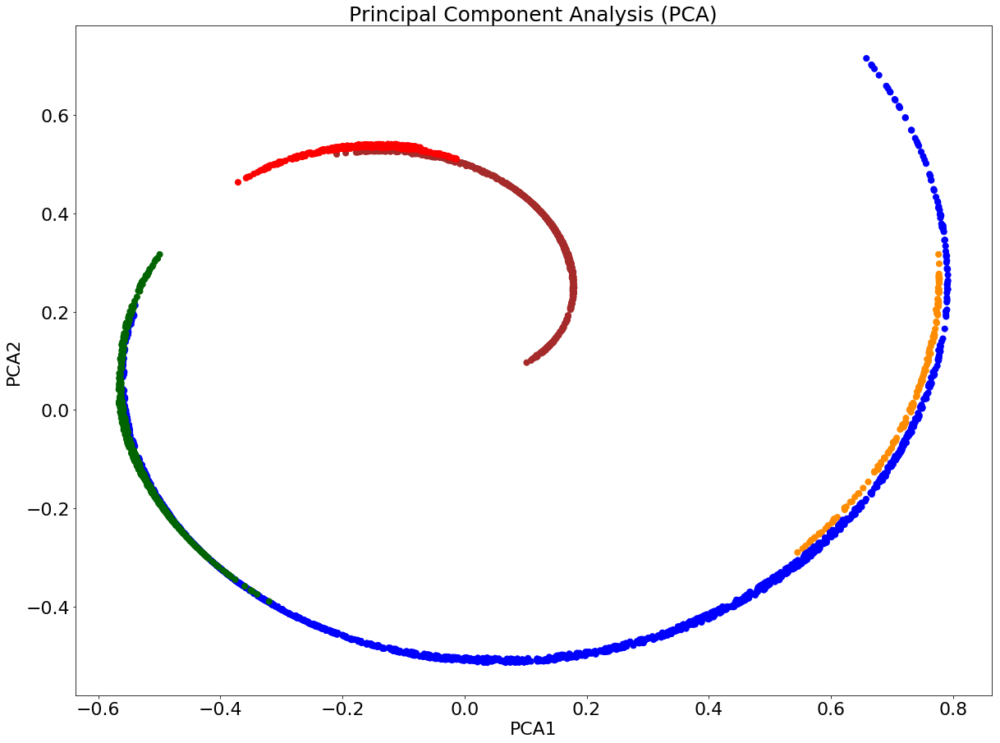

In [121]:
from sklearn.decomposition import PCA
X_swiss_roll_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
plt.figure(figsize=(20,15))
plt.scatter(X_swiss_roll_reduced[:, 0], X_swiss_roll_reduced[:, 1], c = y, s = 50)
plt.title('Principal Component Analysis (PCA)', fontsize = 25)
plt.xlabel("PCA1", fontsize = 22); plt.ylabel("PCA2", fontsize = 22)
plt.show()

[t-SNE] Computing 3022 nearest neighbors...
[t-SNE] Indexed 3023 samples in 0.000s...
[t-SNE] Computed neighbors for 3023 samples in 1.606s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3023
[t-SNE] Computed conditional probabilities for sample 2000 / 3023
[t-SNE] Computed conditional probabilities for sample 3000 / 3023
[t-SNE] Computed conditional probabilities for sample 3023 / 3023
[t-SNE] Mean sigma: 0.615106
[t-SNE] Computed conditional probabilities in 4.002s
[t-SNE] Iteration 50: error = 34.5878296, gradient norm = 0.0000004 (50 iterations in 4.020s)
[t-SNE] Iteration 100: error = 34.5919189, gradient norm = 0.0000000 (50 iterations in 3.833s)
[t-SNE] Iteration 100: gradient norm 0.000000. Finished.
[t-SNE] KL divergence after 100 iterations with early exaggeration: 34.591919
[t-SNE] Iteration 150: error = 0.1602514, gradient norm = 0.0028735 (50 iterations in 3.974s)
[t-SNE] Iteration 200: error = 0.0249942, gradient norm = 0.0002043 (50 iterations in 4.112s)

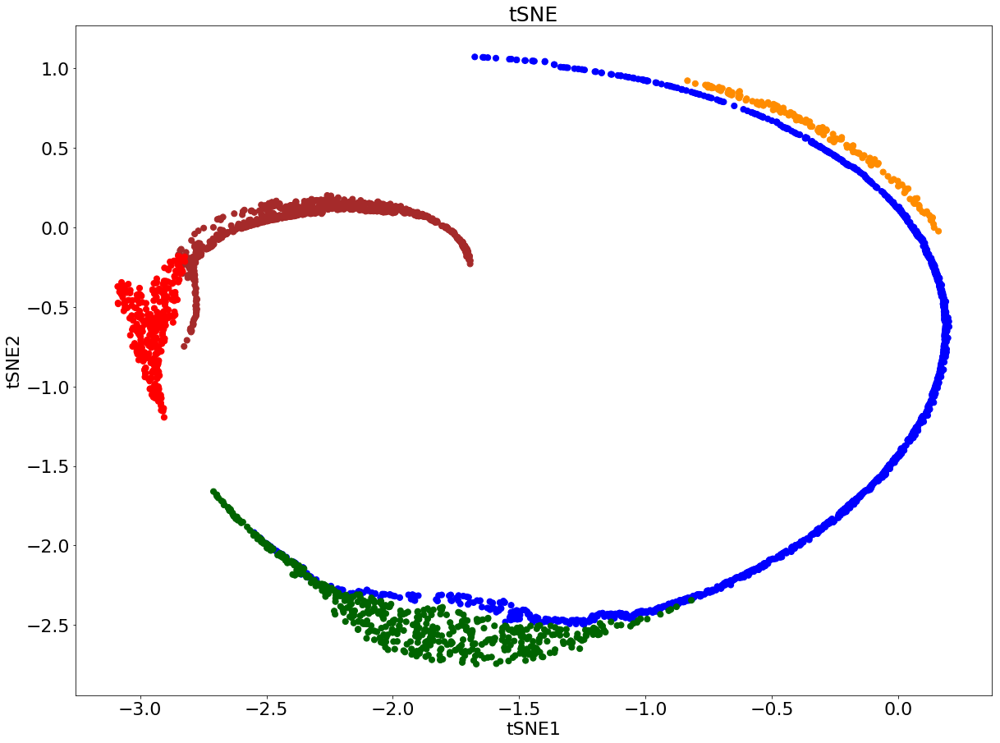

In [196]:
from sklearn.manifold import TSNE
X_swiss_roll_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = 2000, 
             init = X_swiss_roll_reduced, n_iter = 1000, verbose = 2)
tsne = model.fit_transform(X_swiss_roll)
plt.figure(figsize=(20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE', fontsize = 25); plt.xlabel("tSNE1", fontsize = 22); plt.ylabel("tSNE2", fontsize = 22)
plt.show()

We see that PCA and tSNE at large perplexity (with init = PCA) results look very similar. This is is the first indication that there is something wrong going on with tSNE at large perplexities. In contrast to tSNE, UMAP at n_neighbor = 2000 tries to reconstruct the original 2D World Map.

UMAP(a=None, angular_rp_forest=False, b=None,
     init=array([[ 0.12535979,  0.40356518],
       [ 0.00599581,  0.49934623],
       [ 0.12201155,  0.40671414],
       ...,
       [-0.43454162, -0.28447539],
       [-0.55506668,  0.15485573],
       [-0.53099092, -0.11675039]]),
     learning_rate=1, local_connectivity=1.0, metric='euclidean',
     metric_kwds=None, min_dist=1, n_components=2, n_epochs=1000,
     n_neighbors=2000, negative_sample_rate=5, random_state=None,
     repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
     target_metric='categorical', target_metric_kwds=None,
     target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
     transform_seed=42, verbose=2)
Construct fuzzy simplicial set
Fri Mar  6 09:32:24 2020 Finding Nearest Neighbors
Fri Mar  6 09:32:24 2020 Finished Nearest Neighbor Search
Fri Mar  6 09:32:29 2020 Construct embedding
	completed  0  /  1000 epochs
	completed  100  /  1000 epochs
	completed  200  /  1000 epochs
	completed  3

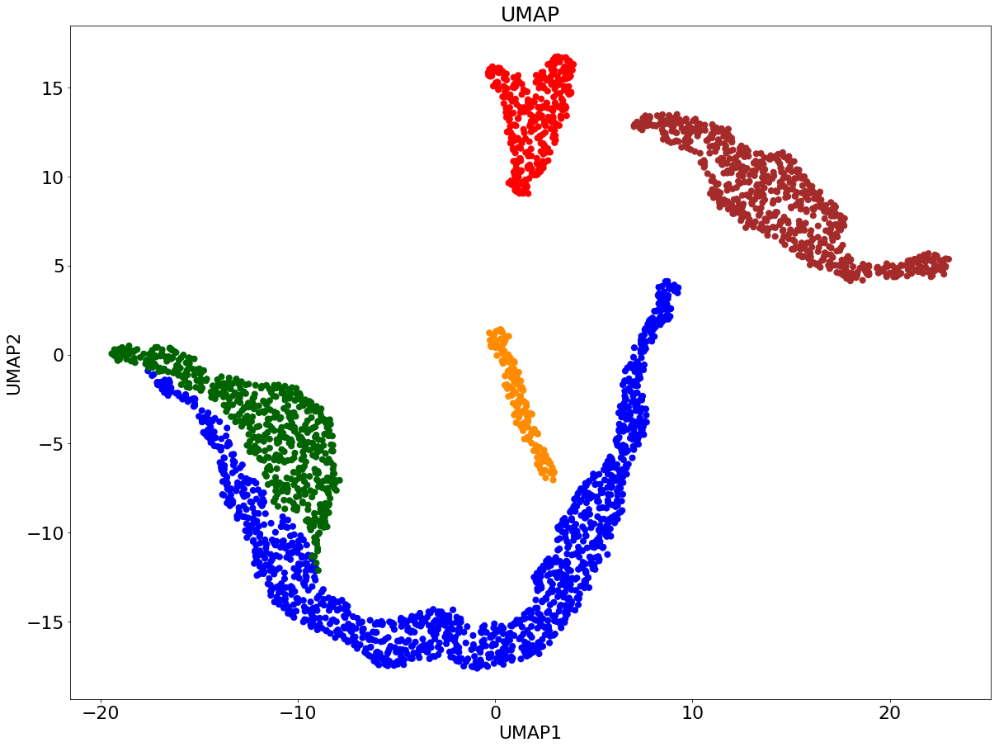

In [199]:
import warnings
warnings.filterwarnings("ignore")

from umap import UMAP
X_swiss_roll_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
model = UMAP(learning_rate = 1, n_components = 2, min_dist = 1, n_neighbors = 2000, 
             init = X_swiss_roll_reduced, n_epochs = 1000, verbose = 2)
umap = model.fit_transform(X_swiss_roll)
plt.figure(figsize=(20,15))
plt.scatter(umap[:, 0], umap[:, 1], c = y, s = 50)
plt.title('UMAP', fontsize = 25); plt.xlabel("UMAP1", fontsize = 22); plt.ylabel("UMAP2", fontsize = 22)
plt.show()

Now let us embed the 2D World Map collection of points into 3D S-shaped non-linear manifold:

In [59]:
#t = 3 * np.pi * (generator.rand(1, n_samples) - 0.5)
#x = np.sin(t)
#y = 2.0 * generator.rand(1, n_samples)
#z = np.sign(t) * (np.cos(t) - 1)

In [173]:
t = (X[:, 0] - 0.6) * 4 * np.pi
x_S = np.sin(t)
y_S = 2 * X[:, 1]
z_S = np.sign(t) * (np.cos(t) - 1)

X_S = np.array([x_S, y_S, z_S]).T
X_S.shape

(3023, 3)

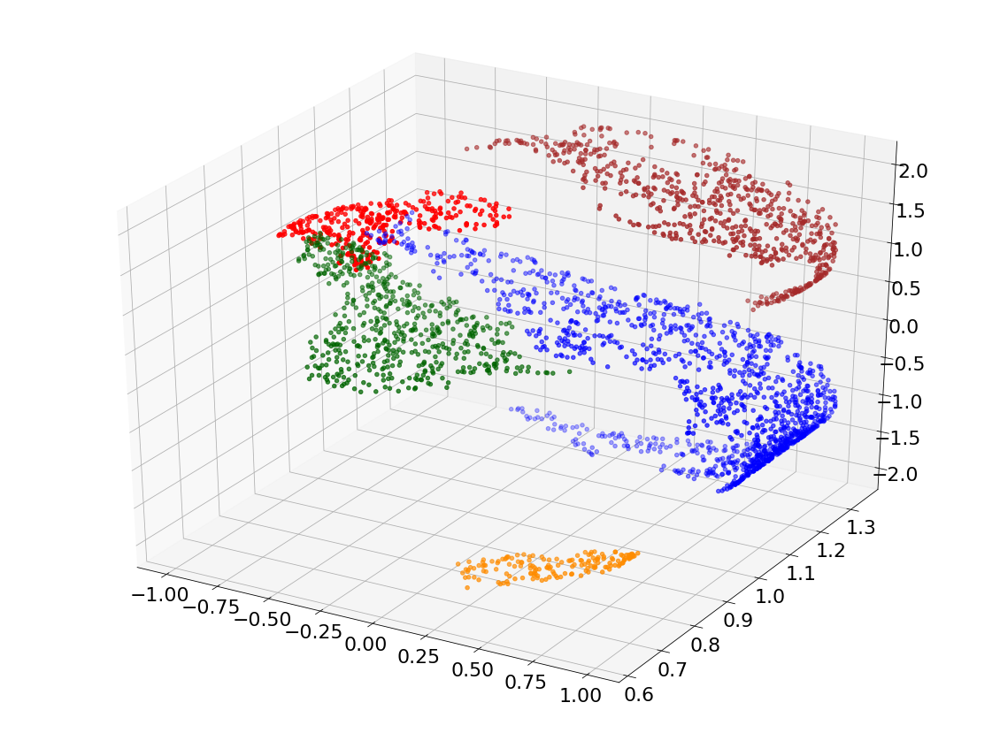

In [194]:
from mpl_toolkits import mplot3d
plt.figure(figsize=(20,15))
ax = plt.axes(projection = '3d')
ax.scatter3D(X_S[:, 0], X_S[:, 1], X_S[:, 2], c = y)
#ax.view_init(30, 120)
plt.show()

Again, we will run PCA followed by tSNE and UMAP on the S-shaped 3D embedding of the original 2D World Map collection of data points, and demonstrate that at perplexity = 2000 tSNE output surprisingly resembles the PCA output, while UMAP with the similar hyperparameter n_neighbor = 2000 creates a more meaningful reconstruction of the original 2D World Map.

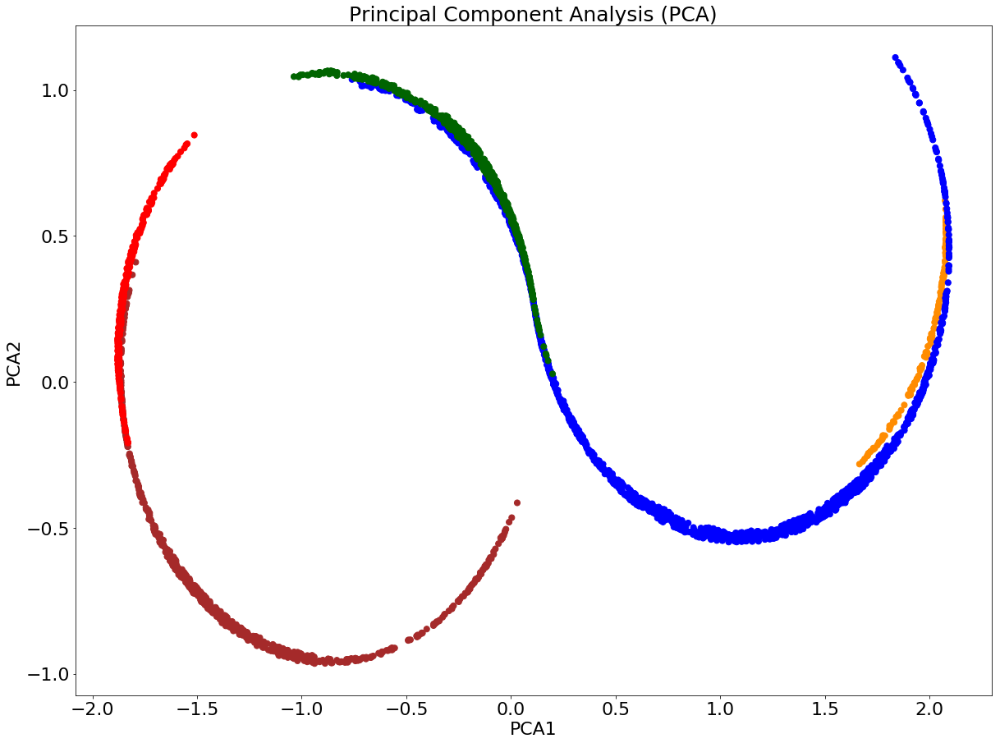

In [120]:
from sklearn.decomposition import PCA
X_S_reduced = PCA(n_components = 2).fit_transform(X_S)
plt.figure(figsize=(20,15))
plt.scatter(X_S_reduced[:, 0], X_S_reduced[:, 1], c = y, s = 50)
plt.title('Principal Component Analysis (PCA)', fontsize = 25)
plt.xlabel("PCA1", fontsize = 22); plt.ylabel("PCA2", fontsize = 22)
plt.show()

[t-SNE] Computing 3022 nearest neighbors...
[t-SNE] Indexed 3023 samples in 0.000s...
[t-SNE] Computed neighbors for 3023 samples in 0.953s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3023
[t-SNE] Computed conditional probabilities for sample 2000 / 3023
[t-SNE] Computed conditional probabilities for sample 3000 / 3023
[t-SNE] Computed conditional probabilities for sample 3023 / 3023
[t-SNE] Mean sigma: 1.448983
[t-SNE] Computed conditional probabilities in 3.886s
[t-SNE] Iteration 50: error = 1118.7269287, gradient norm = 0.1310913 (50 iterations in 3.954s)
[t-SNE] Iteration 100: error = 1052.6090088, gradient norm = 0.1829850 (50 iterations in 5.769s)
[t-SNE] Iteration 150: error = 983.7592773, gradient norm = 0.1777281 (50 iterations in 6.034s)
[t-SNE] Iteration 200: error = 849.8014526, gradient norm = 0.2291984 (50 iterations in 5.704s)
[t-SNE] Iteration 250: error = 885.8141479, gradient norm = 0.3025164 (50 iterations in 5.832s)
[t-SNE] KL divergence after 25

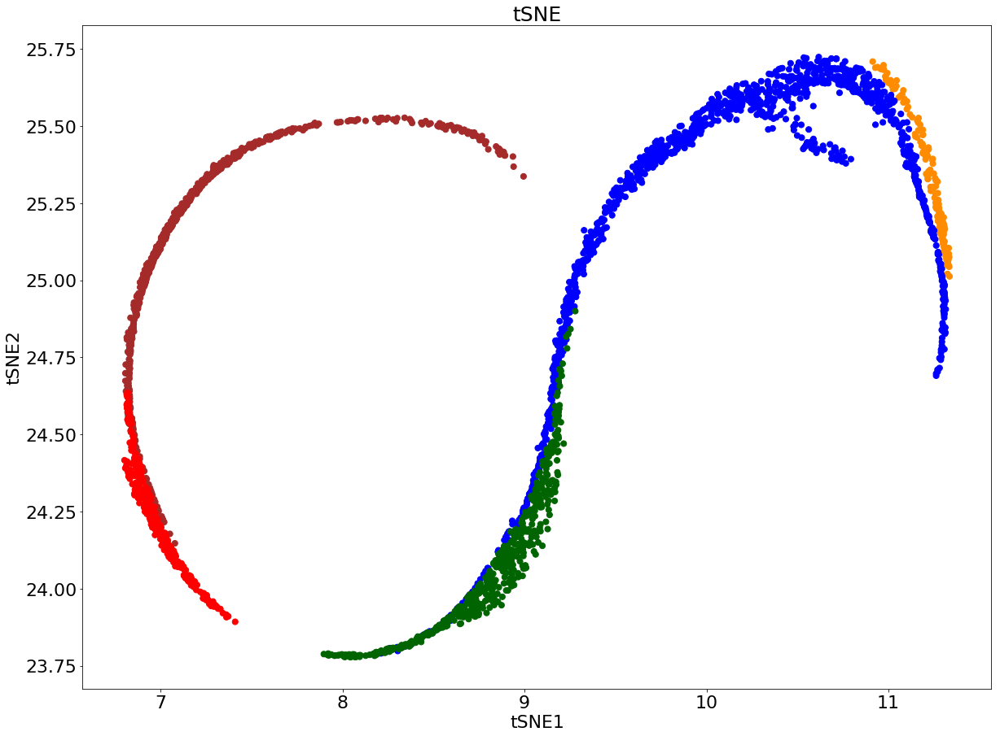

In [211]:
from sklearn.manifold import TSNE
X_S_reduced = PCA(n_components = 2).fit_transform(X_S)
model = TSNE(learning_rate = 10000, n_components = 2, random_state = 123, perplexity = 2000, 
             init = X_S_reduced, n_iter = 1000, verbose = 2, early_exaggeration=124)
tsne = model.fit_transform(X_S)
plt.figure(figsize=(20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE', fontsize = 25); plt.xlabel("tSNE1", fontsize = 22); plt.ylabel("tSNE2", fontsize = 22)
plt.show()

UMAP(a=None, angular_rp_forest=False, b=None,
     init=array([[-1.47279946, -0.75488543],
       [-1.80675933, -0.28930955],
       [-1.46639981, -0.73331449],
       ...,
       [ 0.09624343,  0.3243066 ],
       [-0.61412673,  1.01673621],
       [-0.08959831,  0.68531188]]),
     learning_rate=1, local_connectivity=1.0, metric='euclidean',
     metric_kwds=None, min_dist=1, n_components=2, n_epochs=1000,
     n_neighbors=2000, negative_sample_rate=5, random_state=None,
     repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
     target_metric='categorical', target_metric_kwds=None,
     target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
     transform_seed=42, verbose=2)
Construct fuzzy simplicial set
Fri Mar  6 09:35:00 2020 Finding Nearest Neighbors
Fri Mar  6 09:35:00 2020 Finished Nearest Neighbor Search
Fri Mar  6 09:35:04 2020 Construct embedding
	completed  0  /  1000 epochs
	completed  100  /  1000 epochs
	completed  200  /  1000 epochs
	completed  3

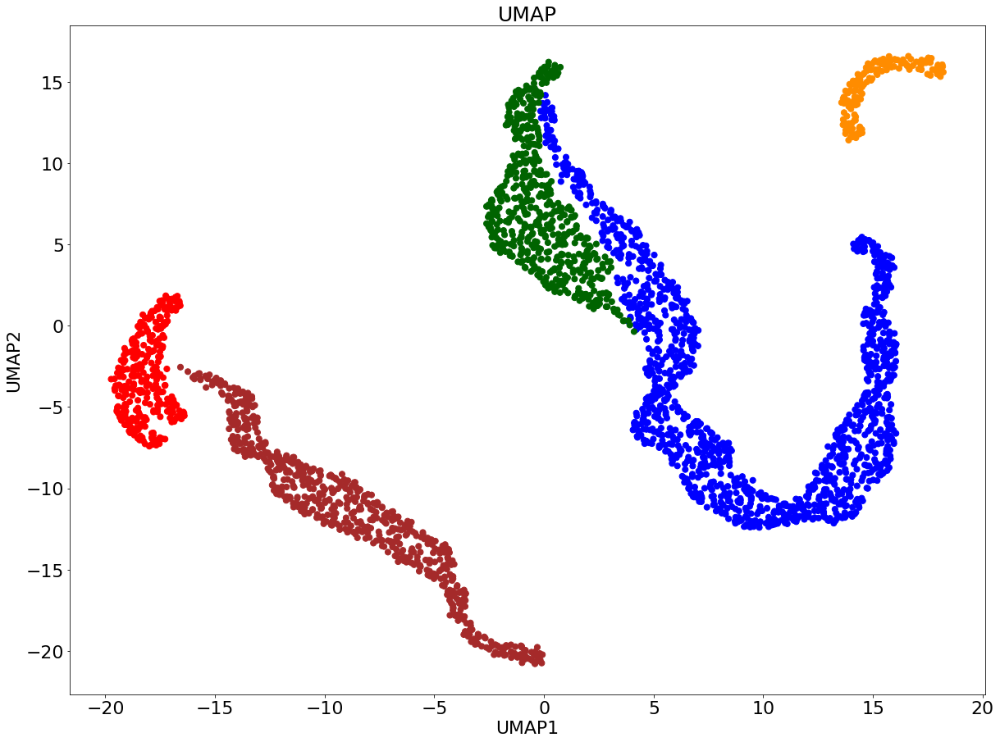

In [200]:
import warnings
warnings.filterwarnings("ignore")

from umap import UMAP
X_S_reduced = PCA(n_components = 2).fit_transform(X_S)
model = UMAP(learning_rate = 1, n_components = 2, min_dist = 1, n_neighbors = 2000, 
             init = X_S_reduced, n_epochs = 1000, verbose = 2)
umap = model.fit_transform(X_S)
plt.figure(figsize=(20,15))
plt.scatter(umap[:, 0], umap[:, 1], c = y, s = 50)
plt.title('UMAP', fontsize = 25); plt.xlabel("UMAP1", fontsize = 22); plt.ylabel("UMAP2", fontsize = 22)
plt.show()

Finally, let us embedd the 2D World Map collection of points into 3D Sphere non-linear manifold, this will sort of represent the globe with the continents mapped to it. Again we will run PCA, tSNE (perplexity = 2000) and UMAP (n_neighbor = 2000) and compare the outputs:

In [153]:
p = X[:, 0] * (3 * np.pi - 0.6)
t = X[:, 1] * np.pi

x_sphere = np.sin(t) * np.cos(p)
y_sphere = np.sin(t) * np.sin(p)
z_sphere = np.cos(t)

X_sphere = np.array([x_sphere, y_sphere, z_sphere]).T
X_sphere.shape

(3023, 3)

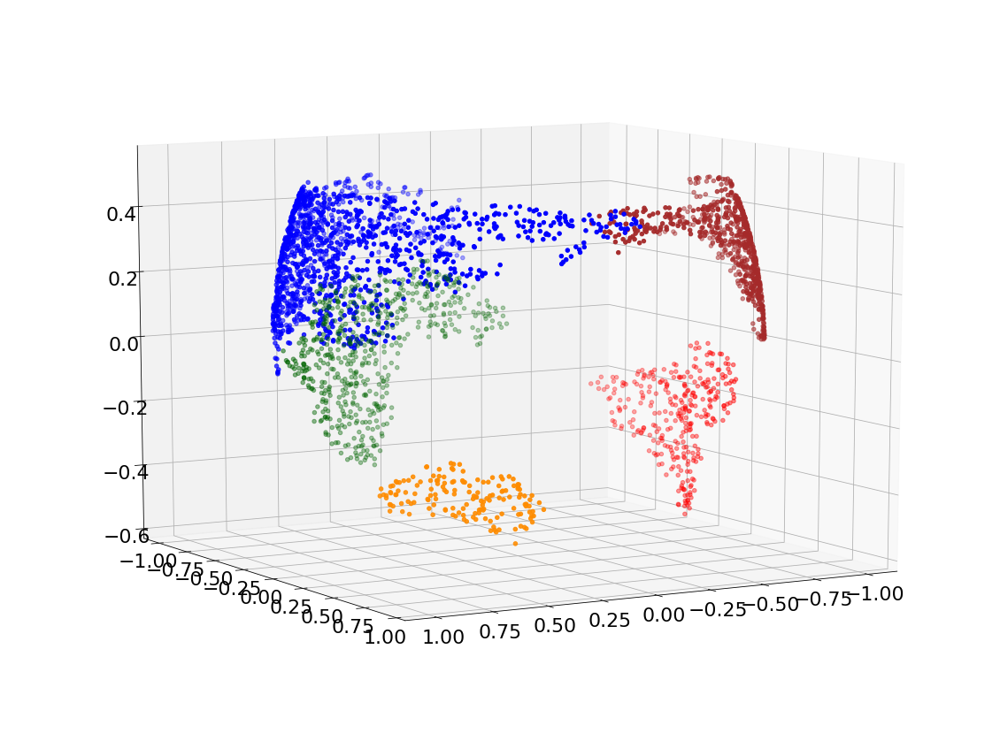

In [171]:
from mpl_toolkits import mplot3d
plt.figure(figsize=(20,15))
ax = plt.axes(projection = '3d')
ax.view_init(10, 60)
ax.scatter3D(X_sphere[:, 0], X_sphere[:, 1], -X_sphere[:, 2], c = y)
plt.show()

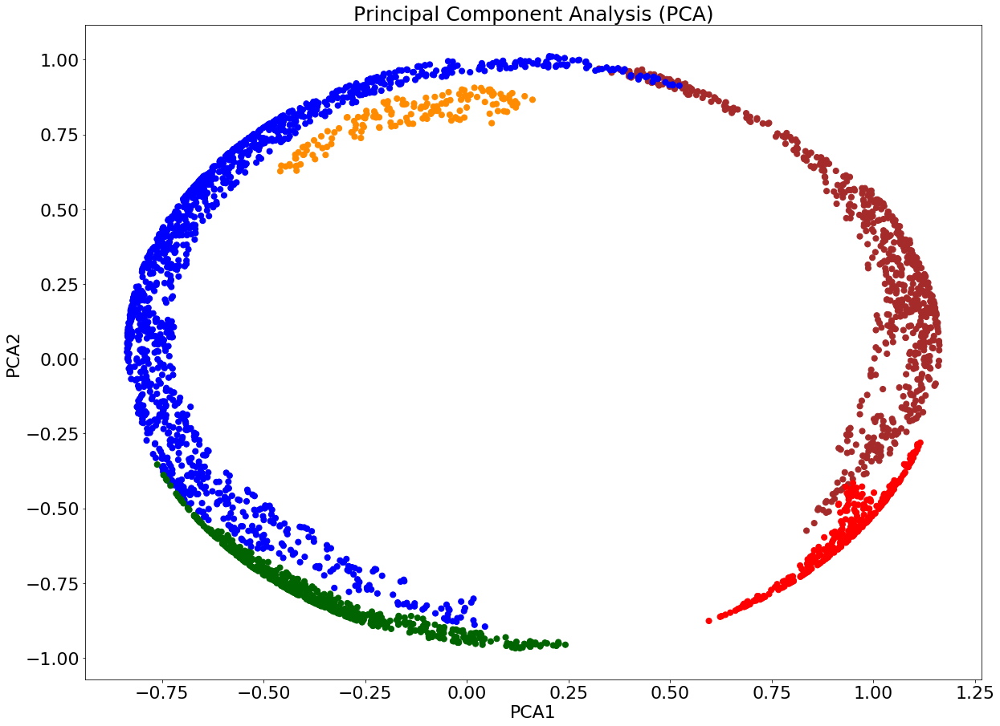

In [172]:
from sklearn.decomposition import PCA
X_sphere_reduced = PCA(n_components = 2).fit_transform(X_sphere)
plt.figure(figsize=(20,15))
plt.scatter(X_sphere_reduced[:, 0], X_sphere_reduced[:, 1], c = y, s = 50)
plt.title('Principal Component Analysis (PCA)', fontsize = 25)
plt.xlabel("PCA1", fontsize = 22); plt.ylabel("PCA2", fontsize = 22)
plt.show()

[t-SNE] Computing 3022 nearest neighbors...
[t-SNE] Indexed 3023 samples in 0.000s...
[t-SNE] Computed neighbors for 3023 samples in 1.185s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3023
[t-SNE] Computed conditional probabilities for sample 2000 / 3023
[t-SNE] Computed conditional probabilities for sample 3000 / 3023
[t-SNE] Computed conditional probabilities for sample 3023 / 3023
[t-SNE] Mean sigma: 1.077166
[t-SNE] Computed conditional probabilities in 3.774s
[t-SNE] Iteration 50: error = 34.5676880, gradient norm = 0.0000007 (50 iterations in 4.207s)
[t-SNE] Iteration 100: error = 34.5713806, gradient norm = 0.0000000 (50 iterations in 3.844s)
[t-SNE] Iteration 100: gradient norm 0.000000. Finished.
[t-SNE] KL divergence after 100 iterations with early exaggeration: 34.571381
[t-SNE] Iteration 150: error = 0.1153407, gradient norm = 0.0036319 (50 iterations in 4.265s)
[t-SNE] Iteration 200: error = 0.0286314, gradient norm = 0.0001743 (50 iterations in 4.767s)

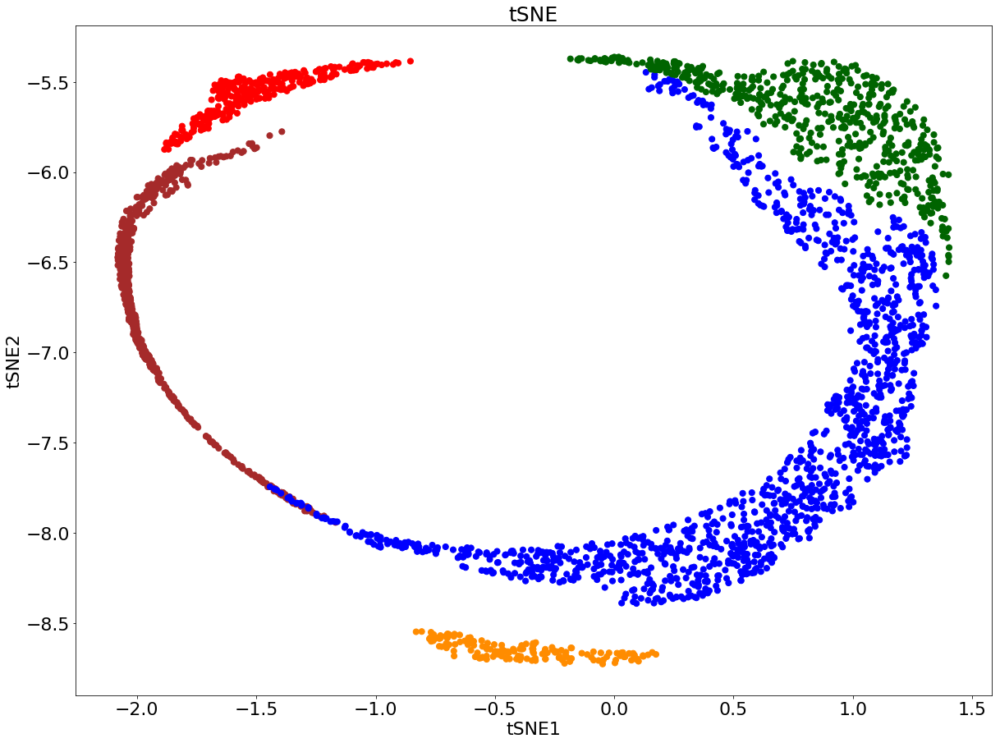

In [198]:
from sklearn.manifold import TSNE
X_sphere_reduced = PCA(n_components = 2).fit_transform(X_sphere)
model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = 2000, 
             init = X_sphere_reduced, n_iter = 1000, verbose = 2)
tsne = model.fit_transform(X_sphere)
plt.figure(figsize=(20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE', fontsize = 25); plt.xlabel("tSNE1", fontsize = 22); plt.ylabel("tSNE2", fontsize = 22)
plt.show()

UMAP(a=None, angular_rp_forest=False, b=None,
     init=array([[ 1.05712819,  0.2271468 ],
       [ 1.11068641, -0.18788974],
       [ 1.14823761,  0.18744746],
       ...,
       [-0.65540008, -0.5460625 ],
       [-0.05684139, -0.90522455],
       [-0.4559346 , -0.73633387]]),
     learning_rate=1, local_connectivity=1.0, metric='euclidean',
     metric_kwds=None, min_dist=1, n_components=2, n_epochs=1000,
     n_neighbors=2000, negative_sample_rate=5, random_state=None,
     repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
     target_metric='categorical', target_metric_kwds=None,
     target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
     transform_seed=42, verbose=2)
Construct fuzzy simplicial set
Fri Mar  6 09:36:46 2020 Finding Nearest Neighbors
Fri Mar  6 09:36:47 2020 Finished Nearest Neighbor Search
Fri Mar  6 09:36:51 2020 Construct embedding
	completed  0  /  1000 epochs
	completed  100  /  1000 epochs
	completed  200  /  1000 epochs
	completed  3

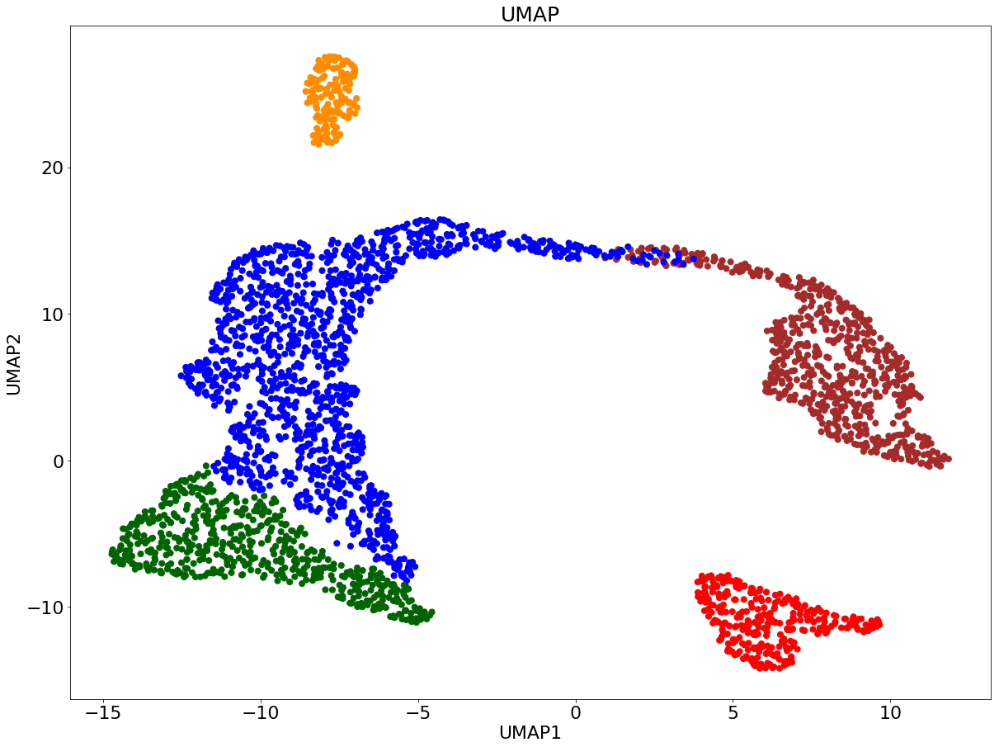

In [201]:
import warnings
warnings.filterwarnings("ignore")

from umap import UMAP
X_sphere_reduced = PCA(n_components = 2).fit_transform(X_sphere)
model = UMAP(learning_rate = 1, n_components = 2, min_dist = 1, n_neighbors = 2000, 
             init = X_sphere_reduced, n_epochs = 1000, verbose = 2)
umap = model.fit_transform(X_sphere)
plt.figure(figsize=(20,15))
plt.scatter(umap[:, 0], umap[:, 1], c = y, s = 50)
plt.title('UMAP', fontsize = 25); plt.xlabel("UMAP1", fontsize = 22); plt.ylabel("UMAP2", fontsize = 22)
plt.show()

For the Sphere non-linear manifold we conclude the same thig as for the Swiss Roll and S-shape, i.e. PCA nad tSNE at large perplexity outputs look very similar while UMAP at large n_neighbor tries to reconstruct the original 2D World Map.

Since tSNE implements a gradient descent for optimization of the KL-divergence, it seems to be the KL-gradient that disappears at large perplexities and therefore one ends up with the PCA if PCA was used for initialization of the gradient descent. Here we will take a closer look at the gradient of tSNE in  order to prove that it goes to zero at large perplexities and thus tSNE degrades to PCA, provided that PCA has been used for tSNE initialization.

The scikitlearn implementation of tSNE does not provide a comprehensive information about high- and low-dimensional probabilities and the KL-gradient without hacking the codes, but one can still import a few functions from the tSNE Python module that allow to see the distributions of the high- and low-dimensional probabilities, as well as KL-divergence values and distributions of KL-gradient values.

Here we plot the histogram of high-dimensional probability values for the Swiss Roll data set at very large perplexity = 2000: 

[t-SNE] Computed conditional probabilities for sample 1000 / 3023
[t-SNE] Computed conditional probabilities for sample 2000 / 3023
[t-SNE] Computed conditional probabilities for sample 3000 / 3023
[t-SNE] Computed conditional probabilities for sample 3023 / 3023
[t-SNE] Mean sigma: 0.615106
(4567753,)


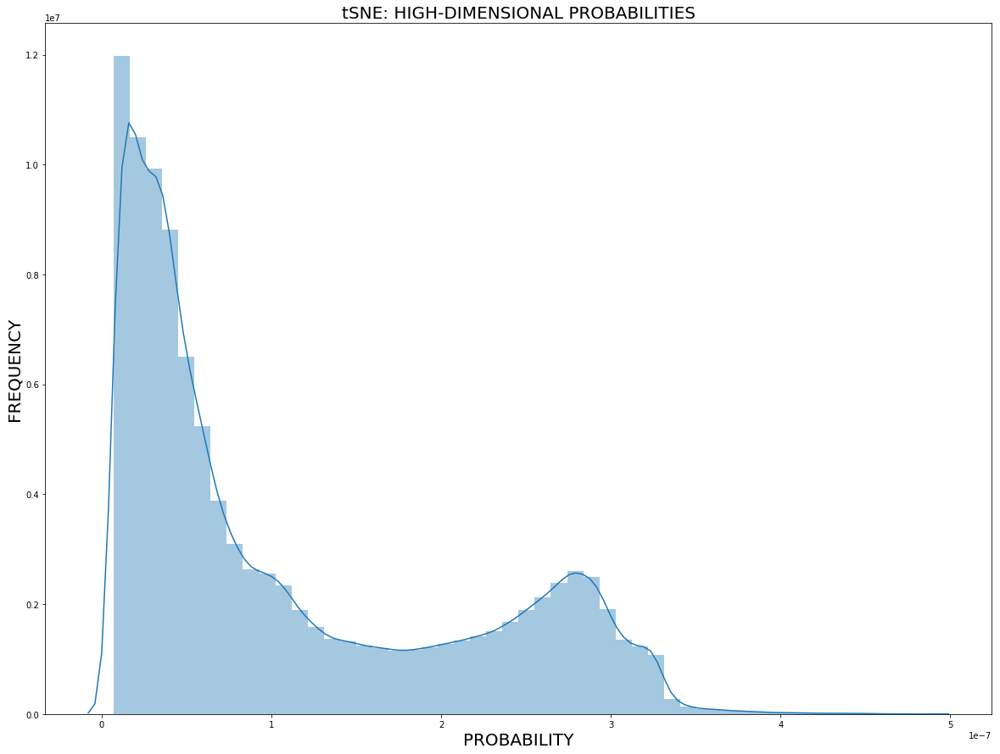

In [113]:
import seaborn as sns
from sklearn.manifold._t_sne import _joint_probabilities, _kl_divergence
from sklearn.metrics.pairwise import euclidean_distances
dist = np.square(euclidean_distances(X_swiss_roll, X_swiss_roll))
P = _joint_probabilities(distances = dist, desired_perplexity = 2000, verbose = 2)
print(P.shape)

plt.figure(figsize = (20,15))
sns.distplot(P)
plt.title("tSNE: HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

There are two interesting things here to pay attention to. First, the histogram does not really look uniform as one might expect. In theory, the Gaussian kernel should transform to a uniform kernel at large perplexity / sigma, but we do not see it here. Second, the probability values are still very small, ~10^(-7) which is very strange because one would expect them to approach 1, since the Gaussian kernel goes to 1 when sigma goes to infinity.

Now let us plot the histogram of the low-dimensional probabilities:

(4567753,)


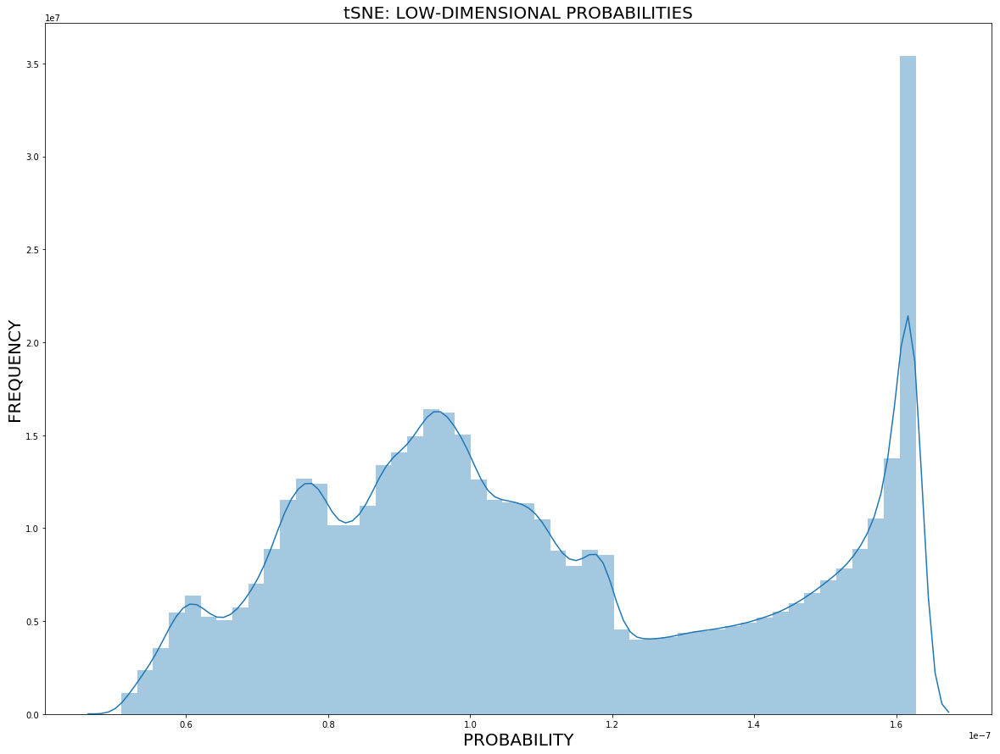

In [112]:
from scipy.spatial.distance import pdist
degrees_of_freedom = 1
MACHINE_EPSILON = np.finfo(np.double).eps
X_embedded = X_reduced.reshape(X_swiss_roll.shape[0], 2)
dist = pdist(X_embedded, "sqeuclidean")
dist /= degrees_of_freedom
dist += 1.
dist **= (degrees_of_freedom + 1.0) / -2.0
Q = np.maximum(dist / (2.0 * np.sum(dist)), MACHINE_EPSILON)
print(Q.shape)
plt.figure(figsize = (20,15))
sns.distplot(Q)
plt.title("tSNE: LOW-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

In [163]:
#P = P * 12
#2.0 * np.dot(P, np.log(np.maximum(P, MACHINE_EPSILON) / Q))

And finally, let us print the KL-divergence value, the KL-gradient vector and Frobenius norm of the KL-gradient vector, as well as plot the histogram of the KL-gradient values:

0.19772935156019597
[-3.35862231e-05 -1.43664010e-04 -1.37686982e-05 ... -3.04112302e-06
  1.38647559e-04  4.44109973e-05]
(6046,)
0.007856695290534468


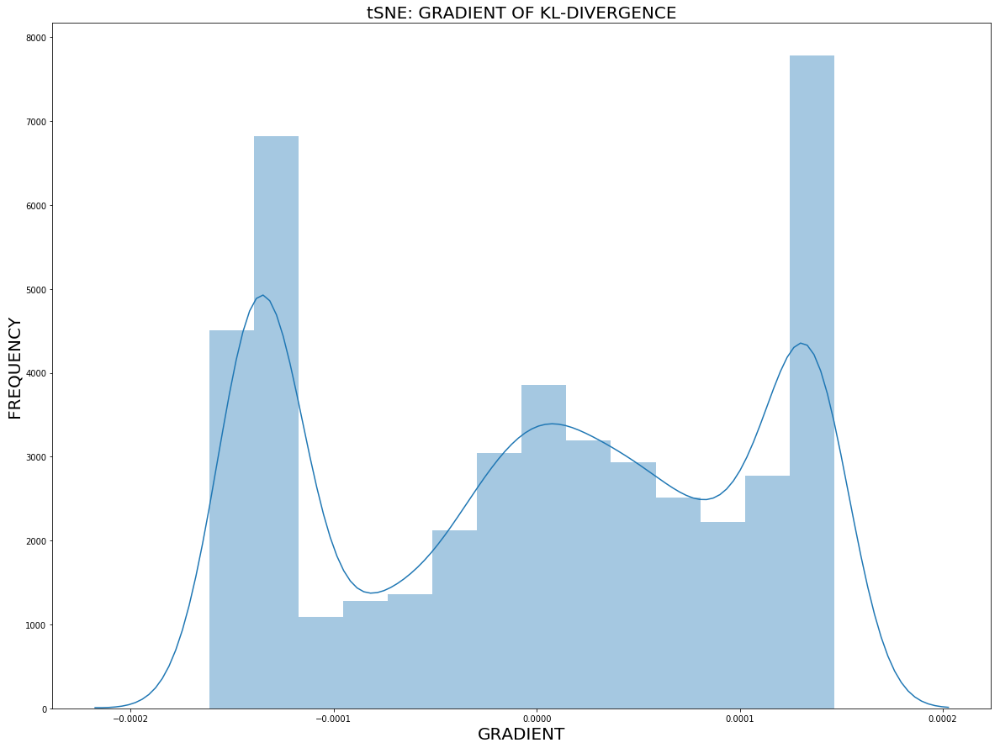

In [162]:
from sklearn.decomposition import PCA
from sklearn.manifold._t_sne import _kl_divergence
X_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
kl, grad = _kl_divergence(params = X_reduced, P = P, 
                          degrees_of_freedom = 1, n_samples = X_swiss_roll.shape[0], n_components = 2)
print(kl)
print(grad)
print(grad.shape)
print(np.linalg.norm(grad))

plt.figure(figsize = (20,15))
sns.distplot(grad)
plt.title("tSNE: GRADIENT OF KL-DIVERGENCE", fontsize = 20)
plt.xlabel("GRADIENT", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

Finally, let us gradually increase the perplexity values and check how Frobenius norm of the KL-gradient behaves as a function of perplexity. Frobenius norm is just a Euclidean norm of a vector / matrix, we are using it for simplicity for capturing information about the KL-gradient vector in one value.

Perplexity = 3, KL-divergence = 6.425246929740883, grad_norm = 0.017910456730326773
Perplexity = 53, KL-divergence = 3.6183483271934085, grad_norm = 0.017852346247683164
Perplexity = 103, KL-divergence = 2.952651491603908, grad_norm = 0.0177726417703892
Perplexity = 153, KL-divergence = 2.556617956939391, grad_norm = 0.01768317832496556
Perplexity = 203, KL-divergence = 2.2752020950398997, grad_norm = 0.017583055472569407
Perplexity = 253, KL-divergence = 2.0576415779852653, grad_norm = 0.01747092400186825
Perplexity = 303, KL-divergence = 1.8801636512971531, grad_norm = 0.017345346149643132
Perplexity = 353, KL-divergence = 1.7301104669288927, grad_norm = 0.017204741403936224
Perplexity = 403, KL-divergence = 1.6005626681475063, grad_norm = 0.0170489164229274
Perplexity = 453, KL-divergence = 1.4870289131570757, grad_norm = 0.016878886498689728
Perplexity = 503, KL-divergence = 1.3862953522393138, grad_norm = 0.01669598816448813
Perplexity = 553, KL-divergence = 1.296061000168976, gra

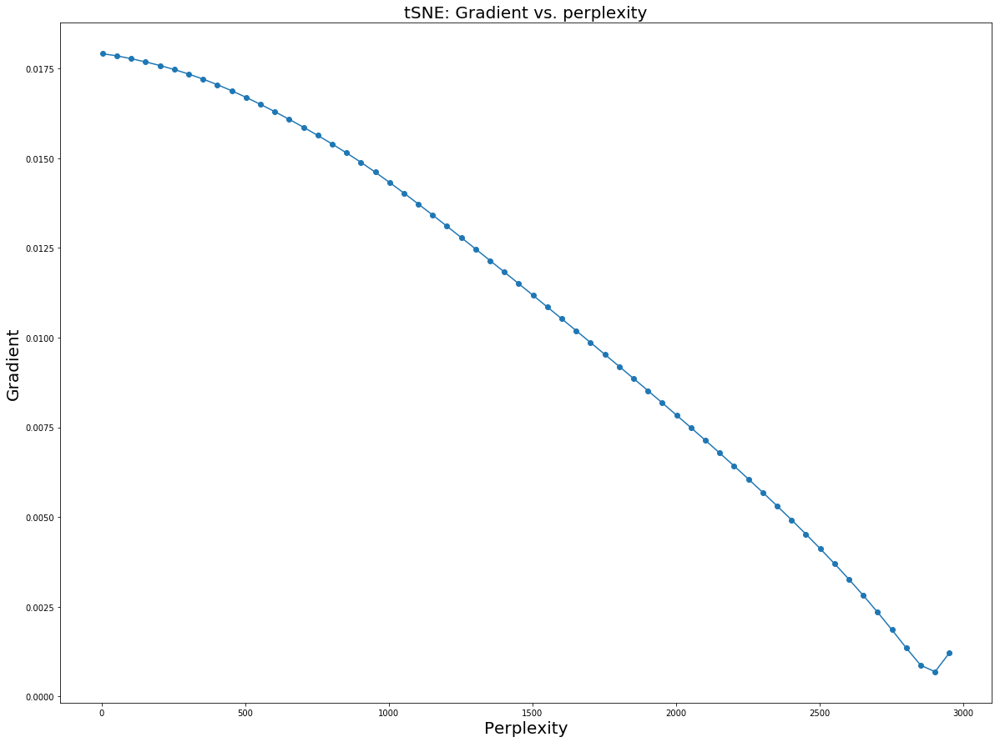

In [17]:
from sklearn.decomposition import PCA
from sklearn.manifold._t_sne import _joint_probabilities, _kl_divergence
from sklearn.metrics.pairwise import euclidean_distances

X_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
dist = np.square(euclidean_distances(X_swiss_roll, X_swiss_roll))

my_grad_norm = []
for PERP in range(3,3000,50):
    P = _joint_probabilities(distances = dist, desired_perplexity = PERP, verbose = 0)
    #P = 12 * P
    kl, grad = _kl_divergence(params = X_reduced, P = P, 
                              degrees_of_freedom = 1, n_samples = X_swiss_roll.shape[0], n_components = 2)
    grad_norm = np.linalg.norm(grad)
    #grad_norm = np.mean(grad)
    my_grad_norm.append(grad_norm)
    print('Perplexity = {0}, KL-divergence = {1}, grad_norm = {2}'.format(PERP, kl, grad_norm))

plt.figure(figsize = (20,15))
plt.plot(range(3,3000,50), my_grad_norm, '-o')
plt.title("tSNE: Gradient vs. perplexity", fontsize = 20)
plt.xlabel("Perplexity", fontsize = 20)
plt.ylabel("Gradient", fontsize = 20)
plt.show()

We conclude that the KL-gradient decreases with the increase of perplexity reaching almost zero values when perplexity approaches the sample size of the Swiss Roll data set. Now we are going to reproduce as much as possible the output of the scikitlearn implementation of tSNE. This means that we have to write functions for high- and low-dimensional probabilities, KL-divergence, KL-gradient and gradient descent, so we need to make sure that we mimic the scikitlearn output, i.e. the probability histograms as well as KL and KL-gradient values look identical. First, we run the tSNE (scikitlearn implementation) on the Swiss Roll again using method = 'exact' and early_exaggeration = 1, this output we will try to mimic later.

[t-SNE] Computing pairwise distances...
[t-SNE] Computed conditional probabilities for sample 1000 / 3023
[t-SNE] Computed conditional probabilities for sample 2000 / 3023
[t-SNE] Computed conditional probabilities for sample 3000 / 3023
[t-SNE] Computed conditional probabilities for sample 3023 / 3023
[t-SNE] Mean sigma: 0.615106
[t-SNE] Iteration 1: error = 0.1977460, gradient norm = 0.0078570 (1 iterations in 0.379s)
[t-SNE] Iteration 2: error = 0.1880074, gradient norm = 0.0076339 (1 iterations in 0.371s)
[t-SNE] Iteration 3: error = 0.1719964, gradient norm = 0.0072181 (1 iterations in 0.382s)
[t-SNE] Iteration 4: error = 0.1525274, gradient norm = 0.0066357 (1 iterations in 0.372s)
[t-SNE] Iteration 5: error = 0.1320209, gradient norm = 0.0059367 (1 iterations in 0.375s)
[t-SNE] Iteration 6: error = 0.1123988, gradient norm = 0.0051887 (1 iterations in 0.371s)
[t-SNE] Iteration 7: error = 0.0949130, gradient norm = 0.0044568 (1 iterations in 0.375s)
[t-SNE] Iteration 8: error = 0

[t-SNE] Iteration 87: error = 0.0259330, gradient norm = 0.0000003 (1 iterations in 0.369s)
[t-SNE] Iteration 88: error = 0.0259330, gradient norm = 0.0000002 (1 iterations in 0.368s)
[t-SNE] Iteration 89: error = 0.0259330, gradient norm = 0.0000002 (1 iterations in 0.368s)
[t-SNE] Iteration 90: error = 0.0259330, gradient norm = 0.0000002 (1 iterations in 0.367s)
[t-SNE] Iteration 91: error = 0.0259330, gradient norm = 0.0000002 (1 iterations in 0.368s)
[t-SNE] Iteration 92: error = 0.0259330, gradient norm = 0.0000002 (1 iterations in 0.368s)
[t-SNE] Iteration 93: error = 0.0259330, gradient norm = 0.0000001 (1 iterations in 0.368s)
[t-SNE] Iteration 94: error = 0.0259330, gradient norm = 0.0000001 (1 iterations in 0.367s)
[t-SNE] Iteration 95: error = 0.0259330, gradient norm = 0.0000001 (1 iterations in 0.369s)
[t-SNE] Iteration 96: error = 0.0259330, gradient norm = 0.0000001 (1 iterations in 0.367s)
[t-SNE] Iteration 96: gradient norm 0.000000. Finished.
[t-SNE] KL divergence af

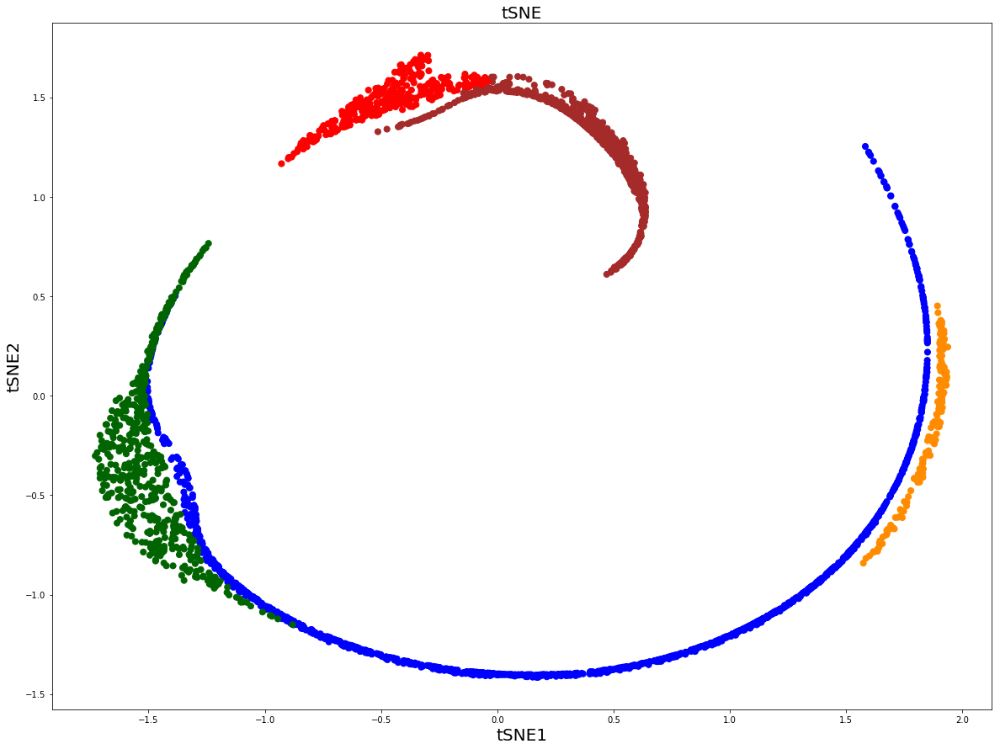

In [16]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
X_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = 2000, 
             init = X_reduced, n_iter = 1000, verbose = 2, method = 'exact', early_exaggeration = 1)
tsne = model.fit_transform(X_swiss_roll)
plt.figure(figsize = (20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE', fontsize = 20); plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

Let us first write a function delivering the high-dimensional probabilities to observe points at certain distances:


This data set contains 3023 samples

Dimensions of the  data set: 
(3023, 3) (3023,)


Sigma binary search finished 1000 of 3023 cells
Sigma binary search finished 2000 of 3023 cells
Sigma binary search finished 3000 of 3023 cells

Mean sigma = 0.44061425423882394
(4567753,)


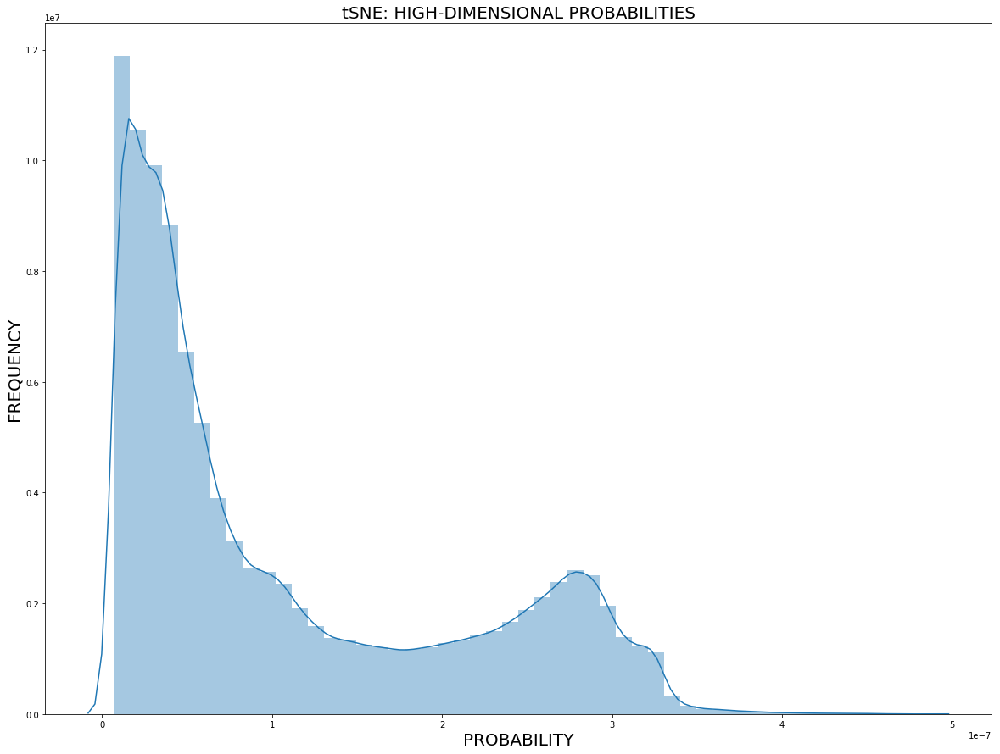

In [114]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import euclidean_distances

N_LOW_DIMS = 2
MAX_ITER = 200
PERPLEXITY = 2000
LEARNING_RATE = 0.1

X_train = X_swiss_roll; n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = y
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)
print('\n')

dist = np.square(euclidean_distances(X_train, X_train))
X_reduced = PCA(n_components = 2).fit_transform(X_train)

def prob_high_dim(sigma, dist_row):
    exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
    exp_distance[dist_row] = 0
    prob_not_symmetr = exp_distance / np.sum(exp_distance)
    return prob_not_symmetr

def perplexity(prob):
    return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))

def sigma_binary_search(perp_of_sigma, fixed_perplexity):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if perp_of_sigma(approx_sigma) < fixed_perplexity:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

prob = np.zeros((n,n)); sigma_array = []
for dist_row in range(n):
    func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
    binary_search_result = sigma_binary_search(func, PERPLEXITY)
    prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
    sigma_array.append(binary_search_result)
    if (dist_row + 1) % 1000 == 0:
        print("Sigma binary search finished {0} of {1} cells".format(dist_row + 1, n))
print("\nMean sigma = " + str(np.mean(sigma_array)))

P = (prob + np.transpose(prob)) / (2*n)
P[np.tril_indices(P.shape[0])] = np.nan
P = P[~np.isnan(P)]
print(P.shape)

plt.figure(figsize = (20,15))
sns.distplot(P)
plt.title("tSNE: HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

Comparing this histogram with the output of scikitlearn tSNE above we conclude that the distributions look very similar. Very good, let us now mimic the distribution of the low-dimensional probabilities and KL-divergence:

In [128]:
def prob_low_dim(Y):
    inv_distances = np.power(1 + np.square(euclidean_distances(Y, Y)), -1)
    inv_distances[np.tril_indices(Y.shape[0])] = np.nan
    inv_distances = inv_distances[~np.isnan(inv_distances)]
    return inv_distances / (2 * np.sum(inv_distances))

def KL(P, Y):
    Q = prob_low_dim(Y)
    return 2 * np.dot(P, np.log(P / Q))

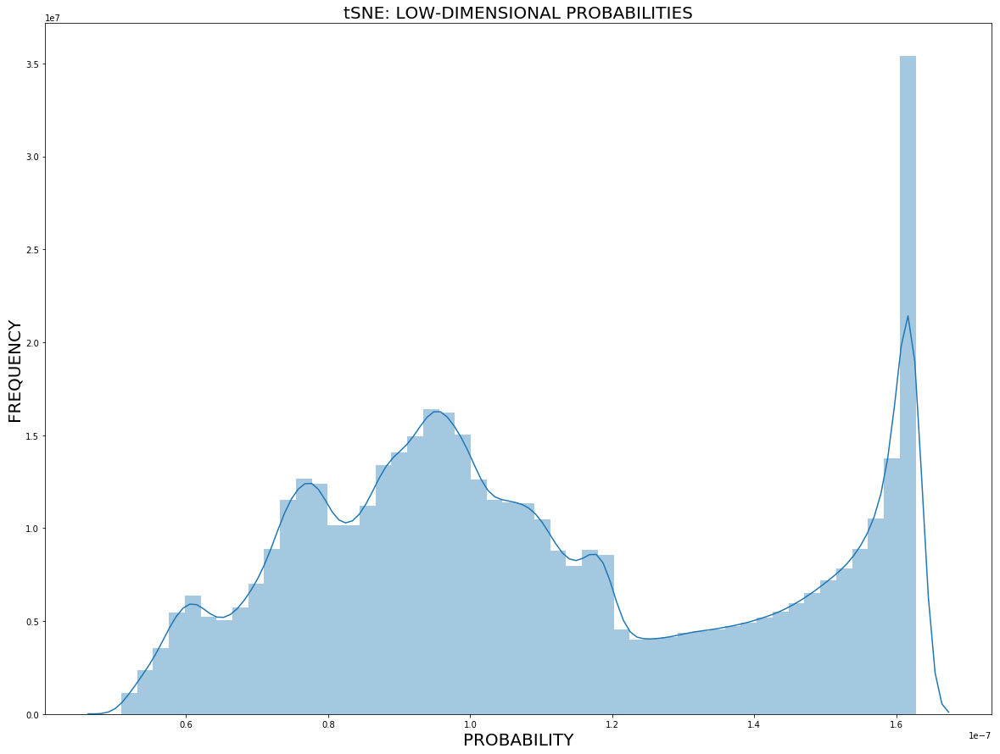

In [116]:
plt.figure(figsize = (20,15))
sns.distplot(prob_low_dim(X_reduced))
plt.title("tSNE: LOW-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

In [118]:
prob_low_dim(X_reduced).shape

(4567753,)

In [119]:
P.shape

(4567753,)

In [117]:
2.0 * np.dot(P, np.log(P / prob_low_dim(X_reduced)))

0.19772935156019608

In [129]:
KL(P, X_reduced)

0.19772935156019608

Again, we conclude that this histogram looks almost identical to the histogram above from the scikiltlearn tSNE output. Finally, we reproduce below the KL-divergence vector of scikitlearn tSNE.

In [164]:
from scipy.spatial.distance import squareform
def KL_gradient(P, Y):
    Q = prob_low_dim(Y)
    inv_distances = np.power(1 + np.square(euclidean_distances(Y, Y)), -1)
    inv_distances[np.tril_indices(Y.shape[0])] = np.nan
    inv_distances = inv_distances[~np.isnan(inv_distances)]
    PQd = squareform((P - Q) * inv_distances)
    
    grad = np.ndarray((n, N_LOW_DIMS), dtype = Y.dtype)
    for i in range(n):
        grad[i] = np.dot(np.ravel(PQd[i], order = 'K'), Y[i] - Y)
    
    return 4 * grad.ravel()

In [165]:
KL_gradient(P, X_reduced)

array([-3.35862231e-05, -1.43664010e-04, -1.37686982e-05, ...,
       -3.04112302e-06,  1.38647559e-04,  4.44109973e-05])

Now we have the building bricks of the tSNE algorithm, let us wrap it up as a single pieace of code delivering all statistics we want to obtain from tSNE.


This data set contains 3023 samples

Dimensions of the  data set: 
(3023, 3) (3023,)




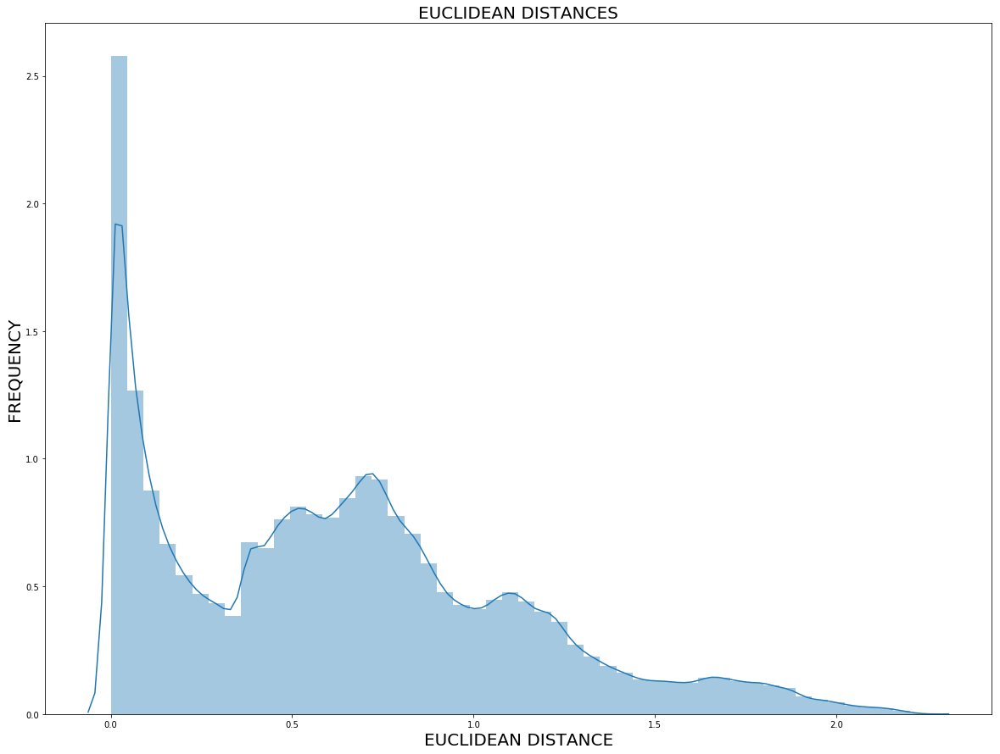

Sigma binary search finished 1000 of 3023 cells
Sigma binary search finished 2000 of 3023 cells
Sigma binary search finished 3000 of 3023 cells

Mean sigma = 0.44061425423882394


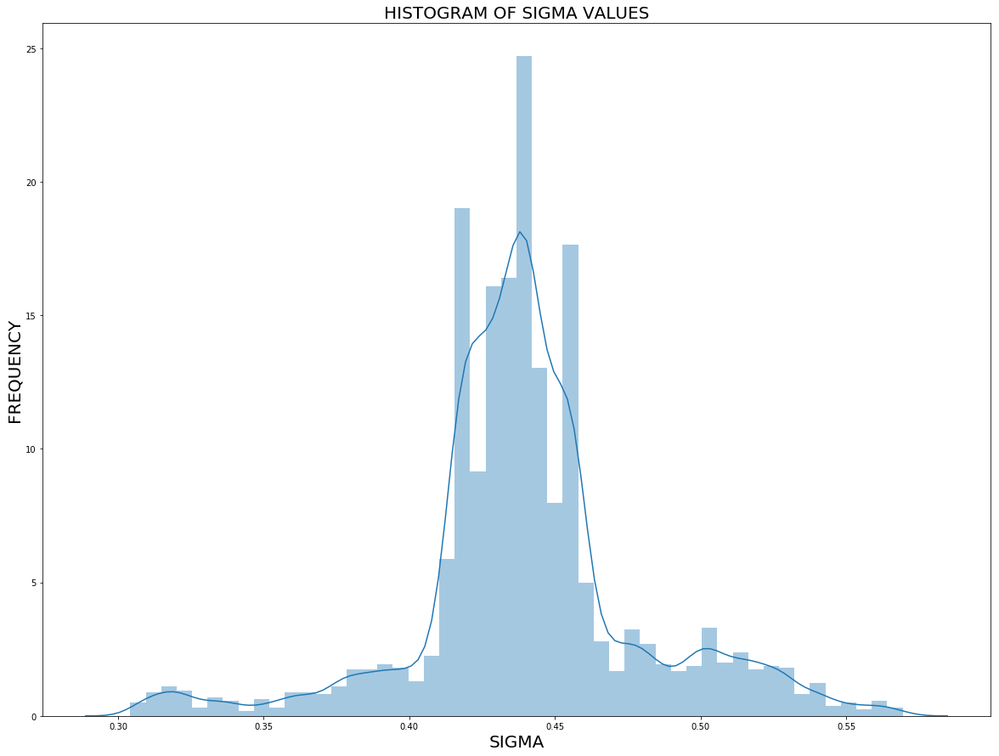

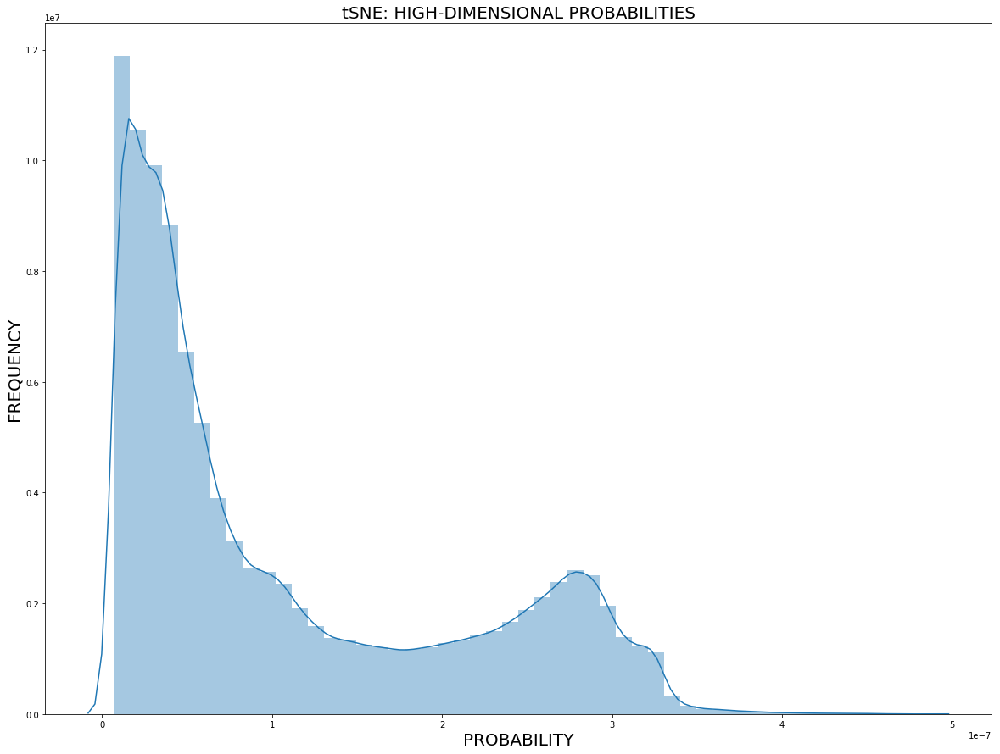

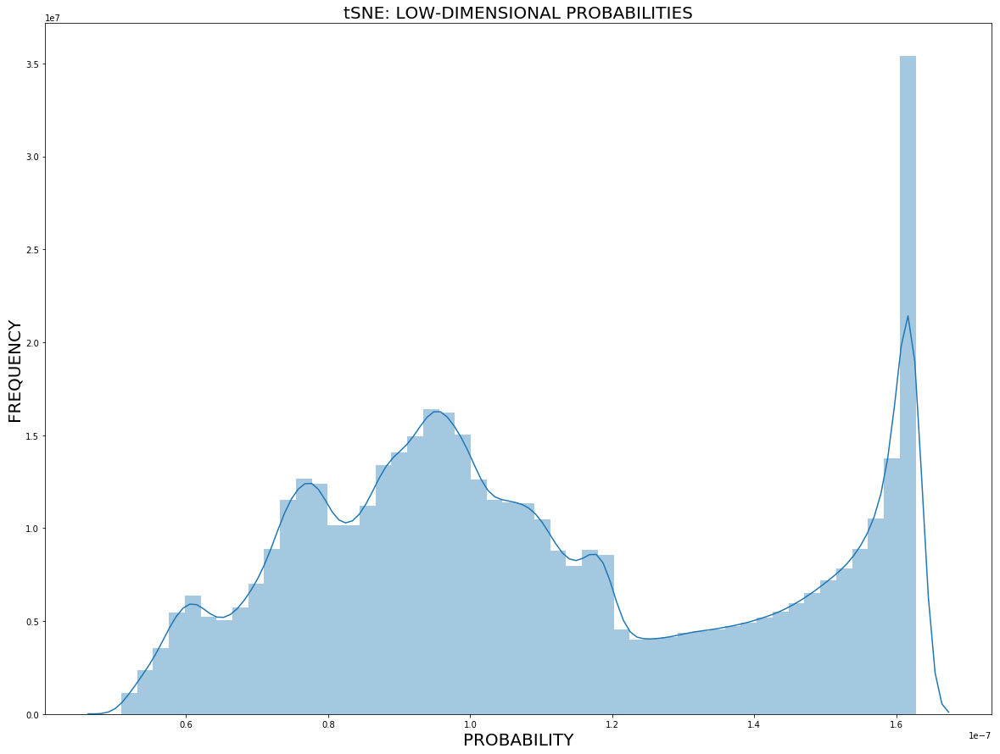

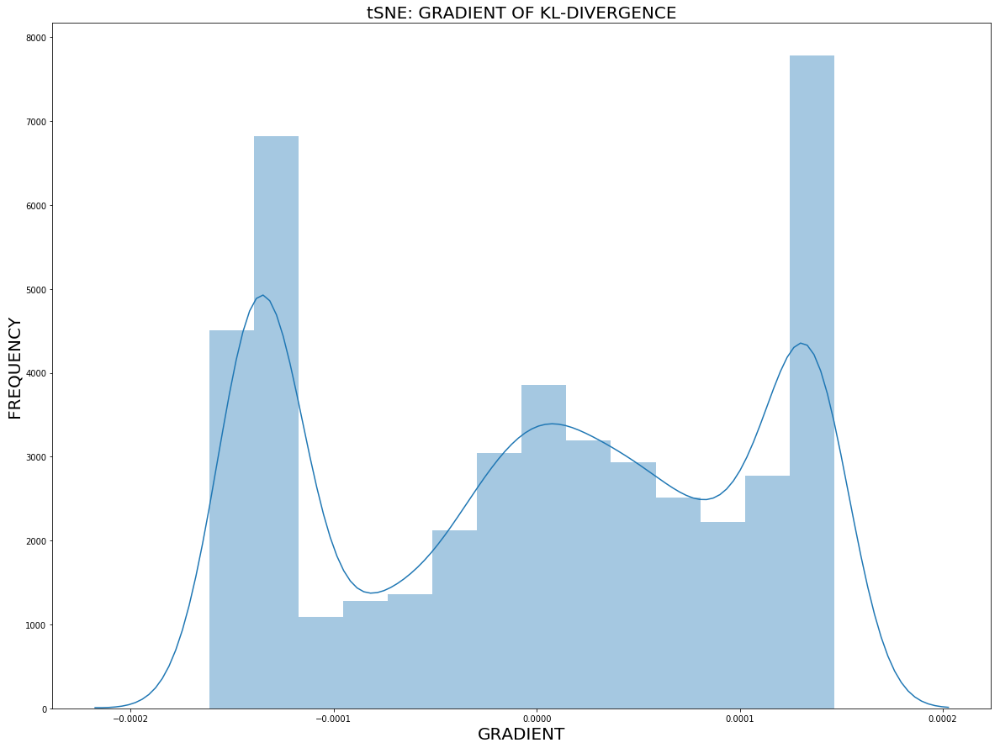

Running Gradient Descent: 

Iter = 0, KL divergence = 0.19772935156019605, KL-gradient = 0.007856695290534468
Iter = 1, KL divergence = 0.18560179589709513, KL-gradient = 0.0075752202878324485
Iter = 2, KL divergence = 0.16535091532656065, KL-gradient = 0.007028271976442297
Iter = 3, KL divergence = 0.1412752730307692, KL-gradient = 0.006261730272795559
Iter = 4, KL divergence = 0.11716397003628778, KL-gradient = 0.005374782612794075
Iter = 5, KL divergence = 0.09560242272549282, KL-gradient = 0.004481885984126101
Iter = 6, KL divergence = 0.0777973950189654, KL-gradient = 0.003670488444747745
Iter = 7, KL divergence = 0.06388595401674256, KL-gradient = 0.0029858584832976923
Iter = 8, KL divergence = 0.05340527811716026, KL-gradient = 0.0024369270930010858
Iter = 9, KL divergence = 0.04567779468179057, KL-gradient = 0.0020088452903850177
Iter = 10, KL divergence = 0.040039803713954825, KL-gradient = 0.001675161793313108
Iter = 11, KL divergence = 0.03594067530592024, KL-gradient = 0.00

Iter = 97, KL divergence = 0.025931771422774773, KL-gradient = 6.293914213666187e-06
Iter = 98, KL divergence = 0.025931729217747324, KL-gradient = 6.178441218788603e-06
Iter = 99, KL divergence = 0.025931688531122793, KL-gradient = 6.064340046382786e-06


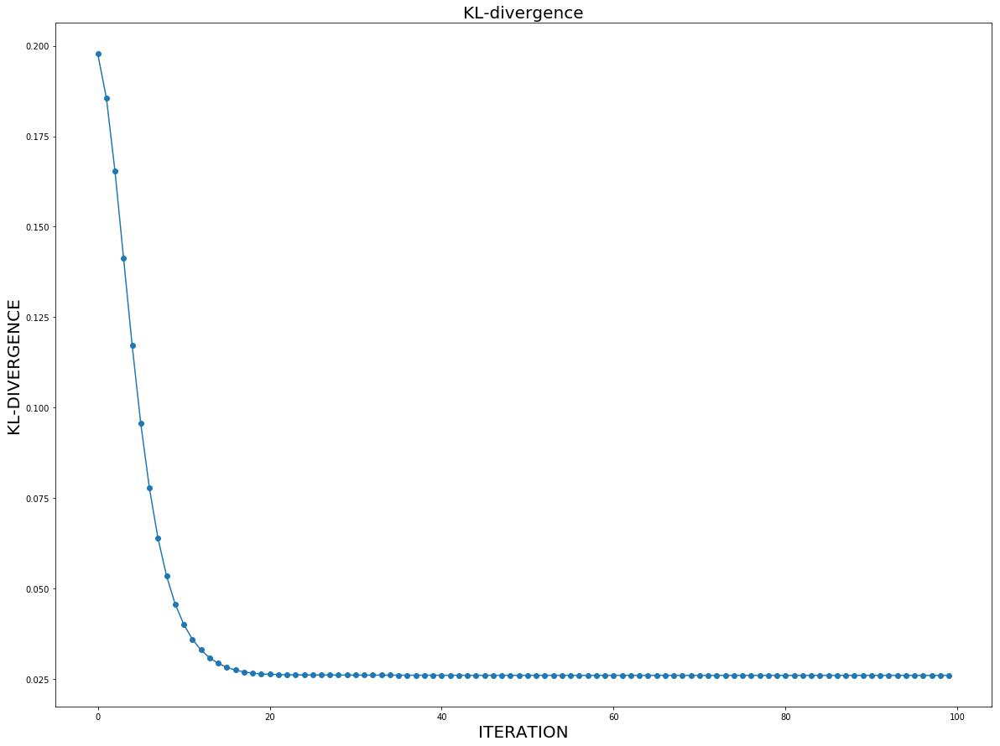

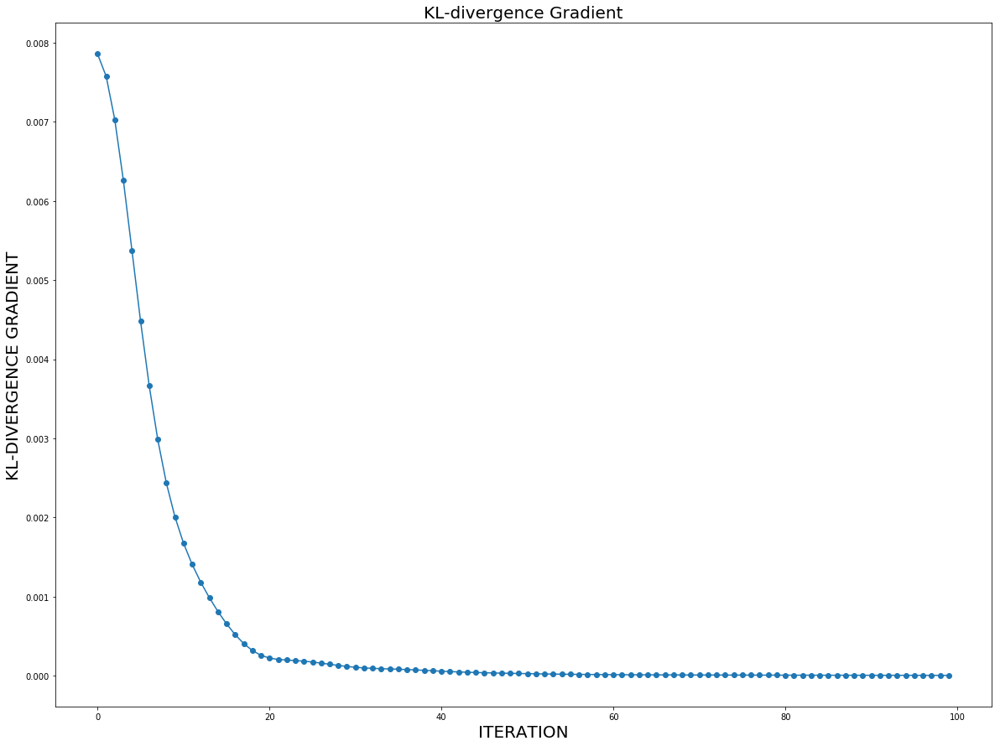

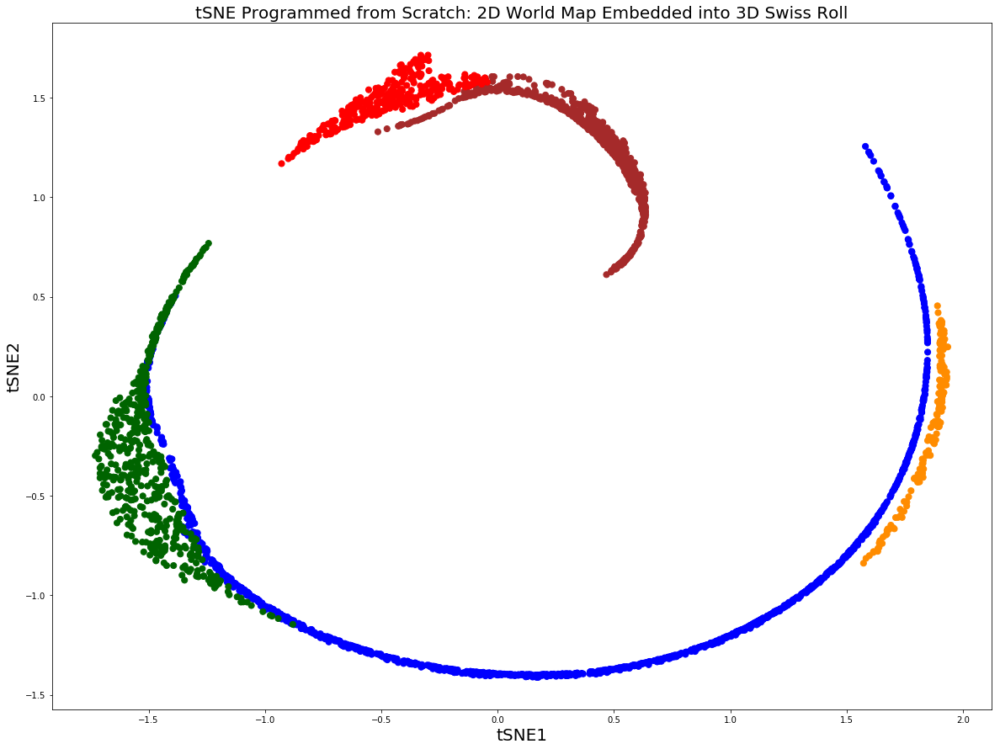

In [185]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.spatial.distance import squareform
from sklearn.metrics.pairwise import euclidean_distances

N_LOW_DIMS = 2
MOMENTUM = 0.8
MAX_ITER = 100
PERPLEXITY = 2000
LEARNING_RATE = 200

X_train = X_swiss_roll; n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa))
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)
print('\n')

dist = np.square(euclidean_distances(X_train, X_train))
plt.figure(figsize = (20,15))
sns.distplot(dist.reshape(-1,1))
plt.title("EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

X_reduced = PCA(n_components = 2).fit_transform(X_train)

def prob_high_dim(sigma, dist_row):
    exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
    exp_distance[dist_row] = 0
    prob_not_symmetr = exp_distance / np.sum(exp_distance)
    return prob_not_symmetr

def perplexity(prob):
    return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))

def sigma_binary_search(perp_of_sigma, fixed_perplexity):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if perp_of_sigma(approx_sigma) < fixed_perplexity:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

prob = np.zeros((n,n)); sigma_array = []
for dist_row in range(n):
    func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
    binary_search_result = sigma_binary_search(func, PERPLEXITY)
    prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
    sigma_array.append(binary_search_result)
    if (dist_row + 1) % 1000 == 0:
        print("Sigma binary search finished {0} of {1} cells".format(dist_row + 1, n))
print("\nMean sigma = " + str(np.mean(sigma_array)))

plt.figure(figsize = (20,15))
sns.distplot(sigma_array)
plt.title("HISTOGRAM OF SIGMA VALUES", fontsize = 20)
plt.xlabel("SIGMA", fontsize = 20)
plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

P = (prob + np.transpose(prob)) / (2*n)
P[np.tril_indices(P.shape[0])] = np.nan
P = P[~np.isnan(P)]

plt.figure(figsize = (20,15))
sns.distplot(P)
plt.title("tSNE: HIGH-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

def prob_low_dim(Y):
    Y = Y.reshape(n, N_LOW_DIMS)
    inv_distances = np.power(1 + np.square(euclidean_distances(Y, Y)), -1)
    inv_distances[np.tril_indices(Y.shape[0])] = np.nan
    inv_distances = inv_distances[~np.isnan(inv_distances)]
    return inv_distances / (2 * np.sum(inv_distances))

def KL(P, Y):
    Y = Y.reshape(n, N_LOW_DIMS)
    Q = prob_low_dim(Y)
    return 2 * np.dot(P, np.log(P / Q))

plt.figure(figsize = (20,15))
sns.distplot(prob_low_dim(X_reduced))
plt.title("tSNE: LOW-DIMENSIONAL PROBABILITIES", fontsize = 20)
plt.xlabel("PROBABILITY", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

def KL_gradient(P, Y):
    Y = Y.reshape(n, N_LOW_DIMS)
    Q = prob_low_dim(Y)
    inv_distances = np.power(1 + np.square(euclidean_distances(Y, Y)), -1)
    inv_distances[np.tril_indices(Y.shape[0])] = np.nan
    inv_distances = inv_distances[~np.isnan(inv_distances)]
    PQd = squareform((P - Q) * inv_distances)
    grad = np.ndarray((n, N_LOW_DIMS), dtype = Y.dtype)
    for i in range(n):
        grad[i] = np.dot(np.ravel(PQd[i], order = 'K'), Y[i] - Y)
    return 4 * grad.ravel()

plt.figure(figsize = (20,15))
sns.distplot(KL_gradient(P, X_reduced))
plt.title("tSNE: GRADIENT OF KL-DIVERGENCE", fontsize = 20)
plt.xlabel("GRADIENT", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

np.random.seed(12345)
y = X_reduced.copy().ravel()
update = np.zeros_like(y)
KL_array = []; KL_gradient_array = []
print("Running Gradient Descent: \n")
for i in range(MAX_ITER):
    KL_array.append(KL(P, y))
    KL_gradient_array.append(np.linalg.norm(KL_gradient(P, y)))
    #if i % 100 == 0:
    print("Iter = " + str(i) + ", KL divergence = " + str(KL(P, y)) + ", KL-gradient = " + 
          str(np.linalg.norm(KL_gradient(P, y))))
    update = MOMENTUM * update - LEARNING_RATE * KL_gradient(P, y)
    y = y + update
        
plt.figure(figsize = (20,15))
plt.plot(KL_array,'-o')
plt.title("KL-divergence", fontsize = 20)
plt.xlabel("ITERATION", fontsize = 20); plt.ylabel("KL-DIVERGENCE", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
plt.plot(KL_gradient_array,'-o')
plt.title("KL-divergence Gradient", fontsize = 20)
plt.xlabel("ITERATION", fontsize = 20); plt.ylabel("KL-DIVERGENCE GRADIENT", fontsize = 20)
plt.show()

plt.figure(figsize = (20,15))
plt.scatter(y.reshape(n, N_LOW_DIMS)[:,0], y.reshape(n, N_LOW_DIMS)[:,1], 
            c = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa)), 
            cmap = 'tab10', s = 50)
plt.title("tSNE Programmed from Scratch: 2D World Map Embedded into 3D Swiss Roll", fontsize = 20)
plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

In [183]:
KL_gradient_array_perp100 = KL_gradient_array

In [181]:
KL_gradient_array_perp500 = KL_gradient_array

In [186]:
KL_gradient_array_perp2000 = KL_gradient_array

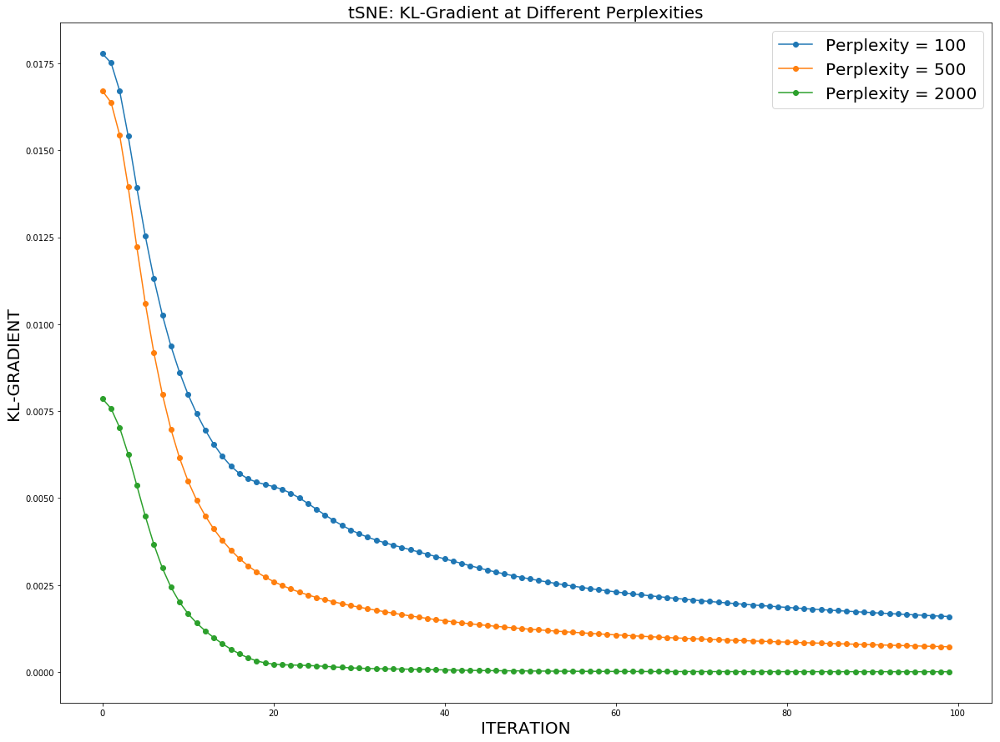

In [187]:
plt.figure(figsize = (20, 15))

plt.plot(range(MAX_ITER), KL_gradient_array_perp100, '-o')
plt.plot(range(MAX_ITER), KL_gradient_array_perp500, '-o')
plt.plot(range(MAX_ITER), KL_gradient_array_perp2000, '-o')

plt.gca().legend(('Perplexity = 100', 'Perplexity = 500', 'Perplexity = 2000'), fontsize = 20)
plt.title("tSNE: KL-Gradient at Different Perplexities", fontsize = 20)
plt.xlabel("ITERATION", fontsize = 20); plt.ylabel("KL-GRADIENT", fontsize = 20)
plt.show()

We can clearly see that the KL-gradient becomes close to zero at large perplexities. However, we have seen that the high-dimensional probabilities are not at all close to 1, so $P\approx 1$ at $\sigma\rightarrow\infty$ is not the reason for disappearence of the KL-gradinet at large perplexities. From the equation of the KL-gradient, only the $P-Q$ difference depends on perplexitiy, indeed the rest y-dpendent factors are not directly sensitive to the increasing of perplexity. Let us prove here that with the increase of perplexity P becomes close to Q.

In [190]:
np.linalg.norm(P)

0.00031713715663696587

In [191]:
np.linalg.norm(Q)

0.00024341306471132288

In [203]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from scipy.spatial.distance import squareform
from sklearn.metrics.pairwise import euclidean_distances

N_LOW_DIMS = 2
MOMENTUM = 0.8
MAX_ITER = 100
PERPLEXITY = 2000
LEARNING_RATE = 200

X_train = X_swiss_roll; n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa))
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)
print('\n')

X_reduced = PCA(n_components = 2).fit_transform(X_train)

def prob_high_dim(sigma, dist_row):
    exp_distance = np.exp(-dist[dist_row] / (2*sigma**2))
    exp_distance[dist_row] = 0
    prob_not_symmetr = exp_distance / np.sum(exp_distance)
    return prob_not_symmetr

def perplexity(prob):
    return np.power(2, -np.sum([p*np.log2(p) for p in prob if p!=0]))

def sigma_binary_search(perp_of_sigma, fixed_perplexity):
    sigma_lower_limit = 0; sigma_upper_limit = 1000
    for i in range(20):
        approx_sigma = (sigma_lower_limit + sigma_upper_limit) / 2
        if perp_of_sigma(approx_sigma) < fixed_perplexity:
            sigma_lower_limit = approx_sigma
        else:
            sigma_upper_limit = approx_sigma
        if np.abs(fixed_perplexity - perp_of_sigma(approx_sigma)) <= 1e-5:
            break
    return approx_sigma

def prob_low_dim(Y):
    Y = Y.reshape(n, N_LOW_DIMS)
    inv_distances = np.power(1 + np.square(euclidean_distances(Y, Y)), -1)
    inv_distances[np.tril_indices(Y.shape[0])] = np.nan
    inv_distances = inv_distances[~np.isnan(inv_distances)]
    return inv_distances / (2 * np.sum(inv_distances))

Q = prob_low_dim(X_reduced)
P2Q = []; Pmax = []; Pmedian = []
for PERP in [20, 50, 100, 300, 500, 800, 1000, 1500, 2000, 2500]:
    print('Working with Perplexity = {}'.format(PERP))
    prob = np.zeros((n,n)); sigma_array = []
    for dist_row in range(n):
        func = lambda sigma: perplexity(prob_high_dim(sigma, dist_row))
        binary_search_result = sigma_binary_search(func, PERP)
        prob[dist_row] = prob_high_dim(binary_search_result, dist_row)
        sigma_array.append(binary_search_result)
        if (dist_row + 1) % 1000 == 0:
            print("Sigma binary search finished {0} of {1} cells".format(dist_row + 1, n))
    print("\nMean sigma = " + str(np.mean(sigma_array)))

    P = (prob + np.transpose(prob)) / (2 * n)
    P[np.tril_indices(P.shape[0])] = np.nan
    P = P[~np.isnan(P)]
    
    Pmax.append(np.max(P)); Pmedian.append(np.median(P))

    print('Perplexity = {0}, P / Q = {1}, P_max = {2}, P_median = {3} \n'.
          format(PERP, np.linalg.norm(P) / np.linalg.norm(Q), np.max(P), np.median(P)))
    P2Q.append(np.linalg.norm(P) / np.linalg.norm(Q))
    print('******************************************************** \n')


This data set contains 3023 samples

Dimensions of the  data set: 
(3023, 3) (3023,)


Working with Perplexity = 20
Sigma binary search finished 1000 of 3023 cells
Sigma binary search finished 2000 of 3023 cells
Sigma binary search finished 3000 of 3023 cells

Mean sigma = 0.01579414642768075
Perplexity = 20, P / Q = 13.533318180666694, P_max = 8.236893624212539e-05, P_median = 0.0 

********************************************************
Working with Perplexity = 50
Sigma binary search finished 1000 of 3023 cells
Sigma binary search finished 2000 of 3023 cells
Sigma binary search finished 3000 of 3023 cells

Mean sigma = 0.028473629763770728
Perplexity = 50, P / Q = 8.464993097923548, P_max = 3.360856310665985e-05, P_median = 5.869031028735738e-122 

********************************************************
Working with Perplexity = 100
Sigma binary search finished 1000 of 3023 cells
Sigma binary search finished 2000 of 3023 cells
Sigma binary search finished 3000 of 3023 cells

Mean

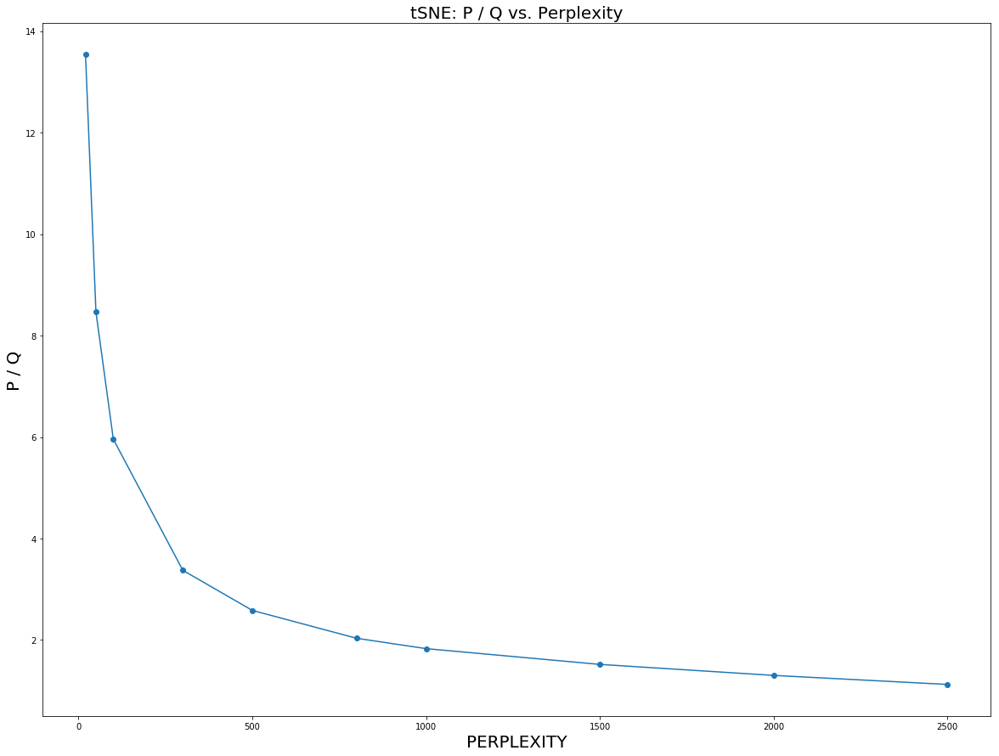

In [204]:
plt.figure(figsize=(20,15))
plt.plot([20, 50, 100, 300, 500, 800, 1000, 1500, 2000, 2500], P2Q, '-o')
plt.title("tSNE: P / Q vs. Perplexity", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20)
plt.ylabel("P / Q", fontsize = 20)
plt.show()

Here we confirm that overall (norm) P becomes suspicously similar to overall (norm) Q at large perplexities, therefore their **difference P-Q goes to zero and the KL-gradient disappears**. It implies that the attractive forces in the KL-gradient, i.e. the P-term, becomes balannced by the repulsive forces, i.e. the Q-term in the KL-gradient, and the gradient descent never starts properly becomes **when attraction is equal to repulsion, the data points do not move in space since the gradient is zero, i.e. effectively no forces act on them**. The next two plots below demonstrate what is going on with the distribution of the high-dimensional probabilities when perplexity grows, for this purpose we monitor the maximum value of the high-dimensional probabilities in order to see the spread of their values, and the median of the high-dimensional probabilities in order to see how the overall distribution moves when perplexity grows.

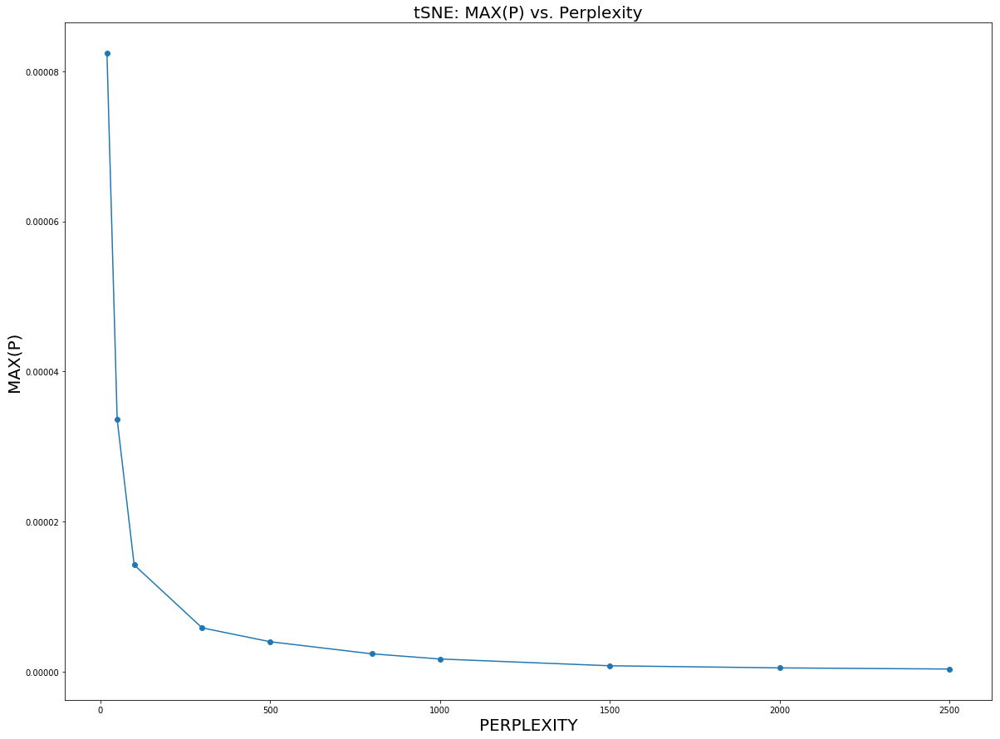

In [205]:
plt.figure(figsize=(20,15))
plt.plot([20, 50, 100, 300, 500, 800, 1000, 1500, 2000, 2500], Pmax, '-o')
plt.title("tSNE: MAX(P) vs. Perplexity", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20)
plt.ylabel("MAX(P)", fontsize = 20)
plt.show()

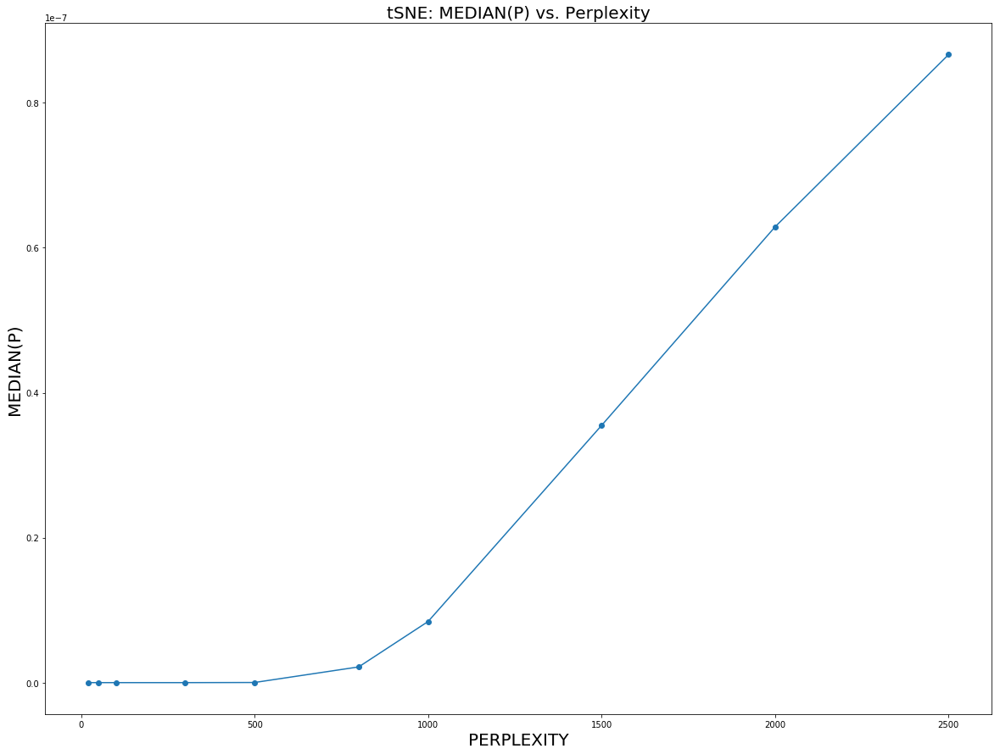

In [206]:
plt.figure(figsize=(20,15))
plt.plot([20, 50, 100, 300, 500, 800, 1000, 1500, 2000, 2500], Pmedian, '-o')
plt.title("tSNE: MEDIAN(P) vs. Perplexity", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20)
plt.ylabel("MEDIAN(P)", fontsize = 20)
plt.show()

Here we see an interesting thing. The maximum values of the high-dimensional probabilities decreases and the median value increases when perplexity grows. This implies that at low perplexities, there were a few pairs of points with very high probabilities to observe their distances, while the majority of points had almost a zero probability to obsreve them at certain distance. With the increase of perplexity, the high-dimensional probabilities for different data points become more and more similar to each other, i.e. they all increase while there no more large values of the probabilities, but they all are more or less small although not zero.

Now let us understand what exactly it means that P becomes close to Q. We know that the Q-probability has a Student t-distribution shape with the heaver tails at large distances than those of the Gaussian distribution. However, as we can see below, when $\sigma$ increase, or perplexity grows, the tails of the two distributions become comparable, so **the effect of the heavy tails of the Student t-distribution disappears at large perplexity**.

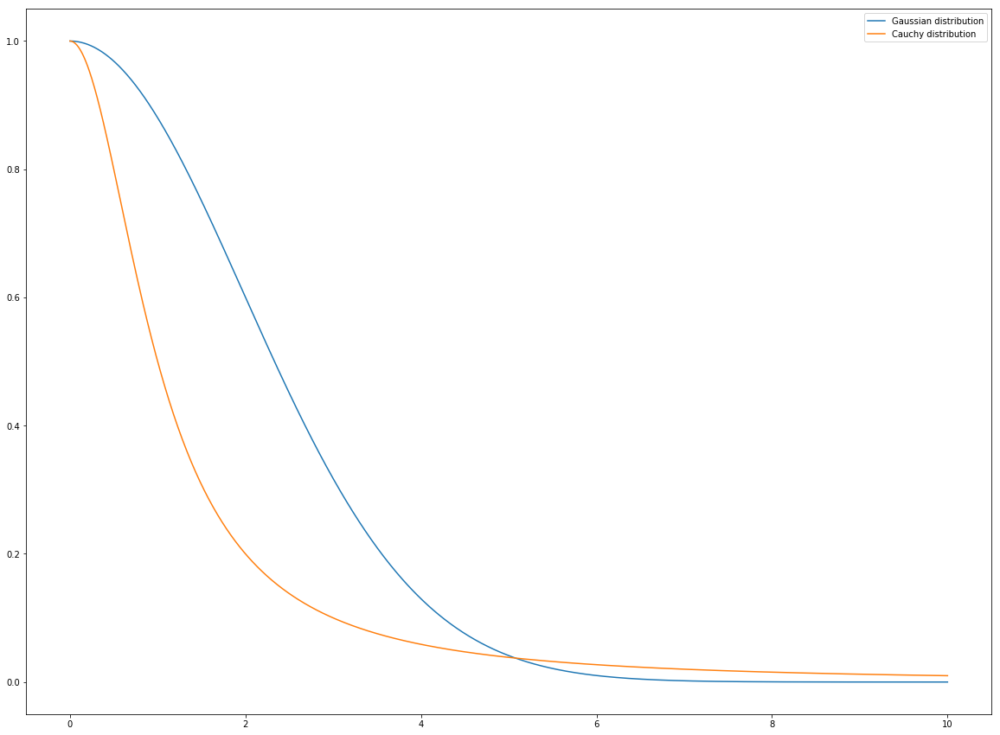

In [223]:
sigma = 2.8
z = np.linspace(0., 10, 1000)
gauss = np.exp(-z**2 / sigma**2)
cauchy = 1/(1+z**2)

plt.figure(figsize=(20,15))
plt.plot(z, gauss, label='Gaussian distribution')
plt.plot(z, cauchy, label='Cauchy distribution')
plt.legend()
plt.show()

Can we help P to be larger then Q at the initialization stage? Yes, if you remember, there is the so-called **early exaggeration** parameter $\alpha$ that is just a factor that is $\alpha P$ instead of just P is used at the initialization stage in order to avoid the problem of disappearing gradient. Hence the condition when the tSNE algorithm is not properly initialized, i.e. when the KL-gradient becomes close to zero is: 

$$\frac{\alpha}{N} e^{-\displaystyle\frac{X^2}{2\sigma^2}} = \frac{1}{1+Y^2}$$,

where $\alpha$ is the early exaggeration parameter. Here we simply multiply the high-dimensional probability by $\alpha$ and divide it by the number of samples, remember the symmetry condition of the high-dimensional probabilities from the original tSNE algorithm. Let us first check that increasing early exaggeration can help to properly initialize the tSNE. As we remember, it failed previously with init = PCA, perplexity = 2000 and learning_rate = 200, the default perplexity was 12, let us increase it to 24 and then to 500.

[t-SNE] Computing pairwise distances...
[t-SNE] Computed conditional probabilities for sample 1000 / 3023
[t-SNE] Computed conditional probabilities for sample 2000 / 3023
[t-SNE] Computed conditional probabilities for sample 3000 / 3023
[t-SNE] Computed conditional probabilities for sample 3023 / 3023
[t-SNE] Mean sigma: 0.615106
[t-SNE] Iteration 50: error = 3856.7940872, gradient norm = 3.2316799 (50 iterations in 10.398s)
[t-SNE] Iteration 100: error = 3762.6112839, gradient norm = 3.9773443 (50 iterations in 10.380s)
[t-SNE] Iteration 150: error = 3796.7606694, gradient norm = 3.6208150 (50 iterations in 10.366s)
[t-SNE] Iteration 200: error = 3860.1249547, gradient norm = 3.5382659 (50 iterations in 10.386s)
[t-SNE] Iteration 250: error = 3843.3508896, gradient norm = 4.0546551 (50 iterations in 10.413s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 3843.350890
[t-SNE] Iteration 300: error = 0.9186637, gradient norm = 0.0024350 (50 iterations in 10.436s)
[t-

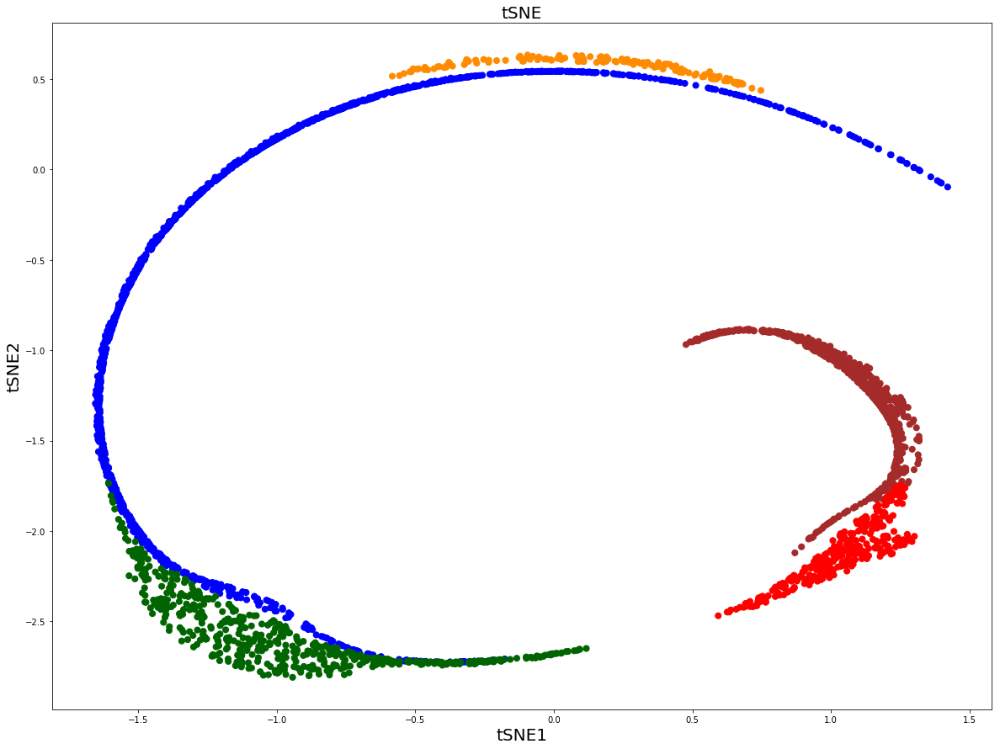

In [10]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
X_reduced = PCA(n_components = 2).fit_transform(X_swiss_roll)
y_train = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa))
model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = 2000, 
             n_iter = 1000, verbose = 2, early_exaggeration = 500, method = 'exact', init = 'random')
tsne = model.fit_transform(X_swiss_roll)
plt.figure(figsize = (20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y_train, s = 50)
plt.title('tSNE', fontsize = 20); plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

It does not look like increasing the early exaggeration parameter helps to better initialize the tSNE algorithm. An initeresting observation here is that since we embedded the 2D World Map into 3D Swiss Roll, the intrinsic dimension of the manifold is still 2D and the distances between the data points on the Swiss Roll seem to be preserved, i.e. the distributions of pairwise distances between the points in 3D and 2D are very similar.

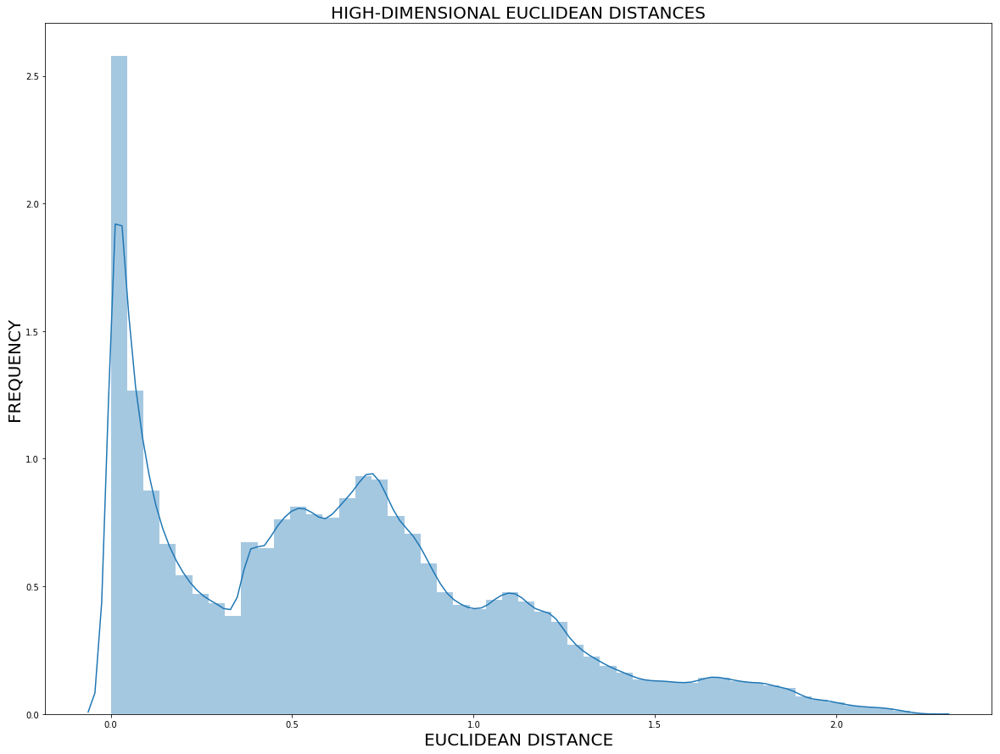

In [235]:
dist_high_dim = np.square(euclidean_distances(X_swiss_roll, X_swiss_roll))
plt.figure(figsize = (20,15))
sns.distplot(dist_high_dim.reshape(-1,1))
plt.title("HIGH-DIMENSIONAL EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

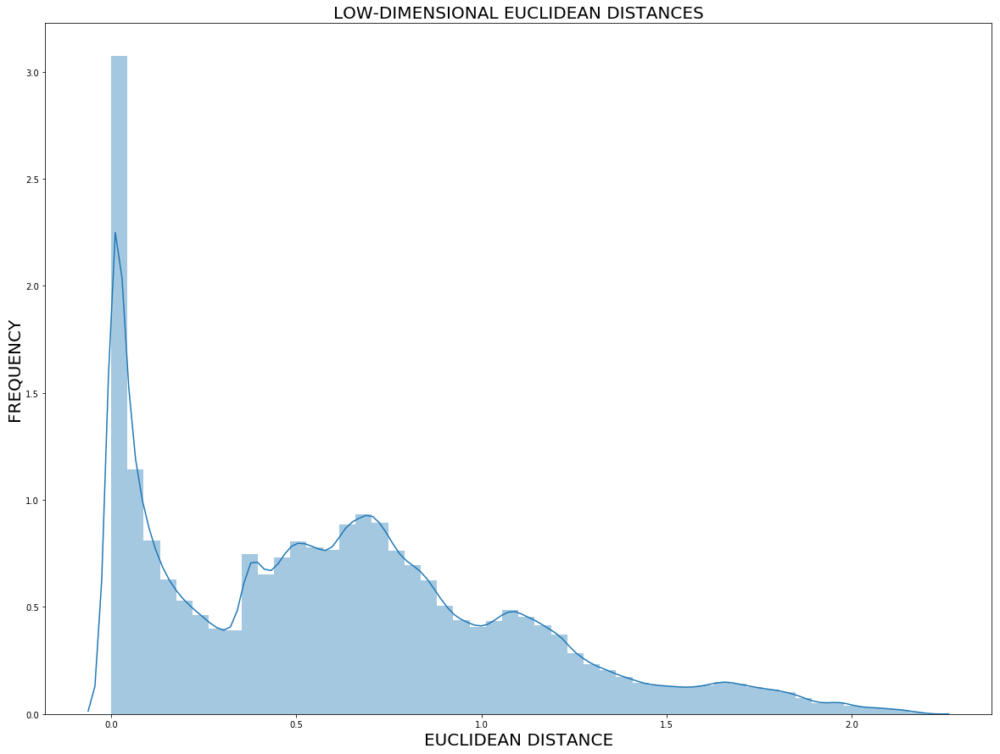

In [234]:
dist_low_dim = np.square(euclidean_distances(X_reduced, X_reduced))
plt.figure(figsize = (20,15))
sns.distplot(dist_low_dim.reshape(-1,1))
plt.title("LOW-DIMENSIONAL EUCLIDEAN DISTANCES", fontsize = 20)
plt.xlabel("EUCLIDEAN DISTANCE", fontsize = 20); plt.ylabel("FREQUENCY", fontsize = 20)
plt.show()

In [236]:
np.median(dist_high_dim.reshape(-1,1))

0.5982135076148782

In [237]:
np.median(dist_low_dim.reshape(-1,1))

0.5842699351000131

Let us now plot how P /Q changes as perplexity grows for different early exaggeration parameter values. We aim here to suggest a simple way to estimate whether the tSNE algorithm is initialized properly depending on the perplexity and early exaggeration parameters.

Working with early_exaggeration = 1
Perplexity = 10, P / Q = 19.1282720951902
Perplexity = 30, P / Q = 10.979195812646758
Perplexity = 50, P / Q = 8.462302312217563
Perplexity = 70, P / Q = 7.1328866463640015
Perplexity = 90, P / Q = 6.282481816532622
Perplexity = 110, P / Q = 5.676144785501876
Perplexity = 130, P / Q = 5.213608817630593
Perplexity = 150, P / Q = 4.844816473092694
Perplexity = 170, P / Q = 4.541485450228636
Perplexity = 190, P / Q = 4.286227533592643
Perplexity = 210, P / Q = 4.0676952506329975
Perplexity = 230, P / Q = 3.8781268836912055
Perplexity = 250, P / Q = 3.711954527834804
Perplexity = 270, P / Q = 3.564961577059985
Perplexity = 290, P / Q = 3.433814514782828
Perplexity = 310, P / Q = 3.3158523792188057
Perplexity = 330, P / Q = 3.2089832646076695
Perplexity = 350, P / Q = 3.1115716338596746
Perplexity = 370, P / Q = 3.02232656654144
Perplexity = 390, P / Q = 2.9402105779924033
Perplexity = 410, P / Q = 2.864370167700402
Perplexity = 430, P / Q = 2.79408892184

Perplexity = 570, P / Q = 9.662947008013342
Perplexity = 590, P / Q = 9.494312832631845
Perplexity = 610, P / Q = 9.334388733042362
Perplexity = 630, P / Q = 9.182416699076926
Perplexity = 650, P / Q = 9.037738892137389
Perplexity = 670, P / Q = 8.899795261964146
Perplexity = 690, P / Q = 8.768087179504308
Perplexity = 710, P / Q = 8.642201158671753
Perplexity = 730, P / Q = 8.521780914560102
Perplexity = 750, P / Q = 8.406522416599406
Perplexity = 770, P / Q = 8.296166467487328
Perplexity = 790, P / Q = 8.190500232943643
Perplexity = 810, P / Q = 8.08934058280713
Perplexity = 830, P / Q = 7.992536847823126
Perplexity = 850, P / Q = 7.89995151664493
Perplexity = 870, P / Q = 7.811458073323555
Perplexity = 890, P / Q = 7.72690282250298
Perplexity = 910, P / Q = 7.64610346067031
Perplexity = 930, P / Q = 7.568808711480628
Perplexity = 950, P / Q = 7.494726268974344
Perplexity = 970, P / Q = 7.423557979191905
Perplexity = 990, P / Q = 7.355015821675571
Perplexity = 1010, P / Q = 7.2888527

Perplexity = 1170, P / Q = 20.472283318210476
Perplexity = 1190, P / Q = 20.316730234560637
Perplexity = 1210, P / Q = 20.164461402622486
Perplexity = 1230, P / Q = 20.01529898537313
Perplexity = 1250, P / Q = 19.86906358465075
Perplexity = 1270, P / Q = 19.725596824056883
Perplexity = 1290, P / Q = 19.58475768201611
Perplexity = 1310, P / Q = 19.446402761644766
Perplexity = 1330, P / Q = 19.310423979864513
Perplexity = 1350, P / Q = 19.176694300281714
Perplexity = 1370, P / Q = 19.045114233820538
Perplexity = 1390, P / Q = 18.915589782238445
Perplexity = 1410, P / Q = 18.788024896792347
Perplexity = 1430, P / Q = 18.662339249781432
Perplexity = 1450, P / Q = 18.538448930789478
Perplexity = 1470, P / Q = 18.416280848295663
Perplexity = 1490, P / Q = 18.295770404113117
Perplexity = 1510, P / Q = 18.176852500588357
Perplexity = 1530, P / Q = 18.05945714888792
Perplexity = 1550, P / Q = 17.94353870250399
Perplexity = 1570, P / Q = 17.829036070520118
Perplexity = 1590, P / Q = 17.715899887

Perplexity = 1730, P / Q = 33.916973392877196
Perplexity = 1750, P / Q = 33.70950754569661
Perplexity = 1770, P / Q = 33.50405935899871
Perplexity = 1790, P / Q = 33.300587115857226
Perplexity = 1810, P / Q = 33.099010060033855
Perplexity = 1830, P / Q = 32.89928821158812
Perplexity = 1850, P / Q = 32.70135936273972
Perplexity = 1870, P / Q = 32.50518920653765
Perplexity = 1890, P / Q = 32.31071698931698
Perplexity = 1910, P / Q = 32.11788983461216
Perplexity = 1930, P / Q = 31.92667734008464
Perplexity = 1950, P / Q = 31.73701314502017
Perplexity = 1970, P / Q = 31.54888613683326
Perplexity = 1990, P / Q = 31.36222487728943
Perplexity = 2010, P / Q = 31.17701727662934
Perplexity = 2030, P / Q = 30.99320523832333
Perplexity = 2050, P / Q = 30.810754969806883
Perplexity = 2070, P / Q = 30.629638873353095
Perplexity = 2090, P / Q = 30.44981532974324
Perplexity = 2110, P / Q = 30.271262070605687
Perplexity = 2130, P / Q = 30.09393508401532
Perplexity = 2150, P / Q = 29.917812622534946
Per

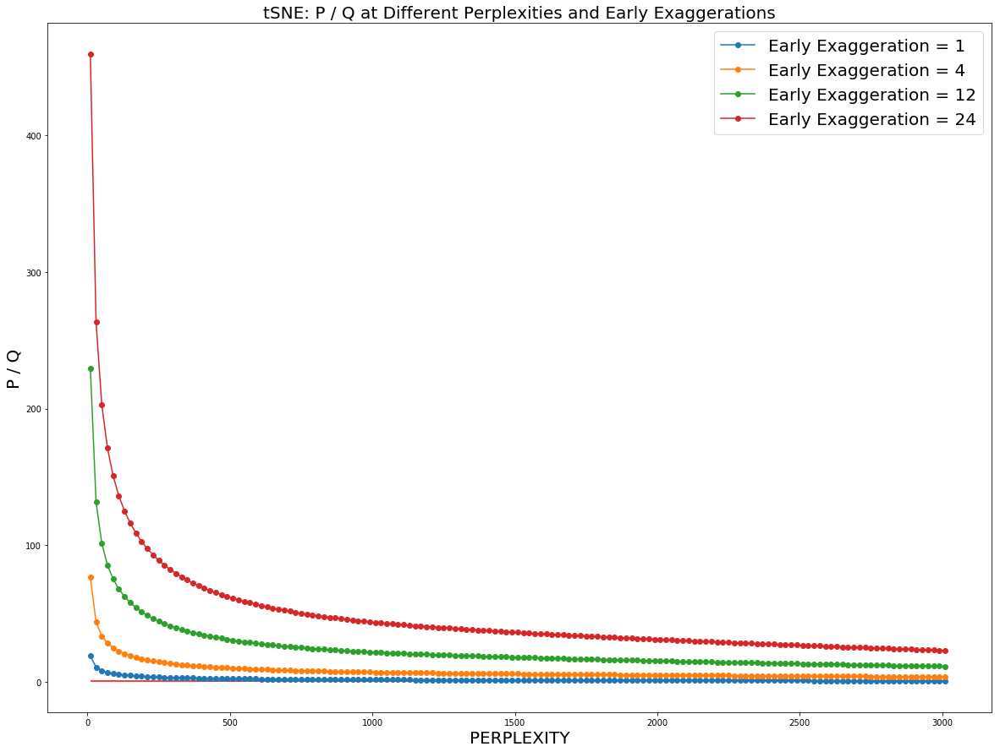

In [12]:
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist
from sklearn.manifold._t_sne import _joint_probabilities
from sklearn.metrics.pairwise import euclidean_distances

X_train = X_swiss_roll

X_reduced = PCA(n_components = 2).fit_transform(X_train)
dist = np.square(euclidean_distances(X_train, X_train))

degrees_of_freedom = 1
PERP_START = 10; PERP_STEP = 20
MACHINE_EPSILON = np.finfo(np.double).eps

P2Q_list = []
for EARLY_EXAGGERATION in [1, 4, 12, 24]:
    print('Working with early_exaggeration = {}'.format(EARLY_EXAGGERATION))
    P2Q = []
    for PERP in range(PERP_START, X_train.shape[0], PERP_STEP):
        P = _joint_probabilities(distances = dist, desired_perplexity = PERP, verbose = 0)
        P = EARLY_EXAGGERATION * P
    
        X_embedded = X_reduced.reshape(X_reduced.shape[0], 2)
        inv_dist = pdist(X_embedded, "sqeuclidean")
        inv_dist /= degrees_of_freedom
        inv_dist += 1.
        inv_dist **= (degrees_of_freedom + 1.0) / -2.0
        Q = np.maximum(inv_dist / (2.0 * np.sum(inv_dist)), MACHINE_EPSILON)
    
        P2Q.append(np.linalg.norm(P) / np.linalg.norm(Q))
        print('Perplexity = {0}, P / Q = {1}'.format(PERP, np.linalg.norm(P) / np.linalg.norm(Q)))
    P2Q_list.append(P2Q)
    print('***********************************************************************\n')

plt.figure(figsize = (20, 15))
for i in range(len([1, 4, 12, 24])):
    plt.plot(range(PERP_START, X_train.shape[0], PERP_STEP), P2Q_list[i], '-o')

plt.hlines(1, PERP_START, X_train.shape[0], colors = 'red')
plt.gca().legend(('Early Exaggeration = 1', 'Early Exaggeration = 4', 
                  'Early Exaggeration = 12', 'Early Exaggeration = 24'), fontsize = 20)
plt.title("tSNE: P / Q at Different Perplexities and Early Exaggerations", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20); plt.ylabel("P / Q", fontsize = 20)
plt.show()

We can see that increasing the early exaggeration can in principle prevent the P become close to Q. However, as we saw above this still did not help to properly initialize the tSNE algorithm. We need to further understand why the KL-gradient still disappears even at large early exaggerations. Let uu implement a similar procedure as above but this time for the KL-gradient itself and not the P / Q ratio. It is possible that the other two factors in the expression of KL-gradient, i.e. not only the P-Q difference, contribute to the negligible contribution from the KL-gradinet compared  to the initialization with PCA.

Working with early_exaggeration = 1
Perplexity = 10, KL_grad = 0.01790444740327198
Perplexity = 260, KL_grad = 0.0174541936137467
Perplexity = 510, KL_grad = 0.01666943138811564
Perplexity = 760, KL_grad = 0.015600747064296884
Perplexity = 1010, KL_grad = 0.014283022596581537
Perplexity = 1260, KL_grad = 0.012741957397629618
Perplexity = 1510, KL_grad = 0.011130845419151053
Perplexity = 1760, KL_grad = 0.009483406482585357
Perplexity = 2010, KL_grad = 0.007787890825052564
Perplexity = 2260, KL_grad = 0.006006183899333451
Perplexity = 2510, KL_grad = 0.004060802624239353
Perplexity = 2760, KL_grad = 0.0017859059069286693
Perplexity = 3010, KL_grad = 0.0026544201932151117
***********************************************************************

Working with early_exaggeration = 4
Perplexity = 10, KL_grad = 0.017892832648578133
Perplexity = 260, KL_grad = 0.016872538976059684
Perplexity = 510, KL_grad = 0.015336202984074593
Perplexity = 760, KL_grad = 0.014405223930178148
Perplexity = 1010

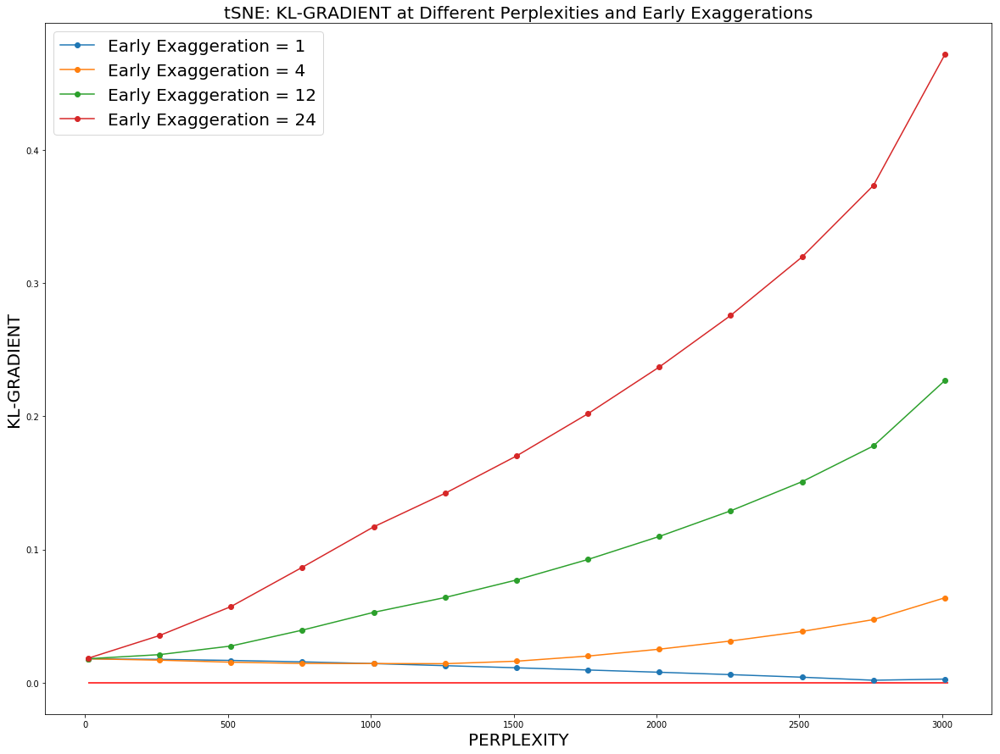

In [17]:
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist
from scipy.spatial.distance import squareform
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.manifold._t_sne import _joint_probabilities, _kl_divergence

X_train = X_swiss_roll; n = X_train.shape[0]
X_reduced = PCA(n_components = 2).fit_transform(X_train)
dist = np.square(euclidean_distances(X_train, X_train))

PERP_START = 10; PERP_STEP = 250; N_LOW_DIMS = 2
KL_grad_list = []
for EARLY_EXAGGERATION in [1, 4, 12, 24]:
    print('Working with early_exaggeration = {}'.format(EARLY_EXAGGERATION))
    KL_grad = []
    for PERP in range(PERP_START, X_train.shape[0], PERP_STEP):
        P = _joint_probabilities(distances = dist, desired_perplexity = PERP, verbose = 0)
        P = EARLY_EXAGGERATION * P
    
        kl, grad = _kl_divergence(params = X_reduced, P = P, n_samples = n, n_components = 2, 
                                  degrees_of_freedom = 1)
        KL_grad_norm = np.linalg.norm(grad)
        KL_grad.append(KL_grad_norm)
        print('Perplexity = {0}, KL_grad = {1}'.format(PERP, KL_grad_norm))
    KL_grad_list.append(KL_grad)
    print('***********************************************************************\n')

plt.figure(figsize = (20, 15))
for i in range(len([1, 4, 12, 24])):
    plt.plot(range(PERP_START, X_train.shape[0], PERP_STEP), KL_grad_list[i], '-o')

plt.hlines(0, PERP_START, X_train.shape[0], colors = 'red')
plt.gca().legend(('Early Exaggeration = 1', 'Early Exaggeration = 4', 
                  'Early Exaggeration = 12', 'Early Exaggeration = 24'), fontsize = 20)
plt.title("tSNE: KL-GRADIENT at Different Perplexities and Early Exaggerations", fontsize = 20)
plt.xlabel("PERPLEXITY", fontsize = 20); plt.ylabel("KL-GRADIENT", fontsize = 20)
plt.show()

Let us now check that tSNE degrades to PCA for the scRNAseq CAFs data set:

In [1]:
import numpy as np
import pandas as pd
from scipy import optimize
import matplotlib.pyplot as plt
from sklearn.manifold import SpectralEmbedding
from sklearn.metrics.pairwise import euclidean_distances

path = '/home/nikolay/WABI/K_Pietras/Manifold_Learning/'
expr = pd.read_csv(path + 'bartoschek_filtered_expr_rpkm.txt', sep='\t')
print(expr.iloc[0:4,0:4])
X_train = expr.values[:,0:(expr.shape[1]-1)]
X_train = np.log(X_train + 1)
n = X_train.shape[0]
print("\nThis data set contains " + str(n) + " samples")
y_train = expr.values[:,expr.shape[1]-1]
print("\nDimensions of the  data set: ")
print(X_train.shape, y_train.shape)

                1110020A21Rik  1110046J04Rik  1190002F15Rik  1500015A07Rik
SS2_15_0048_A3            0.0            0.0            0.0            0.0
SS2_15_0048_A6            0.0            0.0            0.0            0.0
SS2_15_0048_A5            0.0            0.0            0.0            0.0
SS2_15_0048_A4            0.0            0.0            0.0            0.0

This data set contains 716 samples

Dimensions of the  data set: 
(716, 557) (716,)


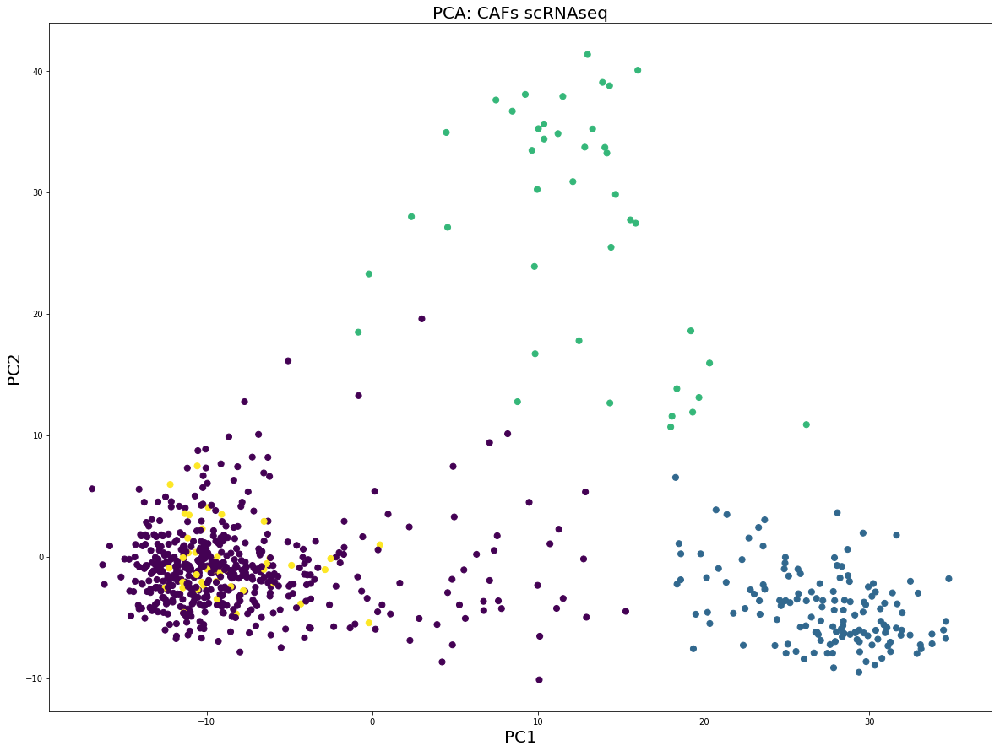

In [5]:
from sklearn.decomposition import PCA
X_reduced = PCA(n_components = 2).fit_transform(X_train)
plt.figure(figsize = (20,15))
plt.scatter(X_reduced[:, 0], X_reduced[:, 1], c = y_train, s = 50)
plt.title('PCA: CAFs scRNAseq', fontsize = 20)
plt.xlabel("PC1", fontsize = 20); plt.ylabel("PC2", fontsize = 20)
plt.show()

[t-SNE] Computing pairwise distances...
[t-SNE] Computed conditional probabilities for sample 716 / 716
[t-SNE] Mean sigma: 17.383014
[t-SNE] Iteration 50: error = 35.2594246, gradient norm = 0.3417314 (50 iterations in 0.643s)
[t-SNE] Iteration 100: error = 33.3934406, gradient norm = 0.2181094 (50 iterations in 0.683s)
[t-SNE] Iteration 150: error = 33.7467567, gradient norm = 0.1884981 (50 iterations in 0.682s)
[t-SNE] Iteration 200: error = 33.8809651, gradient norm = 0.1636423 (50 iterations in 0.676s)
[t-SNE] Iteration 250: error = 34.4723053, gradient norm = 0.1793141 (50 iterations in 0.670s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 34.472305
[t-SNE] Iteration 300: error = 0.1392892, gradient norm = 0.0030119 (50 iterations in 0.671s)
[t-SNE] Iteration 350: error = 0.1148490, gradient norm = 0.0001874 (50 iterations in 0.672s)
[t-SNE] Iteration 400: error = 0.1148120, gradient norm = 0.0000305 (50 iterations in 0.680s)
[t-SNE] Iteration 450: error = 0

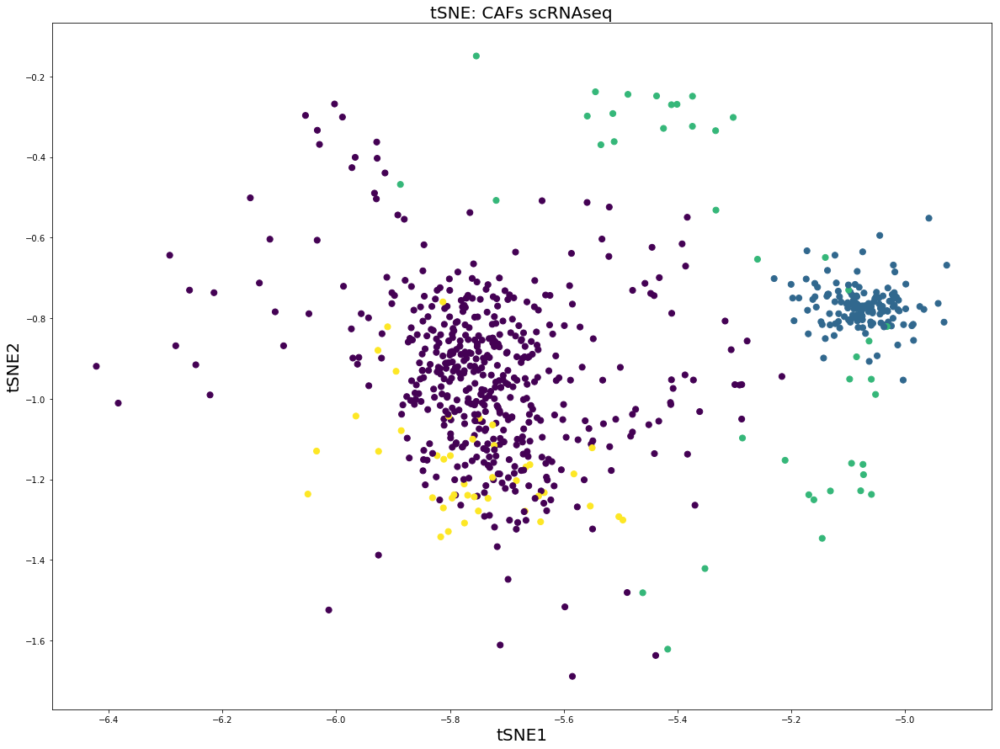

In [29]:
from sklearn.manifold import TSNE
model = TSNE(learning_rate = 200, n_components = 2, random_state = 123, perplexity = 700, 
             n_iter = 1000, verbose = 2, early_exaggeration = 12, method = 'exact', init = X_reduced)
tsne = model.fit_transform(X_train)
plt.figure(figsize = (20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y_train, s = 50)
plt.title('tSNE: CAFs scRNAseq', fontsize = 20)
plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

### Simulate Data with Clusters for tSNE

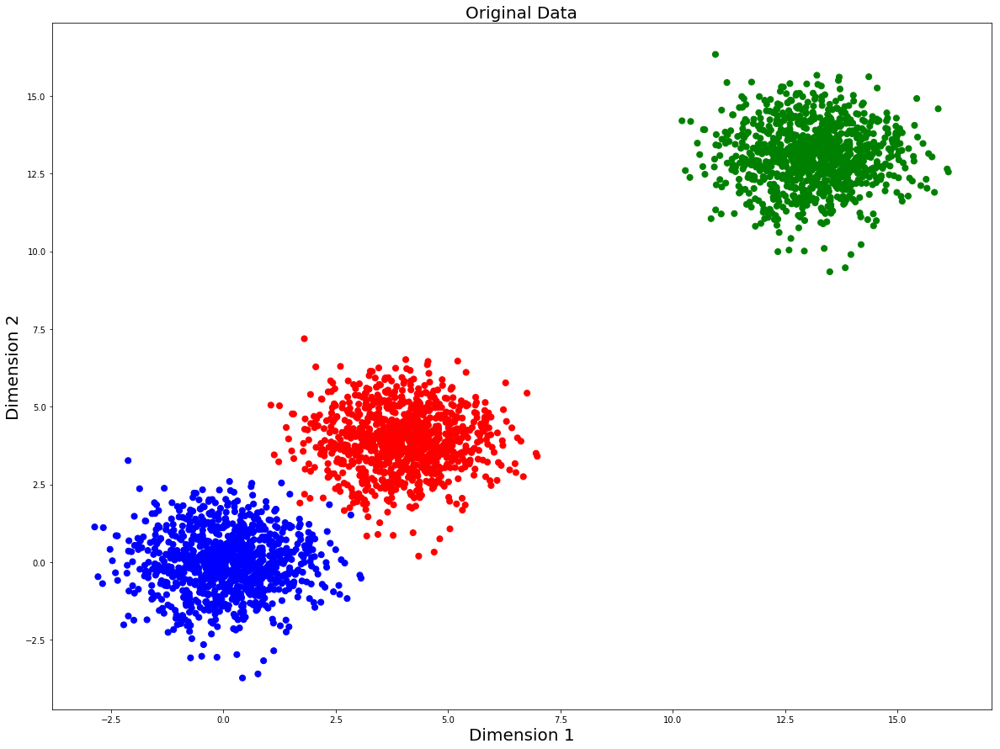

In [2]:
import numpy as np
import matplotlib.pyplot as plt

n = 1000
p = 2

X1 = np.random.randn(n, p)
X2 = X1 + np.max(X1)*1.2
X3 = X1 + np.max(X1)*4
X = np.vstack([X1,X2,X3])
y = np.array([['blue']*n, ['red']*n, ['green']*n])
y = y.flatten()

plt.figure(figsize = (20,15))
plt.scatter(X[:, 0], X[:, 1], c = y, s = 50)
plt.title('Original Data', fontsize = 20)
plt.xlabel("Dimension 1", fontsize = 20); plt.ylabel("Dimension 2", fontsize = 20)
plt.show()

Working with Perplexity = 10
Working with Perplexity = 30
Working with Perplexity = 100
Working with Perplexity = 1000


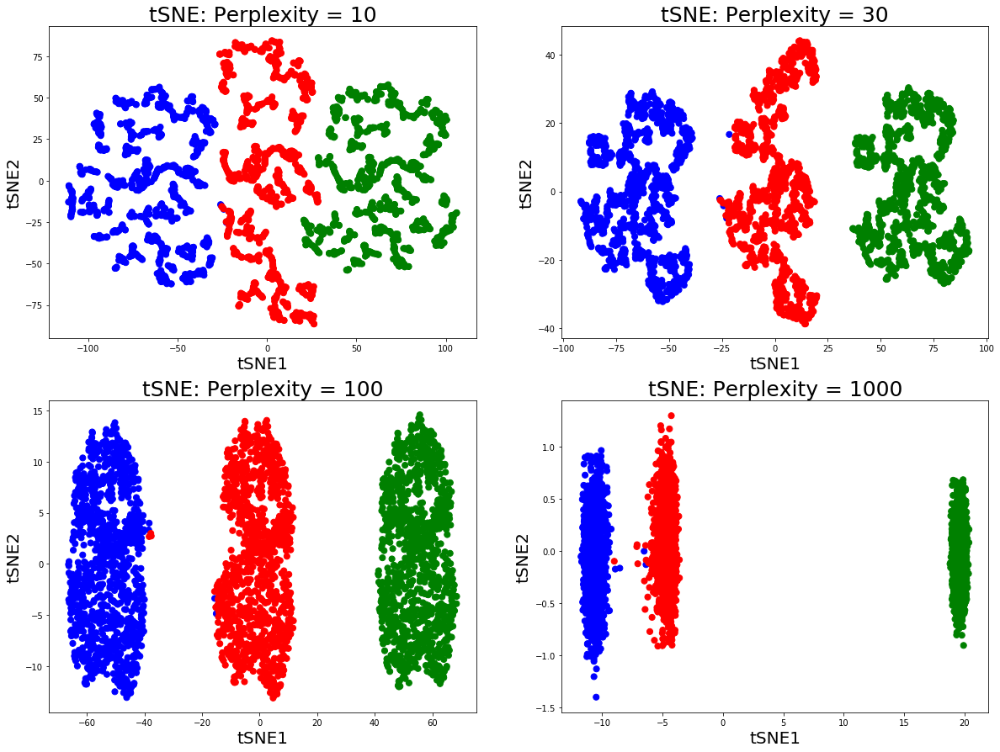

In [8]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

pca = PCA(n_components = 2).fit_transform(X)

plt.figure(figsize = (20,15))
for index, perp in enumerate([10, 30, 100, 1000]):
    print('Working with Perplexity = {}'.format(perp))
    model = TSNE(learning_rate = 200, n_components = 2, perplexity = perp, 
                 n_iter = 1000, verbose = 0, init = pca)
    tsne = model.fit_transform(X)
    
    plt.subplot(221 + index)
    plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
    plt.title('tSNE: Perplexity = {}'.format(perp), fontsize = 25)
    plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)

plt.show()

In [3]:
from sklearn.decomposition import PCA
X_reduced = PCA(n_components = 2).fit_transform(X)

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.003s...
[t-SNE] Computed neighbors for 3000 samples in 0.023s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.117393
[t-SNE] Computed conditional probabilities in 0.072s
[t-SNE] Iteration 50: error = 66.4602966, gradient norm = 0.0153724 (50 iterations in 1.042s)
[t-SNE] Iteration 100: error = 65.0424652, gradient norm = 0.0080951 (50 iterations in 0.948s)
[t-SNE] Iteration 150: error = 64.4218597, gradient norm = 0.0052292 (50 iterations in 0.956s)
[t-SNE] Iteration 200: error = 64.0749893, gradient norm = 0.0049253 (50 iterations in 0.912s)
[t-SNE] Iteration 250: error = 63.8488998, gradient norm = 0.0050150 (50 iterations in 1.049s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 63.848900
[t-SNE] Iteration 300: erro

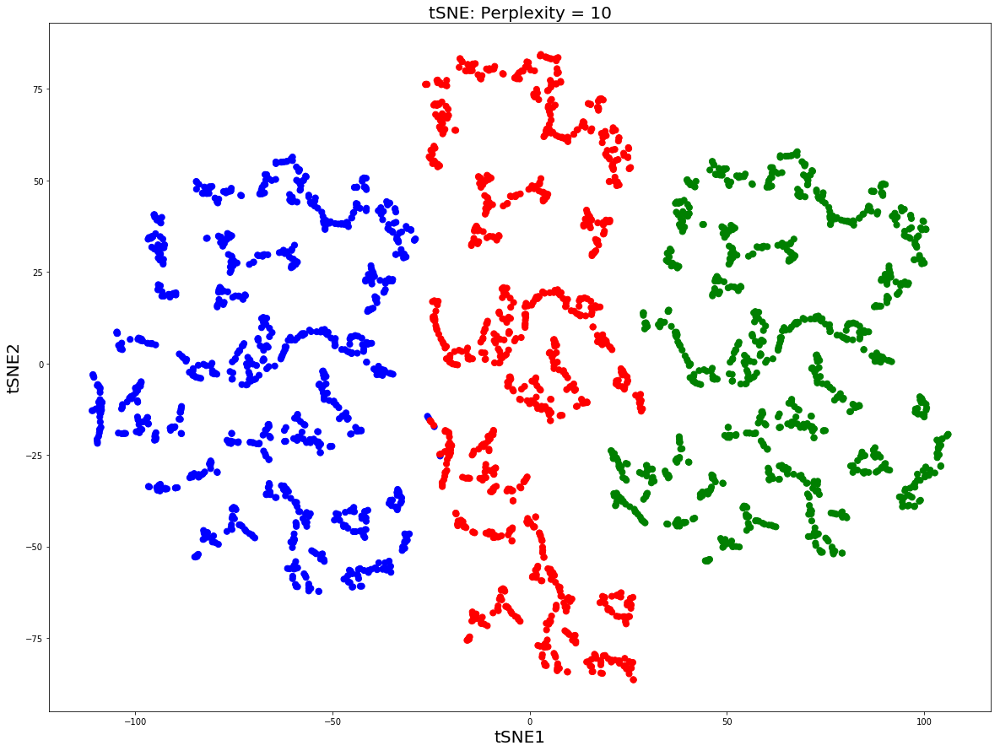

In [4]:
from sklearn.manifold import TSNE
model = TSNE(learning_rate = 200, n_components = 2, perplexity = 10, n_iter = 1000, verbose = 2, init = X_reduced)
tsne = model.fit_transform(X)
plt.figure(figsize = (20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE: Perplexity = 10', fontsize = 20)
plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.001s...
[t-SNE] Computed neighbors for 3000 samples in 0.060s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.209391
[t-SNE] Computed conditional probabilities in 0.167s
[t-SNE] Iteration 50: error = 60.0897217, gradient norm = 0.0025214 (50 iterations in 1.305s)
[t-SNE] Iteration 100: error = 59.9924812, gradient norm = 0.0027907 (50 iterations in 1.314s)
[t-SNE] Iteration 150: error = 59.9354324, gradient norm = 0.0014755 (50 iterations in 1.345s)
[t-SNE] Iteration 200: error = 59.8856163, gradient norm = 0.0018201 (50 iterations in 1.375s)
[t-SNE] Iteration 250: error = 59.8438492, gradient norm = 0.0023785 (50 iterations in 1.287s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 59.843849
[t-SNE] Iteration 300: erro

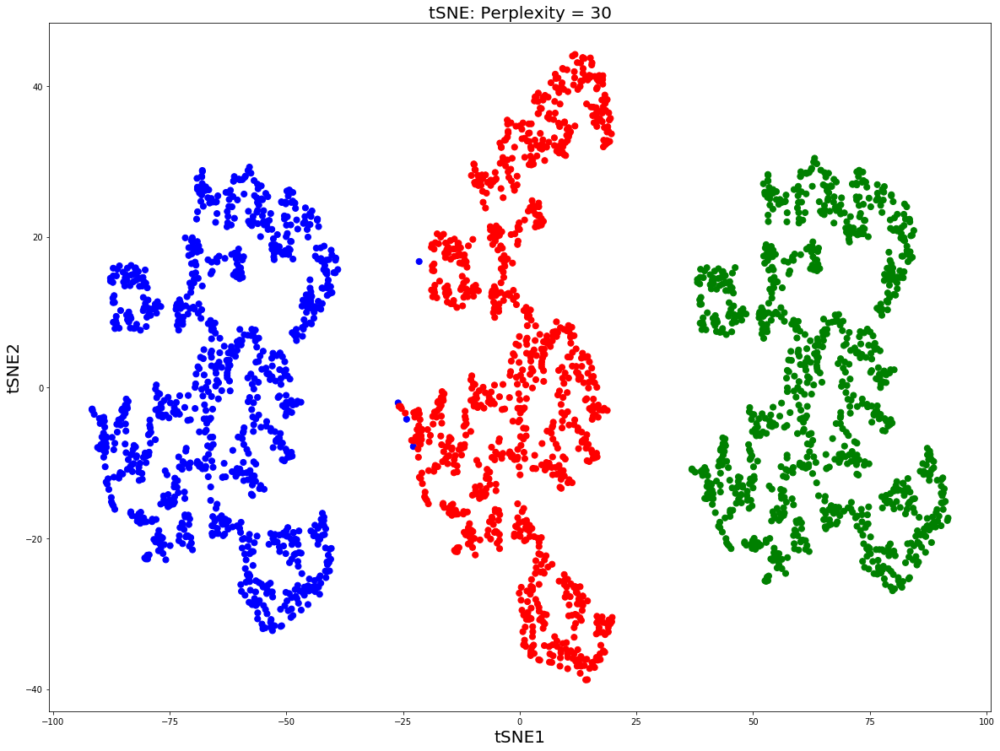

In [5]:
from sklearn.manifold import TSNE
model = TSNE(learning_rate = 200, n_components = 2, perplexity = 30, n_iter = 1000, verbose = 2, init = X_reduced)
tsne = model.fit_transform(X)
plt.figure(figsize = (20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE: Perplexity = 30', fontsize = 20)
plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

[t-SNE] Computing 301 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.001s...
[t-SNE] Computed neighbors for 3000 samples in 0.178s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 0.391522
[t-SNE] Computed conditional probabilities in 0.591s
[t-SNE] Iteration 50: error = 53.7492447, gradient norm = 0.0007004 (50 iterations in 2.588s)
[t-SNE] Iteration 100: error = 53.7483215, gradient norm = 0.0002384 (50 iterations in 2.218s)
[t-SNE] Iteration 150: error = 53.7474632, gradient norm = 0.0002408 (50 iterations in 2.145s)
[t-SNE] Iteration 200: error = 53.7468491, gradient norm = 0.0003052 (50 iterations in 2.254s)
[t-SNE] Iteration 250: error = 53.7462502, gradient norm = 0.0007010 (50 iterations in 2.097s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 53.746250
[t-SNE] Iteration 300: err

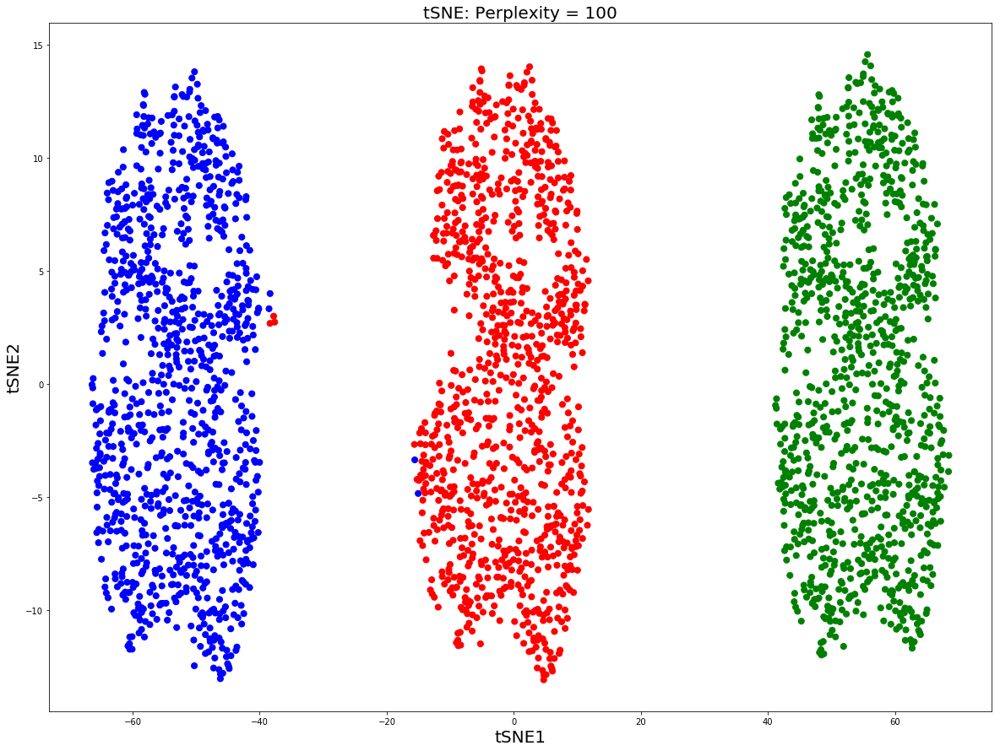

In [6]:
from sklearn.manifold import TSNE
model = TSNE(learning_rate = 200, n_components = 2, perplexity = 100, n_iter = 1000, verbose = 2, init = X_reduced)
tsne = model.fit_transform(X)
plt.figure(figsize = (20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE: Perplexity = 100', fontsize = 20)
plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

[t-SNE] Computing 2999 nearest neighbors...
[t-SNE] Indexed 3000 samples in 0.000s...
[t-SNE] Computed neighbors for 3000 samples in 1.032s...
[t-SNE] Computed conditional probabilities for sample 1000 / 3000
[t-SNE] Computed conditional probabilities for sample 2000 / 3000
[t-SNE] Computed conditional probabilities for sample 3000 / 3000
[t-SNE] Mean sigma: 2.744627
[t-SNE] Computed conditional probabilities in 4.457s
[t-SNE] Iteration 50: error = 32.8451157, gradient norm = 0.0224931 (50 iterations in 7.206s)
[t-SNE] Iteration 100: error = 33.6330986, gradient norm = 0.0001021 (50 iterations in 5.606s)
[t-SNE] Iteration 150: error = 33.6330681, gradient norm = 0.0000829 (50 iterations in 5.496s)
[t-SNE] Iteration 200: error = 33.6329575, gradient norm = 0.0000742 (50 iterations in 5.469s)
[t-SNE] Iteration 250: error = 33.6328583, gradient norm = 0.0000797 (50 iterations in 5.370s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 33.632858
[t-SNE] Iteration 300: er

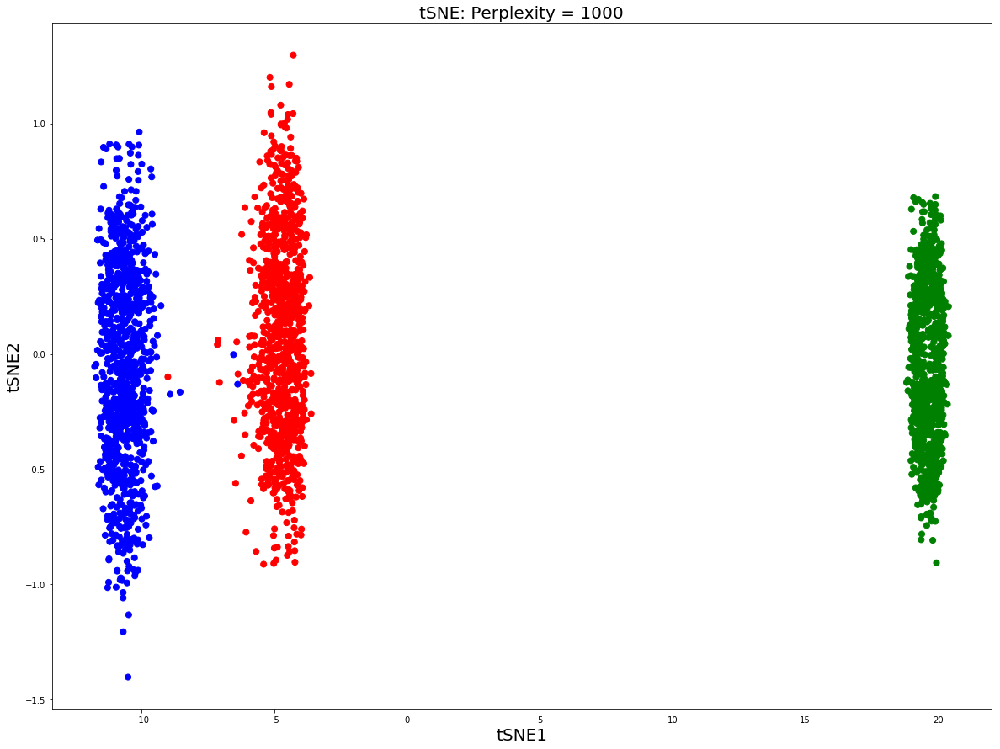

In [7]:
from sklearn.manifold import TSNE
model = TSNE(learning_rate = 200, n_components = 2, perplexity = 1000, n_iter = 1000, verbose = 2, 
             init = X_reduced)
tsne = model.fit_transform(X)
plt.figure(figsize = (20,15))
plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
plt.title('tSNE: Perplexity = 1000', fontsize = 20)
plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)
plt.show()

Now let us make tSNE plots at different perplexities for the World Map data set:

(3023, 2)
(3023,)


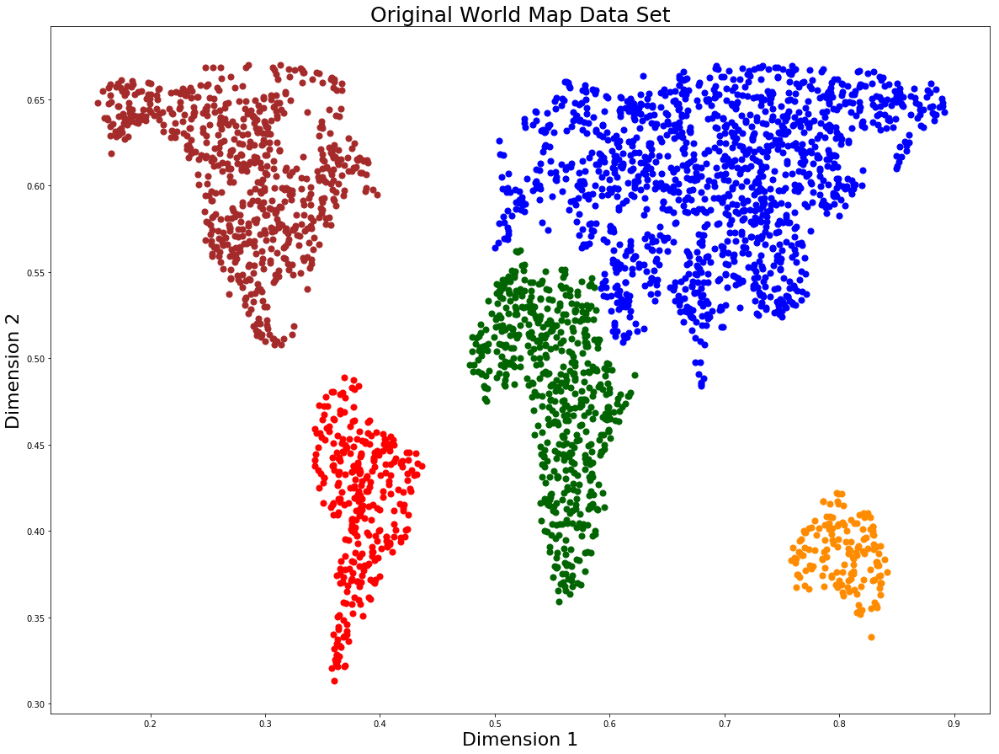

In [9]:
import cartopy
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import cartopy.feature as cfeature
from skimage.io import imread
import cartopy.io.shapereader as shpreader

shapename = 'admin_0_countries'
countries_shp = shpreader.natural_earth(resolution='110m',
                                        category='cultural', name=shapename)

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    #print(country.attributes['NAME_LONG'])
    if country.attributes['NAME_LONG'] in ['United States','Canada', 'Mexico']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('NorthAmerica.png')
plt.close()
        
plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Brazil','Argentina', 'Peru', 'Uruguay', 'Venezuela', 
                                           'Columbia', 'Bolivia', 'Colombia', 'Ecuador', 'Paraguay']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('SouthAmerica.png')
plt.close()

plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Australia']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Australia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Russian Federation', 'China', 'India', 'Kazakhstan', 'Mongolia', 
                                          'France', 'Germany', 'Spain', 'Ukraine', 'Turkey', 'Sweden', 
                                           'Finland', 'Denmark', 'Greece', 'Poland', 'Belarus', 'Norway', 
                                           'Italy', 'Iran', 'Pakistan', 'Afganistan', 'Iraq', 'Bulgaria', 
                                           'Romania', 'Turkmenistan', 'Uzbekistan' 'Austria', 'Ireland', 
                                           'United Kingdom', 'Saudi Arabia', 'Hungary']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Eurasia.png')
plt.close()


plt.figure(figsize = (20, 15))
ax = plt.axes(projection=ccrs.Miller())
ax.outline_patch.set_visible(False)
ax.set_extent([-180, 180, -50, 70])
for country in shpreader.Reader(countries_shp).records(): 
    if country.attributes['NAME_LONG'] in ['Libya', 'Algeria', 'Niger', 'Marocco', 'Egypt', 'Sudan', 'Chad',
                                           'Democratic Republic of the Congo', 'Somalia', 'Kenya', 'Ethiopia', 
                                           'The Gambia', 'Nigeria', 'Cameroon', 'Ghana', 'Guinea', 'Guinea-Bissau',
                                           'Liberia', 'Sierra Leone', 'Burkina Faso', 'Central African Republic', 
                                           'Republic of the Congo', 'Gabon', 'Equatorial Guinea', 'Zambia', 
                                           'Malawi', 'Mozambique', 'Angola', 'Burundi', 'South Africa', 
                                           'South Sudan', 'Somaliland', 'Uganda', 'Rwanda', 'Zimbabwe', 'Tanzania',
                                           'Botswana', 'Namibia', 'Senegal', 'Mali', 'Mauritania', 'Benin', 
                                           'Nigeria', 'Cameroon']:
        ax.add_geometries(country.geometry, ccrs.Miller(),
                          label=country.attributes['NAME_LONG'], color = 'black')
        plt.savefig('Africa.png')
plt.close()


rng = np.random.RandomState(123)
plt.figure(figsize = (20,15))

N_NorthAmerica = 10000
data_NorthAmerica = imread('NorthAmerica.png')[::-1, :, 0].T
X_NorthAmerica = rng.rand(4 * N_NorthAmerica, 2)
i, j = (X_NorthAmerica * data_NorthAmerica.shape).astype(int).T
X_NorthAmerica = X_NorthAmerica[data_NorthAmerica[i, j] < 1]
X_NorthAmerica = X_NorthAmerica[X_NorthAmerica[:, 1]<0.67]
y_NorthAmerica = np.array(['brown']*X_NorthAmerica.shape[0])
plt.scatter(X_NorthAmerica[:, 0], X_NorthAmerica[:, 1], c = 'brown', s = 50)

N_SouthAmerica = 10000
data_SouthAmerica = imread('SouthAmerica.png')[::-1, :, 0].T
X_SouthAmerica = rng.rand(4 * N_SouthAmerica, 2)
i, j = (X_SouthAmerica * data_SouthAmerica.shape).astype(int).T
X_SouthAmerica = X_SouthAmerica[data_SouthAmerica[i, j] < 1]
y_SouthAmerica = np.array(['red']*X_SouthAmerica.shape[0])
plt.scatter(X_SouthAmerica[:, 0], X_SouthAmerica[:, 1], c = 'red', s = 50)

N_Australia = 10000
data_Australia = imread('Australia.png')[::-1, :, 0].T
X_Australia = rng.rand(4 * N_Australia, 2)
i, j = (X_Australia * data_Australia.shape).astype(int).T
X_Australia = X_Australia[data_Australia[i, j] < 1]
y_Australia = np.array(['darkorange']*X_Australia.shape[0])
plt.scatter(X_Australia[:, 0], X_Australia[:, 1], c = 'darkorange', s = 50)

N_Eurasia = 10000
data_Eurasia = imread('Eurasia.png')[::-1, :, 0].T
X_Eurasia = rng.rand(4 * N_Eurasia, 2)
i, j = (X_Eurasia * data_Eurasia.shape).astype(int).T
X_Eurasia = X_Eurasia[data_Eurasia[i, j] < 1]
X_Eurasia = X_Eurasia[X_Eurasia[:, 0]>0.5]
X_Eurasia = X_Eurasia[X_Eurasia[:, 1]<0.67]
y_Eurasia = np.array(['blue']*X_Eurasia.shape[0])
plt.scatter(X_Eurasia[:, 0], X_Eurasia[:, 1], c = 'blue', s = 50)

N_Africa = 10000
data_Africa = imread('Africa.png')[::-1, :, 0].T
X_Africa = rng.rand(4 * N_Africa, 2)
i, j = (X_Africa * data_Africa.shape).astype(int).T
X_Africa = X_Africa[data_Africa[i, j] < 1]
y_Africa = np.array(['darkgreen']*X_Africa.shape[0])
plt.scatter(X_Africa[:, 0], X_Africa[:, 1], c = 'darkgreen', s = 50)

plt.title('Original World Map Data Set', fontsize = 25)
plt.xlabel('Dimension 1', fontsize = 22); plt.ylabel('Dimension 2', fontsize = 22)

X = np.vstack((X_NorthAmerica, X_SouthAmerica, X_Australia, X_Eurasia, X_Africa))
y = np.concatenate((y_NorthAmerica, y_SouthAmerica, y_Australia, y_Eurasia, y_Africa))
print(X.shape)
print(y.shape)

plt.show()

Working with Perplexity = 500
Working with Perplexity = 1000
Working with Perplexity = 2000


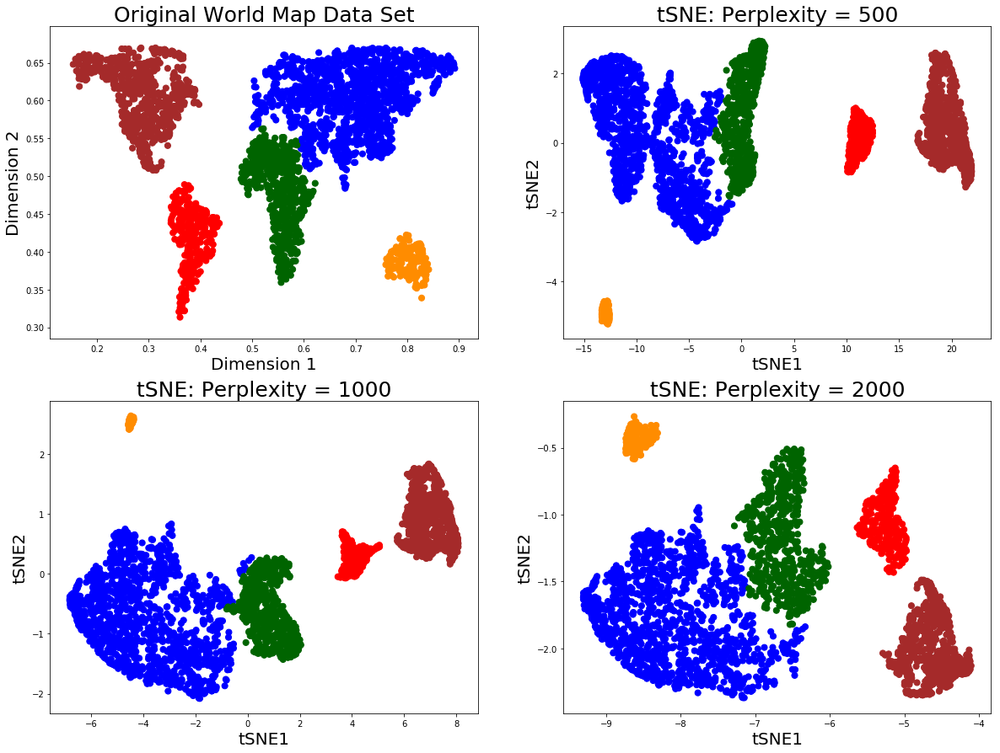

In [16]:
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

pca = PCA(n_components = 2).fit_transform(X)

plt.figure(figsize = (20,15))
plt.subplot(221 + 0)
plt.scatter(X[:, 0], X[:, 1], c = y, s = 50)
plt.title('Original World Map Data Set', fontsize = 25)
plt.xlabel("Dimension 1", fontsize = 20); plt.ylabel("Dimension 2", fontsize = 20)

for index, perp in enumerate([500, 1000, 2000]):
    print('Working with Perplexity = {}'.format(perp))
    model = TSNE(learning_rate = 200, n_components = 2, perplexity = perp, 
                 n_iter = 1000, verbose = 0, init = pca)
    tsne = model.fit_transform(X)
    
    plt.subplot(221 + index + 1)
    plt.scatter(tsne[:, 0], tsne[:, 1], c = y, s = 50)
    plt.title('tSNE: Perplexity = {}'.format(perp), fontsize = 25)
    plt.xlabel("tSNE1", fontsize = 20); plt.ylabel("tSNE2", fontsize = 20)

plt.show()